# Шаг 1. Получение и парсинг данных

In [1]:
import requests
from bs4 import BeautifulSoup
from bs4.element import Comment
import pandas as pd
import datetime
import warnings
warnings.filterwarnings("ignore")

In [3]:
cookies = {
    '__ddg1_': 'peYZRM5tlNWPgugd940V',
    '__ddg9_': '92.243.182.237',
    '_ym_uid': '1715004481699210864',
    '_ym_d': '1730388353',
    '_ym_isad': '1',
    '_ym_visorc': 'w',
    'accept': '1',
    'ASPNET_SessionID': 'haizcalavgerqkaig0w12awe',
    '__ddg10_': '1730388981',
    '__ddg8_': 'jrQSy3NYA2gFDIsY',
}

In [5]:
headers = {
    'accept': 'text/html, */*; q=0.01',
    'accept-language': 'ru-RU,ru;q=0.9,en-US;q=0.8,en;q=0.7',
    # 'cookie': '__ddg1_=peYZRM5tlNWPgugd940V; __ddg9_=92.243.182.237; _ym_uid=1715004481699210864; _ym_d=1730388353; _ym_isad=1; _ym_visorc=w; accept=1; ASPNET_SessionID=haizcalavgerqkaig0w12awe; __ddg10_=1730388981; __ddg8_=jrQSy3NYA2gFDIsY',
    'priority': 'u=1, i',
    'referer': 'https://www.cbr.ru/dkp/mp_dec/',
    'sec-ch-ua': '"Chromium";v="130", "Google Chrome";v="130", "Not?A_Brand";v="99"',
    'sec-ch-ua-mobile': '?0',
    'sec-ch-ua-platform': '"macOS"',
    'sec-fetch-dest': 'empty',
    'sec-fetch-mode': 'cors',
    'sec-fetch-site': 'same-origin',
    'user-agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/130.0.0.0 Safari/537.36',
    'x-requested-with': 'XMLHttpRequest',
}


In [7]:
press_list = []
load_more_url = 'https://www.cbr.ru/Crosscut/NewsList/LoadMore/84035'
press_release_links = []

offset = 0
max_offset = 200

while offset < max_offset:
    params = {
        'intOffset': '0',
        'extOffset': str(offset),
    }
    response = requests.get(load_more_url, params=params)
    soup = BeautifulSoup(response.text, 'html.parser')
    hrefs = soup.find_all("div", {"class": "previews_item-title"})

    for href in hrefs:
        a_tag = href.find('a', href=True)
        if a_tag and a_tag['href'] not in press_release_links:
            press_release_links.append(a_tag['href'])

    offset += 10

for url in press_release_links:
    print('opening...' + url)
    response = requests.get('https://www.cbr.ru/' + url)
    bs = BeautifulSoup(response.text, 'html.parser')
    date = bs.find("div",{'class': 'col-md-6 col-12 news-info-line_date'}).get_text()
    text = bs.find_all("div", {"class": "landing-text"})
    press_list.append([date, text[0].get_text()])

opening.../press/pr/?file=14022025_133000key.htm
opening.../press/pr/?file=20122024_133000key.htm
opening.../press/pr/?file=25102024_133000Key.htm
opening.../press/pr/?file=13092024_133000Key.htm
opening.../press/pr/?file=26072024_133000Key.htm
opening.../press/pr/?file=07062024_133000Key.htm
opening.../press/pr/?file=26042024_133000key.htm
opening.../press/pr/?file=22032024_133000key.htm
opening.../press/pr/?file=16022024_133000key.htm
opening.../press/pr/?file=15122023_133000key.htm
opening.../press/pr/?file=27102023_133000key.htm
opening.../press/pr/?file=15092023_133000Key.htm
opening.../press/pr/?file=15082023_103000Key.htm
opening.../press/pr/?file=21072023_133000Key.htm
opening.../press/pr/?file=09062023_133024Key.htm
opening.../press/pr/?file=28042023_133000Key.htm
opening.../press/pr/?file=17032023_133000Key.htm
opening.../press/pr/?file=10022023_133000Key.htm
opening.../press/pr/?file=16122022_133000Key.htm
opening.../press/pr/?file=28102022_133000Key.htm
opening.../press/pr/

In [29]:
# формирование датафрейма
row_data = pd.DataFrame(press_list, columns = ['date', 'text'])
row_data = row_data.drop_duplicates()
row_data

,date,text
0,14 февраля 2025 года,\n \nСовет директоров Банка России 14 февраля ...
1,20 декабря 2024 года,\n \nСовет директоров Банка России 20 декабря ...
2,25 октября 2024 года,\n \nСовет директоров Банка России 25 октября ...
3,13 сентября 2024 года,\n \nСовет директоров Банка России 13 сентября...
4,26 июля 2024 года,\n \nСовет директоров Банка России 26 июля 202...
...,...,...
98,13 декабря 2013 года,\nСовет директоров Банка России 13 декабря 201...
99,8 ноября 2013 года,\nСовет директоров Банка России 8 ноября 2013 ...
100,14 октября 2013 года,"\nПресс-служба Банка России сообщает, что Сове..."
101,13 сентября 2013 года,\n О системе процентных инструментов денежно...


In [31]:
# чистим от лишних символов
def edit(df, column_name):
    df[column_name] = df[column_name].replace('\xa0', ' ', regex=True)
    df[column_name] = df[column_name].replace(r'\n', '', regex=True)
    df[column_name] = df[column_name].replace('_x000D_', '', regex=True)
    df[column_name] = df[column_name].replace('\r', ' ', regex=True)
    df[column_name] = df[column_name].apply(lambda x: x.strip())
    df[column_name] = df[column_name].replace('  ', ' ', regex=True)

    return df

edited_data = edit(row_data, 'text')

In [33]:
# убираем неинформативные пресс-релизы
import re

def remove_trash(df, column_name):

    mask = ~(df[column_name].str.contains("Банк России, следуя наилучшим практикам распространения данных", na=False) |
             df[column_name].str.contains("целях оперативного информирования пользователей", na=False) |
             df[column_name].str.contains("Банк России начинает публиковать на", na=False))

    filtered_df = df[mask]

    return filtered_df

filtered_df = remove_trash(edited_data, 'text')

In [35]:
# парсим дату
def parse_date(df, column_name):

    month_dict = {
        "января": 1, "февраля": 2, "марта": 3, "апреля": 4, "мая": 5, "июня": 6,
        "июля": 7, "августа": 8, "сентября": 9, "октября": 10, "ноября": 11,
        "декабря": 12
    }

    def extract_date_parts(date_str):
        try:
            match = re.match(r"(\d{1,2})\s+([а-я]+)\s+(\d{4})\s+года", date_str)
            if match:
                day = int(match.group(1))
                month = month_dict[match.group(2)]
                year = int(match.group(3))
                return year, month, day
            else:
                return None, None, None
        except (KeyError, AttributeError, ValueError):
            return None, None, None


    df[["year", "month", "day"]] = df[column_name].apply(
        lambda x: pd.Series(extract_date_parts(x))
    )

    return df.drop(columns=column_name)

df = parse_date(filtered_df, 'date')

In [37]:
# формируем колонку target
def classify_key_rate_change_df(df, column_name):

    target_values = []

    for text in df[column_name]:
        match = re.search(r"(повысить|понизить|снизить|сохранить|оставить)\s+(ключевую|процентную)\s+ставку", text.lower())
        if match:
            action = match.group(1)
            if action == "повысить":
                target_values.append(1)
            elif action == "понизить" or action == "снизить":
                target_values.append(-1)
            elif action == "сохранить" or action == "оставить":
                target_values.append(0)
        else:
            target_values.append("Не найдено")

    df['target'] = target_values
    return df


df = classify_key_rate_change_df(df, 'text')

In [39]:
df.reset_index(inplace=True)

In [41]:
df[df['target'] == 'Не найдено']

,index,text,year,month,day,target
85,88,Совет директоров Банка России принял решение п...,2014,12,16,Не найдено
98,101,О системе процентных инструментов денежно-кред...,2013,9,13,Не найдено


In [45]:
df.loc[85]['text']

'Совет директоров Банка России принял решение повысить с 16 декабря 2014 года ключевую ставку до 17,00% годовых. Данное решение обусловлено необходимостью ограничить существенно возросшие в последнее время девальвационные и инфляционные риски. В целях усиления действенности процентной политики кредиты, обеспеченные нерыночными активами или поручительствами, на срок от 2 до 549 дней с 16 декабря 2014 года будут предоставляться по плавающей процентной ставке, установленной на уровне ключевой ставки Банка России, увеличенной на 1,75 п.п. (ранее данные кредиты на срок от 2 до 90 дней предоставлялись по фиксированной ставке).Кроме того, для расширения возможностей кредитных организаций по управлению собственной валютной ликвидностью было принято решение об увеличении максимального объема предоставления средств на аукционах РЕПО в иностранной валюте на срок 28 дней с 1,5 до 5,0 млрд. долларов США, а также о проведении аналогичных операций на срок 12 месяцев на еженедельной основе. Процентные

In [47]:
df.loc[98]['text']

'О системе процентных инструментов денежно-кредитной политики Банка России  Департамент внешних и общественных связей Банка России сообщает, что 13 сентября 2013 года Совет директоров Банка России в рамках перехода к режиму таргетирования инфляции принял решение о реализации комплекса мер по совершенствованию системы инструментов денежно-кредитной политики. Данные меры включают: 1) введение ключевой ставки Банка России путем унификации процентных ставок по операциям предоставления и абсорбирования ликвидности на аукционной основе на срок 1 неделя; 2) формирование коридора процентных ставок Банка России и оптимизацию системы инструментов по регулированию ликвидности банковского сектора; 3) изменение роли ставки рефинансирования в системе инструментов Банка России. Указанные мероприятия позволят повысить прозрачность денежно-кредитной политики и улучшить ее понимание субъектами экономики, что будет способствовать усилению действенности процентного и информационного каналов трансмиссионно

In [49]:
df.loc[85, ['target']] = 1
df = df.drop(98).reset_index(drop=True)
df

,index,text,year,month,day,target
0,0,Совет директоров Банка России 14 февраля 2025 ...,2025,2,14,0
1,1,Совет директоров Банка России 20 декабря 2024 ...,2024,12,20,0
2,2,Совет директоров Банка России 25 октября 2024 ...,2024,10,25,1
3,3,Совет директоров Банка России 13 сентября 2024...,2024,9,13,1
4,4,Совет директоров Банка России 26 июля 2024 год...,2024,7,26,1
...,...,...,...,...,...,...
94,97,Совет директоров Банка России 14 февраля 2014 ...,2014,2,14,0
95,98,Совет директоров Банка России 13 декабря 2013 ...,2013,12,13,0
96,99,Совет директоров Банка России 8 ноября 2013 го...,2013,11,8,0
97,100,"Пресс-служба Банка России сообщает, что Совет ...",2013,10,14,0


In [51]:
import numpy as np
df['target'] = df['target'].shift(1)
df.loc[0, ['target']] = np.nan
df = df.drop(columns='index')
df.head()

,text,year,month,day,target
0,Совет директоров Банка России 14 февраля 2025 ...,2025,2,14,NaN
1,Совет директоров Банка России 20 декабря 2024 ...,2024,12,20,0
2,Совет директоров Банка России 25 октября 2024 ...,2024,10,25,0
3,Совет директоров Банка России 13 сентября 2024...,2024,9,13,1
4,Совет директоров Банка России 26 июля 2024 год...,2024,7,26,1


In [53]:
wonder = df.loc[0]
wonder



text      Совет директоров Банка России 14 февраля 2025 ...
year                                                   2025
month                                                     2
day                                                      14
target                                                  NaN
Name: 0, dtype: object

In [55]:
df = df.drop(0).reset_index(drop=True)
df.head()

,text,year,month,day,target
0,Совет директоров Банка России 20 декабря 2024 ...,2024,12,20,0
1,Совет директоров Банка России 25 октября 2024 ...,2024,10,25,0
2,Совет директоров Банка России 13 сентября 2024...,2024,9,13,1
3,Совет директоров Банка России 26 июля 2024 год...,2024,7,26,1
4,Совет директоров Банка России 7 июня 2024 года...,2024,6,7,1


In [57]:
df.target.value_counts()

target
0     43
-1    30
1     25
Name: count, dtype: int64

In [59]:
df.shape

(98, 5)

In [61]:
df.to_excel('dataset.xlsx')

In [63]:
wonder.to_excel('wonder.xlsx')


## Итог шага 1: сформирован датафрейм из 98 строк. Датафрейм имеет следующие колонки:
- year
- month
- day
- text
- target (1 - ставка повысилась, 0 - ставка не изменилась, -1 - ставка понизилась)

# Шаг 2. Разведочный анализ данных (NLP)

## 1. Провести анализ текстов:
1. Изучаем данные, ищем и чистим мусор, заводим столбец с датой пресс-релиза
2. Расчет средней, минимальной и максимальной длины текстов (визуализация распределения),
3. Частотный анализ слов и n-грамм, извлечение биграмм и триграмм, статистики посимволам и словам, распределение частей речи.

## 1.1. Изучаем данные, ищем и чистим мусор, заводим столбец с датой пресс-релиза

In [70]:
from string import punctuation
import nltk
punctuation
nltk.download("stopwords", quiet=True)
from nltk.corpus import stopwords
noise = stopwords.words("russian") + list(punctuation)

In [72]:
df['text'][1][:200]

'Совет директоров Банка России 25 октября 2024 года принял решение повысить ключевую ставку на 200 б.п., до 21,00% годовых. Инфляция складывается существенно выше июльского прогноза Банка России. Продо'

### По результатам анализа текстов пресс релиза чистим мусор.

Отрезаем снизу, начиная с паттерна:
Паттерн 1 —
6 ноября 2024 года Банк России опубликует Резюме обсуждения ключевой ставки …

1 апреля 2024 года Банк России опубликует Резюме обсуждения …

27 февраля 2024 года Банк России опубликует Резюме обсуждения ключевой ставки …


Паттерн 2 (если нет паттерна 1 в конце пресс релиза) —

Следующее заседание Совета директоров Банка России …

In [75]:
df['text'][1][3800:]

'ации вблизи 4% потребуется значительно более высокая среднесрочная траектория ключевой ставки, чем прогнозировалось в июле.На среднесрочном горизонте баланс рисков для инфляции по-прежнему существенно смещен в сторону проинфляционных. Основные риски связаны с сохранением высоких инфляционных ожиданий и отклонения российской экономики вверх от траектории сбалансированного роста, а также с ухудшением условий внешней торговли.Банк России исходит из объявленных параметров бюджетной политики. Изменение этих параметров может потребовать корректировки проводимой денежно-кредитной политики.6 ноября 2024 года Банк России опубликует Резюме обсуждения ключевой ставки и Комментарий к среднесрочному прогнозу.Следующее заседание Совета директоров Банка России, на котором будет рассматриваться вопрос об уровне ключевой ставки, запланировано на 20 декабря 2024 года. Время публикации пресс-релиза о решении Совета директоров Банка России — 13:30 по московскому времени. Заявление Председателя Банка Росс

In [77]:
def cut_bottom(row):
    origin = row['text']
    row = row['text'].lower()
    pattern_1 = r'(?<=\.)[^\.]*\d{1,2}[^\.]+банк\s*россии\s*опубликует\s*резюме'
    pattern_2 = r'(?<=\.)[^\.]*следующее\s*(плановое)?\s*заседание\s*совета\s*директоров\s*банка\s*россии'
    pattern_3 = r'(?<=\.)[^\.]*заявление\s*председателя\s*банка\s*россии\s*по\s*итогам\s*заседания\s*совета\s*директоров\s*банка\s*россии\s*состоится'
    pattern_4 = r'(?<=\.)[^\.]*процентные\s*ставки\s*по\s*основным\s*операциям\s*банка\s*россии'

    substr = re.search(pattern_1, row)
    if substr:
        return origin[0:substr.span()[0]].strip()
    else:
        substr = re.search(pattern_2, row)
        if substr:
            return origin[0:substr.span()[0]].strip()
        else:
            substr = re.search(pattern_3, row)
    if substr:
        return origin[0:substr.span()[0]].strip()
    else:
        substr = re.search(pattern_4, row)
    if substr:
        return origin[0:substr.span()[0]].strip()
    else:
        return origin.strip()

In [79]:
df['text']  = df.apply(lambda row: cut_bottom(row).strip(), axis = 1)

In [81]:
df['text'][90][3000:]

'едитования, в частности увеличивая процентные ставки по кредитам. В то же время низкая экономическая активность ограничивает спрос на кредиты и рост процентных ставок по ним. По прогнозам Банка России, тенденция к снижению темпов роста экономики в 2014 году сохранится. Стимулирующее воздействие произошедшего ослабления национальной валюты на экономическую активность будет ограниченным. В условиях неопределенности и ухудшения настроений производителей высока вероятность сокращения инвестиций в основной капитал. Снижение темпов роста реальной заработной платы и кредитования физических лиц будет оказывать сдерживающее влияние на потребительскую активность. Инфляция останется вблизи текущего уровня до середины 2014 года. Во втором полугодии рост потребительских цен замедлится, чему будет способствовать меньший масштаб индексации регулируемых цен и тарифов, снижение инфляционных ожиданий и сохранение совокупного выпуска товаров и услуг ниже потенциального уровня. Учитывая, что влияние дене

### Отрезаем сверху (при наличии):
Новости О ключевой ставке Банка России 14 октября 2013  года Пресс-релиз Поделиться ВКонтакте WhatsApp Telegram

In [84]:
def cut_beg(row):
    origin = row['text']
    row = row['text'].lower()
    pattern = r'telegram'
    substr = re.search(pattern, row)
    if substr:
        return origin[substr.span()[1]+1:].strip()
    else:
        return origin.strip()

In [86]:
df['text']  = df.apply(lambda row: cut_beg(row).strip(), axis = 1)

In [88]:
df.shape

(98, 5)

In [90]:
df.to_excel('dataset.xlsx')

## 1.2. Расчет средней, минимальной и максимальной длины текстов (визуализация распределения)

In [93]:
# добавляем столбец с длинной релизов
df['length_text']  = df.apply(lambda row: len(row['text']), axis = 1)

In [95]:
print(f'Средняя длина пресс-релиза: {int(df['length_text'].mean())}.')
print(f'Минимальная длина пресс-релиза: {int(df['length_text'].min())}.')
print(f'Максимальная длина пресс-релиза: {int(df['length_text'].max())}.')

Средняя длина пресс-релиза: 5689.
Минимальная длина пресс-релиза: 320.
Максимальная длина пресс-релиза: 9756.


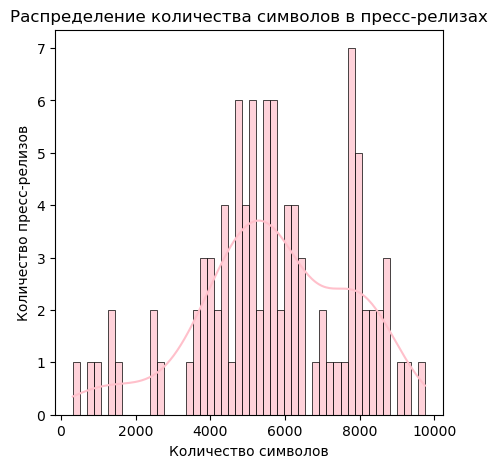

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric_cols = ['length_text']

def draw_hist_plot(df, col):
    plt.figure(figsize = (5, 5))
    sns.histplot(data=df, x=col, bins=50, color='pink', kde=True, alpha=0.7)
    plt.title(f'Распределение количества символов в пресс-релизах')
    plt.xlabel(f'Количество символов')
    plt.ylabel(f'Количество пресс-релизов')
    plt.show()


for i in numeric_cols:
    draw_hist_plot(df, i)

## 1.3. Частотный анализ слов и n-грамм, извлечение биграмм и триграмм, статистики по символам и словам, распределение частей речи.

### Частотный анализ слов

In [100]:
import nltk
from nltk.tokenize import word_tokenize

In [102]:
nltk.download("punkt", quiet=True)

True

In [104]:
# токенизируем тексты (оставим только слова без пунктуации)
texts = df['text']
texts_tokenized = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in texts]

texts_tokenized[0][:300]

'Совет директоров Банка России декабря года принял решение сохранить ключевую ставку на уровне годовых Произошло более существенное ужесточение условий чем предполагало октябрьское решение по ключевой ставке Этому способствовали автономные от политики факторы По оценке Банка России с учетом значитель'

In [106]:
# лемматизируем тексты
from pymystem3 import Mystem

mystem_analyzer = Mystem()
texts_lemmatized = [mystem_analyzer.lemmatize(text) for text in texts_tokenized]
texts_lemmatized = [[j for j in i if j != ' ' and j != '\n'] for i in texts_lemmatized]

In [107]:
texts_lemmatized[0][:10]

['совет',
 'директор',
 'банк',
 'россия',
 'декабрь',
 'год',
 'принимать',
 'решение',
 'сохранять',
 'ключевой']

In [110]:
texts_lemmatized = [" ".join([w for w in t]) for t in texts_lemmatized]

In [112]:
# мешок слов
from sklearn.feature_extraction.text import CountVectorizer

cnt_vec = CountVectorizer(stop_words='english')

X = cnt_vec.fit_transform(texts_lemmatized)

In [114]:
x = cnt_vec.vocabulary_
res = dict(sorted(x.items(), key=lambda item: item[1]))
#res.keys()

In [116]:
X.toarray()

array([[0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [2, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 2, 0],
       [0, 0, 0, ..., 0, 2, 0],
       [0, 0, 0, ..., 0, 2, 0]])

In [118]:
bag_of_words = pd.DataFrame(X.toarray(), columns=res.keys())
bag_of_words

,ii,iii,iv,urals,абсорбирование,август,автомобиль,автономный,агент,аграрный,...,эпидемия,эпизод,этап,это,этот,эффект,эффективность,юридический,являться,январь
0,0,1,0,0,0,0,0,4,1,0,...,0,0,0,7,0,3,0,0,0,0
1,0,0,0,0,0,2,0,0,0,0,...,0,0,0,3,1,1,0,0,0,0
2,2,0,0,0,0,3,0,0,1,0,...,0,0,0,2,2,1,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,3,0,0,0,0,0
4,1,0,0,0,0,0,1,0,0,0,...,0,0,0,3,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,0,0,1,0,0,0,0,0,0,0,...,0,0,0,4,2,0,0,0,3,0
94,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,3,0
95,0,0,0,0,0,0,0,0,0,0,...,0,0,0,3,0,0,0,0,2,0
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,3,0,0,0,0,2,0


In [120]:
bag_of_words.sum().sort_values()

следовать       1
послание        1
успешный        1
усреднять       1
стабильно       1
             ... 
банк         1017
россия       1052
инфляция     1061
год          1149
на           2001
Length: 1473, dtype: int64

In [122]:
bag_of_words.sum().sort_values(ascending=False)

на                2001
год               1149
инфляция          1061
россия            1052
банк              1017
                  ... 
перенести            1
переориентация       1
близкие              1
тогда                1
малый                1
Length: 1473, dtype: int64

In [124]:
text = []
for i in texts_lemmatized:
    text = text + i.split()
len(text)

66389

In [126]:
import nltk

text = nltk.Text(text)

In [128]:
from nltk.probability import FreqDist
fdist = FreqDist(text)

In [130]:
fdist

FreqDist({'в': 3128, 'и': 2241, 'на': 2001, 'год': 1149, 'инфляция': 1061, 'россия': 1052, 'банк': 1017, 'с': 1014, 'рост': 921, 'по': 824, ...})

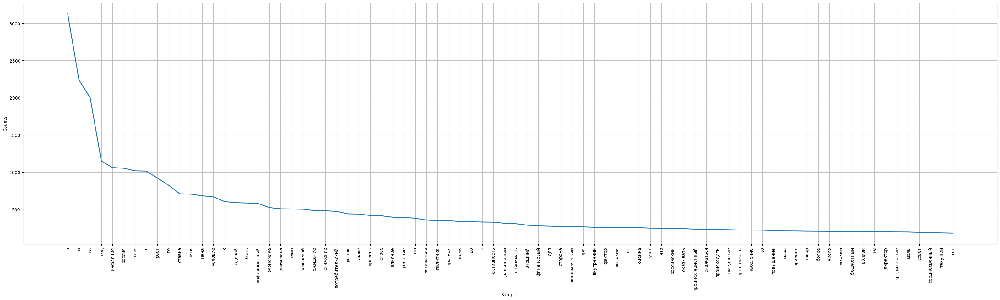

<Axes: xlabel='Samples', ylabel='Counts'>

In [132]:
# 80 наиболее частотных слов
plt.figure(figsize = (40, 10))
fdist.plot(80, cumulative=False)

In [134]:
# удалим стоп-слова и посмотрим, что выйдет
nltk.download("stopwords", quiet=True)
from nltk.corpus import stopwords
russian_stopwords = stopwords.words("russian")

In [136]:
text_stop = [i for i in text if i not in russian_stopwords]

In [138]:
print(len(text), len(text_stop))

66389 51407


In [140]:
import nltk

text_stop = nltk.Text(text_stop)

In [142]:
from nltk.probability import FreqDist
fdist = FreqDist(text_stop)
fdist

FreqDist({'год': 1149, 'инфляция': 1061, 'россия': 1052, 'банк': 1017, 'рост': 921, 'ставка': 708, 'риск': 704, 'цена': 682, 'условие': 667, 'годовой': 589, ...})

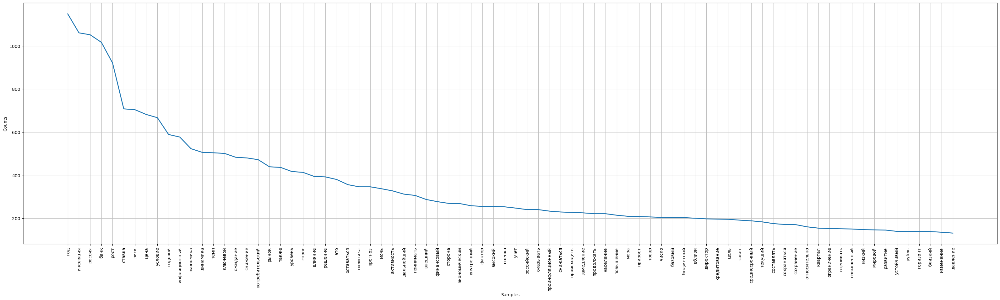

<Axes: xlabel='Samples', ylabel='Counts'>

In [144]:
# 80 наиболее частотных слов после удаления стоп-слов
plt.figure(figsize = (40, 10))
fdist.plot(80,cumulative=False)

### Визуализация популярности слов в виде облака

In [147]:
# pip install wordcloud

In [149]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
# %matplotlib inline

In [151]:
text_raw = " ".join(text_stop)

In [153]:
wordcloud = WordCloud().generate(text_raw)

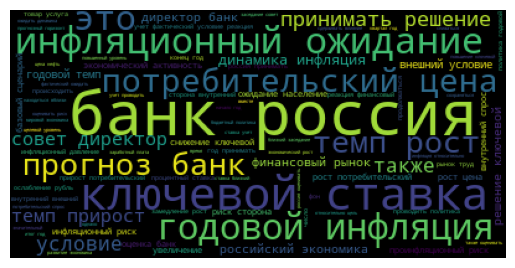

In [155]:
plt.axis('off')
plt.imshow(wordcloud)

In [157]:
df

,text,year,month,day,target,length_text
0,Совет директоров Банка России 20 декабря 2024 ...,2024,12,20,0,5193
1,Совет директоров Банка России 25 октября 2024 ...,2024,10,25,0,4389
2,Совет директоров Банка России 13 сентября 2024...,2024,9,13,1,4890
3,Совет директоров Банка России 26 июля 2024 год...,2024,7,26,1,4241
4,Совет директоров Банка России 7 июня 2024 года...,2024,6,7,1,4467
...,...,...,...,...,...,...
93,Совет директоров Банка России 14 февраля 2014 ...,2014,2,14,1,3853
94,Совет директоров Банка России 13 декабря 2013 ...,2013,12,13,0,2500
95,Совет директоров Банка России 8 ноября 2013 го...,2013,11,8,0,2509
96,"Пресс-служба Банка России сообщает, что Совет ...",2013,10,14,0,2710


### Облака слов для классов -1, 0, 1

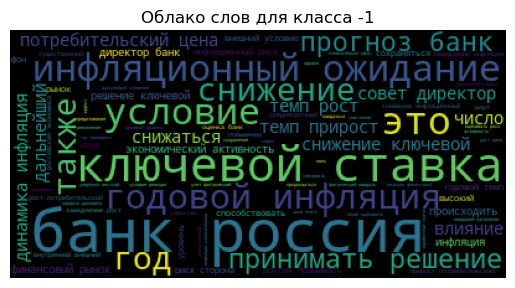

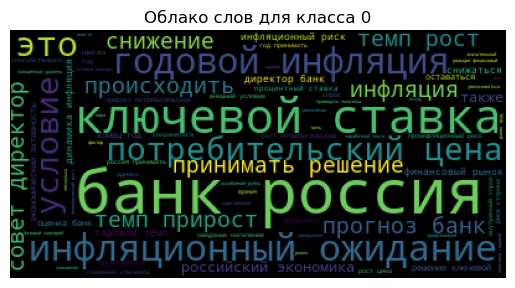

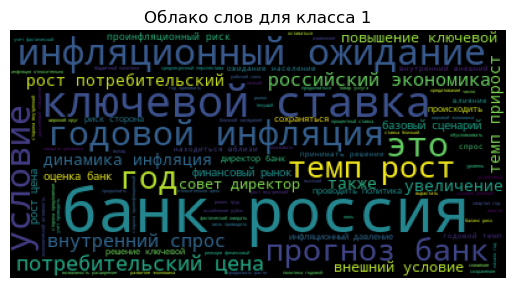

In [165]:
for targ in [-1, 0, 1]:
    texts_targ = df[df['target']==targ]['text']
    texts_tokenized_targ = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in texts_targ]
    mystem_analyzer_targ = Mystem()
    texts_lemmatized_targ = [mystem_analyzer_targ.lemmatize(text) for text in texts_tokenized_targ]
    texts_lemmatized_targ = [[j for j in i if j != ' ' and j != '\n'] for i in texts_lemmatized_targ]
    texts_lemmatized_targ = [" ".join([w for w in t]) for t in texts_lemmatized_targ]

    text = []
    for i in texts_lemmatized_targ:
        text = text + i.split()


    text = nltk.Text(text)

    russian_stopwords = stopwords.words("russian")

    text_stop = [i for i in text if i not in russian_stopwords]

    text_raw = " ".join(text_stop)
    wordcloud = WordCloud().generate(text_raw)
    plt.title(f"Облако слов для класса {targ}")
    plt.axis('off')
    plt.imshow(wordcloud)
    plt.show()

### Экспертно расширим список стоп-слов и ещё раз построим облако

In [306]:
# удалим стоп-слова и посмотрим, что выйдет
nltk.download("stopwords", quiet=True)
from nltk.corpus import stopwords
russian_stopwords = stopwords.words("russian")
russian_stopwords.extend(['это', 'совет', 'директор', 'банк', 'россия', 'годовой', 'год'])

text_stop = [i for i in text if i not in russian_stopwords]
print(len(text), len(text_stop))
corpus = text_stop.copy()

19358 13772


In [75]:
import nltk

text_stop = nltk.Text(text_stop)

from nltk.probability import FreqDist
fdist = FreqDist(text_stop)
fdist

FreqDist({'инфляция': 1053, 'рост': 910, 'ставка': 701, 'риск': 700, 'цена': 677, 'условие': 662, 'инфляционный': 571, 'экономика': 520, 'динамика': 505, 'темп': 503, ...})

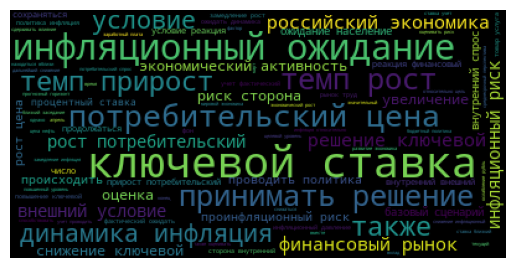

In [76]:
text_raw = " ".join(text_stop)
wordcloud = WordCloud().generate(text_raw)
plt.axis('off')
plt.imshow(wordcloud)

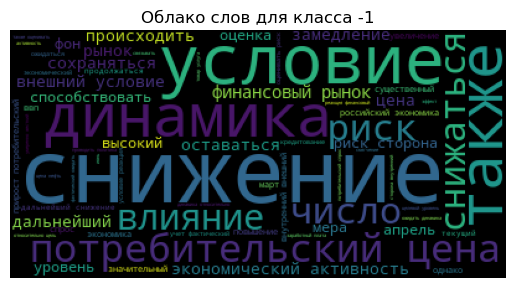

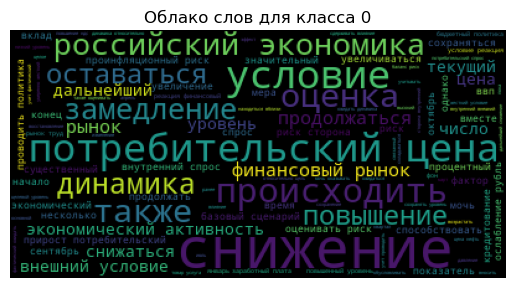

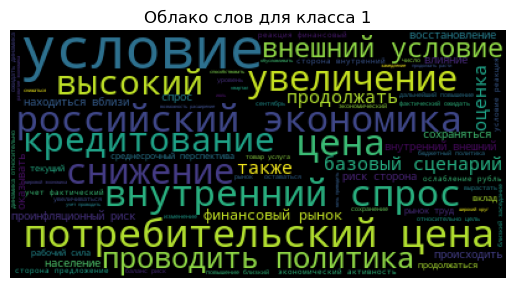

In [180]:
for targ in [-1, 0, 1]:
    texts_targ = df[df['target']==targ]['text']
    texts_tokenized_targ = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in texts_targ]
    mystem_analyzer_targ = Mystem()
    texts_lemmatized_targ = [mystem_analyzer_targ.lemmatize(text) for text in texts_tokenized_targ]
    texts_lemmatized_targ = [[j for j in i if j != ' ' and j != '\n'] for i in texts_lemmatized_targ]
    texts_lemmatized_targ = [" ".join([w for w in t]) for t in texts_lemmatized_targ]

    text = []
    for i in texts_lemmatized_targ:
        text = text + i.split()


    text = nltk.Text(text)

    russian_stopwords = stopwords.words("russian")
    russian_stopwords.extend(['инфляция', 'ожидание', 'инфляционный', 'ключевой', 'ставка','это', 'совет', 'директор', 'банк', 'прогноз', 'россия', 'годовой', 'год', 'принимать', 'решение', 'темп', 'рост'])

    text_stop = [i for i in text if i not in russian_stopwords]

    text_raw = " ".join(text_stop)
    wordcloud = WordCloud().generate(text_raw)
    plt.title(f"Облако слов для класса {targ}")
    plt.axis('off')
    plt.imshow(wordcloud)
    plt.show()

### Морфология. Распределение частей речи.

In [183]:
"""
pip install pymorphy2
pip install pymorphy2-dicts
pip install DAWG-Python

# на питон 3.11 работает только fork pymorphy3

pip install pymorphy3
pip install pymorphy3-dicts-ru
"""

'\npip install pymorphy2\npip install pymorphy2-dicts\npip install DAWG-Python\n\n# на питон 3.11 работает только fork pymorphy3\n\npip install pymorphy3\npip install pymorphy3-dicts-ru\n'

In [185]:
import pymorphy3

In [187]:
texts_tokenized = [i.lower().split() for i in texts_tokenized]

In [189]:
parts_of_speech = dict()

In [191]:
morph = pymorphy3.MorphAnalyzer()

for i in texts_tokenized:
    for j in i:
        p = morph.parse(j)[0]
        p = p.tag.POS
        if p in parts_of_speech:
            parts_of_speech[p]+=1
        else:
            parts_of_speech[p]=1

In [192]:
parts_of_speech

{'NOUN': 29491,
 'VERB': 4674,
 'INFN': 1224,
 'ADJF': 12181,
 'PREP': 10223,
 'ADVB': 1377,
 'CONJ': 3491,
 'PRTF': 1151,
 'PRCL': 886,
 'PRTS': 368,
 'GRND': 229,
 None: 216,
 'NPRO': 642,
 'COMP': 73,
 'ADJS': 121,
 'NUMR': 16,
 'PRED': 26}

In [195]:
parts_of_speech.values()

dict_values([29491, 4674, 1224, 12181, 10223, 1377, 3491, 1151, 886, 368, 229, 216, 642, 73, 121, 16, 26])

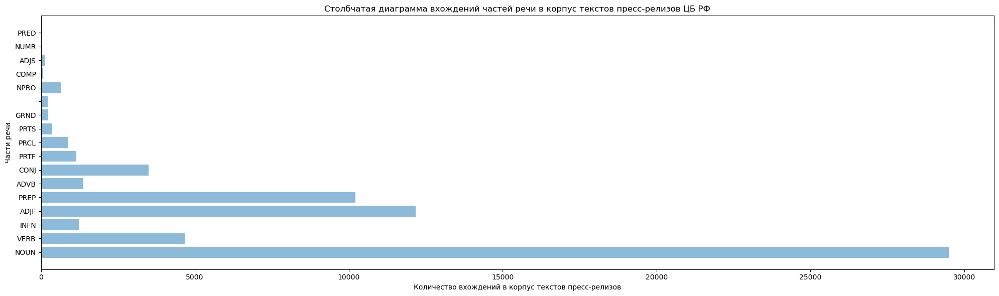

In [197]:
import matplotlib.pyplot as plt
import numpy as np

def plot_parts_of_speech(data):
    speech = data.keys()
    count = data.values()
    y_pos = np.arange(len(speech))
    plt.figure(figsize = (20, 6))
    plt.barh(y_pos, count, align='center', alpha=0.5)
    plt.yticks(y_pos, speech)
    plt.xlabel('Количество вхождений в корпус текстов пресс-релизов')
    plt.ylabel('Части речи')
    plt.title('Столбчатая диаграмма вхождений частей речи в корпус текстов пресс-релизов ЦБ РФ')
    plt.tight_layout()
    plt.show()

plot_parts_of_speech(parts_of_speech)

### TF-IDF

In [200]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vec = TfidfVectorizer()
X = tfidf_vec.fit_transform(texts_lemmatized)

In [202]:
X.toarray()

array([[0.        , 0.04004097, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.07138898, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.0852057 ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.08236893,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.05686393,
        0.        ]])

In [204]:
pd.DataFrame(X.toarray(), columns=res.keys())

,ii,iii,iv,urals,абсорбирование,август,автомобиль,автономный,агент,аграрный,...,эпидемия,эпизод,этап,это,этот,эффект,эффективность,юридический,являться,январь
0,0.000000,0.040041,0.000000,0.0,0.000000,0.000000,0.000000,0.290274,0.054023,0.0,...,0.0,0.0,0.0,0.110107,0.000000,0.069716,0.0,0.0,0.000000,0.0
1,0.000000,0.000000,0.000000,0.0,0.000000,0.089705,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.057095,0.022413,0.028117,0.0,0.0,0.000000,0.0
2,0.071389,0.000000,0.000000,0.0,0.000000,0.120362,0.000000,0.000000,0.058468,0.0,...,0.0,0.0,0.0,0.034048,0.040097,0.025151,0.0,0.0,0.000000,0.0
3,0.156203,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.000000,0.065802,0.000000,0.0,0.0,0.000000,0.0
4,0.036919,0.000000,0.000000,0.0,0.000000,0.000000,0.081235,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.052824,0.020737,0.000000,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,0.000000,0.000000,0.045506,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.075828,0.044651,0.000000,0.0,0.0,0.096929,0.0
94,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.025341,0.029844,0.000000,0.0,0.0,0.129572,0.0
95,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.074989,0.000000,0.000000,0.0,0.0,0.085206,0.0
96,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.072492,0.000000,0.000000,0.0,0.0,0.082369,0.0


### N-gram, извлечение биграмм и триграмм

In [207]:
# Gensim
from numpy import triu
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

In [209]:
#pip install scipy==1.12

In [211]:
#pip install gensim

In [213]:
texts_lemmatized = [i.split() for i in texts_lemmatized]

In [215]:
data_words = texts_tokenized

# строим модели биграмм и триграмм
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)

bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# пример триграммы для первого пресс-релиза
print(trigram_mod[bigram_mod[data_words[0]]])

['совет_директоров', 'банка', 'россии', 'декабря', 'года', 'принял_решение', 'сохранить_ключевую', 'ставку', 'на', 'уровне', 'годовых', 'произошло', 'более', 'существенное', 'ужесточение', 'условий', 'чем', 'предполагало', 'октябрьское', 'решение', 'по', 'ключевой', 'ставке', 'этому_способствовали', 'автономные', 'от', 'политики', 'факторы', 'по', 'оценке', 'банка', 'россии', 'с', 'учетом', 'значительного', 'роста', 'процентных_ставок', 'для', 'конечных', 'заемщиков', 'и', 'охлаждения', 'кредитной', 'активности', 'достигнутая', 'жесткость', 'условий', 'формирует', 'необходимые', 'предпосылки', 'для', 'возобновления', 'процесса', 'дезинфляции', 'и', 'возвращения', 'инфляции', 'к', 'цели', 'несмотря', 'на', 'повышенный', 'текущий', 'рост', 'цен', 'и', 'высокий', 'внутренний_спрос', 'банк', 'россии', 'будет', 'оценивать_целесообразность', 'повышения', 'ключевой', 'ставки', 'на', 'ближайшем', 'заседании', 'с', 'учетом', 'дальнейшей', 'динамики', 'кредитования', 'и', 'инфляции', 'по', 'прог

In [217]:
bigram_mod[data_words[0]] # биграммы для первого пресс-релиза

['совет_директоров',
 'банка',
 'россии',
 'декабря',
 'года',
 'принял_решение',
 'сохранить_ключевую',
 'ставку',
 'на',
 'уровне',
 'годовых',
 'произошло',
 'более',
 'существенное',
 'ужесточение',
 'условий',
 'чем',
 'предполагало',
 'октябрьское',
 'решение',
 'по',
 'ключевой',
 'ставке',
 'этому_способствовали',
 'автономные',
 'от',
 'политики',
 'факторы',
 'по',
 'оценке',
 'банка',
 'россии',
 'с',
 'учетом',
 'значительного',
 'роста',
 'процентных_ставок',
 'для',
 'конечных',
 'заемщиков',
 'и',
 'охлаждения',
 'кредитной',
 'активности',
 'достигнутая',
 'жесткость',
 'условий',
 'формирует',
 'необходимые',
 'предпосылки',
 'для',
 'возобновления',
 'процесса',
 'дезинфляции',
 'и',
 'возвращения',
 'инфляции',
 'к',
 'цели',
 'несмотря',
 'на',
 'повышенный',
 'текущий',
 'рост',
 'цен',
 'и',
 'высокий',
 'внутренний_спрос',
 'банк',
 'россии',
 'будет',
 'оценивать_целесообразность',
 'повышения',
 'ключевой',
 'ставки',
 'на',
 'ближайшем',
 'заседании',
 'с',
 '

## 2. Если у текстов есть метаинформация (дата публикации, авторство и т.д.), то проанализируйте атрибуты, изучите корреляции между этими признаками и текстами.

### Дата пресс-релиза поделена на три колонки:
- year
- month
- day

In [221]:
df['year'].value_counts()

year
2022    11
2014    10
2023     9
2024     8
2021     8
2020     8
2019     8
2018     8
2017     8
2016     8
2015     8
2013     4
Name: count, dtype: int64

### Рассмотрим связь между годом и целевой переменной

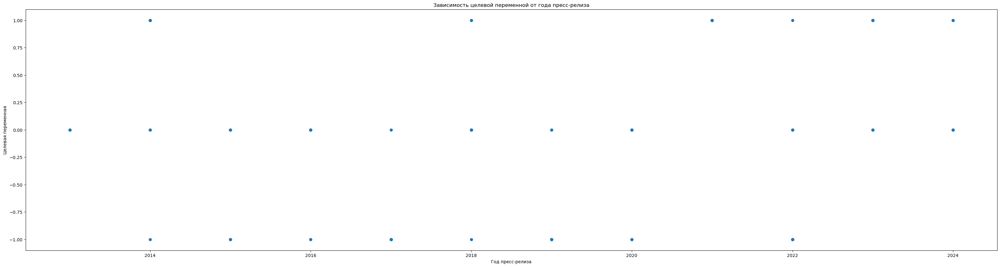

In [224]:
plt.figure(figsize = (40, 10))
plt.title('Зависимость целевой переменной от года пресс-релиза')
plt.xlabel('Год пресс-релиза')
plt.ylabel('Целевая переменная')

plt.scatter(df['year'], df['target'])
plt.show()

### Распределения классов, меток или числовых признаков

In [227]:
df.target.value_counts()

target
0     43
-1    30
1     25
Name: count, dtype: int64

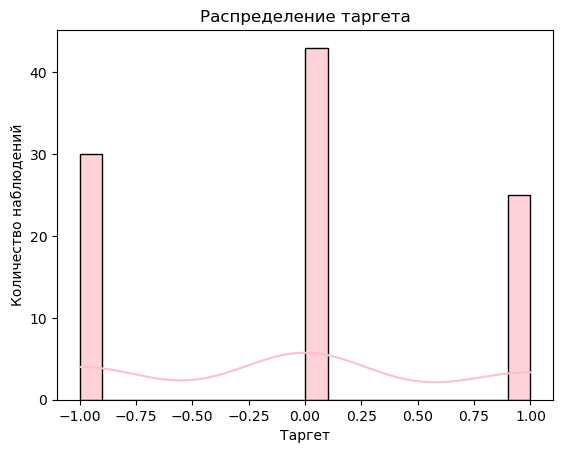

<Figure size 500x4000 with 0 Axes>

In [229]:
sns.histplot(data=df, x='target', bins=20, color='pink', kde=True, alpha=0.7)
plt.title('Распределение таргета')
plt.xlabel('Таргет')
plt.ylabel('Количество наблюдений')
plt.figure(figsize = (5, 40))
plt.show()

## Вывод о структуре данных
1. Средняя длина пресс-релиза: 5695. Минимальная длина пресс-релиза: 320. Максимальная длина пресс-релиза: 9756.
2. Основная проблема данных — их количество. Поскольку пресс-релизы выходят приблизительно раз в один-два месяца, то с 2013 года их собралось менее 100. При обучении модели есть значительная вероятность, что данных не хватит, и тогда датафрейм придётся обогащать макроэкономическими данными.
3. Другая проблема — содержание пресс-релизов. На данном этапе, например, непонятно, достаточно ли данные очищены от стоп-слов. Также зачастую в пресс-релизах вне зависимости от значения таргета встречаются одни и те же слова и словосочетания (выяснили благодаря анализу частотности слов). Возможно, в дальнейшем придётся присваивать веса ряду слов, по которым таргет определится с большей вероятностью. В ходе обучения планируем экспериментировать с данными для улучшения прогнозов :)
4. Из положительных моментов — значения классов в таргете примерно сбалансированы (41, 31, 25 для классов 0, -1, 1 соответственно).

# Check Point 3

## Функция предсказания самого частого класса

In [238]:
df['target'].value_counts()

target
0     43
-1    30
1     25
Name: count, dtype: int64

In [240]:
import random
def predict_top_class(data):    
    return [random.choices([0, -1, 1], weights=[41, 30, 26])[0] for i in range(len(data))]

In [242]:
pd.DataFrame(predict_top_class(df)).value_counts()

0 
 0    43
-1    33
 1    22
Name: count, dtype: int64

In [244]:
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             fbeta_score, roc_curve, roc_auc_score, precision_recall_curve,
                             auc, average_precision_score, classification_report)

accuracy = accuracy_score(list(df['target']), predict_top_class(df))
error_rate = 1 - accuracy
print(f'Accuracy: {accuracy}')
print(f'Error rate: {error_rate}')

Accuracy: 0.30612244897959184
Error rate: 0.6938775510204082


## Bag of words   

In [248]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download("punkt", quiet=True)

True

In [250]:
# токенизируем тексты (оставим только слова без пунктуации) и склеим списки обратно для лемматизации
texts = df['text']
texts_tokenized = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in texts]

In [252]:
# лемматизируем тексты
from pymystem3 import Mystem

mystem_analyzer = Mystem()
texts_lemmatized = [mystem_analyzer.lemmatize(text) for text in texts_tokenized]
texts_lemmatized = [[j for j in i if j != ' ' and j != '\n'] for i in texts_lemmatized]

In [253]:
texts_lemmatized = [" ".join([w for w in t]) for t in texts_lemmatized]

In [256]:
from nltk.corpus import stopwords
russian_stopwords = stopwords.words("russian")
#russian_stopwords.extend(['это', 'нею'])

In [258]:
# мешок слов
from sklearn.feature_extraction.text import CountVectorizer

cnt_vec = CountVectorizer(stop_words=russian_stopwords)

X_bow = cnt_vec.fit_transform(texts_lemmatized)

In [264]:
df['target'] = df['target'].astype('int') 

In [266]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MaxAbsScaler

In [268]:
x_train, x_test, y_train, y_test = train_test_split(df['text'], df['target'])

In [270]:
x_train = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in x_train]
x_train = [mystem_analyzer.lemmatize(text) for text in x_train]
x_train = [[j for j in i if j != ' ' and j != '\n'] for i in x_train]
x_train = [" ".join([w for w in t]) for t in x_train]


x_test = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in x_test]
x_test = [mystem_analyzer.lemmatize(text) for text in x_test]
x_test = [[j for j in i if j != ' ' and j != '\n'] for i in x_test]
x_test = [" ".join([w for w in t]) for t in x_test]

In [272]:
vec = CountVectorizer(stop_words=russian_stopwords, ngram_range=(1, 1))




In [274]:
bow = vec.fit_transform(x_train)  # bow — bag of words (мешок слов)
bow_test = vec.transform(x_test)

scaler = MaxAbsScaler()
bow = scaler.fit_transform(bow)
bow_test = scaler.transform(bow_test)

In [276]:
clf = LogisticRegression()
clf.fit(bow, y_train)

LogisticRegression()

In [278]:
pred = clf.predict(bow_test)
print("LogisticRegression() на мешке слов")
print(classification_report(y_test, pred))

LogisticRegression() на мешке слов
              precision    recall  f1-score   support

          -1       0.56      0.62      0.59         8
           0       0.45      0.50      0.48        10
           1       0.80      0.57      0.67         7

    accuracy                           0.56        25
   macro avg       0.60      0.57      0.58        25
weighted avg       0.58      0.56      0.57        25



In [290]:
print("Функция предсказания самого частого класса")
print(classification_report(y_test, predict_top_class(y_test)))

Функция предсказания самого частого класса
              precision    recall  f1-score   support

          -1       0.50      0.50      0.50         8
           0       0.25      0.20      0.22        10
           1       0.33      0.43      0.38         7

    accuracy                           0.36        25
   macro avg       0.36      0.38      0.37        25
weighted avg       0.35      0.36      0.35        25



## TF-IDF

In [292]:
from nltk.corpus import stopwords
russian_stopwords = stopwords.words("russian")
#russian_stopwords.extend(['это', 'нею'])
df['target'] = df['target'].astype('int') 

In [294]:
from sklearn.feature_extraction.text import TfidfVectorizer
vec = TfidfVectorizer(stop_words=russian_stopwords, ngram_range=(1, 1))
vec_train = vec.fit_transform(x_train)
vec_test = vec.transform(x_test)

scaler = MaxAbsScaler()
vec_train = scaler.fit_transform(vec_train)
vec_test = scaler.transform(vec_test)

print(type(vec_test))

clf = LogisticRegression(max_iter=300, random_state=42)
clf.fit(vec_train, y_train)
pred_tfidf = clf.predict(vec_test)
print("LogisticRegression() на TF-IDF")
print(classification_report(y_test, pred_tfidf))

<class 'scipy.sparse._csr.csr_matrix'>
LogisticRegression() на TF-IDF
              precision    recall  f1-score   support

          -1       0.58      0.88      0.70         8
           0       0.50      0.40      0.44        10
           1       0.80      0.57      0.67         7

    accuracy                           0.60        25
   macro avg       0.63      0.62      0.60        25
weighted avg       0.61      0.60      0.59        25



## N-GRAM tfidf

min_df — при построении словаря будут игнорироваться слова из текстов, частота которых строго ниже заданного порогового значения.
max_df — при построении словаря будут игнорироваться слова из текстов, частота которых строго выше заданного порогового значения.

In [297]:
tfidf = TfidfVectorizer(stop_words=russian_stopwords, min_df=5, max_df=1.0, ngram_range=(1, 3))
tfidf.fit(x_train)

TfidfVectorizer(min_df=5, ngram_range=(1, 3),
                stop_words=['и', 'в', 'во', 'не', 'что', 'он', 'на', 'я', 'с',
                            'со', 'как', 'а', 'то', 'все', 'она', 'так', 'его',
                            'но', 'да', 'ты', 'к', 'у', 'же', 'вы', 'за', 'бы',
                            'по', 'только', 'ее', 'мне', ...])

In [299]:
XtrainNgram = tfidf.transform(x_train)
XtestNgram = tfidf.transform(x_test)

In [301]:
lr_clf = LogisticRegression()
lr_clf.fit(XtrainNgram, y_train)

lr_train_pred = lr_clf.predict(XtrainNgram)
lr_test_pred = lr_clf.predict(XtestNgram)

print("LogisticRegression() на N-GRAM BAG OF WORDS")
print(classification_report(y_test, lr_test_pred))

LogisticRegression() на N-GRAM BAG OF WORDS
              precision    recall  f1-score   support

          -1       0.56      0.62      0.59         8
           0       0.50      0.60      0.55        10
           1       1.00      0.57      0.73         7

    accuracy                           0.60        25
   macro avg       0.69      0.60      0.62        25
weighted avg       0.66      0.60      0.61        25



## Word2Vec

In [137]:
#pip install datasets -q

In [138]:
#pip install pytorch_lightning torchmetrics -q

In [139]:
#pip install joblib

- sentences — массив слов разбитых на слова (список списков токенов).

- vector_size — размерность результирующего embedding вектора.
- min_count — помещать в словарь только слова встретившиеся в тексте более min_count раз.
- window — максимальное расстояние между текущим и предсказанным словом в предложении. В модели word2vec для определения смысловой связи между словами просматриваются соседние слована расстоянии не более window.

In [308]:
sentences = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in df['text']]
sentences = [mystem_analyzer.lemmatize(text) for text in sentences]
sentences = [[j for j in i if j != ' ' and j != '\n'] for i in sentences]
sentences = [" ".join([w for w in t]) for t in sentences]

writers_lines = [[j for j in i.split() if j in corpus] for i in sentences]

In [310]:
import gensim
HIDDEN = 100
model=gensim.models.Word2Vec(sentences = writers_lines, vector_size = HIDDEN, min_count = 1, window = 5)

In [312]:
model.train(x_train, total_examples=model.corpus_count, epochs=30, report_delay=1)

(5400, 11384370)

In [314]:
def get_mean_w2v_vector(sentence):
    Sum = 0
    Count = 0

    try:
      words = sentence.split()
    except TypeError:
      words = []

    for w in words:
        if w in model.wv:
            Sum += model.wv[w]
            # Sum += glove_vectors[w]
            Count += 1

    if Count == 0:
        return 0

    return Sum / Count

In [316]:
NewCols = ['col'+str(i) for i in range(HIDDEN)]

x_train = pd.DataFrame(x_train)
x_test = pd.DataFrame(x_test)


x_train['vectors'] = x_train.map(get_mean_w2v_vector)
x_test['vectors'] = x_test.map(get_mean_w2v_vector)

x_train.head()

,0,vectors
0,совет директор банк россия октябрь год принима...,"[0.14222124, 0.26752234, 0.2584529, 0.17040691..."
1,совет директор банк россия апрель год принимат...,"[0.1239816, 0.25992262, 0.23064758, 0.1553782,..."
2,совет директор банк россия апрель год принимат...,"[0.09717813, 0.28244072, 0.18594903, 0.1379021..."
3,департамент внешний и общественный связь банк ...,"[0.14509715, 0.27536684, 0.2492446, 0.16162936..."
4,совет директор банк россия октябрь год принима...,"[0.13782491, 0.2736166, 0.24457578, 0.16319034..."


In [318]:
# Удалим строки, для которых векторы не посчитались (все слова оказались неизвестными).
IdxTrain = []

for ix, row in x_train.iterrows():
    if not isinstance(row['vectors'],np.ndarray):
        IdxTrain.append(ix)

IdxTest = []

for ix, row in x_test.iterrows():
    if not isinstance(row['vectors'],np.ndarray):
        IdxTest.append(ix)

In [320]:
x_train.drop(index=IdxTrain, inplace=True)
x_test.drop(index=IdxTest, inplace=True)

y_train = y_train.drop(index=IdxTrain)
y_test = y_test.drop(index=IdxTest)

In [322]:
x_train[NewCols] = pd.DataFrame(x_train['vectors'].tolist(), index=x_train.index)
x_test[NewCols] = pd.DataFrame(x_test['vectors'].tolist(), index=x_test.index)

In [324]:
x_train.head()

,0,vectors,col0,col1,col2,col3,col4,col5,col6,col7,...,col90,col91,col92,col93,col94,col95,col96,col97,col98,col99
0,совет директор банк россия октябрь год принима...,"[0.14222124, 0.26752234, 0.2584529, 0.17040691...",0.142221,0.267522,0.258453,0.170407,-0.082008,-0.535924,0.286109,0.609378,...,0.464261,-0.040929,-0.239691,0.010504,0.209420,0.221667,-0.092435,-0.344923,0.462413,-0.281802
1,совет директор банк россия апрель год принимат...,"[0.1239816, 0.25992262, 0.23064758, 0.1553782,...",0.123982,0.259923,0.230648,0.155378,-0.081821,-0.520001,0.263429,0.573257,...,0.447916,-0.039184,-0.231223,0.000060,0.202552,0.218759,-0.078675,-0.335949,0.427288,-0.259122
2,совет директор банк россия апрель год принимат...,"[0.09717813, 0.28244072, 0.18594903, 0.1379021...",0.097178,0.282441,0.185949,0.137902,-0.085788,-0.535602,0.218054,0.571016,...,0.471040,-0.044816,-0.236157,-0.011975,0.203545,0.214756,-0.052689,-0.339655,0.392919,-0.237468
3,департамент внешний и общественный связь банк ...,"[0.14509715, 0.27536684, 0.2492446, 0.16162936...",0.145097,0.275367,0.249245,0.161629,-0.080777,-0.519111,0.247217,0.617678,...,0.466918,-0.052701,-0.242242,0.016265,0.197357,0.186371,-0.089027,-0.323799,0.437702,-0.271429
4,совет директор банк россия октябрь год принима...,"[0.13782491, 0.2736166, 0.24457578, 0.16319034...",0.137825,0.273617,0.244576,0.163190,-0.082626,-0.535727,0.268652,0.604449,...,0.475164,-0.039024,-0.240987,0.002774,0.211038,0.218572,-0.086075,-0.342392,0.454163,-0.272901


In [326]:
x_train.drop([0,'vectors'], axis=1, inplace=True)
x_test.drop([0,'vectors'], axis=1, inplace=True)

In [328]:
lr_clf_w2v = LogisticRegression()
lr_clf_w2v.fit(x_train, y_train)

lr_train_pred_w2v = lr_clf_w2v.predict(x_train)
lr_test_pred_w2v = lr_clf_w2v.predict(x_test)

accuracy_score(y_train, lr_train_pred_w2v), accuracy_score(y_test, lr_test_pred_w2v)

(0.4520547945205479, 0.44)

In [330]:
print("LogisticRegression() на word to vec")
print(classification_report(y_test, lr_test_pred_w2v))

LogisticRegression() на word to vec
              precision    recall  f1-score   support

          -1       0.50      0.25      0.33         8
           0       0.43      0.90      0.58        10
           1       0.00      0.00      0.00         7

    accuracy                           0.44        25
   macro avg       0.31      0.38      0.30        25
weighted avg       0.33      0.44      0.34        25



## Pipeline

In [154]:
from sklearn.base import BaseEstimator
class PrepareData(BaseEstimator):
    def __init__(self):
        pass

    def fit(self, x, y):
        return self
         

    def transform(self, x, r = 'train'):

        # токенизируем тексты (оставим только слова без пунктуации) и склеим списки обратно для лемматизации
        texts = x
        texts_tokenized = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in texts]
        
        # лемматизируем тексты
        from pymystem3 import Mystem
        
        mystem_analyzer = Mystem()
        texts_lemmatized = [mystem_analyzer.lemmatize(text) for text in texts_tokenized]
        texts_lemmatized = [[j for j in i if j != ' ' and j != '\n'] for i in texts_lemmatized]
        
        
        texts_lemmatized = [" ".join([w for w in t]) for t in texts_lemmatized]
        x_train =  texts_lemmatized

        if r == 'train':
            vec = TfidfVectorizer(stop_words=russian_stopwords, ngram_range=(1, 1))
            vec_train = vec.fit_transform(x_train)
            self.vec = vec
        else:
            vec_train = self.vec.transform(x_train)
        
        
        if r == 'train':
            self.scaler = MaxAbsScaler()
            vec_train = self.scaler.fit_transform(vec_train)
        else:
            vec_train = self.scaler.transform(vec_train )
  
        
        return vec_train

In [155]:
import pandas as pd
from sklearn.base import BaseEstimator
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, root_mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import TargetEncoder
from sklearn.pipeline import Pipeline

pipeline_final = Pipeline(steps=[
    ('prepare_data',  PrepareData()),
    ('tf-idf', LogisticRegression(max_iter=300, random_state=42))
])

In [156]:
pipeline_final

Pipeline(steps=[('prepare_data', PrepareData()),
                ('tf-idf', LogisticRegression(max_iter=300, random_state=42))])

In [157]:
x_train, x_test, y_train, y_test = train_test_split(df['text'], df['target'])
pipeline_final.fit(x_train, y_train.astype(int))
pipeline_final

Pipeline(steps=[('prepare_data', PrepareData()),
                ('tf-idf', LogisticRegression(max_iter=300, random_state=42))])

In [158]:
# x_test, y_test 
# подготовим тестовые данные
x_test = pipeline_final['prepare_data'].transform(x = x_test, r='test')

In [159]:
pred_tfidf = pipeline_final['tf-idf'].predict(x_test)

In [160]:
print("LogisticRegression() на TF-IDF")
print(classification_report(y_test.astype(int), pred_tfidf))

LogisticRegression() на TF-IDF
              precision    recall  f1-score   support

          -1       0.62      0.71      0.67         7
           0       0.29      0.44      0.35         9
           1       0.33      0.11      0.17         9

    accuracy                           0.40        25
   macro avg       0.41      0.42      0.39        25
weighted avg       0.40      0.40      0.37        25



## ROC-AUC

In [335]:
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_curve, auc, RocCurveDisplay
from sklearn.linear_model import LogisticRegression
from sklearn import datasets
from itertools import cycle
import matplotlib.pyplot as plt

**Casus 1**:
Positive class - -1 (ЦБ понизил ставку)
Negative Class - 1 или 0 (ЦБ повысил ставку или оставил без изменений)

**Casus 2**:
Positive class - 0 (ЦБ оставил ставку без изменений)
Negative Class - 1 или -1 (ЦБ повысил или понизил ставку)

**Casus 3**:
Positive class - 1 (ЦБ поднял ставку)
Negative Class - 0 и -1 (ЦБ оставил ставку без изменений или понизил)

In [338]:
# x_train, x_test, y_train, y_test
x_train, x_test, y_train, y_test = train_test_split(df['text'], df['target'])
y_train_new = label_binarize(y_train, classes=[-1, 0, 1])
y_train_new[:5]

array([[0, 0, 1],
       [0, 1, 0],
       [0, 0, 1],
       [0, 1, 0],
       [1, 0, 0]])

In [340]:
y_train[:5]

87    1
0     0
28    1
50    0
84   -1
Name: target, dtype: int64

In [342]:
y_test_new = label_binarize(y_test, classes=[-1, 0, 1])
y_test_new[:5]

array([[1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [0, 0, 1],
       [0, 1, 0]])

In [344]:
# y_test_new[:,0]  #  оставил без изменения
# y_test_new[:,1]  #  повысил ставку
# y_test_new[:,-1] #  понизил ставку

In [346]:
y_test[:5] # y_test_new[:,0] ---

82   -1
66   -1
49   -1
31    1
75    0
Name: target, dtype: int64

### Bag of words ROC-AUC

In [349]:
x_train = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in x_train]
x_train = [mystem_analyzer.lemmatize(text) for text in x_train]
x_train = [[j for j in i if j != ' ' and j != '\n'] for i in x_train]
x_train = [" ".join([w for w in t]) for t in x_train]


x_test = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in x_test]
x_test = [mystem_analyzer.lemmatize(text) for text in x_test]
x_test = [[j for j in i if j != ' ' and j != '\n'] for i in x_test]
x_test = [" ".join([w for w in t]) for t in x_test]


vec = CountVectorizer(stop_words=russian_stopwords, ngram_range=(1, 1))


bow = vec.fit_transform(x_train)  # bow — bag of words (мешок слов)
bow_test = vec.transform(x_test)

scaler = MaxAbsScaler()
bow = scaler.fit_transform(bow)
bow_test = scaler.transform(bow_test)

In [350]:
casus_1 = LogisticRegression(random_state=0)\
    .fit(bow, y_train_new[:, 0])
casus_2 = LogisticRegression(random_state=0)\
    .fit(bow, y_train_new[:, 1])
casus_3 = LogisticRegression(random_state=0)\
    .fit(bow, y_train_new[:, 2])
 
print(f"Model Accuracy :")
print(f"casus 1 - {casus_1.score(bow_test, y_test_new[:, 0])}")
print(f"casus 2 - {casus_2.score(bow_test, y_test_new[:, 1])}")
print(f"casus 3 - {casus_3.score(bow_test, y_test_new[:, 2])}")

Model Accuracy :
casus 1 - 0.8
casus 2 - 0.64
casus 3 - 0.84


In [351]:
model = OneVsRestClassifier(LogisticRegression(random_state=0))\
    .fit(bow , y_train)
prob_test_vec = model.predict_proba(bow_test)
 
n_classes = 3
fpr = [0] * 3
tpr = [0] * 3
thresholds = [0] * 3
auc_score = [0] * 3
 
for i in range(n_classes):
    fpr[i], tpr[i], thresholds[i] = roc_curve(y_test_new[:, i],
                                              prob_test_vec[:, i])
    auc_score[i] = auc(fpr[i], tpr[i])
 
auc_score

[0.9266666666666667, 0.7720588235294118, 0.8888888888888888]

In [355]:
print(f"auc_score Bag of words (среднее значение): {sum(auc_score) / n_classes}")

auc_score Bag of words (среднее значение): 0.8625381263616557


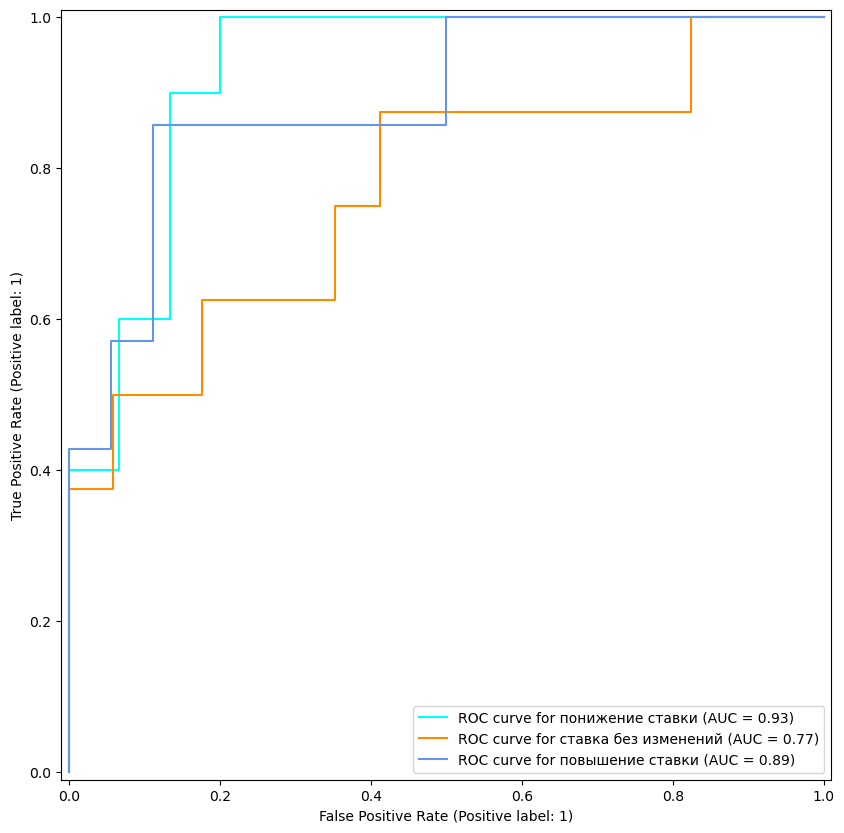

In [359]:
fig, ax = plt.subplots(figsize=(10, 10))
target_names = ['понижение ставки', 'ставка без изменений', 'повышение ставки']
colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for class_id, color in zip(range(n_classes), colors):
    RocCurveDisplay.from_predictions(
        y_test_new[:, class_id],
        prob_test_vec[:, class_id],
        name=f"ROC curve for {target_names[class_id]}",
        color=color,
        ax=ax,
    )

### N-GRAM tfidf ROC-AUC

In [362]:
tfidf = TfidfVectorizer(stop_words=russian_stopwords, min_df=5, max_df=1.0, ngram_range=(1, 3))
tfidf.fit(x_train)

XtrainNgram = tfidf.transform(x_train)
XtestNgram = tfidf.transform(x_test)

In [364]:
casus_1 = LogisticRegression(random_state=0)\
    .fit(XtrainNgram, y_train_new[:, 0])
casus_2 = LogisticRegression(random_state=0)\
    .fit(XtrainNgram, y_train_new[:, 1])
casus_3 = LogisticRegression(random_state=0)\
    .fit(XtrainNgram, y_train_new[:, 2])
 
print(f"Model Accuracy :")
print(f"casus 1 - {casus_1.score(XtestNgram, y_test_new[:, 0])}")
print(f"casus 2 - {casus_2.score(XtestNgram, y_test_new[:, 1])}")
print(f"casus 3 - {casus_3.score(XtestNgram, y_test_new[:, 2])}")

Model Accuracy :
casus 1 - 0.6
casus 2 - 0.64
casus 3 - 0.8


In [366]:
model = OneVsRestClassifier(LogisticRegression(random_state=0))\
    .fit(XtrainNgram , y_train)
prob_test_vec = model.predict_proba(XtestNgram)
 
n_classes = 3
fpr = [0] * 3
tpr = [0] * 3
thresholds = [0] * 3
auc_score = [0] * 3
 
for i in range(n_classes):
    fpr[i], tpr[i], thresholds[i] = roc_curve(y_test_new[:, i],
                                              prob_test_vec[:, i])
    auc_score[i] = auc(fpr[i], tpr[i])
 
auc_score

[0.9533333333333334, 0.7205882352941176, 0.9126984126984128]

In [368]:
print(f"auc_score N-Gram Bag of words (среднее значение): {sum(auc_score) / n_classes}")

auc_score N-Gram Bag of words (среднее значение): 0.8622066604419546


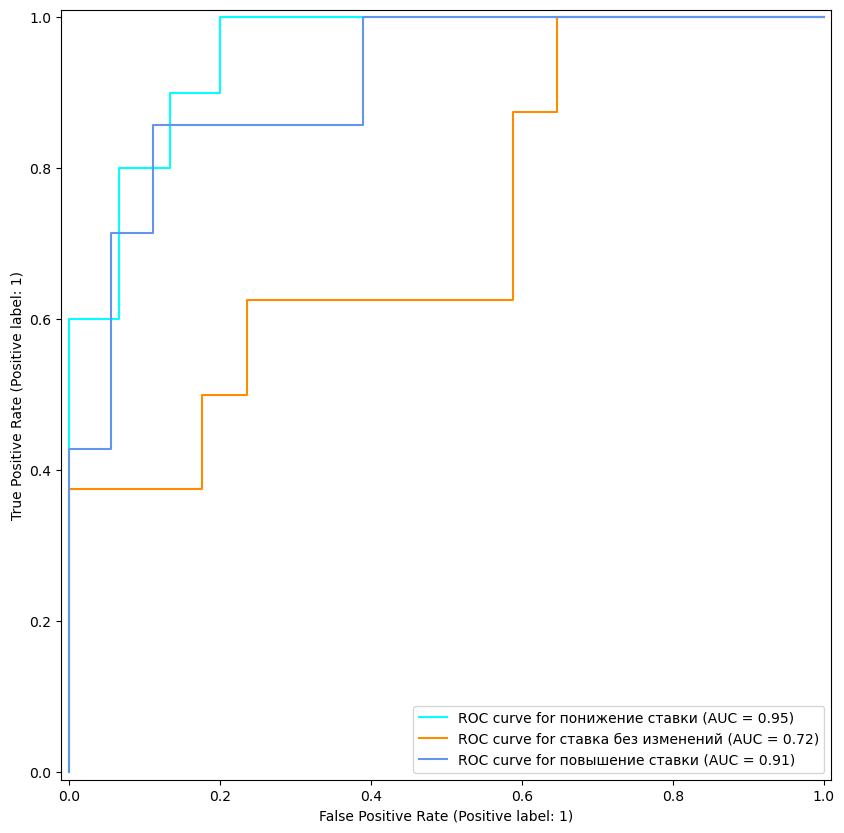

In [370]:
fig, ax = plt.subplots(figsize=(10, 10))
target_names = ['понижение ставки', 'ставка без изменений', 'повышение ставки']
colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for class_id, color in zip(range(n_classes), colors):
    RocCurveDisplay.from_predictions(
        y_test_new[:, class_id],
        prob_test_vec[:, class_id],
        name=f"ROC curve for {target_names[class_id]}",
        color=color,
        ax=ax,
    )

In [372]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.


## Pipeline лучшей линейной модели для check-point-4

In [375]:
X = df['text']
y = df['target']


In [379]:
from sklearn.base import BaseEstimator
import nltk
from nltk.tokenize import word_tokenize
from sklearn.linear_model import LogisticRegression
from pymystem3 import Mystem
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
from sklearn.preprocessing import MaxAbsScaler


class PrepareData(BaseEstimator):
    def __init__(self):
        pass

    def fit(self, x, y):
        # токенизируем тексты (оставим только слова без пунктуации) и склеим списки обратно для лемматизации
        #import nltk
        #from nltk.tokenize import word_tokenize
        #from sklearn.linear_model import LogisticRegression
        texts = x
        texts_tokenized = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in texts]
        
        # лемматизируем тексты
        #from pymystem3 import Mystem
        
        mystem_analyzer = Mystem()
        texts_lemmatized = [mystem_analyzer.lemmatize(text) for text in texts_tokenized]
        texts_lemmatized = [[j for j in i if j != ' ' and j != '\n'] for i in texts_lemmatized]
        
        
        texts_lemmatized = [" ".join([w for w in t]) for t in texts_lemmatized]
        x_train =  texts_lemmatized

        #обучаем трансформер N-GRAM (1-3) TF-IDF
        #from sklearn.feature_extraction.text import TfidfVectorizer
        #from nltk.corpus import stopwords
        russian_stopwords = stopwords.words("russian")
        russian_stopwords.extend(['это', 'совет', 'директор', 'банк', 'россия', 'годовой', 'год'])
        vec = TfidfVectorizer(stop_words=russian_stopwords, min_df=5, max_df=1.0, ngram_range=(1, 3))
        vec_train = vec.fit_transform(x_train)
        self.vec = vec
        
        #масштабируем векторы
        #from sklearn.preprocessing import MaxAbsScaler
        self.scaler = MaxAbsScaler()
        vec_train = self.scaler.fit_transform(vec_train)
        
        return self
         

    def transform(self, x):

        # токенизируем тексты (оставим только слова без пунктуации) и склеим списки обратно для лемматизации
        #import nltk
        #from nltk.tokenize import word_tokenize
        texts = x
        texts_tokenized = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in texts]
        
        # лемматизируем тексты
        #from pymystem3 import Mystem
        
        mystem_analyzer = Mystem()
        texts_lemmatized = [mystem_analyzer.lemmatize(text) for text in texts_tokenized]
        texts_lemmatized = [[j for j in i if j != ' ' and j != '\n'] for i in texts_lemmatized]
        
        
        texts_lemmatized = [" ".join([w for w in t]) for t in texts_lemmatized]
        x_train =  texts_lemmatized

        #трансформируем тексты в векторы N-GRAM (1-3) TF-IDF
        vec_train = self.vec.transform(x_train)
        vec_train = self.scaler.transform(vec_train)
 
        return vec_train

In [381]:
import pandas as pd
from sklearn.base import BaseEstimator
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, root_mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import TfidfVectorizer

pipeline_final = Pipeline(steps=[
    ('PrepareData',  PrepareData()),
    ('TfIdf', LogisticRegression(max_iter=1000, random_state=42))
])

In [383]:
pipeline_final

Pipeline(steps=[('PrepareData', PrepareData()),
                ('TfIdf', LogisticRegression(max_iter=1000, random_state=42))])

In [385]:
pipeline_final.fit(X, y.astype(int))
pipeline_final

Pipeline(steps=[('PrepareData', PrepareData()),
                ('TfIdf', LogisticRegression(max_iter=1000, random_state=42))])

In [386]:
from sklearn.metrics import classification_report, roc_auc_score
pred = pipeline_final.predict(X)


print("LogisticRegression() на N-GRAM BAG OF WORDS")
print(classification_report(y.astype(int), pred))

LogisticRegression() на N-GRAM BAG OF WORDS
              precision    recall  f1-score   support

          -1       1.00      1.00      1.00        30
           0       1.00      1.00      1.00        43
           1       1.00      1.00      1.00        25

    accuracy                           1.00        98
   macro avg       1.00      1.00      1.00        98
weighted avg       1.00      1.00      1.00        98



In [389]:
pred[:10]

array([0, 0, 1, 1, 1, 0, 0, 0, 0, 1])

In [391]:
y[:10]

0    0
1    0
2    1
3    1
4    1
5    0
6    0
7    0
8    0
9    1
Name: target, dtype: int64

In [189]:
# сделаем предсказание по последнему пресс релизу

In [393]:
wonder['text']

'Совет директоров Банка России 14 февраля 2025 года принял решение сохранить ключевую ставку на уровне 21,00% годовых. Текущее инфляционное давление остается высоким. Рост внутреннего спроса по-прежнему значительно опережает возможности расширения предложения товаров и услуг. Вместе с тем более выраженным стало охлаждение кредитной активности, растет склонность населения к сбережению. По оценке Банка России, достигнутая жесткость денежно-кредитных условий формирует необходимые предпосылки для возобновления процесса дезинфляции и возвращения инфляции к цели в 2026 году. Банк России будет оценивать целесообразность повышения ключевой ставки на ближайшем заседании с учетом скорости и устойчивости снижения инфляции. В базовом сценарии для возвращения инфляции к цели потребуется более продолжительный период поддержания жестких денежно-кредитных условий в экономике, чем прогнозировалось в октябре. По прогнозу Банка России, с учетом проводимой денежно-кредитной политики годовая инфляция снизи

In [395]:
pipeline_final.predict([wonder['text']])[0]

0

In [192]:
#pip install grid



In [412]:
# сохраним лучшую модель
from joblib import dump


dump(pipeline_final, 'linear_best_model_17_03_2025.pkl')







['linear_best_model_17_03_2025.pkl']

In [414]:
from joblib import load

best_model = load('linear_best_model_17_03_2025.pkl')

In [416]:
best_model.predict([wonder['text']])[0]

0

# Нелинейные модели check-point-5

In [426]:
df['target'] = df['target'].astype('int') 

x_train, x_test, y_train, y_test = train_test_split(df['text'], df['target'])

In [428]:
# токенизируем тексты (оставим только слова без пунктуации) и склеим списки обратно для лемматизации
x_train = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in x_train]
x_test = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in x_test]
        
# лемматизируем тексты
        
mystem_analyzer = Mystem()
x_train = [mystem_analyzer.lemmatize(text) for text in x_train]
x_train = [[j for j in i if j != ' ' and j != '\n'] for i in x_train]
x_train = [" ".join([w for w in t]) for t in x_train]

x_test = [mystem_analyzer.lemmatize(text) for text in x_test]
x_test = [[j for j in i if j != ' ' and j != '\n'] for i in x_test]
x_test = [" ".join([w for w in t]) for t in x_test]


#обучаем трансформер N-GRAM (1-3) TF-IDF
russian_stopwords = stopwords.words("russian")
russian_stopwords.extend(['это', 'совет', 'директор', 'банк', 'россия', 'годовой', 'год'])
vec = TfidfVectorizer(stop_words=russian_stopwords, min_df=5, max_df=1.0, ngram_range=(1, 3))
vec_train = vec.fit_transform(x_train)
vec_test = vec.transform(x_test)
        
scaler = MaxAbsScaler()
vec_train = scaler.fit_transform(vec_train)
vec_test = scaler.transform(vec_test)

x_train = vec_train
x_test = vec_test

In [430]:
x_train.shape

(73, 2989)

In [432]:
x_test.shape

(25, 2989)

## DecicionTreeClassifier N-GRAM (1, 3) TF-IDF

In [448]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report


param_grid = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],  
    'max_depth': [2, 5, 10, 15, 20, 25, 30, 40, 45],    
    'min_samples_split': [2, 5, 10, 15, 20, 25, 30,], 
    'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 15], 
    'class_weight': [None, 'balanced']
}




grid_search = GridSearchCV(DecisionTreeClassifier(), 
                           param_grid,
                           cv=3,     
                           scoring='roc_auc')

grid_search.fit(x_train, y_train)

best_tree = grid_search.best_estimator_

y_pred = best_tree.predict(x_test)

print("Лучшие параметры:", grid_search.best_params_)
print("Точность на тестовой выборке:", accuracy_score(y_test, y_pred))
print("Отчет о классификации:\n", classification_report(y_test, y_pred))

Лучшие параметры: {'class_weight': None, 'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}
Точность на тестовой выборке: 0.4
Отчет о классификации:
               precision    recall  f1-score   support

          -1       0.75      0.86      0.80         7
           0       0.29      0.44      0.35         9
           1       0.00      0.00      0.00         9

    accuracy                           0.40        25
   macro avg       0.35      0.43      0.38        25
weighted avg       0.31      0.40      0.35        25



## RandomForestClassifier N-GRAM (1, 3) TF-IDF

In [452]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report


param_grid = {
    'n_estimators': [50, 100, 200],  
    'criterion': ['gini', 'entropy'], 
    'max_depth': [None, 5, 10, 15],  
    'min_samples_split': [2, 5, 10],  
    'min_samples_leaf': [1, 2, 4],   
    'bootstrap': [True, False]      
}


grid_search_RF = GridSearchCV(RandomForestClassifier(),
                           param_grid,
                           cv=3,     
                           scoring='roc_auc',
                           n_jobs=-1) 


grid_search_RF.fit(x_train, y_train)


best_rf = grid_search_RF.best_estimator_


y_pred = best_rf.predict(x_test)

print("Лучшие параметры случайного леса:", grid_search.best_params_)
print("Точность на тестовой выборке (случайный лес):", accuracy_score(y_test, y_pred))
print("Отчет о классификации (случайный лес):\n", classification_report(y_test, y_pred))


/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

Лучшие параметры случайного леса: {'class_weight': None, 'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}
Точность на тестовой выборке (случайный лес): 0.56
Отчет о классификации (случайный лес):
               precision    recall  f1-score   support

          -1       0.71      0.71      0.71         7
           0       0.42      0.56      0.48         9
           1       0.67      0.44      0.53         9

    accuracy                           0.56        25
   macro avg       0.60      0.57      0.57        25
weighted avg       0.59      0.56      0.56        25



## CatBoostClassifier N-GRAM (1, 3) TF-IDF

In [454]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report


param_grid = {
    'iterations': [50, 100, 150],  
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [4, 6, 8],        
    'l2_leaf_reg': [1, 3, 5],      
    'border_count': [20, 32, 50]    
}


grid_search_CB = GridSearchCV(
    CatBoostClassifier(), 
    param_grid,
    cv=3,     
    scoring='roc_auc',
    n_jobs=-1
)


grid_search_CB.fit(x_train, y_train)

best_catboost = grid_search_CB.best_estimator_

y_pred = best_catboost.predict(x_test)

print("Лучшие параметры CatBoost:", grid_search.best_params_)
print("Точность на тестовой выборке (CatBoost):", accuracy_score(y_test, y_pred))
print("Отчет о классификации (CatBoost):\n", classification_report(y_test, y_pred))

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

0:	learn: 1.0629411	total: 128ms	remaining: 6.25s
1:	learn: 1.0460899	total: 161ms	remaining: 3.87s
2:	learn: 1.0292075	total: 207ms	remaining: 3.24s
3:	learn: 1.0035334	total: 265ms	remaining: 3.05s
4:	learn: 0.9715926	total: 326ms	remaining: 2.94s
5:	learn: 0.9542689	total: 390ms	remaining: 2.86s
6:	learn: 0.9417003	total: 462ms	remaining: 2.83s
7:	learn: 0.9297090	total: 505ms	remaining: 2.65s
8:	learn: 0.9099180	total: 537ms	remaining: 2.44s
9:	learn: 0.8905726	total: 571ms	remaining: 2.28s
10:	learn: 0.8813110	total: 624ms	remaining: 2.21s
11:	learn: 0.8634771	total: 689ms	remaining: 2.18s
12:	learn: 0.8419446	total: 748ms	remaining: 2.13s
13:	learn: 0.8241580	total: 817ms	remaining: 2.1s
14:	learn: 0.8161963	total: 897ms	remaining: 2.09s
15:	learn: 0.8010738	total: 944ms	remaining: 2.01s
16:	learn: 0.7873723	total: 1.01s	remaining: 1.96s
17:	learn: 0.7655059	total: 1.05s	remaining: 1.88s
18:	learn: 0.7578048	total: 1.1s	remaining: 1.8s
19:	learn: 0.7480321	total: 1.19s	remaining:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

0:	learn: 1.0913697	total: 139ms	remaining: 6.83s
1:	learn: 1.0877817	total: 186ms	remaining: 4.46s
2:	learn: 1.0840886	total: 242ms	remaining: 3.79s
3:	learn: 1.0784744	total: 300ms	remaining: 3.45s
4:	learn: 1.0727914	total: 399ms	remaining: 3.59s
5:	learn: 1.0685484	total: 508ms	remaining: 3.73s
6:	learn: 1.0653572	total: 563ms	remaining: 3.46s
7:	learn: 1.0623340	total: 612ms	remaining: 3.21s
8:	learn: 1.0575073	total: 677ms	remaining: 3.08s
9:	learn: 1.0532109	total: 741ms	remaining: 2.96s
10:	learn: 1.0505041	total: 841ms	remaining: 2.98s
11:	learn: 1.0457391	total: 885ms	remaining: 2.8s
12:	learn: 1.0400482	total: 993ms	remaining: 2.83s
13:	learn: 1.0361949	total: 1.09s	remaining: 2.81s
14:	learn: 1.0324108	total: 1.18s	remaining: 2.75s
15:	learn: 1.0276924	total: 1.31s	remaining: 2.79s
16:	learn: 1.0233910	total: 1.41s	remaining: 2.73s
17:	learn: 1.0177124	total: 1.46s	remaining: 2.6s
18:	learn: 1.0151081	total: 1.51s	remaining: 2.47s
19:	learn: 1.0108719	total: 1.6s	remaining:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

11:	learn: 0.9373228	total: 727ms	remaining: 2.3s
12:	learn: 0.9234928	total: 780ms	remaining: 2.22s
13:	learn: 0.9132597	total: 847ms	remaining: 2.18s
14:	learn: 0.9072665	total: 888ms	remaining: 2.07s
15:	learn: 0.8975720	total: 942ms	remaining: 2s
16:	learn: 0.8870657	total: 1.05s	remaining: 2.04s
17:	learn: 0.8697496	total: 1.13s	remaining: 2.01s
18:	learn: 0.8637345	total: 1.16s	remaining: 1.89s
19:	learn: 0.8558901	total: 1.22s	remaining: 1.82s
20:	learn: 0.8520357	total: 1.29s	remaining: 1.77s
21:	learn: 0.8481828	total: 1.38s	remaining: 1.75s
22:	learn: 0.8407848	total: 1.51s	remaining: 1.77s
23:	learn: 0.8278399	total: 1.61s	remaining: 1.74s
24:	learn: 0.8202002	total: 1.67s	remaining: 1.67s
25:	learn: 0.8172446	total: 1.73s	remaining: 1.6s
26:	learn: 0.8084855	total: 1.82s	remaining: 1.55s
27:	learn: 0.7971240	total: 1.86s	remaining: 1.46s
28:	learn: 0.7893531	total: 1.89s	remaining: 1.37s
29:	learn: 0.7773141	total: 1.92s	remaining: 1.28s
30:	learn: 0.7693011	total: 1.96s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

22:	learn: 1.0025685	total: 1.5s	remaining: 5.02s
23:	learn: 0.9993380	total: 1.56s	remaining: 4.95s
24:	learn: 0.9964931	total: 1.6s	remaining: 4.8s
25:	learn: 0.9946493	total: 1.69s	remaining: 4.82s
26:	learn: 0.9909937	total: 1.77s	remaining: 4.78s
27:	learn: 0.9899974	total: 1.84s	remaining: 4.74s
28:	learn: 0.9860513	total: 1.94s	remaining: 4.76s
29:	learn: 0.9846262	total: 1.98s	remaining: 4.63s
30:	learn: 0.9803924	total: 2.03s	remaining: 4.52s
31:	learn: 0.9765682	total: 2.12s	remaining: 4.51s
32:	learn: 0.9734482	total: 2.18s	remaining: 4.42s
33:	learn: 0.9696690	total: 2.25s	remaining: 4.36s
34:	learn: 0.9663103	total: 2.3s	remaining: 4.28s
35:	learn: 0.9639389	total: 2.37s	remaining: 4.21s
36:	learn: 0.9608439	total: 2.43s	remaining: 4.13s
37:	learn: 0.9574704	total: 2.51s	remaining: 4.1s
38:	learn: 0.9500940	total: 2.58s	remaining: 4.03s
39:	learn: 0.9478162	total: 2.6s	remaining: 3.91s
40:	learn: 0.9423695	total: 2.67s	remaining: 3.84s
41:	learn: 0.9400917	total: 2.73s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

33:	learn: 0.3894116	total: 1.88s	remaining: 3.65s
34:	learn: 0.3783272	total: 1.93s	remaining: 3.58s
35:	learn: 0.3662551	total: 2.02s	remaining: 3.59s
36:	learn: 0.3568839	total: 2.09s	remaining: 3.56s
37:	learn: 0.3510013	total: 2.15s	remaining: 3.52s
38:	learn: 0.3370026	total: 2.23s	remaining: 3.48s
39:	learn: 0.3285316	total: 2.29s	remaining: 3.43s
40:	learn: 0.3182913	total: 2.34s	remaining: 3.36s
41:	learn: 0.3037516	total: 2.39s	remaining: 3.29s
42:	learn: 0.2943866	total: 2.42s	remaining: 3.2s
43:	learn: 0.2854607	total: 2.44s	remaining: 3.11s
44:	learn: 0.2763283	total: 2.49s	remaining: 3.04s
45:	learn: 0.2680410	total: 2.55s	remaining: 2.99s
46:	learn: 0.2588069	total: 2.61s	remaining: 2.95s
47:	learn: 0.2475327	total: 2.66s	remaining: 2.89s
48:	learn: 0.2406404	total: 2.72s	remaining: 2.83s
49:	learn: 0.2322107	total: 2.76s	remaining: 2.76s
50:	learn: 0.2237218	total: 2.82s	remaining: 2.71s
51:	learn: 0.2164740	total: 2.85s	remaining: 2.63s
52:	learn: 0.2077919	total: 2.9s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

33:	learn: 0.6652273	total: 2s	remaining: 3.88s
34:	learn: 0.6547649	total: 2.06s	remaining: 3.82s
35:	learn: 0.6439626	total: 2.14s	remaining: 3.8s
36:	learn: 0.6395091	total: 2.24s	remaining: 3.81s
37:	learn: 0.6352279	total: 2.28s	remaining: 3.73s
38:	learn: 0.6304310	total: 2.33s	remaining: 3.65s
39:	learn: 0.6200474	total: 2.38s	remaining: 3.56s
40:	learn: 0.6114178	total: 2.46s	remaining: 3.54s
41:	learn: 0.6027883	total: 2.56s	remaining: 3.53s
42:	learn: 0.5926240	total: 2.62s	remaining: 3.47s
43:	learn: 0.5843030	total: 2.66s	remaining: 3.38s
44:	learn: 0.5736953	total: 2.73s	remaining: 3.33s
45:	learn: 0.5686272	total: 2.78s	remaining: 3.27s
46:	learn: 0.5613511	total: 2.85s	remaining: 3.21s
47:	learn: 0.5531703	total: 2.93s	remaining: 3.17s
48:	learn: 0.5454543	total: 3s	remaining: 3.13s
49:	learn: 0.5395838	total: 3.06s	remaining: 3.06s
50:	learn: 0.5313695	total: 3.13s	remaining: 3s
51:	learn: 0.5210490	total: 3.2s	remaining: 2.96s
52:	learn: 0.5177507	total: 3.27s	remainin

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

33:	learn: 0.3728127	total: 2.35s	remaining: 4.57s
34:	learn: 0.3692371	total: 2.41s	remaining: 4.47s
35:	learn: 0.3630453	total: 2.46s	remaining: 4.37s
36:	learn: 0.3555283	total: 2.52s	remaining: 4.29s
37:	learn: 0.3476512	total: 2.55s	remaining: 4.16s
38:	learn: 0.3376915	total: 2.6s	remaining: 4.07s
39:	learn: 0.3296218	total: 2.67s	remaining: 4s
40:	learn: 0.3183382	total: 2.73s	remaining: 3.93s
41:	learn: 0.3139242	total: 2.78s	remaining: 3.84s
42:	learn: 0.3060786	total: 2.85s	remaining: 3.78s
43:	learn: 0.3014858	total: 2.9s	remaining: 3.69s
44:	learn: 0.2932085	total: 2.94s	remaining: 3.6s
45:	learn: 0.2866561	total: 3.02s	remaining: 3.54s
46:	learn: 0.2790052	total: 3.08s	remaining: 3.47s
47:	learn: 0.2693330	total: 3.18s	remaining: 3.44s
48:	learn: 0.2637147	total: 3.23s	remaining: 3.36s
49:	learn: 0.2586594	total: 3.31s	remaining: 3.31s
50:	learn: 0.2502991	total: 3.38s	remaining: 3.25s
51:	learn: 0.2436581	total: 3.44s	remaining: 3.17s
52:	learn: 0.2385410	total: 3.5s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

44:	learn: 0.6523573	total: 2.4s	remaining: 2.93s
45:	learn: 0.6418396	total: 2.44s	remaining: 2.86s
46:	learn: 0.6338311	total: 2.5s	remaining: 2.82s
47:	learn: 0.6227727	total: 2.56s	remaining: 2.77s
48:	learn: 0.6152825	total: 2.63s	remaining: 2.73s
49:	learn: 0.6094153	total: 2.68s	remaining: 2.68s
50:	learn: 0.6053456	total: 2.76s	remaining: 2.65s
51:	learn: 0.6007947	total: 2.8s	remaining: 2.59s
52:	learn: 0.5939521	total: 2.86s	remaining: 2.54s
53:	learn: 0.5889718	total: 2.92s	remaining: 2.49s
54:	learn: 0.5820298	total: 3s	remaining: 2.46s
55:	learn: 0.5786963	total: 3.06s	remaining: 2.4s
56:	learn: 0.5761898	total: 3.09s	remaining: 2.33s
57:	learn: 0.5719582	total: 3.17s	remaining: 2.3s
58:	learn: 0.5688883	total: 3.25s	remaining: 2.26s
59:	learn: 0.5627046	total: 3.3s	remaining: 2.2s
60:	learn: 0.5562951	total: 3.4s	remaining: 2.17s
61:	learn: 0.5516119	total: 3.48s	remaining: 2.13s
62:	learn: 0.5460431	total: 3.53s	remaining: 2.07s
63:	learn: 0.5413274	total: 3.58s	remainin

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

5:	learn: 1.0886540	total: 507ms	remaining: 7.95s
6:	learn: 1.0865518	total: 572ms	remaining: 7.59s
7:	learn: 1.0851119	total: 636ms	remaining: 7.32s
8:	learn: 1.0830385	total: 682ms	remaining: 6.9s
9:	learn: 1.0821303	total: 750ms	remaining: 6.75s
10:	learn: 1.0805250	total: 808ms	remaining: 6.54s
11:	learn: 1.0787916	total: 883ms	remaining: 6.47s
12:	learn: 1.0766159	total: 959ms	remaining: 6.42s
13:	learn: 1.0741931	total: 1.01s	remaining: 6.24s
14:	learn: 1.0729715	total: 1.1s	remaining: 6.22s
15:	learn: 1.0718700	total: 1.15s	remaining: 6.05s
16:	learn: 1.0698551	total: 1.23s	remaining: 6.03s
17:	learn: 1.0670188	total: 1.3s	remaining: 5.91s
18:	learn: 1.0643578	total: 1.38s	remaining: 5.87s
19:	learn: 1.0625673	total: 1.43s	remaining: 5.71s
20:	learn: 1.0603110	total: 1.5s	remaining: 5.66s
21:	learn: 1.0583007	total: 1.57s	remaining: 5.58s
22:	learn: 1.0568298	total: 1.63s	remaining: 5.46s
23:	learn: 1.0548611	total: 1.68s	remaining: 5.32s
24:	learn: 1.0531833	total: 1.73s	remain

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

55:	learn: 0.3707661	total: 3.68s	remaining: 2.89s
56:	learn: 0.3610598	total: 3.77s	remaining: 2.84s
57:	learn: 0.3519997	total: 3.83s	remaining: 2.77s
58:	learn: 0.3458729	total: 3.89s	remaining: 2.71s
59:	learn: 0.3402200	total: 3.96s	remaining: 2.64s
60:	learn: 0.3309307	total: 4.08s	remaining: 2.61s
61:	learn: 0.3244117	total: 4.14s	remaining: 2.54s
62:	learn: 0.3178695	total: 4.18s	remaining: 2.46s
63:	learn: 0.3101652	total: 4.21s	remaining: 2.37s
64:	learn: 0.3032221	total: 4.25s	remaining: 2.29s
65:	learn: 0.2961760	total: 4.32s	remaining: 2.23s
66:	learn: 0.2884182	total: 4.39s	remaining: 2.16s
67:	learn: 0.2804359	total: 4.48s	remaining: 2.11s
68:	learn: 0.2755557	total: 4.58s	remaining: 2.06s
69:	learn: 0.2700078	total: 4.64s	remaining: 1.99s
70:	learn: 0.2628961	total: 4.72s	remaining: 1.93s
71:	learn: 0.2580131	total: 4.79s	remaining: 1.86s
72:	learn: 0.2535284	total: 4.89s	remaining: 1.81s
73:	learn: 0.2484154	total: 4.94s	remaining: 1.74s
74:	learn: 0.2418167	total: 5.0

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

55:	learn: 0.9865110	total: 3.28s	remaining: 2.58s
56:	learn: 0.9853796	total: 3.33s	remaining: 2.51s
57:	learn: 0.9840357	total: 3.38s	remaining: 2.45s
58:	learn: 0.9817925	total: 3.49s	remaining: 2.43s
59:	learn: 0.9787244	total: 3.56s	remaining: 2.37s
60:	learn: 0.9760203	total: 3.65s	remaining: 2.33s
61:	learn: 0.9749657	total: 3.72s	remaining: 2.28s
62:	learn: 0.9736330	total: 3.8s	remaining: 2.23s
63:	learn: 0.9722189	total: 3.9s	remaining: 2.19s
64:	learn: 0.9709735	total: 3.94s	remaining: 2.12s
65:	learn: 0.9698065	total: 4s	remaining: 2.06s
66:	learn: 0.9671822	total: 4.07s	remaining: 2.01s
67:	learn: 0.9647366	total: 4.14s	remaining: 1.95s
68:	learn: 0.9622481	total: 4.19s	remaining: 1.88s
69:	learn: 0.9605933	total: 4.27s	remaining: 1.83s
70:	learn: 0.9596509	total: 4.33s	remaining: 1.77s
71:	learn: 0.9580886	total: 4.43s	remaining: 1.72s
72:	learn: 0.9564731	total: 4.54s	remaining: 1.68s
73:	learn: 0.9546354	total: 4.61s	remaining: 1.62s
74:	learn: 0.9538685	total: 4.7s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

55:	learn: 0.9759862	total: 3.49s	remaining: 2.74s
56:	learn: 0.9737759	total: 3.54s	remaining: 2.67s
57:	learn: 0.9720204	total: 3.58s	remaining: 2.59s
58:	learn: 0.9705967	total: 3.62s	remaining: 2.52s
59:	learn: 0.9696928	total: 3.69s	remaining: 2.46s
60:	learn: 0.9677687	total: 3.77s	remaining: 2.41s
61:	learn: 0.9667649	total: 3.84s	remaining: 2.35s
62:	learn: 0.9650790	total: 3.89s	remaining: 2.29s
63:	learn: 0.9637875	total: 3.95s	remaining: 2.22s
64:	learn: 0.9609566	total: 4s	remaining: 2.15s
65:	learn: 0.9599596	total: 4.05s	remaining: 2.08s
66:	learn: 0.9565794	total: 4.11s	remaining: 2.03s
67:	learn: 0.9545383	total: 4.15s	remaining: 1.96s
68:	learn: 0.9519595	total: 4.23s	remaining: 1.9s
69:	learn: 0.9503946	total: 4.3s	remaining: 1.84s
70:	learn: 0.9489293	total: 4.36s	remaining: 1.78s
71:	learn: 0.9475230	total: 4.42s	remaining: 1.72s
72:	learn: 0.9455847	total: 4.47s	remaining: 1.65s
73:	learn: 0.9434532	total: 4.53s	remaining: 1.59s
74:	learn: 0.9415465	total: 4.59s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

66:	learn: 0.3297459	total: 4.37s	remaining: 2.15s
67:	learn: 0.3230195	total: 4.44s	remaining: 2.09s
68:	learn: 0.3155138	total: 4.5s	remaining: 2.02s
69:	learn: 0.3071229	total: 4.56s	remaining: 1.95s
70:	learn: 0.3031862	total: 4.62s	remaining: 1.89s
71:	learn: 0.2952981	total: 4.66s	remaining: 1.81s
72:	learn: 0.2893389	total: 4.72s	remaining: 1.75s
73:	learn: 0.2851713	total: 4.77s	remaining: 1.68s
74:	learn: 0.2808736	total: 4.82s	remaining: 1.61s
75:	learn: 0.2747693	total: 4.87s	remaining: 1.54s
76:	learn: 0.2717709	total: 4.9s	remaining: 1.46s
77:	learn: 0.2682460	total: 4.94s	remaining: 1.39s
78:	learn: 0.2639659	total: 5s	remaining: 1.33s
79:	learn: 0.2606340	total: 5.06s	remaining: 1.26s
80:	learn: 0.2551338	total: 5.13s	remaining: 1.2s
81:	learn: 0.2519201	total: 5.19s	remaining: 1.14s
82:	learn: 0.2480882	total: 5.23s	remaining: 1.07s
83:	learn: 0.2431040	total: 5.3s	remaining: 1.01s
84:	learn: 0.2384154	total: 5.36s	remaining: 945ms
85:	learn: 0.2348614	total: 5.41s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

16:	learn: 0.7957398	total: 1.05s	remaining: 5.15s
17:	learn: 0.7745808	total: 1.12s	remaining: 5.1s
18:	learn: 0.7645684	total: 1.18s	remaining: 5.03s
19:	learn: 0.7503713	total: 1.24s	remaining: 4.95s
20:	learn: 0.7445361	total: 1.31s	remaining: 4.94s
21:	learn: 0.7338133	total: 1.35s	remaining: 4.81s
22:	learn: 0.7219791	total: 1.41s	remaining: 4.72s
23:	learn: 0.7094729	total: 1.46s	remaining: 4.62s
24:	learn: 0.6992817	total: 1.5s	remaining: 4.51s
25:	learn: 0.6924950	total: 1.55s	remaining: 4.42s
26:	learn: 0.6823248	total: 1.64s	remaining: 4.44s
27:	learn: 0.6652209	total: 1.73s	remaining: 4.45s
28:	learn: 0.6494713	total: 1.79s	remaining: 4.39s
29:	learn: 0.6431688	total: 1.88s	remaining: 4.4s
30:	learn: 0.6326052	total: 1.94s	remaining: 4.32s
31:	learn: 0.6227339	total: 2.03s	remaining: 4.32s
32:	learn: 0.6136918	total: 2.12s	remaining: 4.31s
33:	learn: 0.6007362	total: 2.17s	remaining: 4.21s
34:	learn: 0.5932431	total: 2.21s	remaining: 4.11s
35:	learn: 0.5823431	total: 2.27s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

126:	learn: 0.6936604	total: 8.56s	remaining: 1.55s
127:	learn: 0.6906764	total: 8.61s	remaining: 1.48s
128:	learn: 0.6888340	total: 8.66s	remaining: 1.41s
129:	learn: 0.6870567	total: 8.7s	remaining: 1.34s
130:	learn: 0.6850069	total: 8.74s	remaining: 1.27s
131:	learn: 0.6823682	total: 8.81s	remaining: 1.2s
132:	learn: 0.6800129	total: 8.86s	remaining: 1.13s
133:	learn: 0.6783520	total: 8.92s	remaining: 1.06s
134:	learn: 0.6752004	total: 8.96s	remaining: 996ms
135:	learn: 0.6744506	total: 9.07s	remaining: 934ms
136:	learn: 0.6724148	total: 9.11s	remaining: 865ms
137:	learn: 0.6710508	total: 9.18s	remaining: 798ms
138:	learn: 0.6687725	total: 9.23s	remaining: 731ms
139:	learn: 0.6670104	total: 9.27s	remaining: 662ms
140:	learn: 0.6656386	total: 9.32s	remaining: 595ms
141:	learn: 0.6639155	total: 9.37s	remaining: 528ms
142:	learn: 0.6611316	total: 9.42s	remaining: 461ms
143:	learn: 0.6595308	total: 9.48s	remaining: 395ms
144:	learn: 0.6575401	total: 9.56s	remaining: 330ms
145:	learn: 0.

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

77:	learn: 0.8466072	total: 5.67s	remaining: 5.23s
78:	learn: 0.8445244	total: 5.71s	remaining: 5.14s
79:	learn: 0.8410170	total: 5.75s	remaining: 5.04s
80:	learn: 0.8367629	total: 5.8s	remaining: 4.94s
81:	learn: 0.8337873	total: 5.86s	remaining: 4.86s
82:	learn: 0.8324350	total: 5.91s	remaining: 4.77s
83:	learn: 0.8300928	total: 5.97s	remaining: 4.69s
84:	learn: 0.8273659	total: 6.04s	remaining: 4.62s
85:	learn: 0.8256331	total: 6.11s	remaining: 4.55s
86:	learn: 0.8234562	total: 6.22s	remaining: 4.5s
87:	learn: 0.8219248	total: 6.28s	remaining: 4.42s
88:	learn: 0.8188312	total: 6.32s	remaining: 4.33s
89:	learn: 0.8164162	total: 6.36s	remaining: 4.24s
90:	learn: 0.8129765	total: 6.41s	remaining: 4.15s
91:	learn: 0.8118076	total: 6.49s	remaining: 4.09s
92:	learn: 0.8097147	total: 6.54s	remaining: 4.01s
93:	learn: 0.8077349	total: 6.58s	remaining: 3.92s
94:	learn: 0.8052112	total: 6.63s	remaining: 3.84s
95:	learn: 0.8028257	total: 6.68s	remaining: 3.76s
96:	learn: 0.8009387	total: 6.78s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

87:	learn: 0.0715658	total: 5.74s	remaining: 4.04s
88:	learn: 0.0689422	total: 5.8s	remaining: 3.98s
89:	learn: 0.0676653	total: 5.85s	remaining: 3.9s
90:	learn: 0.0662280	total: 5.95s	remaining: 3.85s
91:	learn: 0.0651075	total: 6.01s	remaining: 3.79s
92:	learn: 0.0634697	total: 6.1s	remaining: 3.74s
93:	learn: 0.0616511	total: 6.19s	remaining: 3.69s
94:	learn: 0.0599618	total: 6.26s	remaining: 3.63s
95:	learn: 0.0590530	total: 6.36s	remaining: 3.58s
96:	learn: 0.0582066	total: 6.44s	remaining: 3.52s
97:	learn: 0.0572055	total: 6.51s	remaining: 3.45s
98:	learn: 0.0553948	total: 6.54s	remaining: 3.37s
99:	learn: 0.0542432	total: 6.58s	remaining: 3.29s
100:	learn: 0.0533960	total: 6.63s	remaining: 3.22s
101:	learn: 0.0522674	total: 6.68s	remaining: 3.15s
102:	learn: 0.0512122	total: 6.71s	remaining: 3.06s
103:	learn: 0.0498895	total: 6.77s	remaining: 2.99s
104:	learn: 0.0491365	total: 6.81s	remaining: 2.92s
105:	learn: 0.0480188	total: 6.86s	remaining: 2.85s
106:	learn: 0.0473731	total:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

87:	learn: 0.0833280	total: 6.21s	remaining: 4.38s
88:	learn: 0.0810292	total: 6.25s	remaining: 4.29s
89:	learn: 0.0781467	total: 6.3s	remaining: 4.2s
90:	learn: 0.0756826	total: 6.34s	remaining: 4.11s
91:	learn: 0.0741067	total: 6.37s	remaining: 4.02s
92:	learn: 0.0726076	total: 6.41s	remaining: 3.93s
93:	learn: 0.0712839	total: 6.48s	remaining: 3.86s
94:	learn: 0.0693709	total: 6.52s	remaining: 3.77s
95:	learn: 0.0675214	total: 6.59s	remaining: 3.71s
96:	learn: 0.0662867	total: 6.71s	remaining: 3.67s
97:	learn: 0.0650090	total: 6.77s	remaining: 3.59s
98:	learn: 0.0636061	total: 6.84s	remaining: 3.52s
99:	learn: 0.0627685	total: 6.9s	remaining: 3.45s
100:	learn: 0.0615423	total: 6.99s	remaining: 3.39s
101:	learn: 0.0601285	total: 7.02s	remaining: 3.3s
102:	learn: 0.0590791	total: 7.07s	remaining: 3.23s
103:	learn: 0.0579443	total: 7.16s	remaining: 3.17s
104:	learn: 0.0566155	total: 7.24s	remaining: 3.1s
105:	learn: 0.0558769	total: 7.29s	remaining: 3.03s
106:	learn: 0.0546661	total: 7

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

97:	learn: 0.8590934	total: 6.33s	remaining: 3.36s
98:	learn: 0.8569575	total: 6.41s	remaining: 3.3s
99:	learn: 0.8552191	total: 6.48s	remaining: 3.24s
100:	learn: 0.8519682	total: 6.55s	remaining: 3.18s
101:	learn: 0.8502252	total: 6.61s	remaining: 3.11s
102:	learn: 0.8490490	total: 6.68s	remaining: 3.05s
103:	learn: 0.8467155	total: 6.75s	remaining: 2.98s
104:	learn: 0.8452882	total: 6.81s	remaining: 2.92s
105:	learn: 0.8432691	total: 6.87s	remaining: 2.85s
106:	learn: 0.8405574	total: 6.94s	remaining: 2.79s
107:	learn: 0.8382848	total: 7.02s	remaining: 2.73s
108:	learn: 0.8361274	total: 7.09s	remaining: 2.67s
109:	learn: 0.8339475	total: 7.13s	remaining: 2.59s
110:	learn: 0.8307139	total: 7.18s	remaining: 2.52s
111:	learn: 0.8290545	total: 7.22s	remaining: 2.45s
112:	learn: 0.8269162	total: 7.3s	remaining: 2.39s
113:	learn: 0.8254793	total: 7.38s	remaining: 2.33s
114:	learn: 0.8238456	total: 7.45s	remaining: 2.27s
115:	learn: 0.8223730	total: 7.5s	remaining: 2.2s
116:	learn: 0.82005

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

107:	learn: 0.3942300	total: 6.72s	remaining: 2.62s
108:	learn: 0.3888791	total: 6.79s	remaining: 2.55s
109:	learn: 0.3842853	total: 6.87s	remaining: 2.5s
110:	learn: 0.3795522	total: 6.94s	remaining: 2.44s
111:	learn: 0.3748545	total: 7.01s	remaining: 2.38s
112:	learn: 0.3674316	total: 7.06s	remaining: 2.31s
113:	learn: 0.3622889	total: 7.13s	remaining: 2.25s
114:	learn: 0.3572750	total: 7.2s	remaining: 2.19s
115:	learn: 0.3540669	total: 7.26s	remaining: 2.13s
116:	learn: 0.3504901	total: 7.34s	remaining: 2.07s
117:	learn: 0.3436491	total: 7.41s	remaining: 2.01s
118:	learn: 0.3397297	total: 7.45s	remaining: 1.94s
119:	learn: 0.3352671	total: 7.53s	remaining: 1.88s
120:	learn: 0.3287779	total: 7.59s	remaining: 1.82s
121:	learn: 0.3257205	total: 7.66s	remaining: 1.76s
122:	learn: 0.3213746	total: 7.72s	remaining: 1.69s
123:	learn: 0.3166760	total: 7.78s	remaining: 1.63s
124:	learn: 0.3118776	total: 7.83s	remaining: 1.57s
125:	learn: 0.3092873	total: 7.91s	remaining: 1.51s
126:	learn: 0.

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

117:	learn: 0.8839444	total: 7.02s	remaining: 1.9s
118:	learn: 0.8817687	total: 7.08s	remaining: 1.84s
119:	learn: 0.8799875	total: 7.12s	remaining: 1.78s
120:	learn: 0.8787916	total: 7.18s	remaining: 1.72s
121:	learn: 0.8775868	total: 7.23s	remaining: 1.66s
122:	learn: 0.8764670	total: 7.29s	remaining: 1.6s
123:	learn: 0.8753316	total: 7.35s	remaining: 1.54s
124:	learn: 0.8729486	total: 7.4s	remaining: 1.48s
125:	learn: 0.8719929	total: 7.47s	remaining: 1.42s
126:	learn: 0.8707126	total: 7.54s	remaining: 1.36s
127:	learn: 0.8690936	total: 7.62s	remaining: 1.31s
128:	learn: 0.8680692	total: 7.71s	remaining: 1.25s
129:	learn: 0.8673570	total: 7.78s	remaining: 1.2s
130:	learn: 0.8653398	total: 7.85s	remaining: 1.14s
131:	learn: 0.8644954	total: 7.94s	remaining: 1.08s
132:	learn: 0.8638540	total: 8.02s	remaining: 1.02s
133:	learn: 0.8628299	total: 8.1s	remaining: 967ms
134:	learn: 0.8613066	total: 8.17s	remaining: 908ms
135:	learn: 0.8592600	total: 8.22s	remaining: 847ms
136:	learn: 0.858

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

127:	learn: 0.3525610	total: 8.23s	remaining: 1.41s
128:	learn: 0.3480316	total: 8.28s	remaining: 1.35s
129:	learn: 0.3431710	total: 8.33s	remaining: 1.28s
130:	learn: 0.3393667	total: 8.4s	remaining: 1.22s
131:	learn: 0.3373253	total: 8.45s	remaining: 1.15s
132:	learn: 0.3329285	total: 8.51s	remaining: 1.09s
133:	learn: 0.3282384	total: 8.57s	remaining: 1.02s
134:	learn: 0.3259820	total: 8.62s	remaining: 958ms
135:	learn: 0.3231026	total: 8.7s	remaining: 895ms
136:	learn: 0.3207835	total: 8.77s	remaining: 832ms
137:	learn: 0.3181364	total: 8.84s	remaining: 769ms
138:	learn: 0.3131361	total: 8.92s	remaining: 706ms
139:	learn: 0.3107288	total: 8.99s	remaining: 642ms
140:	learn: 0.3067315	total: 9.06s	remaining: 578ms
141:	learn: 0.3043713	total: 9.13s	remaining: 515ms
142:	learn: 0.3011684	total: 9.22s	remaining: 451ms
143:	learn: 0.2986135	total: 9.3s	remaining: 388ms
144:	learn: 0.2970094	total: 9.38s	remaining: 323ms
145:	learn: 0.2931997	total: 9.43s	remaining: 258ms
146:	learn: 0.2

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

26:	learn: 0.6823248	total: 1.7s	remaining: 7.75s
27:	learn: 0.6652209	total: 1.79s	remaining: 7.8s
28:	learn: 0.6494713	total: 1.83s	remaining: 7.63s
29:	learn: 0.6431688	total: 1.86s	remaining: 7.43s
30:	learn: 0.6326052	total: 1.94s	remaining: 7.44s
31:	learn: 0.6227339	total: 2.01s	remaining: 7.42s
32:	learn: 0.6136918	total: 2.08s	remaining: 7.38s
33:	learn: 0.6007362	total: 2.17s	remaining: 7.41s
34:	learn: 0.5932431	total: 2.23s	remaining: 7.32s
35:	learn: 0.5823431	total: 2.29s	remaining: 7.25s
36:	learn: 0.5743779	total: 2.37s	remaining: 7.23s
37:	learn: 0.5630136	total: 2.44s	remaining: 7.18s
38:	learn: 0.5491341	total: 2.48s	remaining: 7.07s
39:	learn: 0.5359348	total: 2.58s	remaining: 7.09s
40:	learn: 0.5293462	total: 2.63s	remaining: 7.01s
41:	learn: 0.5193104	total: 2.74s	remaining: 7.04s
42:	learn: 0.5136603	total: 2.83s	remaining: 7.03s
43:	learn: 0.5067667	total: 2.91s	remaining: 7.02s
44:	learn: 0.4992333	total: 3.02s	remaining: 7.04s
45:	learn: 0.4935000	total: 3.06s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

76:	learn: 0.2717709	total: 4.8s	remaining: 4.55s
77:	learn: 0.2682460	total: 4.86s	remaining: 4.49s
78:	learn: 0.2639659	total: 4.91s	remaining: 4.41s
79:	learn: 0.2606340	total: 4.95s	remaining: 4.33s
80:	learn: 0.2551338	total: 4.99s	remaining: 4.25s
81:	learn: 0.2519201	total: 5.03s	remaining: 4.17s
82:	learn: 0.2480882	total: 5.07s	remaining: 4.09s
83:	learn: 0.2431040	total: 5.11s	remaining: 4.02s
84:	learn: 0.2384154	total: 5.16s	remaining: 3.95s
85:	learn: 0.2348614	total: 5.24s	remaining: 3.9s
86:	learn: 0.2317646	total: 5.28s	remaining: 3.83s
87:	learn: 0.2279098	total: 5.36s	remaining: 3.78s
88:	learn: 0.2224266	total: 5.41s	remaining: 3.7s
89:	learn: 0.2198123	total: 5.45s	remaining: 3.63s
90:	learn: 0.2147911	total: 5.5s	remaining: 3.57s
91:	learn: 0.2120099	total: 5.55s	remaining: 3.5s
92:	learn: 0.2071909	total: 5.59s	remaining: 3.43s
93:	learn: 0.2028738	total: 5.7s	remaining: 3.4s
94:	learn: 0.2009376	total: 5.75s	remaining: 3.33s
95:	learn: 0.1988204	total: 5.81s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

127:	learn: 0.3892159	total: 7.77s	remaining: 1.34s
128:	learn: 0.3863024	total: 7.83s	remaining: 1.27s
129:	learn: 0.3822751	total: 7.88s	remaining: 1.21s
130:	learn: 0.3778317	total: 7.98s	remaining: 1.16s
131:	learn: 0.3736997	total: 8.05s	remaining: 1.1s
132:	learn: 0.3692216	total: 8.14s	remaining: 1.04s
133:	learn: 0.3653622	total: 8.22s	remaining: 982ms
134:	learn: 0.3617271	total: 8.28s	remaining: 920ms
135:	learn: 0.3581171	total: 8.35s	remaining: 859ms
136:	learn: 0.3544401	total: 8.43s	remaining: 800ms
137:	learn: 0.3504665	total: 8.46s	remaining: 736ms
138:	learn: 0.3482066	total: 8.52s	remaining: 674ms
139:	learn: 0.3445538	total: 8.55s	remaining: 611ms
140:	learn: 0.3404597	total: 8.61s	remaining: 550ms
141:	learn: 0.3368742	total: 8.7s	remaining: 490ms
142:	learn: 0.3337431	total: 8.76s	remaining: 429ms
143:	learn: 0.3314361	total: 8.81s	remaining: 367ms
144:	learn: 0.3277910	total: 8.85s	remaining: 305ms
145:	learn: 0.3259333	total: 8.91s	remaining: 244ms
146:	learn: 0.

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

137:	learn: 0.1265545	total: 9.25s	remaining: 805ms
138:	learn: 0.1248299	total: 9.34s	remaining: 740ms
139:	learn: 0.1232941	total: 9.42s	remaining: 673ms
140:	learn: 0.1219032	total: 9.46s	remaining: 604ms
141:	learn: 0.1208778	total: 9.53s	remaining: 537ms
142:	learn: 0.1199405	total: 9.6s	remaining: 470ms
143:	learn: 0.1193067	total: 9.66s	remaining: 403ms
144:	learn: 0.1182169	total: 9.7s	remaining: 335ms
145:	learn: 0.1170376	total: 9.77s	remaining: 268ms
146:	learn: 0.1156511	total: 9.86s	remaining: 201ms
147:	learn: 0.1143538	total: 9.92s	remaining: 134ms
148:	learn: 0.1130317	total: 9.99s	remaining: 67ms
149:	learn: 0.1121711	total: 10.1s	remaining: 0us
0:	learn: 1.0666563	total: 272ms	remaining: 13.3s
1:	learn: 1.0400758	total: 422ms	remaining: 10.1s
2:	learn: 1.0189343	total: 571ms	remaining: 8.95s
3:	learn: 0.9914287	total: 720ms	remaining: 8.28s
4:	learn: 0.9557993	total: 873ms	remaining: 7.86s
5:	learn: 0.9334015	total: 1.03s	remaining: 7.55s
6:	learn: 0.9128014	total: 1.

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

36:	learn: 0.9486781	total: 6.11s	remaining: 2.15s
37:	learn: 0.9456221	total: 6.25s	remaining: 1.97s
38:	learn: 0.9423851	total: 6.43s	remaining: 1.81s
39:	learn: 0.9394834	total: 6.64s	remaining: 1.66s
40:	learn: 0.9350844	total: 6.82s	remaining: 1.5s
41:	learn: 0.9321981	total: 7s	remaining: 1.33s
42:	learn: 0.9273656	total: 7.18s	remaining: 1.17s
43:	learn: 0.9250117	total: 7.37s	remaining: 1s
44:	learn: 0.9221935	total: 7.56s	remaining: 840ms
45:	learn: 0.9188123	total: 7.73s	remaining: 672ms
46:	learn: 0.9154982	total: 7.9s	remaining: 504ms
47:	learn: 0.9114083	total: 8.07s	remaining: 336ms
48:	learn: 0.9084014	total: 8.24s	remaining: 168ms
49:	learn: 0.9042409	total: 8.41s	remaining: 0us
0:	learn: 1.0205812	total: 186ms	remaining: 9.14s
1:	learn: 0.9767687	total: 319ms	remaining: 7.66s
2:	learn: 0.9275123	total: 497ms	remaining: 7.79s
3:	learn: 0.9043212	total: 641ms	remaining: 7.37s
4:	learn: 0.8729165	total: 800ms	remaining: 7.2s
5:	learn: 0.8280937	total: 947ms	remaining: 6.9

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

36:	learn: 0.5902846	total: 6.16s	remaining: 2.17s
37:	learn: 0.5835179	total: 6.34s	remaining: 2s
38:	learn: 0.5783005	total: 6.5s	remaining: 1.83s
39:	learn: 0.5696292	total: 6.67s	remaining: 1.67s
40:	learn: 0.5616112	total: 6.83s	remaining: 1.5s
41:	learn: 0.5553585	total: 6.96s	remaining: 1.33s
42:	learn: 0.5484274	total: 7.16s	remaining: 1.17s
43:	learn: 0.5383026	total: 7.31s	remaining: 997ms
44:	learn: 0.5287031	total: 7.59s	remaining: 843ms
45:	learn: 0.5214767	total: 7.74s	remaining: 673ms
46:	learn: 0.5126420	total: 7.92s	remaining: 506ms
47:	learn: 0.5032812	total: 8.07s	remaining: 336ms
48:	learn: 0.4942855	total: 8.23s	remaining: 168ms
49:	learn: 0.4847571	total: 8.42s	remaining: 0us
0:	learn: 1.0940105	total: 271ms	remaining: 13.3s
1:	learn: 1.0912609	total: 453ms	remaining: 10.9s
2:	learn: 1.0879528	total: 634ms	remaining: 9.93s
3:	learn: 1.0854289	total: 825ms	remaining: 9.48s
4:	learn: 1.0832621	total: 1.02s	remaining: 9.15s
5:	learn: 1.0794051	total: 1.15s	remaining:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

38:	learn: 0.2640091	total: 6.54s	remaining: 1.85s
39:	learn: 0.2583772	total: 6.75s	remaining: 1.69s
40:	learn: 0.2521224	total: 6.95s	remaining: 1.53s
41:	learn: 0.2472196	total: 7.13s	remaining: 1.36s
42:	learn: 0.2384606	total: 7.33s	remaining: 1.19s
43:	learn: 0.2325851	total: 7.5s	remaining: 1.02s
44:	learn: 0.2249472	total: 7.68s	remaining: 854ms
45:	learn: 0.2186940	total: 7.84s	remaining: 682ms
46:	learn: 0.2116662	total: 8.02s	remaining: 512ms
47:	learn: 0.2053765	total: 8.18s	remaining: 341ms
48:	learn: 0.1981744	total: 8.39s	remaining: 171ms
49:	learn: 0.1923754	total: 8.58s	remaining: 0us
0:	learn: 1.0963671	total: 277ms	remaining: 13.6s
1:	learn: 1.0943856	total: 447ms	remaining: 10.7s
2:	learn: 1.0920063	total: 665ms	remaining: 10.4s
3:	learn: 1.0892563	total: 807ms	remaining: 9.28s
4:	learn: 1.0864726	total: 994ms	remaining: 8.94s
5:	learn: 1.0825508	total: 1.13s	remaining: 8.27s
6:	learn: 1.0806069	total: 1.27s	remaining: 7.83s
7:	learn: 1.0779000	total: 1.45s	remainin

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

48:	learn: 0.6199913	total: 7.72s	remaining: 158ms
49:	learn: 0.6151991	total: 7.93s	remaining: 0us
0:	learn: 1.0572370	total: 234ms	remaining: 11.5s
1:	learn: 1.0277617	total: 405ms	remaining: 9.72s
2:	learn: 1.0047075	total: 537ms	remaining: 8.41s
3:	learn: 0.9809887	total: 685ms	remaining: 7.88s
4:	learn: 0.9349456	total: 836ms	remaining: 7.52s
5:	learn: 0.9130648	total: 990ms	remaining: 7.26s
6:	learn: 0.8928082	total: 1.14s	remaining: 6.99s
7:	learn: 0.8717424	total: 1.25s	remaining: 6.58s
8:	learn: 0.8454891	total: 1.35s	remaining: 6.14s
9:	learn: 0.8270592	total: 1.46s	remaining: 5.85s
10:	learn: 0.8148759	total: 1.64s	remaining: 5.81s
11:	learn: 0.7953498	total: 1.79s	remaining: 5.67s
12:	learn: 0.7823173	total: 1.96s	remaining: 5.58s
13:	learn: 0.7667846	total: 2.15s	remaining: 5.52s
14:	learn: 0.7514300	total: 2.31s	remaining: 5.4s
15:	learn: 0.7301760	total: 2.54s	remaining: 5.39s
16:	learn: 0.7141542	total: 2.62s	remaining: 5.08s
17:	learn: 0.6976288	total: 2.79s	remaining:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

48:	learn: 0.6758964	total: 8.44s	remaining: 172ms
49:	learn: 0.6672853	total: 8.63s	remaining: 0us
0:	learn: 1.0953314	total: 169ms	remaining: 8.3s
1:	learn: 1.0933814	total: 317ms	remaining: 7.6s
2:	learn: 1.0910323	total: 481ms	remaining: 7.54s
3:	learn: 1.0891116	total: 611ms	remaining: 7.03s
4:	learn: 1.0875701	total: 809ms	remaining: 7.28s
5:	learn: 1.0847567	total: 1000ms	remaining: 7.33s
6:	learn: 1.0821596	total: 1.13s	remaining: 6.95s
7:	learn: 1.0802154	total: 1.28s	remaining: 6.75s
8:	learn: 1.0779964	total: 1.5s	remaining: 6.82s
9:	learn: 1.0755019	total: 1.71s	remaining: 6.82s
10:	learn: 1.0738452	total: 1.9s	remaining: 6.73s
11:	learn: 1.0720061	total: 2.05s	remaining: 6.49s
12:	learn: 1.0694383	total: 2.21s	remaining: 6.28s
13:	learn: 1.0667995	total: 2.38s	remaining: 6.11s
14:	learn: 1.0654637	total: 2.58s	remaining: 6.03s
15:	learn: 1.0634196	total: 2.76s	remaining: 5.86s
16:	learn: 1.0617105	total: 2.92s	remaining: 5.66s
17:	learn: 1.0589746	total: 3.08s	remaining: 5

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

0:	learn: 1.0905378	total: 299ms	remaining: 14.7s
1:	learn: 1.0835204	total: 529ms	remaining: 12.7s
2:	learn: 1.0748409	total: 732ms	remaining: 11.5s
3:	learn: 1.0651817	total: 949ms	remaining: 10.9s
4:	learn: 1.0557004	total: 1.14s	remaining: 10.3s
5:	learn: 1.0420994	total: 1.28s	remaining: 9.36s
6:	learn: 1.0358428	total: 1.51s	remaining: 9.29s
7:	learn: 1.0269946	total: 1.76s	remaining: 9.23s
8:	learn: 1.0172652	total: 1.98s	remaining: 9s
9:	learn: 1.0055724	total: 2.21s	remaining: 8.85s
10:	learn: 1.0005554	total: 2.5s	remaining: 8.88s
11:	learn: 0.9927019	total: 2.75s	remaining: 8.72s
12:	learn: 0.9831330	total: 2.95s	remaining: 8.39s
13:	learn: 0.9718183	total: 3.14s	remaining: 8.08s
14:	learn: 0.9616365	total: 3.35s	remaining: 7.81s
15:	learn: 0.9560480	total: 3.54s	remaining: 7.52s
16:	learn: 0.9502261	total: 3.73s	remaining: 7.25s
17:	learn: 0.9441297	total: 3.93s	remaining: 6.99s
18:	learn: 0.9370168	total: 4.09s	remaining: 6.68s
19:	learn: 0.9290497	total: 4.32s	remaining: 

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

10:	learn: 1.0390252	total: 2.06s	remaining: 16.6s
11:	learn: 1.0350208	total: 2.25s	remaining: 16.5s
12:	learn: 1.0312735	total: 2.42s	remaining: 16.2s
13:	learn: 1.0273369	total: 2.56s	remaining: 15.7s
14:	learn: 1.0224912	total: 2.72s	remaining: 15.4s
15:	learn: 1.0161433	total: 2.9s	remaining: 15.2s
16:	learn: 1.0135491	total: 2.97s	remaining: 14.5s
17:	learn: 1.0092967	total: 3.13s	remaining: 14.3s
18:	learn: 1.0059791	total: 3.27s	remaining: 13.9s
19:	learn: 1.0002028	total: 3.44s	remaining: 13.7s
20:	learn: 0.9933805	total: 3.56s	remaining: 13.4s
21:	learn: 0.9896400	total: 3.74s	remaining: 13.3s
22:	learn: 0.9869283	total: 3.88s	remaining: 13s
23:	learn: 0.9841474	total: 4.07s	remaining: 12.9s
24:	learn: 0.9795436	total: 4.24s	remaining: 12.7s
25:	learn: 0.9721703	total: 4.4s	remaining: 12.5s
26:	learn: 0.9667788	total: 4.56s	remaining: 12.3s
27:	learn: 0.9618858	total: 4.7s	remaining: 12.1s
28:	learn: 0.9585506	total: 4.89s	remaining: 12s
29:	learn: 0.9550330	total: 5.03s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

10:	learn: 0.8611816	total: 1.97s	remaining: 15.9s
11:	learn: 0.8464850	total: 2.11s	remaining: 15.5s
12:	learn: 0.8251416	total: 2.27s	remaining: 15.2s
13:	learn: 0.8036083	total: 2.42s	remaining: 14.9s
14:	learn: 0.7957690	total: 2.58s	remaining: 14.6s
15:	learn: 0.7799931	total: 2.81s	remaining: 14.8s
16:	learn: 0.7669556	total: 2.98s	remaining: 14.6s
17:	learn: 0.7514667	total: 3.11s	remaining: 14.2s
18:	learn: 0.7304775	total: 3.28s	remaining: 14s
19:	learn: 0.7231973	total: 3.41s	remaining: 13.7s
20:	learn: 0.7055681	total: 3.56s	remaining: 13.4s
21:	learn: 0.6961641	total: 3.71s	remaining: 13.2s
22:	learn: 0.6866092	total: 3.88s	remaining: 13s
23:	learn: 0.6731976	total: 4s	remaining: 12.7s
24:	learn: 0.6633849	total: 4.18s	remaining: 12.5s
25:	learn: 0.6549226	total: 4.31s	remaining: 12.3s
26:	learn: 0.6447562	total: 4.44s	remaining: 12s
27:	learn: 0.6369480	total: 4.62s	remaining: 11.9s
28:	learn: 0.6247601	total: 4.84s	remaining: 11.9s
29:	learn: 0.6182982	total: 4.97s	remain

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

60:	learn: 0.8669702	total: 10.7s	remaining: 6.84s
61:	learn: 0.8648190	total: 10.9s	remaining: 6.66s
62:	learn: 0.8625843	total: 11s	remaining: 6.48s
63:	learn: 0.8581642	total: 11.2s	remaining: 6.31s
64:	learn: 0.8533211	total: 11.4s	remaining: 6.13s
65:	learn: 0.8489314	total: 11.5s	remaining: 5.95s
66:	learn: 0.8456063	total: 11.7s	remaining: 5.76s
67:	learn: 0.8416608	total: 11.9s	remaining: 5.6s
68:	learn: 0.8399480	total: 12.1s	remaining: 5.42s
69:	learn: 0.8372727	total: 12.2s	remaining: 5.25s
70:	learn: 0.8335787	total: 12.4s	remaining: 5.06s
71:	learn: 0.8302599	total: 12.5s	remaining: 4.87s
72:	learn: 0.8265783	total: 12.7s	remaining: 4.69s
73:	learn: 0.8242167	total: 12.8s	remaining: 4.51s
74:	learn: 0.8216880	total: 13s	remaining: 4.34s
75:	learn: 0.8200695	total: 13.2s	remaining: 4.16s
76:	learn: 0.8177588	total: 13.3s	remaining: 3.99s
77:	learn: 0.8147229	total: 13.5s	remaining: 3.8s
78:	learn: 0.8100228	total: 13.6s	remaining: 3.62s
79:	learn: 0.8066999	total: 13.8s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

11:	learn: 0.8281161	total: 2.05s	remaining: 15s
12:	learn: 0.8152760	total: 2.21s	remaining: 14.8s
13:	learn: 0.8008666	total: 2.38s	remaining: 14.6s
14:	learn: 0.7848533	total: 2.53s	remaining: 14.4s
15:	learn: 0.7646273	total: 2.67s	remaining: 14s
16:	learn: 0.7524106	total: 2.72s	remaining: 13.3s
17:	learn: 0.7370510	total: 2.86s	remaining: 13s
18:	learn: 0.7280821	total: 2.99s	remaining: 12.8s
19:	learn: 0.7123721	total: 3.13s	remaining: 12.5s
20:	learn: 0.6935315	total: 3.29s	remaining: 12.4s
21:	learn: 0.6790850	total: 3.46s	remaining: 12.3s
22:	learn: 0.6658643	total: 3.63s	remaining: 12.2s
23:	learn: 0.6579236	total: 3.84s	remaining: 12.1s
24:	learn: 0.6446316	total: 4s	remaining: 12s
25:	learn: 0.6259044	total: 4.16s	remaining: 11.8s
26:	learn: 0.6153710	total: 4.33s	remaining: 11.7s
27:	learn: 0.6041894	total: 4.45s	remaining: 11.4s
28:	learn: 0.5972790	total: 4.62s	remaining: 11.3s
29:	learn: 0.5891258	total: 4.84s	remaining: 11.3s
30:	learn: 0.5802109	total: 4.99s	remainin

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

71:	learn: 0.3503874	total: 13.7s	remaining: 5.34s
72:	learn: 0.3457652	total: 13.9s	remaining: 5.15s
73:	learn: 0.3399998	total: 14.1s	remaining: 4.95s
74:	learn: 0.3350046	total: 14.2s	remaining: 4.74s
75:	learn: 0.3294977	total: 14.4s	remaining: 4.55s
76:	learn: 0.3259642	total: 14.6s	remaining: 4.35s
77:	learn: 0.3215060	total: 14.7s	remaining: 4.16s
78:	learn: 0.3167091	total: 14.9s	remaining: 3.97s
79:	learn: 0.3123283	total: 15.1s	remaining: 3.77s
80:	learn: 0.3073384	total: 15.3s	remaining: 3.58s
81:	learn: 0.3025957	total: 15.5s	remaining: 3.39s
82:	learn: 0.2963043	total: 15.6s	remaining: 3.2s
83:	learn: 0.2921152	total: 15.8s	remaining: 3.01s
84:	learn: 0.2880772	total: 16s	remaining: 2.82s
85:	learn: 0.2852957	total: 16.2s	remaining: 2.63s
86:	learn: 0.2819235	total: 16.4s	remaining: 2.44s
87:	learn: 0.2779295	total: 16.5s	remaining: 2.25s
88:	learn: 0.2758704	total: 16.7s	remaining: 2.06s
89:	learn: 0.2727915	total: 16.8s	remaining: 1.87s
90:	learn: 0.2684587	total: 17s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

22:	learn: 1.0315099	total: 3.85s	remaining: 12.9s
23:	learn: 1.0289982	total: 4s	remaining: 12.7s
24:	learn: 1.0265766	total: 4.14s	remaining: 12.4s
25:	learn: 1.0246509	total: 4.29s	remaining: 12.2s
26:	learn: 1.0224044	total: 4.49s	remaining: 12.1s
27:	learn: 1.0201235	total: 4.63s	remaining: 11.9s
28:	learn: 1.0176691	total: 4.77s	remaining: 11.7s
29:	learn: 1.0142688	total: 4.88s	remaining: 11.4s
30:	learn: 1.0117731	total: 5.07s	remaining: 11.3s
31:	learn: 1.0093967	total: 5.2s	remaining: 11.1s
32:	learn: 1.0051704	total: 5.37s	remaining: 10.9s
33:	learn: 1.0023882	total: 5.53s	remaining: 10.7s
34:	learn: 0.9988818	total: 5.73s	remaining: 10.6s
35:	learn: 0.9973020	total: 5.93s	remaining: 10.5s
36:	learn: 0.9943692	total: 6.14s	remaining: 10.5s
37:	learn: 0.9924194	total: 6.29s	remaining: 10.3s
38:	learn: 0.9905721	total: 6.46s	remaining: 10.1s
39:	learn: 0.9885472	total: 6.62s	remaining: 9.93s
40:	learn: 0.9855117	total: 6.71s	remaining: 9.65s
41:	learn: 0.9830422	total: 6.92s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

72:	learn: 0.1143928	total: 12.8s	remaining: 4.72s
73:	learn: 0.1107808	total: 12.9s	remaining: 4.55s
74:	learn: 0.1084235	total: 13.1s	remaining: 4.38s
75:	learn: 0.1050605	total: 13.3s	remaining: 4.19s
76:	learn: 0.1023095	total: 13.4s	remaining: 4.01s
77:	learn: 0.0995305	total: 13.6s	remaining: 3.84s
78:	learn: 0.0954253	total: 13.8s	remaining: 3.66s
79:	learn: 0.0922722	total: 14s	remaining: 3.49s
80:	learn: 0.0899496	total: 14.1s	remaining: 3.31s
81:	learn: 0.0867775	total: 14.4s	remaining: 3.15s
82:	learn: 0.0850784	total: 14.6s	remaining: 2.98s
83:	learn: 0.0833066	total: 14.8s	remaining: 2.81s
84:	learn: 0.0815298	total: 15s	remaining: 2.65s
85:	learn: 0.0799946	total: 15.2s	remaining: 2.47s
86:	learn: 0.0771215	total: 15.4s	remaining: 2.3s
87:	learn: 0.0750079	total: 15.6s	remaining: 2.13s
88:	learn: 0.0737740	total: 15.8s	remaining: 1.95s
89:	learn: 0.0723619	total: 16s	remaining: 1.78s
90:	learn: 0.0700916	total: 16.2s	remaining: 1.6s
91:	learn: 0.0679031	total: 16.4s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

32:	learn: 0.7738352	total: 5.84s	remaining: 11.9s
33:	learn: 0.7693045	total: 6.06s	remaining: 11.8s
34:	learn: 0.7624791	total: 6.22s	remaining: 11.5s
35:	learn: 0.7584997	total: 6.43s	remaining: 11.4s
36:	learn: 0.7523592	total: 6.6s	remaining: 11.2s
37:	learn: 0.7410742	total: 6.79s	remaining: 11.1s
38:	learn: 0.7373474	total: 7.01s	remaining: 11s
39:	learn: 0.7319125	total: 7.21s	remaining: 10.8s
40:	learn: 0.7251074	total: 7.39s	remaining: 10.6s
41:	learn: 0.7199663	total: 7.58s	remaining: 10.5s
42:	learn: 0.7153507	total: 7.76s	remaining: 10.3s
43:	learn: 0.7084954	total: 7.94s	remaining: 10.1s
44:	learn: 0.6999908	total: 8.17s	remaining: 9.99s
45:	learn: 0.6947608	total: 8.38s	remaining: 9.84s
46:	learn: 0.6888768	total: 8.59s	remaining: 9.68s
47:	learn: 0.6822170	total: 8.76s	remaining: 9.48s
48:	learn: 0.6758964	total: 8.95s	remaining: 9.32s
49:	learn: 0.6672853	total: 9.17s	remaining: 9.17s
50:	learn: 0.6599359	total: 9.35s	remaining: 8.98s
51:	learn: 0.6565342	total: 9.53s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

33:	learn: 0.5020728	total: 5.8s	remaining: 11.3s
34:	learn: 0.4890195	total: 5.96s	remaining: 11.1s
35:	learn: 0.4838244	total: 6.14s	remaining: 10.9s
36:	learn: 0.4736262	total: 6.3s	remaining: 10.7s
37:	learn: 0.4661978	total: 6.44s	remaining: 10.5s
38:	learn: 0.4571603	total: 6.58s	remaining: 10.3s
39:	learn: 0.4482729	total: 6.71s	remaining: 10.1s
40:	learn: 0.4388844	total: 6.92s	remaining: 9.96s
41:	learn: 0.4290033	total: 7.08s	remaining: 9.77s
42:	learn: 0.4210317	total: 7.24s	remaining: 9.6s
43:	learn: 0.4145257	total: 7.4s	remaining: 9.41s
44:	learn: 0.4020722	total: 7.56s	remaining: 9.24s
45:	learn: 0.3944127	total: 7.67s	remaining: 9s
46:	learn: 0.3849147	total: 7.81s	remaining: 8.81s
47:	learn: 0.3764923	total: 7.95s	remaining: 8.61s
48:	learn: 0.3641867	total: 8.11s	remaining: 8.44s
49:	learn: 0.3558005	total: 8.23s	remaining: 8.23s
50:	learn: 0.3433197	total: 8.36s	remaining: 8.03s
51:	learn: 0.3352619	total: 8.52s	remaining: 7.86s
52:	learn: 0.3263866	total: 8.68s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

83:	learn: 0.4384528	total: 15.1s	remaining: 2.87s
84:	learn: 0.4332962	total: 15.3s	remaining: 2.69s
85:	learn: 0.4300901	total: 15.4s	remaining: 2.51s
86:	learn: 0.4259869	total: 15.7s	remaining: 2.34s
87:	learn: 0.4186953	total: 15.9s	remaining: 2.16s
88:	learn: 0.4129884	total: 16s	remaining: 1.98s
89:	learn: 0.4075867	total: 16.2s	remaining: 1.8s
90:	learn: 0.4028344	total: 16.4s	remaining: 1.62s
91:	learn: 0.3983243	total: 16.6s	remaining: 1.44s
92:	learn: 0.3943565	total: 16.8s	remaining: 1.27s
93:	learn: 0.3903614	total: 17.1s	remaining: 1.09s
94:	learn: 0.3859836	total: 17.3s	remaining: 910ms
95:	learn: 0.3820331	total: 17.4s	remaining: 727ms
96:	learn: 0.3783693	total: 17.6s	remaining: 544ms
97:	learn: 0.3739407	total: 17.7s	remaining: 362ms
98:	learn: 0.3709319	total: 17.9s	remaining: 181ms
99:	learn: 0.3669912	total: 18.1s	remaining: 0us
0:	learn: 1.0765720	total: 217ms	remaining: 21.5s
1:	learn: 1.0581132	total: 387ms	remaining: 19s
2:	learn: 1.0367994	total: 590ms	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

93:	learn: 0.9260223	total: 14.8s	remaining: 948ms
94:	learn: 0.9247125	total: 15s	remaining: 789ms
95:	learn: 0.9240868	total: 15.1s	remaining: 630ms
96:	learn: 0.9222811	total: 15.3s	remaining: 473ms
97:	learn: 0.9209273	total: 15.5s	remaining: 316ms
98:	learn: 0.9194949	total: 15.6s	remaining: 158ms
99:	learn: 0.9180194	total: 15.8s	remaining: 0us
0:	learn: 1.0823035	total: 157ms	remaining: 15.5s
1:	learn: 1.0727579	total: 302ms	remaining: 14.8s
2:	learn: 1.0613185	total: 420ms	remaining: 13.6s
3:	learn: 1.0521015	total: 541ms	remaining: 13s
4:	learn: 1.0448378	total: 697ms	remaining: 13.2s
5:	learn: 1.0316325	total: 857ms	remaining: 13.4s
6:	learn: 1.0200316	total: 1.03s	remaining: 13.6s
7:	learn: 1.0122048	total: 1.2s	remaining: 13.8s
8:	learn: 1.0021971	total: 1.38s	remaining: 14s
9:	learn: 0.9910558	total: 1.54s	remaining: 13.9s
10:	learn: 0.9822733	total: 1.7s	remaining: 13.8s
11:	learn: 0.9745173	total: 1.88s	remaining: 13.8s
12:	learn: 0.9633406	total: 2.05s	remaining: 13.7s


/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

94:	learn: 0.9214975	total: 15.7s	remaining: 826ms
95:	learn: 0.9200119	total: 15.9s	remaining: 661ms
96:	learn: 0.9182939	total: 16s	remaining: 496ms
97:	learn: 0.9161604	total: 16.1s	remaining: 329ms
98:	learn: 0.9145675	total: 16.3s	remaining: 165ms
99:	learn: 0.9129702	total: 16.5s	remaining: 0us
0:	learn: 1.0905378	total: 234ms	remaining: 23.1s
1:	learn: 1.0835204	total: 350ms	remaining: 17.1s
2:	learn: 1.0748409	total: 561ms	remaining: 18.1s
3:	learn: 1.0651817	total: 735ms	remaining: 17.6s
4:	learn: 1.0557004	total: 842ms	remaining: 16s
5:	learn: 1.0420994	total: 959ms	remaining: 15s
6:	learn: 1.0358428	total: 1.14s	remaining: 15.1s
7:	learn: 1.0269946	total: 1.33s	remaining: 15.3s
8:	learn: 1.0172652	total: 1.5s	remaining: 15.2s
9:	learn: 1.0055724	total: 1.66s	remaining: 15s
10:	learn: 1.0005554	total: 1.82s	remaining: 14.8s
11:	learn: 0.9927019	total: 1.98s	remaining: 14.5s
12:	learn: 0.9831330	total: 2.14s	remaining: 14.3s
13:	learn: 0.9718183	total: 2.3s	remaining: 14.1s
14

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

44:	learn: 0.7410873	total: 7.49s	remaining: 9.15s
45:	learn: 0.7337712	total: 7.65s	remaining: 8.98s
46:	learn: 0.7302472	total: 7.76s	remaining: 8.75s
47:	learn: 0.7248092	total: 7.94s	remaining: 8.6s
48:	learn: 0.7175395	total: 8.11s	remaining: 8.44s
49:	learn: 0.7117407	total: 8.31s	remaining: 8.31s
50:	learn: 0.7068990	total: 8.46s	remaining: 8.13s
51:	learn: 0.7010136	total: 8.62s	remaining: 7.96s
52:	learn: 0.6924910	total: 8.78s	remaining: 7.79s
53:	learn: 0.6882612	total: 8.99s	remaining: 7.66s
54:	learn: 0.6812617	total: 9.17s	remaining: 7.5s
55:	learn: 0.6755887	total: 9.36s	remaining: 7.35s
56:	learn: 0.6688292	total: 9.52s	remaining: 7.18s
57:	learn: 0.6637669	total: 9.68s	remaining: 7.01s
58:	learn: 0.6600987	total: 9.84s	remaining: 6.84s
59:	learn: 0.6542945	total: 10s	remaining: 6.67s
60:	learn: 0.6478385	total: 10.2s	remaining: 6.51s
61:	learn: 0.6428098	total: 10.4s	remaining: 6.36s
62:	learn: 0.6383530	total: 10.5s	remaining: 6.19s
63:	learn: 0.6336785	total: 10.7s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

55:	learn: 0.4230571	total: 9.04s	remaining: 7.1s
56:	learn: 0.4157053	total: 9.21s	remaining: 6.95s
57:	learn: 0.4069306	total: 9.37s	remaining: 6.78s
58:	learn: 0.4001811	total: 9.55s	remaining: 6.63s
59:	learn: 0.3872330	total: 9.75s	remaining: 6.5s
60:	learn: 0.3815501	total: 9.92s	remaining: 6.34s
61:	learn: 0.3730068	total: 10.1s	remaining: 6.18s
62:	learn: 0.3620871	total: 10.3s	remaining: 6.02s
63:	learn: 0.3558454	total: 10.4s	remaining: 5.86s
64:	learn: 0.3471241	total: 10.6s	remaining: 5.71s
65:	learn: 0.3419997	total: 10.8s	remaining: 5.55s
66:	learn: 0.3357105	total: 10.9s	remaining: 5.38s
67:	learn: 0.3311185	total: 11.1s	remaining: 5.2s
68:	learn: 0.3256370	total: 11.2s	remaining: 5.05s
69:	learn: 0.3198264	total: 11.4s	remaining: 4.88s
70:	learn: 0.3162740	total: 11.6s	remaining: 4.72s
71:	learn: 0.3129630	total: 11.7s	remaining: 4.55s
72:	learn: 0.3096124	total: 11.8s	remaining: 4.38s
73:	learn: 0.3056989	total: 12s	remaining: 4.21s
74:	learn: 0.3007194	total: 12.2s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

56:	learn: 0.8509440	total: 8.93s	remaining: 14.6s
57:	learn: 0.8466611	total: 9.08s	remaining: 14.4s
58:	learn: 0.8453259	total: 9.24s	remaining: 14.3s
59:	learn: 0.8423017	total: 9.43s	remaining: 14.1s
60:	learn: 0.8392718	total: 9.59s	remaining: 14s
61:	learn: 0.8358046	total: 9.73s	remaining: 13.8s
62:	learn: 0.8332954	total: 9.88s	remaining: 13.6s
63:	learn: 0.8303122	total: 10s	remaining: 13.5s
64:	learn: 0.8268836	total: 10.2s	remaining: 13.3s
65:	learn: 0.8250990	total: 10.4s	remaining: 13.2s
66:	learn: 0.8214807	total: 10.5s	remaining: 13s
67:	learn: 0.8189201	total: 10.7s	remaining: 12.9s
68:	learn: 0.8162648	total: 10.9s	remaining: 12.8s
69:	learn: 0.8125800	total: 11s	remaining: 12.6s
70:	learn: 0.8102047	total: 11.2s	remaining: 12.4s
71:	learn: 0.8071424	total: 11.3s	remaining: 12.3s
72:	learn: 0.8053487	total: 11.5s	remaining: 12.2s
73:	learn: 0.8023775	total: 11.7s	remaining: 12s
74:	learn: 0.7997697	total: 11.8s	remaining: 11.8s
75:	learn: 0.7970622	total: 12s	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

5:	learn: 0.9518763	total: 1.01s	remaining: 24.2s
6:	learn: 0.9326061	total: 1.17s	remaining: 23.9s
7:	learn: 0.9181886	total: 1.37s	remaining: 24.3s
8:	learn: 0.8967362	total: 1.53s	remaining: 24s
9:	learn: 0.8762130	total: 1.69s	remaining: 23.6s
10:	learn: 0.8611816	total: 1.84s	remaining: 23.3s
11:	learn: 0.8464850	total: 2s	remaining: 23s
12:	learn: 0.8251416	total: 2.15s	remaining: 22.7s
13:	learn: 0.8036083	total: 2.3s	remaining: 22.3s
14:	learn: 0.7957690	total: 2.46s	remaining: 22.1s
15:	learn: 0.7799931	total: 2.62s	remaining: 21.9s
16:	learn: 0.7669556	total: 2.77s	remaining: 21.7s
17:	learn: 0.7514667	total: 2.91s	remaining: 21.4s
18:	learn: 0.7304775	total: 3.07s	remaining: 21.2s
19:	learn: 0.7231973	total: 3.23s	remaining: 21s
20:	learn: 0.7055681	total: 3.42s	remaining: 21s
21:	learn: 0.6961641	total: 3.57s	remaining: 20.8s
22:	learn: 0.6866092	total: 3.73s	remaining: 20.6s
23:	learn: 0.6731976	total: 3.89s	remaining: 20.4s
24:	learn: 0.6633849	total: 4.04s	remaining: 20.

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

116:	learn: 0.7082339	total: 20.4s	remaining: 5.77s
117:	learn: 0.7065356	total: 20.6s	remaining: 5.6s
118:	learn: 0.7047225	total: 20.8s	remaining: 5.42s
119:	learn: 0.7021408	total: 21s	remaining: 5.26s
120:	learn: 0.6994665	total: 21.2s	remaining: 5.08s
121:	learn: 0.6971273	total: 21.3s	remaining: 4.9s
122:	learn: 0.6943851	total: 21.5s	remaining: 4.72s
123:	learn: 0.6910829	total: 21.7s	remaining: 4.54s
124:	learn: 0.6892947	total: 21.9s	remaining: 4.37s
125:	learn: 0.6872788	total: 22s	remaining: 4.19s
126:	learn: 0.6847204	total: 22.2s	remaining: 4.02s
127:	learn: 0.6821432	total: 22.4s	remaining: 3.84s
128:	learn: 0.6807130	total: 22.6s	remaining: 3.67s
129:	learn: 0.6784496	total: 22.8s	remaining: 3.51s
130:	learn: 0.6763121	total: 23s	remaining: 3.34s
131:	learn: 0.6742134	total: 23.2s	remaining: 3.17s
132:	learn: 0.6712842	total: 23.4s	remaining: 2.99s
133:	learn: 0.6694233	total: 23.6s	remaining: 2.82s
134:	learn: 0.6675225	total: 23.8s	remaining: 2.64s
135:	learn: 0.666301

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

67:	learn: 0.3357802	total: 11.8s	remaining: 14.2s
68:	learn: 0.3295950	total: 12s	remaining: 14.1s
69:	learn: 0.3252270	total: 12.2s	remaining: 14s
70:	learn: 0.3203357	total: 12.4s	remaining: 13.9s
71:	learn: 0.3166869	total: 12.6s	remaining: 13.6s
72:	learn: 0.3128452	total: 12.8s	remaining: 13.5s
73:	learn: 0.3105820	total: 12.9s	remaining: 13.3s
74:	learn: 0.3049378	total: 13.1s	remaining: 13.1s
75:	learn: 0.3000415	total: 13.2s	remaining: 12.8s
76:	learn: 0.2962490	total: 13.4s	remaining: 12.7s
77:	learn: 0.2916405	total: 13.6s	remaining: 12.5s
78:	learn: 0.2875943	total: 13.8s	remaining: 12.4s
79:	learn: 0.2851677	total: 13.9s	remaining: 12.2s
80:	learn: 0.2803748	total: 14.1s	remaining: 12s
81:	learn: 0.2752943	total: 14.3s	remaining: 11.8s
82:	learn: 0.2719632	total: 14.5s	remaining: 11.7s
83:	learn: 0.2684216	total: 14.8s	remaining: 11.6s
84:	learn: 0.2642822	total: 14.9s	remaining: 11.4s
85:	learn: 0.2607117	total: 15s	remaining: 11.2s
86:	learn: 0.2565853	total: 15.2s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

126:	learn: 0.0353585	total: 21.4s	remaining: 3.87s
127:	learn: 0.0350291	total: 21.6s	remaining: 3.71s
128:	learn: 0.0345713	total: 21.8s	remaining: 3.54s
129:	learn: 0.0342309	total: 21.9s	remaining: 3.37s
130:	learn: 0.0337387	total: 22.1s	remaining: 3.21s
131:	learn: 0.0333298	total: 22.3s	remaining: 3.04s
132:	learn: 0.0328758	total: 22.4s	remaining: 2.87s
133:	learn: 0.0323727	total: 22.6s	remaining: 2.7s
134:	learn: 0.0320084	total: 22.8s	remaining: 2.53s
135:	learn: 0.0315120	total: 22.9s	remaining: 2.36s
136:	learn: 0.0312461	total: 23.1s	remaining: 2.19s
137:	learn: 0.0309261	total: 23.2s	remaining: 2.02s
138:	learn: 0.0304488	total: 23.4s	remaining: 1.85s
139:	learn: 0.0300835	total: 23.6s	remaining: 1.68s
140:	learn: 0.0297575	total: 23.8s	remaining: 1.52s
141:	learn: 0.0293786	total: 24s	remaining: 1.35s
142:	learn: 0.0290892	total: 24.2s	remaining: 1.18s
143:	learn: 0.0288307	total: 24.3s	remaining: 1.01s
144:	learn: 0.0284337	total: 24.5s	remaining: 844ms
145:	learn: 0.0

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

77:	learn: 0.0995305	total: 13.7s	remaining: 12.6s
78:	learn: 0.0954253	total: 13.9s	remaining: 12.5s
79:	learn: 0.0922722	total: 14.1s	remaining: 12.3s
80:	learn: 0.0899496	total: 14.2s	remaining: 12.1s
81:	learn: 0.0867775	total: 14.5s	remaining: 12s
82:	learn: 0.0850784	total: 14.7s	remaining: 11.9s
83:	learn: 0.0833066	total: 15s	remaining: 11.8s
84:	learn: 0.0815298	total: 15.2s	remaining: 11.6s
85:	learn: 0.0799946	total: 15.4s	remaining: 11.5s
86:	learn: 0.0771215	total: 15.7s	remaining: 11.4s
87:	learn: 0.0750079	total: 15.9s	remaining: 11.2s
88:	learn: 0.0737740	total: 16.2s	remaining: 11.1s
89:	learn: 0.0723619	total: 16.5s	remaining: 11s
90:	learn: 0.0700916	total: 16.7s	remaining: 10.8s
91:	learn: 0.0679031	total: 16.9s	remaining: 10.7s
92:	learn: 0.0667510	total: 17.1s	remaining: 10.5s
93:	learn: 0.0650191	total: 17.3s	remaining: 10.3s
94:	learn: 0.0631216	total: 17.4s	remaining: 10.1s
95:	learn: 0.0617343	total: 17.6s	remaining: 9.92s
96:	learn: 0.0600037	total: 17.8s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

136:	learn: 0.7804949	total: 24.4s	remaining: 2.32s
137:	learn: 0.7791937	total: 24.6s	remaining: 2.13s
138:	learn: 0.7774629	total: 24.7s	remaining: 1.96s
139:	learn: 0.7764535	total: 24.9s	remaining: 1.78s
140:	learn: 0.7754596	total: 25.1s	remaining: 1.6s
141:	learn: 0.7729788	total: 25.2s	remaining: 1.42s
142:	learn: 0.7709676	total: 25.4s	remaining: 1.24s
143:	learn: 0.7697851	total: 25.6s	remaining: 1.07s
144:	learn: 0.7676268	total: 25.7s	remaining: 885ms
145:	learn: 0.7652507	total: 25.8s	remaining: 707ms
146:	learn: 0.7634416	total: 25.9s	remaining: 529ms
147:	learn: 0.7617097	total: 26.1s	remaining: 352ms
148:	learn: 0.7604028	total: 26.2s	remaining: 176ms
149:	learn: 0.7586949	total: 26.4s	remaining: 0us
0:	learn: 1.0874776	total: 196ms	remaining: 29.1s
1:	learn: 1.0778774	total: 334ms	remaining: 24.7s
2:	learn: 1.0665533	total: 484ms	remaining: 23.7s
3:	learn: 1.0535600	total: 643ms	remaining: 23.5s
4:	learn: 1.0405055	total: 822ms	remaining: 23.8s
5:	learn: 1.0222569	total

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

88:	learn: 0.4131180	total: 15.1s	remaining: 10.3s
89:	learn: 0.4095981	total: 15.3s	remaining: 10.2s
90:	learn: 0.4030278	total: 15.5s	remaining: 10s
91:	learn: 0.3980504	total: 15.7s	remaining: 9.89s
92:	learn: 0.3938795	total: 15.9s	remaining: 9.73s
93:	learn: 0.3886383	total: 16s	remaining: 9.54s
94:	learn: 0.3843182	total: 16.2s	remaining: 9.36s
95:	learn: 0.3797657	total: 16.4s	remaining: 9.22s
96:	learn: 0.3749484	total: 16.6s	remaining: 9.07s
97:	learn: 0.3709174	total: 16.7s	remaining: 8.88s
98:	learn: 0.3666677	total: 16.9s	remaining: 8.71s
99:	learn: 0.3626934	total: 17.1s	remaining: 8.54s
100:	learn: 0.3590268	total: 17.3s	remaining: 8.38s
101:	learn: 0.3550979	total: 17.4s	remaining: 8.2s
102:	learn: 0.3514927	total: 17.6s	remaining: 8.04s
103:	learn: 0.3471783	total: 17.8s	remaining: 7.88s
104:	learn: 0.3432805	total: 18s	remaining: 7.7s
105:	learn: 0.3397533	total: 18.1s	remaining: 7.52s
106:	learn: 0.3366062	total: 18.3s	remaining: 7.36s
107:	learn: 0.3305722	total: 18.

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

88:	learn: 0.4129884	total: 17.3s	remaining: 11.8s
89:	learn: 0.4075867	total: 17.5s	remaining: 11.7s
90:	learn: 0.4028344	total: 17.7s	remaining: 11.5s
91:	learn: 0.3983243	total: 17.9s	remaining: 11.3s
92:	learn: 0.3943565	total: 18.1s	remaining: 11.1s
93:	learn: 0.3903614	total: 18.3s	remaining: 10.9s
94:	learn: 0.3859836	total: 18.5s	remaining: 10.7s
95:	learn: 0.3820331	total: 18.7s	remaining: 10.5s
96:	learn: 0.3783693	total: 18.9s	remaining: 10.3s
97:	learn: 0.3739407	total: 19s	remaining: 10.1s
98:	learn: 0.3709319	total: 19.2s	remaining: 9.9s
99:	learn: 0.3669912	total: 19.4s	remaining: 9.7s
100:	learn: 0.3637603	total: 19.7s	remaining: 9.54s
101:	learn: 0.3593603	total: 19.9s	remaining: 9.35s
102:	learn: 0.3554839	total: 20.1s	remaining: 9.17s
103:	learn: 0.3508261	total: 20.4s	remaining: 9.04s
104:	learn: 0.3468223	total: 20.6s	remaining: 8.85s
105:	learn: 0.3431981	total: 20.9s	remaining: 8.69s
106:	learn: 0.3402703	total: 21.2s	remaining: 8.5s
107:	learn: 0.3352383	total: 

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

146:	learn: 0.2366436	total: 28.8s	remaining: 588ms
147:	learn: 0.2344077	total: 29s	remaining: 392ms
148:	learn: 0.2319789	total: 29.2s	remaining: 196ms
149:	learn: 0.2290231	total: 29.4s	remaining: 0us
0:	learn: 1.0953314	total: 261ms	remaining: 38.9s
1:	learn: 1.0933814	total: 403ms	remaining: 29.8s
2:	learn: 1.0910323	total: 501ms	remaining: 24.5s
3:	learn: 1.0891116	total: 655ms	remaining: 23.9s
4:	learn: 1.0875701	total: 814ms	remaining: 23.6s
5:	learn: 1.0847567	total: 966ms	remaining: 23.2s
6:	learn: 1.0821596	total: 1.12s	remaining: 22.8s
7:	learn: 1.0802154	total: 1.28s	remaining: 22.7s
8:	learn: 1.0779964	total: 1.47s	remaining: 23s
9:	learn: 1.0755019	total: 1.66s	remaining: 23.2s
10:	learn: 1.0738452	total: 1.83s	remaining: 23.2s
11:	learn: 1.0720061	total: 1.99s	remaining: 22.9s
12:	learn: 1.0694383	total: 2.13s	remaining: 22.5s
13:	learn: 1.0667995	total: 2.3s	remaining: 22.3s
14:	learn: 1.0654637	total: 2.46s	remaining: 22.1s
15:	learn: 1.0634196	total: 2.61s	remaining:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

98:	learn: 0.1395923	total: 18.7s	remaining: 9.66s
99:	learn: 0.1379027	total: 18.9s	remaining: 9.44s
100:	learn: 0.1363213	total: 19.1s	remaining: 9.25s
101:	learn: 0.1345508	total: 19.2s	remaining: 9.05s
102:	learn: 0.1328994	total: 19.4s	remaining: 8.86s
103:	learn: 0.1309169	total: 19.6s	remaining: 8.66s
104:	learn: 0.1291139	total: 19.8s	remaining: 8.48s
105:	learn: 0.1256010	total: 20s	remaining: 8.29s
106:	learn: 0.1244888	total: 20.2s	remaining: 8.1s
107:	learn: 0.1230128	total: 20.3s	remaining: 7.9s
108:	learn: 0.1214531	total: 20.5s	remaining: 7.72s
109:	learn: 0.1197748	total: 20.7s	remaining: 7.53s
110:	learn: 0.1182501	total: 20.9s	remaining: 7.33s
111:	learn: 0.1170623	total: 21s	remaining: 7.13s
112:	learn: 0.1159891	total: 21.2s	remaining: 6.93s
113:	learn: 0.1147670	total: 21.3s	remaining: 6.73s
114:	learn: 0.1131594	total: 21.5s	remaining: 6.53s
115:	learn: 0.1115813	total: 21.6s	remaining: 6.34s
116:	learn: 0.1104122	total: 21.8s	remaining: 6.14s
117:	learn: 0.108464

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

98:	learn: 0.1432043	total: 17.4s	remaining: 8.98s
99:	learn: 0.1410596	total: 17.6s	remaining: 8.8s
100:	learn: 0.1392988	total: 17.8s	remaining: 8.63s
101:	learn: 0.1362462	total: 18s	remaining: 8.47s
102:	learn: 0.1345869	total: 18.2s	remaining: 8.31s
103:	learn: 0.1327060	total: 18.4s	remaining: 8.13s
104:	learn: 0.1308805	total: 18.6s	remaining: 7.98s
105:	learn: 0.1292300	total: 18.8s	remaining: 7.81s
106:	learn: 0.1275715	total: 19.1s	remaining: 7.67s
107:	learn: 0.1257400	total: 19.2s	remaining: 7.49s
108:	learn: 0.1241983	total: 19.5s	remaining: 7.32s
109:	learn: 0.1222836	total: 19.6s	remaining: 7.14s
110:	learn: 0.1201005	total: 19.8s	remaining: 6.94s
111:	learn: 0.1181798	total: 19.9s	remaining: 6.77s
112:	learn: 0.1169398	total: 20.1s	remaining: 6.58s
113:	learn: 0.1153620	total: 20.3s	remaining: 6.4s
114:	learn: 0.1141536	total: 20.5s	remaining: 6.23s
115:	learn: 0.1124946	total: 20.6s	remaining: 6.05s
116:	learn: 0.1109813	total: 20.8s	remaining: 5.86s
117:	learn: 0.1097

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

6:	learn: 1.0200316	total: 1.22s	remaining: 24.9s
7:	learn: 1.0122048	total: 1.41s	remaining: 25s
8:	learn: 1.0021971	total: 1.61s	remaining: 25.2s
9:	learn: 0.9910558	total: 1.8s	remaining: 25.2s
10:	learn: 0.9822733	total: 2s	remaining: 25.2s
11:	learn: 0.9745173	total: 2.18s	remaining: 25.1s
12:	learn: 0.9633406	total: 2.35s	remaining: 24.7s
13:	learn: 0.9524347	total: 2.51s	remaining: 24.4s
14:	learn: 0.9468914	total: 2.69s	remaining: 24.2s
15:	learn: 0.9384581	total: 2.85s	remaining: 23.9s
16:	learn: 0.9314142	total: 3.07s	remaining: 24s
17:	learn: 0.9207027	total: 3.19s	remaining: 23.4s
18:	learn: 0.9085837	total: 3.38s	remaining: 23.3s
19:	learn: 0.9007461	total: 3.62s	remaining: 23.5s
20:	learn: 0.8917417	total: 3.83s	remaining: 23.5s
21:	learn: 0.8850903	total: 4.01s	remaining: 23.4s
22:	learn: 0.8804736	total: 4.2s	remaining: 23.2s
23:	learn: 0.8697483	total: 4.4s	remaining: 23.1s
24:	learn: 0.8633828	total: 4.6s	remaining: 23s
25:	learn: 0.8551764	total: 4.73s	remaining: 22.

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

108:	learn: 0.9206939	total: 20.1s	remaining: 7.56s
109:	learn: 0.9191214	total: 20.3s	remaining: 7.37s
110:	learn: 0.9173335	total: 20.5s	remaining: 7.19s
111:	learn: 0.9154011	total: 20.6s	remaining: 7s
112:	learn: 0.9141699	total: 20.8s	remaining: 6.81s
113:	learn: 0.9130385	total: 21s	remaining: 6.63s
114:	learn: 0.9117365	total: 21.2s	remaining: 6.44s
115:	learn: 0.9109003	total: 21.4s	remaining: 6.26s
116:	learn: 0.9090804	total: 21.6s	remaining: 6.08s
117:	learn: 0.9073299	total: 21.8s	remaining: 5.9s
118:	learn: 0.9061102	total: 22s	remaining: 5.72s
119:	learn: 0.9038787	total: 22.2s	remaining: 5.55s
120:	learn: 0.9017009	total: 22.4s	remaining: 5.38s
121:	learn: 0.8998998	total: 22.6s	remaining: 5.19s
122:	learn: 0.8986207	total: 22.8s	remaining: 5s
123:	learn: 0.8974380	total: 23s	remaining: 4.83s
124:	learn: 0.8950246	total: 23.2s	remaining: 4.64s
125:	learn: 0.8937234	total: 23.5s	remaining: 4.47s
126:	learn: 0.8922558	total: 23.7s	remaining: 4.29s
127:	learn: 0.8908814	tot

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

108:	learn: 0.4300445	total: 20.5s	remaining: 7.7s
109:	learn: 0.4259433	total: 20.7s	remaining: 7.52s
110:	learn: 0.4183778	total: 20.9s	remaining: 7.34s
111:	learn: 0.4152550	total: 21.1s	remaining: 7.15s
112:	learn: 0.4126653	total: 21.3s	remaining: 6.96s
113:	learn: 0.4086605	total: 21.4s	remaining: 6.76s
114:	learn: 0.4054535	total: 21.6s	remaining: 6.58s
115:	learn: 0.4015867	total: 21.8s	remaining: 6.4s
116:	learn: 0.3970090	total: 22s	remaining: 6.21s
117:	learn: 0.3937268	total: 22.2s	remaining: 6.01s
118:	learn: 0.3903958	total: 22.4s	remaining: 5.83s
119:	learn: 0.3860682	total: 22.6s	remaining: 5.65s
120:	learn: 0.3824229	total: 22.8s	remaining: 5.46s
121:	learn: 0.3783363	total: 23s	remaining: 5.27s
122:	learn: 0.3757881	total: 23.1s	remaining: 5.08s
123:	learn: 0.3728382	total: 23.4s	remaining: 4.9s
124:	learn: 0.3683178	total: 23.6s	remaining: 4.72s
125:	learn: 0.3655729	total: 23.8s	remaining: 4.53s
126:	learn: 0.3625994	total: 23.9s	remaining: 4.34s
127:	learn: 0.35986

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

57:	learn: 0.7177139	total: 11.5s	remaining: 18.2s
58:	learn: 0.7111722	total: 11.7s	remaining: 18s
59:	learn: 0.7074385	total: 11.9s	remaining: 17.9s
60:	learn: 0.7025691	total: 12.1s	remaining: 17.7s
61:	learn: 0.6988963	total: 12.4s	remaining: 17.6s
62:	learn: 0.6945289	total: 12.6s	remaining: 17.4s
63:	learn: 0.6882539	total: 12.8s	remaining: 17.2s
64:	learn: 0.6821641	total: 13s	remaining: 17s
65:	learn: 0.6783168	total: 13.1s	remaining: 16.7s
66:	learn: 0.6748844	total: 13.3s	remaining: 16.5s
67:	learn: 0.6685301	total: 13.5s	remaining: 16.3s
68:	learn: 0.6652649	total: 13.6s	remaining: 16s
69:	learn: 0.6620597	total: 13.9s	remaining: 15.8s
70:	learn: 0.6573908	total: 14s	remaining: 15.6s
71:	learn: 0.6538300	total: 14.2s	remaining: 15.4s
72:	learn: 0.6499570	total: 14.4s	remaining: 15.2s
73:	learn: 0.6458043	total: 14.6s	remaining: 15s
74:	learn: 0.6401963	total: 14.7s	remaining: 14.7s
75:	learn: 0.6350927	total: 14.9s	remaining: 14.5s
76:	learn: 0.6320078	total: 15.1s	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

118:	learn: 0.1539588	total: 21.2s	remaining: 5.53s
119:	learn: 0.1527453	total: 21.4s	remaining: 5.36s
120:	learn: 0.1507012	total: 21.6s	remaining: 5.18s
121:	learn: 0.1493102	total: 21.8s	remaining: 5s
122:	learn: 0.1482682	total: 21.9s	remaining: 4.82s
123:	learn: 0.1469632	total: 22.1s	remaining: 4.63s
124:	learn: 0.1442250	total: 22.3s	remaining: 4.45s
125:	learn: 0.1426478	total: 22.4s	remaining: 4.27s
126:	learn: 0.1412935	total: 22.6s	remaining: 4.09s
127:	learn: 0.1392537	total: 22.7s	remaining: 3.9s
128:	learn: 0.1384711	total: 22.9s	remaining: 3.73s
129:	learn: 0.1375367	total: 23s	remaining: 3.54s
130:	learn: 0.1360665	total: 23.2s	remaining: 3.37s
131:	learn: 0.1348560	total: 23.4s	remaining: 3.19s
132:	learn: 0.1336917	total: 23.5s	remaining: 3.01s
133:	learn: 0.1323854	total: 23.7s	remaining: 2.83s
134:	learn: 0.1309620	total: 23.9s	remaining: 2.65s
135:	learn: 0.1299083	total: 24.1s	remaining: 2.48s
136:	learn: 0.1290391	total: 24.3s	remaining: 2.3s
137:	learn: 0.12774

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

118:	learn: 0.1643739	total: 20.6s	remaining: 5.37s
119:	learn: 0.1623950	total: 20.8s	remaining: 5.21s
120:	learn: 0.1607262	total: 21s	remaining: 5.04s
121:	learn: 0.1586234	total: 21.2s	remaining: 4.86s
122:	learn: 0.1575158	total: 21.3s	remaining: 4.68s
123:	learn: 0.1561200	total: 21.5s	remaining: 4.51s
124:	learn: 0.1545082	total: 21.7s	remaining: 4.33s
125:	learn: 0.1525102	total: 21.8s	remaining: 4.16s
126:	learn: 0.1502307	total: 22s	remaining: 3.98s
127:	learn: 0.1480276	total: 22.2s	remaining: 3.81s
128:	learn: 0.1449854	total: 22.4s	remaining: 3.64s
129:	learn: 0.1433321	total: 22.6s	remaining: 3.47s
130:	learn: 0.1421044	total: 22.8s	remaining: 3.3s
131:	learn: 0.1400776	total: 23s	remaining: 3.13s
132:	learn: 0.1387509	total: 23.1s	remaining: 2.96s
133:	learn: 0.1371364	total: 23.3s	remaining: 2.78s
134:	learn: 0.1356810	total: 23.5s	remaining: 2.61s
135:	learn: 0.1347783	total: 23.6s	remaining: 2.43s
136:	learn: 0.1336497	total: 23.8s	remaining: 2.26s
137:	learn: 0.13224

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

18:	learn: 1.0098207	total: 7.57s	remaining: 12.3s
19:	learn: 1.0049473	total: 7.95s	remaining: 11.9s
20:	learn: 1.0010564	total: 8.36s	remaining: 11.5s
21:	learn: 0.9980270	total: 8.68s	remaining: 11.1s
22:	learn: 0.9939521	total: 9.03s	remaining: 10.6s
23:	learn: 0.9895171	total: 9.41s	remaining: 10.2s
24:	learn: 0.9858666	total: 9.76s	remaining: 9.76s
25:	learn: 0.9819429	total: 10.1s	remaining: 9.35s
26:	learn: 0.9783364	total: 10.5s	remaining: 8.93s
27:	learn: 0.9744148	total: 10.8s	remaining: 8.5s
28:	learn: 0.9696902	total: 11.2s	remaining: 8.09s
29:	learn: 0.9650805	total: 11.5s	remaining: 7.66s
30:	learn: 0.9614128	total: 11.8s	remaining: 7.26s
31:	learn: 0.9583256	total: 12.2s	remaining: 6.88s
32:	learn: 0.9544068	total: 12.6s	remaining: 6.49s
33:	learn: 0.9511685	total: 13s	remaining: 6.1s
34:	learn: 0.9470787	total: 13.4s	remaining: 5.73s
35:	learn: 0.9443826	total: 13.8s	remaining: 5.36s
36:	learn: 0.9404187	total: 14.2s	remaining: 4.98s
37:	learn: 0.9360528	total: 14.6s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

28:	learn: 0.5962132	total: 9.32s	remaining: 6.75s
29:	learn: 0.5878403	total: 9.63s	remaining: 6.42s
30:	learn: 0.5769259	total: 9.85s	remaining: 6.04s
31:	learn: 0.5657457	total: 10.2s	remaining: 5.74s
32:	learn: 0.5561092	total: 10.5s	remaining: 5.41s
33:	learn: 0.5435134	total: 10.8s	remaining: 5.08s
34:	learn: 0.5327490	total: 11.1s	remaining: 4.76s
35:	learn: 0.5251134	total: 11.4s	remaining: 4.45s
36:	learn: 0.5164894	total: 11.7s	remaining: 4.12s
37:	learn: 0.5094868	total: 12.1s	remaining: 3.82s
38:	learn: 0.4991561	total: 12.4s	remaining: 3.5s
39:	learn: 0.4905932	total: 12.7s	remaining: 3.18s
40:	learn: 0.4832735	total: 13.1s	remaining: 2.87s
41:	learn: 0.4750693	total: 13.4s	remaining: 2.56s
42:	learn: 0.4671003	total: 13.8s	remaining: 2.24s
43:	learn: 0.4585426	total: 14s	remaining: 1.92s
44:	learn: 0.4477667	total: 14.4s	remaining: 1.6s
45:	learn: 0.4383739	total: 14.7s	remaining: 1.28s
46:	learn: 0.4295274	total: 15.1s	remaining: 963ms
47:	learn: 0.4223421	total: 15.4s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

29:	learn: 1.0169541	total: 9.72s	remaining: 6.48s
30:	learn: 1.0134266	total: 9.85s	remaining: 6.04s
31:	learn: 1.0115378	total: 10.2s	remaining: 5.73s
32:	learn: 1.0089600	total: 10.5s	remaining: 5.43s
33:	learn: 1.0059330	total: 10.6s	remaining: 5s
34:	learn: 1.0028702	total: 10.8s	remaining: 4.63s
35:	learn: 1.0012087	total: 11.1s	remaining: 4.33s
36:	learn: 0.9984375	total: 11.4s	remaining: 4.02s
37:	learn: 0.9958554	total: 11.8s	remaining: 3.72s
38:	learn: 0.9924838	total: 12.1s	remaining: 3.42s
39:	learn: 0.9895958	total: 12.3s	remaining: 3.08s
40:	learn: 0.9876598	total: 12.7s	remaining: 2.78s
41:	learn: 0.9844331	total: 13s	remaining: 2.47s
42:	learn: 0.9822551	total: 13.4s	remaining: 2.17s
43:	learn: 0.9803324	total: 13.7s	remaining: 1.87s
44:	learn: 0.9783906	total: 14s	remaining: 1.56s
45:	learn: 0.9763638	total: 14.4s	remaining: 1.25s
46:	learn: 0.9737140	total: 14.8s	remaining: 943ms
47:	learn: 0.9712190	total: 15.1s	remaining: 628ms
48:	learn: 0.9686541	total: 15.4s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

29:	learn: 0.7644730	total: 9.65s	remaining: 6.43s
30:	learn: 0.7560536	total: 10s	remaining: 6.13s
31:	learn: 0.7447824	total: 10.4s	remaining: 5.85s
32:	learn: 0.7363520	total: 10.8s	remaining: 5.55s
33:	learn: 0.7272083	total: 11.1s	remaining: 5.24s
34:	learn: 0.7199761	total: 11.5s	remaining: 4.92s
35:	learn: 0.7117225	total: 11.8s	remaining: 4.61s
36:	learn: 0.7056365	total: 12.2s	remaining: 4.28s
37:	learn: 0.6979103	total: 12.6s	remaining: 3.96s
38:	learn: 0.6904832	total: 12.9s	remaining: 3.64s
39:	learn: 0.6850640	total: 13.3s	remaining: 3.31s
40:	learn: 0.6799466	total: 13.6s	remaining: 2.98s
41:	learn: 0.6714649	total: 13.9s	remaining: 2.65s
42:	learn: 0.6636025	total: 14.3s	remaining: 2.32s
43:	learn: 0.6560656	total: 14.6s	remaining: 1.99s
44:	learn: 0.6487381	total: 14.9s	remaining: 1.66s
45:	learn: 0.6415406	total: 15.3s	remaining: 1.33s
46:	learn: 0.6297323	total: 15.4s	remaining: 983ms
47:	learn: 0.6238883	total: 15.8s	remaining: 657ms
48:	learn: 0.6188255	total: 16.1s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

30:	learn: 0.7826516	total: 11s	remaining: 6.71s
31:	learn: 0.7724975	total: 11.3s	remaining: 6.38s
32:	learn: 0.7644087	total: 11.7s	remaining: 6.04s
33:	learn: 0.7589374	total: 12.1s	remaining: 5.69s
34:	learn: 0.7504218	total: 12.5s	remaining: 5.34s
35:	learn: 0.7414318	total: 12.8s	remaining: 4.99s
36:	learn: 0.7377045	total: 13.2s	remaining: 4.64s
37:	learn: 0.7305633	total: 13.6s	remaining: 4.29s
38:	learn: 0.7212621	total: 14s	remaining: 3.94s
39:	learn: 0.7168566	total: 14.4s	remaining: 3.59s
40:	learn: 0.7103544	total: 14.7s	remaining: 3.23s
41:	learn: 0.7020607	total: 15.1s	remaining: 2.87s
42:	learn: 0.6932412	total: 15.2s	remaining: 2.47s
43:	learn: 0.6874922	total: 15.3s	remaining: 2.08s
44:	learn: 0.6825531	total: 15.7s	remaining: 1.74s
45:	learn: 0.6776890	total: 16.1s	remaining: 1.4s
46:	learn: 0.6687857	total: 16.4s	remaining: 1.05s
47:	learn: 0.6631480	total: 16.8s	remaining: 700ms
48:	learn: 0.6560826	total: 17.2s	remaining: 350ms
49:	learn: 0.6493205	total: 17.4s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

40:	learn: 0.4247589	total: 13.8s	remaining: 3.02s
41:	learn: 0.4163215	total: 14.1s	remaining: 2.69s
42:	learn: 0.4068278	total: 14.5s	remaining: 2.36s
43:	learn: 0.3956639	total: 14.8s	remaining: 2.02s
44:	learn: 0.3880590	total: 15.1s	remaining: 1.68s
45:	learn: 0.3810447	total: 15.5s	remaining: 1.35s
46:	learn: 0.3759123	total: 15.9s	remaining: 1.01s
47:	learn: 0.3678382	total: 16.3s	remaining: 678ms
48:	learn: 0.3605590	total: 16.6s	remaining: 339ms
49:	learn: 0.3521000	total: 16.9s	remaining: 0us
0:	learn: 1.0960564	total: 415ms	remaining: 20.3s
1:	learn: 1.0945117	total: 817ms	remaining: 19.6s
2:	learn: 1.0928632	total: 1.19s	remaining: 18.6s
3:	learn: 1.0908350	total: 1.52s	remaining: 17.5s
4:	learn: 1.0892400	total: 1.87s	remaining: 16.8s
5:	learn: 1.0872884	total: 2.25s	remaining: 16.5s
6:	learn: 1.0852290	total: 2.61s	remaining: 16.1s
7:	learn: 1.0837928	total: 2.98s	remaining: 15.6s
8:	learn: 1.0821555	total: 3.35s	remaining: 15.2s
9:	learn: 1.0805610	total: 3.72s	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

41:	learn: 0.7693686	total: 13.1s	remaining: 2.49s
42:	learn: 0.7615203	total: 13.4s	remaining: 2.19s
43:	learn: 0.7548059	total: 13.8s	remaining: 1.88s
44:	learn: 0.7470563	total: 14.1s	remaining: 1.57s
45:	learn: 0.7429761	total: 14.4s	remaining: 1.25s
46:	learn: 0.7373678	total: 14.8s	remaining: 943ms
47:	learn: 0.7326992	total: 15s	remaining: 623ms
48:	learn: 0.7279736	total: 15.3s	remaining: 312ms
49:	learn: 0.7199382	total: 15.7s	remaining: 0us
0:	learn: 1.0733567	total: 357ms	remaining: 17.5s
1:	learn: 1.0585653	total: 727ms	remaining: 17.5s
2:	learn: 1.0429682	total: 1.12s	remaining: 17.6s
3:	learn: 1.0242010	total: 1.52s	remaining: 17.5s
4:	learn: 1.0097082	total: 1.88s	remaining: 16.9s
5:	learn: 0.9911945	total: 2.31s	remaining: 16.9s
6:	learn: 0.9768806	total: 2.68s	remaining: 16.5s
7:	learn: 0.9653503	total: 3.04s	remaining: 15.9s
8:	learn: 0.9514406	total: 3.41s	remaining: 15.5s
9:	learn: 0.9379191	total: 3.79s	remaining: 15.2s
10:	learn: 0.9247238	total: 4.19s	remaining: 

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

52:	learn: 0.8662932	total: 16.7s	remaining: 14.8s
53:	learn: 0.8624429	total: 17.1s	remaining: 14.6s
54:	learn: 0.8578471	total: 17.4s	remaining: 14.3s
55:	learn: 0.8551780	total: 17.8s	remaining: 14s
56:	learn: 0.8518973	total: 18.1s	remaining: 13.6s
57:	learn: 0.8488155	total: 18.4s	remaining: 13.3s
58:	learn: 0.8450003	total: 18.7s	remaining: 13s
59:	learn: 0.8415177	total: 19s	remaining: 12.7s
60:	learn: 0.8386709	total: 19.4s	remaining: 12.4s
61:	learn: 0.8342611	total: 19.6s	remaining: 12s
62:	learn: 0.8305216	total: 19.9s	remaining: 11.7s
63:	learn: 0.8272693	total: 20.3s	remaining: 11.4s
64:	learn: 0.8239894	total: 20.4s	remaining: 11s
65:	learn: 0.8189845	total: 20.8s	remaining: 10.7s
66:	learn: 0.8168062	total: 21.2s	remaining: 10.4s
67:	learn: 0.8127780	total: 21.6s	remaining: 10.1s
68:	learn: 0.8093577	total: 21.9s	remaining: 9.83s
69:	learn: 0.8067200	total: 22.2s	remaining: 9.52s
70:	learn: 0.8035225	total: 22.5s	remaining: 9.21s
71:	learn: 0.8012794	total: 22.9s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

3:	learn: 0.9175717	total: 1.2s	remaining: 28.8s
4:	learn: 0.8720720	total: 1.51s	remaining: 28.8s
5:	learn: 0.8460253	total: 1.84s	remaining: 28.8s
6:	learn: 0.8036043	total: 2.15s	remaining: 28.5s
7:	learn: 0.7787418	total: 2.33s	remaining: 26.7s
8:	learn: 0.7380083	total: 2.61s	remaining: 26.4s
9:	learn: 0.7207004	total: 2.94s	remaining: 26.5s
10:	learn: 0.6856798	total: 3.12s	remaining: 25.2s
11:	learn: 0.6634559	total: 3.48s	remaining: 25.5s
12:	learn: 0.6357812	total: 3.86s	remaining: 25.8s
13:	learn: 0.6187866	total: 4.2s	remaining: 25.8s
14:	learn: 0.5965898	total: 4.53s	remaining: 25.7s
15:	learn: 0.5781209	total: 4.87s	remaining: 25.6s
16:	learn: 0.5584450	total: 4.97s	remaining: 24.3s
17:	learn: 0.5332593	total: 5.31s	remaining: 24.2s
18:	learn: 0.5167752	total: 5.64s	remaining: 24s
19:	learn: 0.5093390	total: 5.7s	remaining: 22.8s
20:	learn: 0.4779515	total: 5.92s	remaining: 22.3s
21:	learn: 0.4603884	total: 6.26s	remaining: 22.2s
22:	learn: 0.4437177	total: 6.59s	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

53:	learn: 0.4226568	total: 18.4s	remaining: 15.7s
54:	learn: 0.4166149	total: 18.7s	remaining: 15.3s
55:	learn: 0.4097281	total: 19.1s	remaining: 15s
56:	learn: 0.4018985	total: 19.4s	remaining: 14.7s
57:	learn: 0.3954746	total: 19.8s	remaining: 14.4s
58:	learn: 0.3909270	total: 20.2s	remaining: 14s
59:	learn: 0.3843609	total: 20.3s	remaining: 13.5s
60:	learn: 0.3773693	total: 20.7s	remaining: 13.2s
61:	learn: 0.3719886	total: 21.1s	remaining: 12.9s
62:	learn: 0.3650291	total: 21.4s	remaining: 12.6s
63:	learn: 0.3595374	total: 21.8s	remaining: 12.3s
64:	learn: 0.3542032	total: 22.2s	remaining: 12s
65:	learn: 0.3490009	total: 22.6s	remaining: 11.6s
66:	learn: 0.3428997	total: 23s	remaining: 11.3s
67:	learn: 0.3370188	total: 23.4s	remaining: 11s
68:	learn: 0.3319586	total: 23.7s	remaining: 10.7s
69:	learn: 0.3273450	total: 24.1s	remaining: 10.3s
70:	learn: 0.3223086	total: 24.5s	remaining: 9.99s
71:	learn: 0.3165682	total: 24.8s	remaining: 9.65s
72:	learn: 0.3120145	total: 25.2s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

54:	learn: 0.1643732	total: 19.9s	remaining: 16.3s
55:	learn: 0.1585464	total: 20s	remaining: 15.7s
56:	learn: 0.1554810	total: 20.4s	remaining: 15.4s
57:	learn: 0.1512183	total: 20.7s	remaining: 15s
58:	learn: 0.1464907	total: 21.1s	remaining: 14.7s
59:	learn: 0.1414411	total: 21.5s	remaining: 14.3s
60:	learn: 0.1385318	total: 21.9s	remaining: 14s
61:	learn: 0.1348459	total: 22.3s	remaining: 13.7s
62:	learn: 0.1299682	total: 22.6s	remaining: 13.3s
63:	learn: 0.1270254	total: 23s	remaining: 12.9s
64:	learn: 0.1229780	total: 23.4s	remaining: 12.6s
65:	learn: 0.1192403	total: 23.7s	remaining: 12.2s
66:	learn: 0.1156951	total: 24.1s	remaining: 11.9s
67:	learn: 0.1123339	total: 24.5s	remaining: 11.5s
68:	learn: 0.1089072	total: 24.8s	remaining: 11.2s
69:	learn: 0.1050002	total: 25.2s	remaining: 10.8s
70:	learn: 0.1026124	total: 25.5s	remaining: 10.4s
71:	learn: 0.0991081	total: 25.9s	remaining: 10.1s
72:	learn: 0.0965541	total: 26.3s	remaining: 9.72s
73:	learn: 0.0949198	total: 26.7s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

64:	learn: 0.9354924	total: 23.9s	remaining: 12.9s
65:	learn: 0.9330629	total: 24.3s	remaining: 12.5s
66:	learn: 0.9305374	total: 24.6s	remaining: 12.1s
67:	learn: 0.9280586	total: 25s	remaining: 11.8s
68:	learn: 0.9258904	total: 25.4s	remaining: 11.4s
69:	learn: 0.9232225	total: 25.6s	remaining: 11s
70:	learn: 0.9211286	total: 26s	remaining: 10.6s
71:	learn: 0.9186540	total: 26.3s	remaining: 10.2s
72:	learn: 0.9166060	total: 26.8s	remaining: 9.9s
73:	learn: 0.9148567	total: 27.1s	remaining: 9.52s
74:	learn: 0.9129324	total: 27.5s	remaining: 9.15s
75:	learn: 0.9107497	total: 27.8s	remaining: 8.79s
76:	learn: 0.9086057	total: 28.2s	remaining: 8.41s
77:	learn: 0.9066009	total: 28.6s	remaining: 8.05s
78:	learn: 0.9053605	total: 28.9s	remaining: 7.68s
79:	learn: 0.9033556	total: 29.3s	remaining: 7.32s
80:	learn: 0.9016018	total: 29.6s	remaining: 6.95s
81:	learn: 0.8982343	total: 30s	remaining: 6.59s
82:	learn: 0.8966758	total: 30.3s	remaining: 6.2s
83:	learn: 0.8943462	total: 30.6s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

16:	learn: 0.7221123	total: 5.89s	remaining: 28.8s
17:	learn: 0.7091098	total: 6.23s	remaining: 28.4s
18:	learn: 0.6877048	total: 6.58s	remaining: 28.1s
19:	learn: 0.6702292	total: 6.93s	remaining: 27.7s
20:	learn: 0.6512888	total: 7.29s	remaining: 27.4s
21:	learn: 0.6419888	total: 7.47s	remaining: 26.5s
22:	learn: 0.6316479	total: 7.88s	remaining: 26.4s
23:	learn: 0.6210269	total: 8.21s	remaining: 26s
24:	learn: 0.6101964	total: 8.39s	remaining: 25.2s
25:	learn: 0.5973840	total: 8.71s	remaining: 24.8s
26:	learn: 0.5808669	total: 8.91s	remaining: 24.1s
27:	learn: 0.5662968	total: 9.25s	remaining: 23.8s
28:	learn: 0.5555957	total: 9.67s	remaining: 23.7s
29:	learn: 0.5410764	total: 9.97s	remaining: 23.3s
30:	learn: 0.5284350	total: 10.2s	remaining: 22.6s
31:	learn: 0.5154377	total: 10.5s	remaining: 22.4s
32:	learn: 0.5079345	total: 10.8s	remaining: 22s
33:	learn: 0.4993751	total: 11.2s	remaining: 21.7s
34:	learn: 0.4879352	total: 11.5s	remaining: 21.3s
35:	learn: 0.4781057	total: 11.8s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

75:	learn: 0.4706096	total: 24s	remaining: 7.59s
76:	learn: 0.4670004	total: 24.4s	remaining: 7.28s
77:	learn: 0.4621057	total: 24.7s	remaining: 6.97s
78:	learn: 0.4575606	total: 25.1s	remaining: 6.66s
79:	learn: 0.4528726	total: 25.4s	remaining: 6.36s
80:	learn: 0.4485313	total: 25.7s	remaining: 6.03s
81:	learn: 0.4454142	total: 25.8s	remaining: 5.66s
82:	learn: 0.4410868	total: 25.9s	remaining: 5.3s
83:	learn: 0.4358181	total: 26.1s	remaining: 4.98s
84:	learn: 0.4320733	total: 26.5s	remaining: 4.67s
85:	learn: 0.4263037	total: 26.8s	remaining: 4.37s
86:	learn: 0.4228233	total: 27.2s	remaining: 4.06s
87:	learn: 0.4174494	total: 27.5s	remaining: 3.76s
88:	learn: 0.4144632	total: 27.9s	remaining: 3.45s
89:	learn: 0.4097980	total: 28.2s	remaining: 3.14s
90:	learn: 0.4069018	total: 28.6s	remaining: 2.83s
91:	learn: 0.4029934	total: 28.9s	remaining: 2.51s
92:	learn: 0.3946831	total: 29.3s	remaining: 2.2s
93:	learn: 0.3913947	total: 29.6s	remaining: 1.89s
94:	learn: 0.3884656	total: 29.9s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

26:	learn: 1.0463608	total: 9.29s	remaining: 25.1s
27:	learn: 1.0446699	total: 9.67s	remaining: 24.9s
28:	learn: 1.0432000	total: 9.99s	remaining: 24.4s
29:	learn: 1.0413594	total: 10.1s	remaining: 23.5s
30:	learn: 1.0397224	total: 10.4s	remaining: 23.1s
31:	learn: 1.0377551	total: 10.8s	remaining: 22.9s
32:	learn: 1.0359037	total: 11.2s	remaining: 22.7s
33:	learn: 1.0342217	total: 11.6s	remaining: 22.4s
34:	learn: 1.0323594	total: 11.9s	remaining: 22s
35:	learn: 1.0308562	total: 12.2s	remaining: 21.7s
36:	learn: 1.0292009	total: 12.5s	remaining: 21.3s
37:	learn: 1.0281937	total: 12.9s	remaining: 21s
38:	learn: 1.0265562	total: 13.2s	remaining: 20.7s
39:	learn: 1.0253433	total: 13.6s	remaining: 20.4s
40:	learn: 1.0219592	total: 13.7s	remaining: 19.7s
41:	learn: 1.0207701	total: 14s	remaining: 19.4s
42:	learn: 1.0188401	total: 14.4s	remaining: 19s
43:	learn: 1.0174312	total: 14.7s	remaining: 18.7s
44:	learn: 1.0156463	total: 15s	remaining: 18.3s
45:	learn: 1.0138160	total: 15.1s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

77:	learn: 0.2142920	total: 29s	remaining: 8.19s
78:	learn: 0.2102221	total: 29.5s	remaining: 7.84s
79:	learn: 0.2061666	total: 29.9s	remaining: 7.48s
80:	learn: 0.2029456	total: 30.3s	remaining: 7.11s
81:	learn: 0.1972966	total: 30.7s	remaining: 6.75s
82:	learn: 0.1941223	total: 31.2s	remaining: 6.38s
83:	learn: 0.1906656	total: 31.6s	remaining: 6.01s
84:	learn: 0.1873775	total: 31.9s	remaining: 5.64s
85:	learn: 0.1839351	total: 32.4s	remaining: 5.27s
86:	learn: 0.1811814	total: 32.8s	remaining: 4.9s
87:	learn: 0.1773615	total: 33.2s	remaining: 4.53s
88:	learn: 0.1738405	total: 33.7s	remaining: 4.17s
89:	learn: 0.1712486	total: 34.2s	remaining: 3.8s
90:	learn: 0.1680377	total: 34.6s	remaining: 3.42s
91:	learn: 0.1647126	total: 35.1s	remaining: 3.05s
92:	learn: 0.1621658	total: 35.4s	remaining: 2.67s
93:	learn: 0.1598734	total: 35.8s	remaining: 2.29s
94:	learn: 0.1581912	total: 36.2s	remaining: 1.91s
95:	learn: 0.1547413	total: 36.6s	remaining: 1.53s
96:	learn: 0.1518563	total: 37s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

88:	learn: 0.5390361	total: 36.6s	remaining: 4.52s
89:	learn: 0.5357216	total: 37s	remaining: 4.11s
90:	learn: 0.5298266	total: 37.3s	remaining: 3.69s
91:	learn: 0.5267178	total: 37.7s	remaining: 3.28s
92:	learn: 0.5233152	total: 38.1s	remaining: 2.87s
93:	learn: 0.5192952	total: 38.5s	remaining: 2.45s
94:	learn: 0.5153418	total: 38.9s	remaining: 2.04s
95:	learn: 0.5115928	total: 39.3s	remaining: 1.64s
96:	learn: 0.5065223	total: 39.5s	remaining: 1.22s
97:	learn: 0.5020160	total: 39.9s	remaining: 814ms
98:	learn: 0.4984223	total: 40.2s	remaining: 406ms
99:	learn: 0.4933638	total: 40.6s	remaining: 0us
0:	learn: 1.0850594	total: 416ms	remaining: 41.2s
1:	learn: 1.0681733	total: 877ms	remaining: 43s
2:	learn: 1.0516734	total: 1.29s	remaining: 41.6s
3:	learn: 1.0339620	total: 1.7s	remaining: 40.7s
4:	learn: 1.0159500	total: 2.07s	remaining: 39.4s
5:	learn: 1.0049419	total: 2.47s	remaining: 38.7s
6:	learn: 0.9953318	total: 3s	remaining: 39.8s
7:	learn: 0.9827083	total: 3.4s	remaining: 39.1s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

97:	learn: 0.2127472	total: 36.5s	remaining: 744ms
98:	learn: 0.2099937	total: 36.8s	remaining: 372ms
99:	learn: 0.2055322	total: 37.2s	remaining: 0us
0:	learn: 1.0921271	total: 410ms	remaining: 1m 1s
1:	learn: 1.0877919	total: 852ms	remaining: 1m 3s
2:	learn: 1.0833949	total: 1.28s	remaining: 1m 2s
3:	learn: 1.0782942	total: 1.64s	remaining: 60s
4:	learn: 1.0727852	total: 2.12s	remaining: 1m 1s
5:	learn: 1.0671449	total: 2.5s	remaining: 1m
6:	learn: 1.0615477	total: 2.95s	remaining: 1m
7:	learn: 1.0580026	total: 3.35s	remaining: 59.5s
8:	learn: 1.0514964	total: 3.81s	remaining: 59.8s
9:	learn: 1.0467453	total: 4.18s	remaining: 58.6s
10:	learn: 1.0419193	total: 4.54s	remaining: 57.3s
11:	learn: 1.0368895	total: 4.88s	remaining: 56.1s
12:	learn: 1.0319925	total: 5.25s	remaining: 55.4s
13:	learn: 1.0275643	total: 5.6s	remaining: 54.4s
14:	learn: 1.0245485	total: 5.96s	remaining: 53.6s
15:	learn: 1.0203814	total: 6.33s	remaining: 53s
16:	learn: 1.0174750	total: 6.69s	remaining: 52.4s
17:	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

50:	learn: 0.4010250	total: 19s	remaining: 36.9s
51:	learn: 0.3941418	total: 19.5s	remaining: 36.7s
52:	learn: 0.3876853	total: 19.9s	remaining: 36.5s
53:	learn: 0.3804138	total: 20.2s	remaining: 35.8s
54:	learn: 0.3742954	total: 20.5s	remaining: 35.4s
55:	learn: 0.3675159	total: 20.9s	remaining: 35s
56:	learn: 0.3634676	total: 21.1s	remaining: 34.5s
57:	learn: 0.3594768	total: 21.2s	remaining: 33.7s
58:	learn: 0.3530647	total: 21.6s	remaining: 33.3s
59:	learn: 0.3488072	total: 22s	remaining: 33s
60:	learn: 0.3439607	total: 22.3s	remaining: 32.6s
61:	learn: 0.3391421	total: 22.6s	remaining: 32.1s
62:	learn: 0.3330471	total: 22.7s	remaining: 31.4s
63:	learn: 0.3299469	total: 23s	remaining: 31s
64:	learn: 0.3259451	total: 23.5s	remaining: 30.7s
65:	learn: 0.3209225	total: 23.8s	remaining: 30.4s
66:	learn: 0.3166109	total: 24.1s	remaining: 29.8s
67:	learn: 0.3120675	total: 24.4s	remaining: 29.5s
68:	learn: 0.3059742	total: 24.8s	remaining: 29.1s
69:	learn: 0.3026457	total: 25s	remaining: 

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

8:	learn: 0.9163365	total: 3.62s	remaining: 56.7s
9:	learn: 0.8957478	total: 3.99s	remaining: 55.9s
10:	learn: 0.8761003	total: 4.37s	remaining: 55.2s
11:	learn: 0.8583902	total: 4.62s	remaining: 53.1s
12:	learn: 0.8473555	total: 5.01s	remaining: 52.8s
13:	learn: 0.8313838	total: 5.49s	remaining: 53.3s
14:	learn: 0.8149878	total: 5.59s	remaining: 50.3s
15:	learn: 0.7967039	total: 5.81s	remaining: 48.7s
16:	learn: 0.7824749	total: 6.29s	remaining: 49.2s
17:	learn: 0.7679662	total: 6.79s	remaining: 49.8s
18:	learn: 0.7481731	total: 7.32s	remaining: 50.5s
19:	learn: 0.7337408	total: 7.85s	remaining: 51s
20:	learn: 0.7225381	total: 8.41s	remaining: 51.7s
21:	learn: 0.7058164	total: 8.9s	remaining: 51.8s
22:	learn: 0.6921296	total: 9.36s	remaining: 51.7s
23:	learn: 0.6755516	total: 9.92s	remaining: 52.1s
24:	learn: 0.6660405	total: 10.4s	remaining: 52.1s
25:	learn: 0.6528582	total: 10.9s	remaining: 51.9s
26:	learn: 0.6402434	total: 11.5s	remaining: 52.2s
27:	learn: 0.6295826	total: 11.8s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

60:	learn: 0.1385318	total: 25.3s	remaining: 36.9s
61:	learn: 0.1348459	total: 25.7s	remaining: 36.5s
62:	learn: 0.1299682	total: 26.1s	remaining: 36s
63:	learn: 0.1270254	total: 26.5s	remaining: 35.6s
64:	learn: 0.1229780	total: 26.9s	remaining: 35.2s
65:	learn: 0.1192403	total: 27.3s	remaining: 34.8s
66:	learn: 0.1156951	total: 27.7s	remaining: 34.3s
67:	learn: 0.1123339	total: 28.1s	remaining: 33.9s
68:	learn: 0.1089072	total: 28.5s	remaining: 33.5s
69:	learn: 0.1050002	total: 28.9s	remaining: 33s
70:	learn: 0.1026124	total: 29.5s	remaining: 32.8s
71:	learn: 0.0991081	total: 30s	remaining: 32.5s
72:	learn: 0.0965541	total: 30.4s	remaining: 32.1s
73:	learn: 0.0949198	total: 30.9s	remaining: 31.7s
74:	learn: 0.0929541	total: 31.3s	remaining: 31.3s
75:	learn: 0.0905242	total: 31.7s	remaining: 30.9s
76:	learn: 0.0885131	total: 32.2s	remaining: 30.5s
77:	learn: 0.0865635	total: 32.7s	remaining: 30.2s
78:	learn: 0.0846136	total: 33.2s	remaining: 29.8s
79:	learn: 0.0824016	total: 33.7s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

60:	learn: 0.1447853	total: 24.3s	remaining: 35.5s
61:	learn: 0.1397000	total: 24.7s	remaining: 35s
62:	learn: 0.1366053	total: 25s	remaining: 34.6s
63:	learn: 0.1320767	total: 25.4s	remaining: 34.1s
64:	learn: 0.1291123	total: 25.7s	remaining: 33.6s
65:	learn: 0.1252729	total: 26.2s	remaining: 33.3s
66:	learn: 0.1215428	total: 26.7s	remaining: 33s
67:	learn: 0.1178276	total: 27.2s	remaining: 32.8s
68:	learn: 0.1139536	total: 27.6s	remaining: 32.5s
69:	learn: 0.1115532	total: 28.2s	remaining: 32.2s
70:	learn: 0.1091403	total: 28.6s	remaining: 31.9s
71:	learn: 0.1051079	total: 28.9s	remaining: 31.3s
72:	learn: 0.1029350	total: 29.3s	remaining: 30.9s
73:	learn: 0.1007056	total: 29.7s	remaining: 30.5s
74:	learn: 0.0969971	total: 30s	remaining: 30s
75:	learn: 0.0949019	total: 30.4s	remaining: 29.6s
76:	learn: 0.0929529	total: 30.7s	remaining: 29.1s
77:	learn: 0.0906884	total: 31.2s	remaining: 28.8s
78:	learn: 0.0887488	total: 31.6s	remaining: 28.4s
79:	learn: 0.0868141	total: 32s	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

18:	learn: 1.0454292	total: 7.86s	remaining: 54.2s
19:	learn: 1.0426799	total: 8.24s	remaining: 53.6s
20:	learn: 1.0399376	total: 8.65s	remaining: 53.2s
21:	learn: 1.0370676	total: 8.76s	remaining: 51s
22:	learn: 1.0336035	total: 9.19s	remaining: 50.7s
23:	learn: 1.0311487	total: 9.56s	remaining: 50.2s
24:	learn: 1.0286665	total: 9.85s	remaining: 49.3s
25:	learn: 1.0264747	total: 10.3s	remaining: 49.2s
26:	learn: 1.0239696	total: 10.7s	remaining: 48.8s
27:	learn: 1.0214989	total: 11.2s	remaining: 48.7s
28:	learn: 1.0194007	total: 11.5s	remaining: 48.1s
29:	learn: 1.0169541	total: 11.6s	remaining: 46.3s
30:	learn: 1.0134266	total: 11.7s	remaining: 44.8s
31:	learn: 1.0115378	total: 12s	remaining: 44.2s
32:	learn: 1.0089600	total: 12.3s	remaining: 43.8s
33:	learn: 1.0059330	total: 12.4s	remaining: 42.4s
34:	learn: 1.0028702	total: 12.7s	remaining: 41.7s
35:	learn: 1.0012087	total: 13.1s	remaining: 41.3s
36:	learn: 0.9984375	total: 13.4s	remaining: 40.9s
37:	learn: 0.9958554	total: 13.8s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

71:	learn: 0.9350026	total: 28.3s	remaining: 30.7s
72:	learn: 0.9325429	total: 28.8s	remaining: 30.4s
73:	learn: 0.9311751	total: 29.2s	remaining: 30s
74:	learn: 0.9285050	total: 29.6s	remaining: 29.6s
75:	learn: 0.9264042	total: 29.8s	remaining: 29s
76:	learn: 0.9243459	total: 30.3s	remaining: 28.7s
77:	learn: 0.9219849	total: 30.7s	remaining: 28.3s
78:	learn: 0.9204556	total: 31s	remaining: 27.9s
79:	learn: 0.9179053	total: 31.3s	remaining: 27.4s
80:	learn: 0.9157405	total: 31.9s	remaining: 27.2s
81:	learn: 0.9133411	total: 32.4s	remaining: 26.9s
82:	learn: 0.9109077	total: 32.8s	remaining: 26.5s
83:	learn: 0.9086051	total: 33.1s	remaining: 26s
84:	learn: 0.9064387	total: 33.6s	remaining: 25.7s
85:	learn: 0.9045457	total: 34s	remaining: 25.3s
86:	learn: 0.9009812	total: 34.4s	remaining: 24.9s
87:	learn: 0.8994840	total: 35s	remaining: 24.7s
88:	learn: 0.8975843	total: 35.5s	remaining: 24.3s
89:	learn: 0.8962534	total: 35.9s	remaining: 23.9s
90:	learn: 0.8942253	total: 36.3s	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

122:	learn: 0.8191111	total: 49.7s	remaining: 10.9s
123:	learn: 0.8176144	total: 50.2s	remaining: 10.5s
124:	learn: 0.8156391	total: 50.6s	remaining: 10.1s
125:	learn: 0.8142904	total: 51s	remaining: 9.71s
126:	learn: 0.8123393	total: 51.3s	remaining: 9.29s
127:	learn: 0.8098385	total: 51.8s	remaining: 8.9s
128:	learn: 0.8081128	total: 52.2s	remaining: 8.5s
129:	learn: 0.8053597	total: 52.6s	remaining: 8.09s
130:	learn: 0.8031536	total: 53s	remaining: 7.68s
131:	learn: 0.8010217	total: 53.4s	remaining: 7.28s
132:	learn: 0.7996036	total: 53.7s	remaining: 6.87s
133:	learn: 0.7977497	total: 54.1s	remaining: 6.46s
134:	learn: 0.7958074	total: 54.5s	remaining: 6.06s
135:	learn: 0.7943859	total: 55s	remaining: 5.66s
136:	learn: 0.7930880	total: 55.4s	remaining: 5.26s
137:	learn: 0.7912031	total: 55.8s	remaining: 4.85s
138:	learn: 0.7894084	total: 56.2s	remaining: 4.45s
139:	learn: 0.7876071	total: 56.6s	remaining: 4.04s
140:	learn: 0.7852241	total: 57s	remaining: 3.64s
141:	learn: 0.7840009	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

71:	learn: 0.4912110	total: 25s	remaining: 27.1s
72:	learn: 0.4869571	total: 25.4s	remaining: 26.8s
73:	learn: 0.4818314	total: 25.8s	remaining: 26.5s
74:	learn: 0.4768444	total: 26.3s	remaining: 26.3s
75:	learn: 0.4706096	total: 26.7s	remaining: 26s
76:	learn: 0.4670004	total: 27.1s	remaining: 25.7s
77:	learn: 0.4621057	total: 27.5s	remaining: 25.4s
78:	learn: 0.4575606	total: 27.9s	remaining: 25.1s
79:	learn: 0.4528726	total: 28.3s	remaining: 24.8s
80:	learn: 0.4485313	total: 28.8s	remaining: 24.5s
81:	learn: 0.4454142	total: 28.8s	remaining: 23.9s
82:	learn: 0.4410868	total: 29s	remaining: 23.4s
83:	learn: 0.4358181	total: 29.4s	remaining: 23.1s
84:	learn: 0.4320733	total: 29.8s	remaining: 22.8s
85:	learn: 0.4263037	total: 30.2s	remaining: 22.5s
86:	learn: 0.4228233	total: 30.6s	remaining: 22.2s
87:	learn: 0.4174494	total: 30.9s	remaining: 21.8s
88:	learn: 0.4144632	total: 31.4s	remaining: 21.5s
89:	learn: 0.4097980	total: 31.9s	remaining: 21.3s
90:	learn: 0.4069018	total: 32.3s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

28:	learn: 0.7856119	total: 12.1s	remaining: 50.7s
29:	learn: 0.7783118	total: 12.5s	remaining: 50.1s
30:	learn: 0.7674897	total: 13s	remaining: 49.8s
31:	learn: 0.7595100	total: 13.4s	remaining: 49.3s
32:	learn: 0.7493433	total: 13.8s	remaining: 48.9s
33:	learn: 0.7424719	total: 14.2s	remaining: 48.3s
34:	learn: 0.7349782	total: 14.6s	remaining: 48.1s
35:	learn: 0.7263987	total: 15s	remaining: 47.6s
36:	learn: 0.7197462	total: 15.4s	remaining: 47.2s
37:	learn: 0.7126724	total: 15.9s	remaining: 46.8s
38:	learn: 0.7056100	total: 16.3s	remaining: 46.3s
39:	learn: 0.6974365	total: 16.7s	remaining: 45.8s
40:	learn: 0.6913669	total: 17.1s	remaining: 45.4s
41:	learn: 0.6812745	total: 17.5s	remaining: 45s
42:	learn: 0.6736703	total: 17.8s	remaining: 44.4s
43:	learn: 0.6653399	total: 18.2s	remaining: 43.9s
44:	learn: 0.6601117	total: 18.6s	remaining: 43.4s
45:	learn: 0.6554486	total: 19s	remaining: 43s
46:	learn: 0.6484078	total: 19.5s	remaining: 42.7s
47:	learn: 0.6372575	total: 19.8s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

82:	learn: 0.1792709	total: 30.6s	remaining: 24.7s
83:	learn: 0.1761099	total: 30.9s	remaining: 24.3s
84:	learn: 0.1735543	total: 31.3s	remaining: 23.9s
85:	learn: 0.1710483	total: 31.7s	remaining: 23.6s
86:	learn: 0.1688044	total: 32.2s	remaining: 23.3s
87:	learn: 0.1668342	total: 32.5s	remaining: 22.9s
88:	learn: 0.1643545	total: 32.8s	remaining: 22.5s
89:	learn: 0.1624958	total: 33.3s	remaining: 22.2s
90:	learn: 0.1597888	total: 33.7s	remaining: 21.9s
91:	learn: 0.1565641	total: 34.1s	remaining: 21.5s
92:	learn: 0.1547835	total: 34.5s	remaining: 21.1s
93:	learn: 0.1529848	total: 34.9s	remaining: 20.8s
94:	learn: 0.1511773	total: 35.3s	remaining: 20.5s
95:	learn: 0.1489956	total: 35.7s	remaining: 20.1s
96:	learn: 0.1469440	total: 36.2s	remaining: 19.8s
97:	learn: 0.1449054	total: 36.5s	remaining: 19.4s
98:	learn: 0.1431459	total: 36.9s	remaining: 19s
99:	learn: 0.1414608	total: 37.3s	remaining: 18.6s
100:	learn: 0.1395622	total: 37.7s	remaining: 18.3s
101:	learn: 0.1379944	total: 38s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

82:	learn: 0.1970267	total: 33.3s	remaining: 26.9s
83:	learn: 0.1942860	total: 33.7s	remaining: 26.5s
84:	learn: 0.1918570	total: 34.1s	remaining: 26.1s
85:	learn: 0.1892653	total: 34.5s	remaining: 25.7s
86:	learn: 0.1853894	total: 34.9s	remaining: 25.2s
87:	learn: 0.1817258	total: 35.2s	remaining: 24.8s
88:	learn: 0.1789124	total: 35.7s	remaining: 24.4s
89:	learn: 0.1755563	total: 36s	remaining: 24s
90:	learn: 0.1733264	total: 36.4s	remaining: 23.6s
91:	learn: 0.1701170	total: 36.9s	remaining: 23.2s
92:	learn: 0.1673938	total: 37.2s	remaining: 22.8s
93:	learn: 0.1651664	total: 37.5s	remaining: 22.3s
94:	learn: 0.1626787	total: 37.8s	remaining: 21.9s
95:	learn: 0.1605003	total: 38.3s	remaining: 21.5s
96:	learn: 0.1580405	total: 38.7s	remaining: 21.1s
97:	learn: 0.1562704	total: 39s	remaining: 20.7s
98:	learn: 0.1536581	total: 39.4s	remaining: 20.3s
99:	learn: 0.1514809	total: 39.8s	remaining: 19.9s
100:	learn: 0.1494924	total: 40.1s	remaining: 19.5s
101:	learn: 0.1475378	total: 40.5s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

39:	learn: 0.4824120	total: 16s	remaining: 43.9s
40:	learn: 0.4712406	total: 16.5s	remaining: 43.8s
41:	learn: 0.4641064	total: 16.9s	remaining: 43.4s
42:	learn: 0.4541166	total: 17.3s	remaining: 43.1s
43:	learn: 0.4467942	total: 17.7s	remaining: 42.7s
44:	learn: 0.4375714	total: 18.2s	remaining: 42.4s
45:	learn: 0.4306586	total: 18.6s	remaining: 42s
46:	learn: 0.4229153	total: 19s	remaining: 41.6s
47:	learn: 0.4138900	total: 19.4s	remaining: 41.2s
48:	learn: 0.4017904	total: 19.8s	remaining: 40.9s
49:	learn: 0.3940110	total: 20.3s	remaining: 40.6s
50:	learn: 0.3871072	total: 20.7s	remaining: 40.2s
51:	learn: 0.3804004	total: 21.1s	remaining: 39.7s
52:	learn: 0.3672887	total: 21.3s	remaining: 39s
53:	learn: 0.3596716	total: 21.8s	remaining: 38.7s
54:	learn: 0.3530133	total: 22.2s	remaining: 38.3s
55:	learn: 0.3442689	total: 22.4s	remaining: 37.6s
56:	learn: 0.3356581	total: 22.8s	remaining: 37.2s
57:	learn: 0.3281702	total: 23.2s	remaining: 36.8s
58:	learn: 0.3203716	total: 23.6s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

92:	learn: 0.9366230	total: 36.6s	remaining: 22.4s
93:	learn: 0.9341524	total: 36.9s	remaining: 22s
94:	learn: 0.9327952	total: 37.3s	remaining: 21.6s
95:	learn: 0.9312533	total: 37.7s	remaining: 21.2s
96:	learn: 0.9292762	total: 38.1s	remaining: 20.8s
97:	learn: 0.9273193	total: 38.4s	remaining: 20.4s
98:	learn: 0.9254377	total: 38.8s	remaining: 20s
99:	learn: 0.9246968	total: 39.2s	remaining: 19.6s
100:	learn: 0.9234211	total: 39.6s	remaining: 19.2s
101:	learn: 0.9213187	total: 40s	remaining: 18.8s
102:	learn: 0.9191843	total: 40.4s	remaining: 18.4s
103:	learn: 0.9176899	total: 40.8s	remaining: 18s
104:	learn: 0.9162228	total: 41.1s	remaining: 17.6s
105:	learn: 0.9149035	total: 41.4s	remaining: 17.2s
106:	learn: 0.9134310	total: 41.7s	remaining: 16.8s
107:	learn: 0.9112220	total: 42.1s	remaining: 16.4s
108:	learn: 0.9101037	total: 42.4s	remaining: 16s
109:	learn: 0.9089279	total: 42.8s	remaining: 15.6s
110:	learn: 0.9074425	total: 43.2s	remaining: 15.2s
111:	learn: 0.9059285	total: 4

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

143:	learn: 0.8617338	total: 52.5s	remaining: 2.19s
144:	learn: 0.8598563	total: 52.8s	remaining: 1.82s
145:	learn: 0.8585468	total: 53.2s	remaining: 1.46s
146:	learn: 0.8564528	total: 53.6s	remaining: 1.09s
147:	learn: 0.8555818	total: 54s	remaining: 729ms
148:	learn: 0.8531061	total: 54.3s	remaining: 364ms
149:	learn: 0.8518795	total: 54.6s	remaining: 0us
0:	learn: 1.0859001	total: 406ms	remaining: 1m
1:	learn: 1.0783232	total: 775ms	remaining: 57.3s
2:	learn: 1.0702811	total: 1.15s	remaining: 56.1s
3:	learn: 1.0604842	total: 1.45s	remaining: 52.9s
4:	learn: 1.0528410	total: 1.78s	remaining: 51.6s
5:	learn: 1.0436348	total: 2.17s	remaining: 52.2s
6:	learn: 1.0359118	total: 2.53s	remaining: 51.6s
7:	learn: 1.0293866	total: 2.91s	remaining: 51.6s
8:	learn: 1.0217675	total: 3.31s	remaining: 51.9s
9:	learn: 1.0143562	total: 3.69s	remaining: 51.7s
10:	learn: 1.0069855	total: 4.02s	remaining: 50.9s
11:	learn: 0.9998847	total: 4.41s	remaining: 50.7s
12:	learn: 0.9929020	total: 4.81s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

50:	learn: 0.7125118	total: 16.5s	remaining: 32.1s
51:	learn: 0.7046938	total: 17s	remaining: 32s
52:	learn: 0.7001780	total: 17.3s	remaining: 31.7s
53:	learn: 0.6914101	total: 17.7s	remaining: 31.4s
54:	learn: 0.6870560	total: 18.1s	remaining: 31.2s
55:	learn: 0.6820855	total: 18.5s	remaining: 31s
56:	learn: 0.6773083	total: 18.8s	remaining: 30.7s
57:	learn: 0.6738404	total: 19.2s	remaining: 30.5s
58:	learn: 0.6692060	total: 19.6s	remaining: 30.3s
59:	learn: 0.6641016	total: 20s	remaining: 30s
60:	learn: 0.6606127	total: 20.4s	remaining: 29.7s
61:	learn: 0.6566281	total: 20.8s	remaining: 29.5s
62:	learn: 0.6520038	total: 21.2s	remaining: 29.2s
63:	learn: 0.6456978	total: 21.5s	remaining: 28.9s
64:	learn: 0.6401306	total: 21.9s	remaining: 28.6s
65:	learn: 0.6357114	total: 22.3s	remaining: 28.3s
66:	learn: 0.6271097	total: 22.3s	remaining: 27.6s
67:	learn: 0.6229249	total: 22.7s	remaining: 27.4s
68:	learn: 0.6173508	total: 23.1s	remaining: 27.1s
69:	learn: 0.6128436	total: 23.5s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

103:	learn: 0.5038451	total: 40.3s	remaining: 17.8s
104:	learn: 0.4993350	total: 40.7s	remaining: 17.5s
105:	learn: 0.4952711	total: 41.1s	remaining: 17.1s
106:	learn: 0.4917464	total: 41.5s	remaining: 16.7s
107:	learn: 0.4852854	total: 41.9s	remaining: 16.3s
108:	learn: 0.4807210	total: 42.2s	remaining: 15.9s
109:	learn: 0.4778191	total: 42.6s	remaining: 15.5s
110:	learn: 0.4716947	total: 42.9s	remaining: 15.1s
111:	learn: 0.4690342	total: 43.3s	remaining: 14.7s
112:	learn: 0.4660626	total: 43.7s	remaining: 14.3s
113:	learn: 0.4626340	total: 44s	remaining: 13.9s
114:	learn: 0.4579315	total: 44.1s	remaining: 13.4s
115:	learn: 0.4546891	total: 44.5s	remaining: 13s
116:	learn: 0.4469450	total: 44.9s	remaining: 12.7s
117:	learn: 0.4436995	total: 45.3s	remaining: 12.3s
118:	learn: 0.4397215	total: 45.7s	remaining: 11.9s
119:	learn: 0.4358620	total: 46.1s	remaining: 11.5s
120:	learn: 0.4324042	total: 46.4s	remaining: 11.1s
121:	learn: 0.4283511	total: 46.8s	remaining: 10.7s
122:	learn: 0.42

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

103:	learn: 0.1967016	total: 36.1s	remaining: 16s
104:	learn: 0.1944779	total: 36.5s	remaining: 15.6s
105:	learn: 0.1923789	total: 36.8s	remaining: 15.3s
106:	learn: 0.1906118	total: 37.2s	remaining: 15s
107:	learn: 0.1885731	total: 37.6s	remaining: 14.6s
108:	learn: 0.1863721	total: 37.9s	remaining: 14.2s
109:	learn: 0.1839082	total: 38.3s	remaining: 13.9s
110:	learn: 0.1822092	total: 38.6s	remaining: 13.6s
111:	learn: 0.1796386	total: 38.9s	remaining: 13.2s
112:	learn: 0.1774683	total: 39.3s	remaining: 12.9s
113:	learn: 0.1754549	total: 39.7s	remaining: 12.5s
114:	learn: 0.1739444	total: 40s	remaining: 12.2s
115:	learn: 0.1721506	total: 40.4s	remaining: 11.8s
116:	learn: 0.1702605	total: 40.8s	remaining: 11.5s
117:	learn: 0.1686445	total: 41.1s	remaining: 11.1s
118:	learn: 0.1667773	total: 41.4s	remaining: 10.8s
119:	learn: 0.1646113	total: 41.8s	remaining: 10.5s
120:	learn: 0.1628674	total: 42.2s	remaining: 10.1s
121:	learn: 0.1617531	total: 42.5s	remaining: 9.77s
122:	learn: 0.1603

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

24:	learn: 0.5509350	total: 2.02s	remaining: 2.02s
25:	learn: 0.5387778	total: 2.08s	remaining: 1.92s
26:	learn: 0.5295424	total: 2.14s	remaining: 1.83s
27:	learn: 0.5168183	total: 2.23s	remaining: 1.75s
28:	learn: 0.5052607	total: 2.3s	remaining: 1.67s
29:	learn: 0.5007522	total: 2.37s	remaining: 1.58s
30:	learn: 0.4940749	total: 2.41s	remaining: 1.48s
31:	learn: 0.4804132	total: 2.52s	remaining: 1.42s
32:	learn: 0.4667869	total: 2.61s	remaining: 1.34s
33:	learn: 0.4522813	total: 2.7s	remaining: 1.27s
34:	learn: 0.4363717	total: 2.79s	remaining: 1.2s
35:	learn: 0.4259603	total: 2.88s	remaining: 1.12s
36:	learn: 0.4212637	total: 2.97s	remaining: 1.04s
37:	learn: 0.4091248	total: 3.04s	remaining: 961ms
38:	learn: 0.3951915	total: 3.13s	remaining: 882ms
39:	learn: 0.3907446	total: 3.18s	remaining: 796ms
40:	learn: 0.3834488	total: 3.28s	remaining: 719ms
41:	learn: 0.3749885	total: 3.38s	remaining: 643ms
42:	learn: 0.3625029	total: 3.45s	remaining: 561ms
43:	learn: 0.3512095	total: 3.51s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

61:	learn: 0.3928393	total: 23.1s	remaining: 32.8s
62:	learn: 0.3878090	total: 23.3s	remaining: 32.2s
63:	learn: 0.3821421	total: 23.7s	remaining: 31.9s
64:	learn: 0.3710046	total: 23.8s	remaining: 31.1s
65:	learn: 0.3649239	total: 24s	remaining: 30.6s
66:	learn: 0.3592779	total: 24.4s	remaining: 30.2s
67:	learn: 0.3532326	total: 24.8s	remaining: 29.9s
68:	learn: 0.3442952	total: 25.1s	remaining: 29.5s
69:	learn: 0.3385512	total: 25.4s	remaining: 29.1s
70:	learn: 0.3323297	total: 25.8s	remaining: 28.7s
71:	learn: 0.3272852	total: 26.2s	remaining: 28.3s
72:	learn: 0.3218448	total: 26.6s	remaining: 28s
73:	learn: 0.3166618	total: 26.9s	remaining: 27.7s
74:	learn: 0.3133759	total: 27.4s	remaining: 27.4s
75:	learn: 0.3096938	total: 27.8s	remaining: 27.1s
76:	learn: 0.3047691	total: 28s	remaining: 26.5s
77:	learn: 0.2999376	total: 28.5s	remaining: 26.3s
78:	learn: 0.2948088	total: 28.9s	remaining: 26s
79:	learn: 0.2917710	total: 29.3s	remaining: 25.7s
80:	learn: 0.2880378	total: 29.8s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

35:	learn: 0.7391548	total: 2.61s	remaining: 1.01s
36:	learn: 0.7271588	total: 2.71s	remaining: 954ms
37:	learn: 0.7193715	total: 2.79s	remaining: 882ms
38:	learn: 0.7121434	total: 2.89s	remaining: 815ms
39:	learn: 0.7034952	total: 3s	remaining: 751ms
40:	learn: 0.7001363	total: 3.06s	remaining: 673ms
41:	learn: 0.6894622	total: 3.14s	remaining: 599ms
42:	learn: 0.6770995	total: 3.24s	remaining: 527ms
43:	learn: 0.6720326	total: 3.29s	remaining: 449ms
44:	learn: 0.6599976	total: 3.36s	remaining: 373ms
45:	learn: 0.6533766	total: 3.44s	remaining: 299ms
46:	learn: 0.6433958	total: 3.54s	remaining: 226ms
47:	learn: 0.6375994	total: 3.6s	remaining: 150ms
48:	learn: 0.6294761	total: 3.67s	remaining: 75ms
49:	learn: 0.6259821	total: 3.75s	remaining: 0us
0:	learn: 1.0589614	total: 77.1ms	remaining: 3.78s
1:	learn: 1.0273263	total: 140ms	remaining: 3.36s
2:	learn: 1.0080666	total: 215ms	remaining: 3.36s
3:	learn: 0.9847376	total: 309ms	remaining: 3.56s
4:	learn: 0.9563607	total: 411ms	remainin

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

3:	learn: 1.0339620	total: 1.47s	remaining: 53.6s
4:	learn: 1.0159500	total: 1.86s	remaining: 53.9s
5:	learn: 1.0049419	total: 2.25s	remaining: 54.1s
6:	learn: 0.9953318	total: 2.61s	remaining: 53.3s
7:	learn: 0.9827083	total: 2.96s	remaining: 52.6s
8:	learn: 0.9715543	total: 3.32s	remaining: 52.1s
9:	learn: 0.9536655	total: 3.67s	remaining: 51.4s
10:	learn: 0.9419018	total: 4.05s	remaining: 51.2s
11:	learn: 0.9287994	total: 4.24s	remaining: 48.8s
12:	learn: 0.9185613	total: 4.65s	remaining: 49s
13:	learn: 0.9054879	total: 5.01s	remaining: 48.7s
14:	learn: 0.8923043	total: 5.16s	remaining: 46.4s
15:	learn: 0.8786346	total: 5.38s	remaining: 45s
16:	learn: 0.8653141	total: 5.74s	remaining: 44.9s
17:	learn: 0.8545632	total: 6.09s	remaining: 44.7s
18:	learn: 0.8352943	total: 6.45s	remaining: 44.5s
19:	learn: 0.8247107	total: 6.81s	remaining: 44.3s
20:	learn: 0.8171439	total: 7.17s	remaining: 44.1s
21:	learn: 0.7991647	total: 7.57s	remaining: 44.1s
22:	learn: 0.7883972	total: 7.94s	remainin

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

21:	learn: 1.0560290	total: 1.82s	remaining: 2.32s
22:	learn: 1.0541236	total: 1.91s	remaining: 2.24s
23:	learn: 1.0528756	total: 1.99s	remaining: 2.15s
24:	learn: 1.0499020	total: 2.09s	remaining: 2.09s
25:	learn: 1.0483045	total: 2.2s	remaining: 2.03s
26:	learn: 1.0460818	total: 2.33s	remaining: 1.99s
27:	learn: 1.0445644	total: 2.42s	remaining: 1.9s
28:	learn: 1.0427755	total: 2.52s	remaining: 1.82s
29:	learn: 1.0411315	total: 2.62s	remaining: 1.75s
30:	learn: 1.0395657	total: 2.72s	remaining: 1.66s
31:	learn: 1.0375691	total: 2.8s	remaining: 1.58s
32:	learn: 1.0356038	total: 2.87s	remaining: 1.48s
33:	learn: 1.0344295	total: 2.98s	remaining: 1.41s
34:	learn: 1.0318707	total: 3.05s	remaining: 1.31s
35:	learn: 1.0302310	total: 3.14s	remaining: 1.22s
36:	learn: 1.0285101	total: 3.23s	remaining: 1.14s
37:	learn: 1.0262313	total: 3.31s	remaining: 1.05s
38:	learn: 1.0248955	total: 3.38s	remaining: 954ms
39:	learn: 1.0238047	total: 3.45s	remaining: 862ms
40:	learn: 1.0229331	total: 3.5s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

13:	learn: 0.9808253	total: 1.14s	remaining: 2.94s
14:	learn: 0.9765205	total: 1.25s	remaining: 2.92s
15:	learn: 0.9703162	total: 1.33s	remaining: 2.84s
16:	learn: 0.9671482	total: 1.41s	remaining: 2.74s
17:	learn: 0.9544435	total: 1.46s	remaining: 2.59s
18:	learn: 0.9480903	total: 1.51s	remaining: 2.47s
19:	learn: 0.9341520	total: 1.62s	remaining: 2.43s
20:	learn: 0.9255437	total: 1.67s	remaining: 2.31s
21:	learn: 0.9132264	total: 1.76s	remaining: 2.25s
22:	learn: 0.9055594	total: 1.83s	remaining: 2.14s
23:	learn: 0.9011312	total: 1.88s	remaining: 2.03s
24:	learn: 0.8888563	total: 1.95s	remaining: 1.95s
25:	learn: 0.8788099	total: 2.04s	remaining: 1.88s
26:	learn: 0.8737683	total: 2.12s	remaining: 1.81s
27:	learn: 0.8684338	total: 2.22s	remaining: 1.74s
28:	learn: 0.8641347	total: 2.28s	remaining: 1.65s
29:	learn: 0.8615102	total: 2.33s	remaining: 1.56s
30:	learn: 0.8554786	total: 2.41s	remaining: 1.48s
31:	learn: 0.8476656	total: 2.48s	remaining: 1.39s
32:	learn: 0.8408611	total: 2.5

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

37:	learn: 0.7796121	total: 3.06s	remaining: 966ms
38:	learn: 0.7731762	total: 3.14s	remaining: 887ms
39:	learn: 0.7648042	total: 3.2s	remaining: 800ms
40:	learn: 0.7618551	total: 3.27s	remaining: 717ms
41:	learn: 0.7527593	total: 3.32s	remaining: 632ms
42:	learn: 0.7444045	total: 3.45s	remaining: 562ms
43:	learn: 0.7408151	total: 3.53s	remaining: 482ms
44:	learn: 0.7326799	total: 3.58s	remaining: 398ms
45:	learn: 0.7269520	total: 3.68s	remaining: 320ms
46:	learn: 0.7173417	total: 3.73s	remaining: 238ms
47:	learn: 0.7085449	total: 3.79s	remaining: 158ms
48:	learn: 0.7008202	total: 3.86s	remaining: 78.7ms
49:	learn: 0.6977410	total: 3.91s	remaining: 0us
0:	learn: 1.0873685	total: 56.6ms	remaining: 2.77s
1:	learn: 1.0700622	total: 153ms	remaining: 3.68s
2:	learn: 1.0544553	total: 185ms	remaining: 2.89s
3:	learn: 1.0375076	total: 220ms	remaining: 2.53s
4:	learn: 1.0228677	total: 277ms	remaining: 2.5s
5:	learn: 1.0078178	total: 313ms	remaining: 2.29s
6:	learn: 0.9881342	total: 364ms	remain

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

48s	remaining: 965ms
36:	learn: 0.6046860	total: 2.54s	remaining: 894ms
37:	learn: 0.5930241	total: 2.59s	remaining: 818ms
38:	learn: 0.5819761	total: 2.65s	remaining: 748ms
39:	learn: 0.5734938	total: 2.7s	remaining: 675ms
40:	learn: 0.5691338	total: 2.73s	remaining: 600ms
41:	learn: 0.5574520	total: 2.79s	remaining: 531ms
42:	learn: 0.5451940	total: 2.83s	remaining: 461ms
43:	learn: 0.5325876	total: 2.87s	remaining: 391ms
44:	learn: 0.5226262	total: 2.92s	remaining: 324ms
45:	learn: 0.5154148	total: 2.98s	remaining: 259ms
46:	learn: 0.5070175	total: 3.03s	remaining: 194ms
47:	learn: 0.4947027	total: 3.1s	remaining: 129ms
48:	learn: 0.4870822	total: 3.17s	remaining: 64.7ms
49:	learn: 0.4833038	total: 3.24s	remaining: 0us
0:	learn: 1.0962705	total: 88.7ms	remaining: 8.78s
1:	learn: 1.0927043	total: 175ms	remaining: 8.6s
2:	learn: 1.0888697	total: 227ms	remaining: 7.33s
3:	learn: 1.0851512	total: 307ms	remaining: 7.36s
4:	learn: 1.0813680	total: 351ms	remaining: 6.67s
5:	learn: 1.077707

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

82:	learn: 0.8173657	total: 5.69s	remaining: 1.17s
83:	learn: 0.8151394	total: 5.73s	remaining: 1.09s
84:	learn: 0.8110907	total: 5.81s	remaining: 1.02s
85:	learn: 0.8082423	total: 5.89s	remaining: 958ms
86:	learn: 0.8063185	total: 5.98s	remaining: 893ms
87:	learn: 0.8045166	total: 6.03s	remaining: 822ms
88:	learn: 0.8015226	total: 6.09s	remaining: 753ms
89:	learn: 0.7972722	total: 6.16s	remaining: 685ms
90:	learn: 0.7946019	total: 6.23s	remaining: 616ms
91:	learn: 0.7928427	total: 6.31s	remaining: 549ms
92:	learn: 0.7899102	total: 6.38s	remaining: 480ms
93:	learn: 0.7884742	total: 6.43s	remaining: 411ms
94:	learn: 0.7858805	total: 6.5s	remaining: 342ms
95:	learn: 0.7834263	total: 6.57s	remaining: 274ms
96:	learn: 0.7818779	total: 6.62s	remaining: 205ms
97:	learn: 0.7794086	total: 6.7s	remaining: 137ms
98:	learn: 0.7765758	total: 6.78s	remaining: 68.5ms
99:	learn: 0.7739334	total: 6.85s	remaining: 0us
0:	learn: 1.0870618	total: 84ms	remaining: 8.32s
1:	learn: 1.0698784	total: 138ms	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

43:	learn: 0.9801513	total: 2.67s	remaining: 3.4s
44:	learn: 0.9770962	total: 2.75s	remaining: 3.35s
45:	learn: 0.9736837	total: 2.84s	remaining: 3.34s
46:	learn: 0.9712395	total: 2.89s	remaining: 3.26s
47:	learn: 0.9687273	total: 2.94s	remaining: 3.18s
48:	learn: 0.9654173	total: 2.97s	remaining: 3.09s
49:	learn: 0.9645811	total: 3.02s	remaining: 3.02s
50:	learn: 0.9625527	total: 3.06s	remaining: 2.94s
51:	learn: 0.9608835	total: 3.11s	remaining: 2.87s
52:	learn: 0.9571308	total: 3.15s	remaining: 2.8s
53:	learn: 0.9556793	total: 3.21s	remaining: 2.73s
54:	learn: 0.9525614	total: 3.25s	remaining: 2.66s
55:	learn: 0.9508836	total: 3.29s	remaining: 2.58s
56:	learn: 0.9488067	total: 3.35s	remaining: 2.53s
57:	learn: 0.9472696	total: 3.39s	remaining: 2.45s
58:	learn: 0.9445759	total: 3.46s	remaining: 2.4s
59:	learn: 0.9412614	total: 3.51s	remaining: 2.34s
60:	learn: 0.9381236	total: 3.6s	remaining: 2.3s
61:	learn: 0.9365870	total: 3.67s	remaining: 2.25s
62:	learn: 0.9346275	total: 3.72s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

85:	learn: 0.0951793	total: 5.83s	remaining: 950ms
86:	learn: 0.0923228	total: 5.87s	remaining: 878ms
87:	learn: 0.0894102	total: 5.96s	remaining: 813ms
88:	learn: 0.0873656	total: 6.03s	remaining: 746ms
89:	learn: 0.0850352	total: 6.11s	remaining: 679ms
90:	learn: 0.0826867	total: 6.16s	remaining: 609ms
91:	learn: 0.0808973	total: 6.22s	remaining: 541ms
92:	learn: 0.0783487	total: 6.29s	remaining: 473ms
93:	learn: 0.0766394	total: 6.36s	remaining: 406ms
94:	learn: 0.0748614	total: 6.44s	remaining: 339ms
95:	learn: 0.0732668	total: 6.48s	remaining: 270ms
96:	learn: 0.0717403	total: 6.54s	remaining: 202ms
97:	learn: 0.0699696	total: 6.6s	remaining: 135ms
98:	learn: 0.0683511	total: 6.63s	remaining: 67ms
99:	learn: 0.0666541	total: 6.68s	remaining: 0us
0:	learn: 1.0790022	total: 86.4ms	remaining: 8.55s
1:	learn: 1.0627381	total: 152ms	remaining: 7.45s
2:	learn: 1.0537715	total: 199ms	remaining: 6.42s
3:	learn: 1.0357588	total: 250ms	remaining: 6s
4:	learn: 1.0216620	total: 302ms	remainin

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

4:	learn: 0.9570676	total: 311ms	remaining: 5.9s
5:	learn: 0.9317702	total: 389ms	remaining: 6.09s
6:	learn: 0.9058008	total: 469ms	remaining: 6.22s
7:	learn: 0.8922191	total: 551ms	remaining: 6.34s
8:	learn: 0.8712809	total: 606ms	remaining: 6.13s
9:	learn: 0.8494103	total: 649ms	remaining: 5.84s
10:	learn: 0.8364346	total: 719ms	remaining: 5.82s
11:	learn: 0.8158447	total: 787ms	remaining: 5.77s
12:	learn: 0.8032753	total: 850ms	remaining: 5.68s
13:	learn: 0.7936223	total: 904ms	remaining: 5.55s
14:	learn: 0.7750115	total: 947ms	remaining: 5.37s
15:	learn: 0.7625920	total: 1.01s	remaining: 5.31s
16:	learn: 0.7519224	total: 1.07s	remaining: 5.22s
17:	learn: 0.7396071	total: 1.12s	remaining: 5.1s
18:	learn: 0.7284515	total: 1.18s	remaining: 5.01s
19:	learn: 0.7182225	total: 1.24s	remaining: 4.97s
20:	learn: 0.7065577	total: 1.32s	remaining: 4.97s
21:	learn: 0.6963233	total: 1.41s	remaining: 4.99s
22:	learn: 0.6809824	total: 1.5s	remaining: 5.03s
23:	learn: 0.6711394	total: 1.56s	remain

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

29:	learn: 1.0348687	total: 1.88s	remaining: 4.39s
30:	learn: 1.0326796	total: 1.96s	remaining: 4.36s
31:	learn: 1.0300490	total: 2.02s	remaining: 4.29s
32:	learn: 1.0282421	total: 2.06s	remaining: 4.19s
33:	learn: 1.0264211	total: 2.16s	remaining: 4.19s
34:	learn: 1.0243882	total: 2.19s	remaining: 4.07s
35:	learn: 1.0234945	total: 2.25s	remaining: 4s
36:	learn: 1.0223018	total: 2.31s	remaining: 3.94s
37:	learn: 1.0206125	total: 2.37s	remaining: 3.87s
38:	learn: 1.0161340	total: 2.45s	remaining: 3.83s
39:	learn: 1.0146414	total: 2.52s	remaining: 3.78s
40:	learn: 1.0113648	total: 2.57s	remaining: 3.7s
41:	learn: 1.0102791	total: 2.64s	remaining: 3.65s
42:	learn: 1.0085605	total: 2.72s	remaining: 3.6s
43:	learn: 1.0067929	total: 2.77s	remaining: 3.52s
44:	learn: 1.0043275	total: 2.8s	remaining: 3.43s
45:	learn: 1.0014823	total: 2.88s	remaining: 3.38s
46:	learn: 0.9995020	total: 2.93s	remaining: 3.31s
47:	learn: 0.9976430	total: 3.01s	remaining: 3.26s
48:	learn: 0.9951208	total: 3.09s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

65:	learn: 0.9829778	total: 3.98s	remaining: 2.05s
66:	learn: 0.9812982	total: 4.05s	remaining: 2s
67:	learn: 0.9789980	total: 4.11s	remaining: 1.93s
68:	learn: 0.9777230	total: 4.17s	remaining: 1.87s
69:	learn: 0.9770102	total: 4.23s	remaining: 1.81s
70:	learn: 0.9754481	total: 4.33s	remaining: 1.77s
71:	learn: 0.9746402	total: 4.42s	remaining: 1.72s
72:	learn: 0.9728460	total: 4.49s	remaining: 1.66s
73:	learn: 0.9711225	total: 4.54s	remaining: 1.6s
74:	learn: 0.9698960	total: 4.61s	remaining: 1.53s
75:	learn: 0.9683745	total: 4.68s	remaining: 1.48s
76:	learn: 0.9669235	total: 4.76s	remaining: 1.42s
77:	learn: 0.9654961	total: 4.81s	remaining: 1.36s
78:	learn: 0.9637747	total: 4.87s	remaining: 1.29s
79:	learn: 0.9623017	total: 4.95s	remaining: 1.24s
80:	learn: 0.9606426	total: 5.01s	remaining: 1.18s
81:	learn: 0.9592844	total: 5.07s	remaining: 1.11s
82:	learn: 0.9579770	total: 5.17s	remaining: 1.06s
83:	learn: 0.9559912	total: 5.25s	remaining: 1000ms
84:	learn: 0.9540491	total: 5.29s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

26:	learn: 0.9866981	total: 1.93s	remaining: 8.77s
27:	learn: 0.9822675	total: 1.97s	remaining: 8.58s
28:	learn: 0.9789269	total: 2.04s	remaining: 8.53s
29:	learn: 0.9750322	total: 2.1s	remaining: 8.42s
30:	learn: 0.9730157	total: 2.17s	remaining: 8.32s
31:	learn: 0.9676312	total: 2.24s	remaining: 8.25s
32:	learn: 0.9626639	total: 2.31s	remaining: 8.19s
33:	learn: 0.9590846	total: 2.38s	remaining: 8.13s
34:	learn: 0.9563010	total: 2.44s	remaining: 8.03s
35:	learn: 0.9549335	total: 2.51s	remaining: 7.95s
36:	learn: 0.9518170	total: 2.56s	remaining: 7.8s
37:	learn: 0.9460746	total: 2.63s	remaining: 7.76s
38:	learn: 0.9434305	total: 2.69s	remaining: 7.67s
39:	learn: 0.9389207	total: 2.77s	remaining: 7.61s
40:	learn: 0.9371743	total: 2.83s	remaining: 7.52s
41:	learn: 0.9321055	total: 2.9s	remaining: 7.45s
42:	learn: 0.9271804	total: 2.97s	remaining: 7.39s
43:	learn: 0.9225410	total: 3.02s	remaining: 7.27s
44:	learn: 0.9184034	total: 3.14s	remaining: 7.32s
45:	learn: 0.9145429	total: 3.22s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

141:	learn: 0.6736797	total: 8.51s	remaining: 479ms
142:	learn: 0.6718074	total: 8.63s	remaining: 422ms
143:	learn: 0.6708072	total: 8.68s	remaining: 362ms
144:	learn: 0.6688218	total: 8.72s	remaining: 301ms
145:	learn: 0.6666293	total: 8.77s	remaining: 240ms
146:	learn: 0.6648816	total: 8.82s	remaining: 180ms
147:	learn: 0.6628038	total: 8.87s	remaining: 120ms
148:	learn: 0.6608432	total: 8.92s	remaining: 59.9ms
149:	learn: 0.6594659	total: 8.98s	remaining: 0us
0:	learn: 1.0730696	total: 69.8ms	remaining: 10.4s
1:	learn: 1.0501371	total: 123ms	remaining: 9.11s
2:	learn: 1.0366565	total: 162ms	remaining: 7.93s
3:	learn: 1.0136438	total: 227ms	remaining: 8.27s
4:	learn: 0.9937543	total: 309ms	remaining: 8.95s
5:	learn: 0.9736760	total: 378ms	remaining: 9.06s
6:	learn: 0.9517179	total: 454ms	remaining: 9.26s
7:	learn: 0.9388775	total: 523ms	remaining: 9.29s
8:	learn: 0.9219932	total: 594ms	remaining: 9.3s
9:	learn: 0.9031525	total: 646ms	remaining: 9.04s
10:	learn: 0.8912906	total: 697ms

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

36:	learn: 0.3566144	total: 2.43s	remaining: 7.42s
37:	learn: 0.3512737	total: 2.56s	remaining: 7.54s
38:	learn: 0.3365055	total: 2.62s	remaining: 7.46s
39:	learn: 0.3294058	total: 2.71s	remaining: 7.44s
40:	learn: 0.3227490	total: 2.75s	remaining: 7.33s
41:	learn: 0.3111176	total: 2.83s	remaining: 7.26s
42:	learn: 0.3051923	total: 2.91s	remaining: 7.23s
43:	learn: 0.2927845	total: 2.99s	remaining: 7.2s
44:	learn: 0.2794707	total: 3.05s	remaining: 7.12s
45:	learn: 0.2708554	total: 3.1s	remaining: 7.02s
46:	learn: 0.2640701	total: 3.19s	remaining: 7s
47:	learn: 0.2570568	total: 3.27s	remaining: 6.95s
48:	learn: 0.2516992	total: 3.32s	remaining: 6.85s
49:	learn: 0.2471461	total: 3.37s	remaining: 6.74s
50:	learn: 0.2427812	total: 3.45s	remaining: 6.7s
51:	learn: 0.2363337	total: 3.52s	remaining: 6.64s
52:	learn: 0.2300253	total: 3.6s	remaining: 6.59s
53:	learn: 0.2234390	total: 3.65s	remaining: 6.48s
54:	learn: 0.2174340	total: 3.69s	remaining: 6.37s
55:	learn: 0.2112019	total: 3.77s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

1:	learn: 1.0430831	total: 109ms	remaining: 8.04s
2:	learn: 1.0094616	total: 172ms	remaining: 8.45s
3:	learn: 0.9780879	total: 270ms	remaining: 9.85s
4:	learn: 0.9525253	total: 322ms	remaining: 9.35s
5:	learn: 0.9257518	total: 389ms	remaining: 9.32s
6:	learn: 0.8924687	total: 437ms	remaining: 8.93s
7:	learn: 0.8618992	total: 511ms	remaining: 9.06s
8:	learn: 0.8531121	total: 593ms	remaining: 9.28s
9:	learn: 0.8269422	total: 675ms	remaining: 9.45s
10:	learn: 0.7850850	total: 743ms	remaining: 9.39s
11:	learn: 0.7651996	total: 804ms	remaining: 9.25s
12:	learn: 0.7391420	total: 852ms	remaining: 8.98s
13:	learn: 0.7189433	total: 933ms	remaining: 9.06s
14:	learn: 0.7079958	total: 1s	remaining: 9.04s
15:	learn: 0.6978127	total: 1.06s	remaining: 8.88s
16:	learn: 0.6890578	total: 1.12s	remaining: 8.79s
17:	learn: 0.6728922	total: 1.19s	remaining: 8.73s
18:	learn: 0.6650850	total: 1.25s	remaining: 8.63s
19:	learn: 0.6332046	total: 1.33s	remaining: 8.68s
20:	learn: 0.6129942	total: 1.42s	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

46:	learn: 0.9685543	total: 2.81s	remaining: 6.16s
47:	learn: 0.9644019	total: 2.87s	remaining: 6.09s
48:	learn: 0.9609727	total: 2.93s	remaining: 6.03s
49:	learn: 0.9594160	total: 2.99s	remaining: 5.99s
50:	learn: 0.9567095	total: 3.06s	remaining: 5.93s
51:	learn: 0.9547634	total: 3.13s	remaining: 5.91s
52:	learn: 0.9529503	total: 3.19s	remaining: 5.84s
53:	learn: 0.9502489	total: 3.26s	remaining: 5.8s
54:	learn: 0.9468516	total: 3.33s	remaining: 5.75s
55:	learn: 0.9442805	total: 3.37s	remaining: 5.65s
56:	learn: 0.9421589	total: 3.43s	remaining: 5.59s
57:	learn: 0.9397795	total: 3.51s	remaining: 5.57s
58:	learn: 0.9374683	total: 3.58s	remaining: 5.52s
59:	learn: 0.9358103	total: 3.64s	remaining: 5.46s
60:	learn: 0.9328794	total: 3.72s	remaining: 5.42s
61:	learn: 0.9305984	total: 3.8s	remaining: 5.39s
62:	learn: 0.9281537	total: 3.87s	remaining: 5.35s
63:	learn: 0.9266375	total: 3.95s	remaining: 5.31s
64:	learn: 0.9230260	total: 4.01s	remaining: 5.25s
65:	learn: 0.9213242	total: 4.08s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

11:	learn: 0.9330665	total: 751ms	remaining: 8.64s
12:	learn: 0.9186922	total: 802ms	remaining: 8.45s
13:	learn: 0.9103976	total: 863ms	remaining: 8.39s
14:	learn: 0.9008777	total: 905ms	remaining: 8.15s
15:	learn: 0.8880442	total: 959ms	remaining: 8.03s
16:	learn: 0.8773039	total: 998ms	remaining: 7.81s
17:	learn: 0.8605912	total: 1.03s	remaining: 7.56s
18:	learn: 0.8543403	total: 1.09s	remaining: 7.53s
19:	learn: 0.8430484	total: 1.19s	remaining: 7.75s
20:	learn: 0.8361262	total: 1.28s	remaining: 7.84s
21:	learn: 0.8304060	total: 1.34s	remaining: 7.79s
22:	learn: 0.8221869	total: 1.37s	remaining: 7.59s
23:	learn: 0.8095519	total: 1.42s	remaining: 7.45s
24:	learn: 0.8043901	total: 1.47s	remaining: 7.37s
25:	learn: 0.8010441	total: 1.52s	remaining: 7.27s
26:	learn: 0.7909935	total: 1.57s	remaining: 7.15s
27:	learn: 0.7800188	total: 1.62s	remaining: 7.07s
28:	learn: 0.7724761	total: 1.68s	remaining: 6.99s
29:	learn: 0.7696028	total: 1.73s	remaining: 6.92s
30:	learn: 0.7604434	total: 1.8

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

56:	learn: 0.5903262	total: 3.63s	remaining: 5.93s
57:	learn: 0.5848578	total: 3.7s	remaining: 5.86s
58:	learn: 0.5778286	total: 3.75s	remaining: 5.79s
59:	learn: 0.5743782	total: 3.82s	remaining: 5.73s
60:	learn: 0.5722700	total: 3.89s	remaining: 5.68s
61:	learn: 0.5662976	total: 3.94s	remaining: 5.59s
62:	learn: 0.5580127	total: 3.98s	remaining: 5.49s
63:	learn: 0.5536760	total: 4.05s	remaining: 5.44s
64:	learn: 0.5520746	total: 4.13s	remaining: 5.4s
65:	learn: 0.5492474	total: 4.2s	remaining: 5.34s
66:	learn: 0.5439131	total: 4.25s	remaining: 5.27s
67:	learn: 0.5394379	total: 4.34s	remaining: 5.23s
68:	learn: 0.5374067	total: 4.41s	remaining: 5.17s
69:	learn: 0.5318245	total: 4.49s	remaining: 5.13s
70:	learn: 0.5285512	total: 4.6s	remaining: 5.12s
71:	learn: 0.5263383	total: 4.7s	remaining: 5.09s
72:	learn: 0.5229363	total: 4.8s	remaining: 5.06s
73:	learn: 0.5201951	total: 4.87s	remaining: 5s
74:	learn: 0.5148063	total: 4.96s	remaining: 4.96s
75:	learn: 0.5103416	total: 5.01s	remain

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

66:	learn: 0.9634499	total: 4.08s	remaining: 5.05s
67:	learn: 0.9615124	total: 4.16s	remaining: 5.01s
68:	learn: 0.9600883	total: 4.25s	remaining: 4.99s
69:	learn: 0.9584776	total: 4.34s	remaining: 4.96s
70:	learn: 0.9574398	total: 4.4s	remaining: 4.9s
71:	learn: 0.9543043	total: 4.45s	remaining: 4.82s
72:	learn: 0.9526917	total: 4.52s	remaining: 4.76s
73:	learn: 0.9508722	total: 4.58s	remaining: 4.71s
74:	learn: 0.9500730	total: 4.68s	remaining: 4.68s
75:	learn: 0.9493971	total: 4.77s	remaining: 4.64s
76:	learn: 0.9485240	total: 4.82s	remaining: 4.57s
77:	learn: 0.9469090	total: 4.88s	remaining: 4.51s
78:	learn: 0.9460656	total: 4.93s	remaining: 4.43s
79:	learn: 0.9450560	total: 4.97s	remaining: 4.35s
80:	learn: 0.9433859	total: 5.03s	remaining: 4.28s
81:	learn: 0.9412378	total: 5.09s	remaining: 4.22s
82:	learn: 0.9393853	total: 5.15s	remaining: 4.16s
83:	learn: 0.9378864	total: 5.21s	remaining: 4.1s
84:	learn: 0.9351234	total: 5.27s	remaining: 4.03s
85:	learn: 0.9339004	total: 5.34s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

76:	learn: 0.5810407	total: 4.65s	remaining: 4.41s
77:	learn: 0.5755516	total: 4.7s	remaining: 4.34s
78:	learn: 0.5712689	total: 4.74s	remaining: 4.26s
79:	learn: 0.5672989	total: 4.81s	remaining: 4.21s
80:	learn: 0.5639315	total: 4.86s	remaining: 4.14s
81:	learn: 0.5597224	total: 4.92s	remaining: 4.08s
82:	learn: 0.5538937	total: 5s	remaining: 4.04s
83:	learn: 0.5491540	total: 5.07s	remaining: 3.98s
84:	learn: 0.5462716	total: 5.14s	remaining: 3.93s
85:	learn: 0.5422820	total: 5.21s	remaining: 3.88s
86:	learn: 0.5394984	total: 5.3s	remaining: 3.84s
87:	learn: 0.5359842	total: 5.37s	remaining: 3.78s
88:	learn: 0.5319914	total: 5.44s	remaining: 3.73s
89:	learn: 0.5265015	total: 5.54s	remaining: 3.69s
90:	learn: 0.5217953	total: 5.6s	remaining: 3.63s
91:	learn: 0.5177074	total: 5.7s	remaining: 3.59s
92:	learn: 0.5135821	total: 5.77s	remaining: 3.54s
93:	learn: 0.5087952	total: 5.84s	remaining: 3.48s
94:	learn: 0.5033842	total: 5.92s	remaining: 3.43s
95:	learn: 0.4967495	total: 6.01s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

41:	learn: 0.5240283	total: 2.67s	remaining: 6.87s
42:	learn: 0.5125431	total: 2.73s	remaining: 6.81s
43:	learn: 0.5046557	total: 2.8s	remaining: 6.75s
44:	learn: 0.4951632	total: 2.89s	remaining: 6.74s
45:	learn: 0.4873025	total: 2.98s	remaining: 6.74s
46:	learn: 0.4789781	total: 3.09s	remaining: 6.76s
47:	learn: 0.4681540	total: 3.18s	remaining: 6.75s
48:	learn: 0.4543721	total: 3.25s	remaining: 6.69s
49:	learn: 0.4460985	total: 3.35s	remaining: 6.69s
50:	learn: 0.4364169	total: 3.44s	remaining: 6.67s
51:	learn: 0.4272768	total: 3.5s	remaining: 6.59s
52:	learn: 0.4179572	total: 3.56s	remaining: 6.52s
53:	learn: 0.4067323	total: 3.63s	remaining: 6.45s
54:	learn: 0.3985743	total: 3.72s	remaining: 6.43s
55:	learn: 0.3934081	total: 3.78s	remaining: 6.34s
56:	learn: 0.3846582	total: 3.83s	remaining: 6.26s
57:	learn: 0.3741081	total: 3.88s	remaining: 6.16s
58:	learn: 0.3637228	total: 3.94s	remaining: 6.08s
59:	learn: 0.3568571	total: 4s	remaining: 6s
60:	learn: 0.3481306	total: 4.05s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

101:	learn: 0.5083934	total: 7s	remaining: 3.29s
102:	learn: 0.5046076	total: 7.08s	remaining: 3.23s
103:	learn: 0.5003547	total: 7.14s	remaining: 3.16s
104:	learn: 0.4957994	total: 7.23s	remaining: 3.1s
105:	learn: 0.4922166	total: 7.28s	remaining: 3.02s
106:	learn: 0.4876723	total: 7.34s	remaining: 2.95s
107:	learn: 0.4816012	total: 7.4s	remaining: 2.88s
108:	learn: 0.4780356	total: 7.46s	remaining: 2.81s
109:	learn: 0.4724823	total: 7.53s	remaining: 2.74s
110:	learn: 0.4668026	total: 7.6s	remaining: 2.67s
111:	learn: 0.4615793	total: 7.68s	remaining: 2.61s
112:	learn: 0.4563605	total: 7.77s	remaining: 2.54s
113:	learn: 0.4514648	total: 7.85s	remaining: 2.48s
114:	learn: 0.4449091	total: 7.9s	remaining: 2.4s
115:	learn: 0.4391928	total: 7.95s	remaining: 2.33s
116:	learn: 0.4331351	total: 8.02s	remaining: 2.26s
117:	learn: 0.4288235	total: 8.13s	remaining: 2.2s
118:	learn: 0.4246140	total: 8.18s	remaining: 2.13s
119:	learn: 0.4197254	total: 8.22s	remaining: 2.06s
120:	learn: 0.4159807

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

86:	learn: 0.2427611	total: 5.73s	remaining: 4.15s
87:	learn: 0.2385912	total: 5.79s	remaining: 4.08s
88:	learn: 0.2347060	total: 5.86s	remaining: 4.02s
89:	learn: 0.2299900	total: 5.96s	remaining: 3.98s
90:	learn: 0.2264295	total: 6.02s	remaining: 3.9s
91:	learn: 0.2228059	total: 6.13s	remaining: 3.86s
92:	learn: 0.2184187	total: 6.21s	remaining: 3.81s
93:	learn: 0.2142734	total: 6.29s	remaining: 3.75s
94:	learn: 0.2103835	total: 6.35s	remaining: 3.67s
95:	learn: 0.2066896	total: 6.48s	remaining: 3.65s
96:	learn: 0.2038816	total: 6.56s	remaining: 3.59s
97:	learn: 0.1989303	total: 6.62s	remaining: 3.51s
98:	learn: 0.1956965	total: 6.68s	remaining: 3.44s
99:	learn: 0.1921311	total: 6.78s	remaining: 3.39s
100:	learn: 0.1894245	total: 6.85s	remaining: 3.32s
101:	learn: 0.1868101	total: 6.91s	remaining: 3.25s
102:	learn: 0.1835835	total: 6.98s	remaining: 3.19s
103:	learn: 0.1820535	total: 7.04s	remaining: 3.11s
104:	learn: 0.1805051	total: 7.1s	remaining: 3.04s
105:	learn: 0.1771437	total:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

128:	learn: 0.1429584	total: 8.85s	remaining: 1.44s
129:	learn: 0.1414251	total: 8.91s	remaining: 1.37s
130:	learn: 0.1397264	total: 8.99s	remaining: 1.3s
131:	learn: 0.1384637	total: 9.09s	remaining: 1.24s
132:	learn: 0.1377596	total: 9.17s	remaining: 1.17s
133:	learn: 0.1363771	total: 9.27s	remaining: 1.11s
134:	learn: 0.1344732	total: 9.34s	remaining: 1.04s
135:	learn: 0.1335715	total: 9.41s	remaining: 969ms
136:	learn: 0.1318808	total: 9.48s	remaining: 900ms
137:	learn: 0.1308763	total: 9.54s	remaining: 829ms
138:	learn: 0.1288728	total: 9.6s	remaining: 759ms
139:	learn: 0.1284361	total: 9.65s	remaining: 689ms
140:	learn: 0.1264897	total: 9.75s	remaining: 622ms
141:	learn: 0.1253373	total: 9.79s	remaining: 552ms
142:	learn: 0.1243770	total: 9.85s	remaining: 482ms
143:	learn: 0.1231202	total: 9.88s	remaining: 412ms
144:	learn: 0.1219096	total: 9.99s	remaining: 345ms
145:	learn: 0.1204155	total: 10s	remaining: 274ms
146:	learn: 0.1191348	total: 10.1s	remaining: 206ms
147:	learn: 0.11

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

1:	learn: 1.0606310	total: 415ms	remaining: 9.97s
2:	learn: 1.0355640	total: 594ms	remaining: 9.3s
3:	learn: 1.0189008	total: 756ms	remaining: 8.69s
4:	learn: 1.0053173	total: 941ms	remaining: 8.47s
5:	learn: 0.9914184	total: 1.11s	remaining: 8.16s
6:	learn: 0.9754094	total: 1.28s	remaining: 7.89s
7:	learn: 0.9488289	total: 1.46s	remaining: 7.67s
8:	learn: 0.9300401	total: 1.63s	remaining: 7.43s
9:	learn: 0.9206950	total: 1.8s	remaining: 7.21s
10:	learn: 0.9016466	total: 1.99s	remaining: 7.06s
11:	learn: 0.8855565	total: 2.16s	remaining: 6.85s
12:	learn: 0.8696132	total: 2.35s	remaining: 6.7s
13:	learn: 0.8567588	total: 2.52s	remaining: 6.47s
14:	learn: 0.8371019	total: 2.72s	remaining: 6.35s
15:	learn: 0.8256504	total: 2.89s	remaining: 6.14s
16:	learn: 0.8008449	total: 3.07s	remaining: 5.96s
17:	learn: 0.7896361	total: 3.22s	remaining: 5.73s
18:	learn: 0.7790512	total: 3.39s	remaining: 5.54s
19:	learn: 0.7680603	total: 3.55s	remaining: 5.33s
20:	learn: 0.7588356	total: 3.73s	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

12:	learn: 0.6583357	total: 2.16s	remaining: 6.14s
13:	learn: 0.6298962	total: 2.3s	remaining: 5.91s
14:	learn: 0.6118785	total: 2.42s	remaining: 5.66s
15:	learn: 0.5867903	total: 2.54s	remaining: 5.4s
16:	learn: 0.5600339	total: 2.68s	remaining: 5.2s
17:	learn: 0.5416412	total: 2.8s	remaining: 4.97s
18:	learn: 0.5155497	total: 2.96s	remaining: 4.82s
19:	learn: 0.4987981	total: 3.15s	remaining: 4.73s
20:	learn: 0.4801615	total: 3.34s	remaining: 4.61s
21:	learn: 0.4658910	total: 3.5s	remaining: 4.46s
22:	learn: 0.4520420	total: 3.71s	remaining: 4.36s
23:	learn: 0.4279644	total: 3.9s	remaining: 4.23s
24:	learn: 0.4134902	total: 4.07s	remaining: 4.07s
25:	learn: 0.4079781	total: 4.24s	remaining: 3.92s
26:	learn: 0.3956975	total: 4.4s	remaining: 3.75s
27:	learn: 0.3847313	total: 4.57s	remaining: 3.59s
28:	learn: 0.3708601	total: 4.73s	remaining: 3.42s
29:	learn: 0.3567473	total: 4.88s	remaining: 3.25s
30:	learn: 0.3435237	total: 5.02s	remaining: 3.08s
31:	learn: 0.3358544	total: 5.19s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

46:	learn: 0.2201701	total: 8.18s	remaining: 522ms
47:	learn: 0.2145353	total: 8.33s	remaining: 347ms
48:	learn: 0.2093107	total: 8.5s	remaining: 173ms
49:	learn: 0.2031772	total: 8.7s	remaining: 0us
0:	learn: 1.0970495	total: 258ms	remaining: 12.6s
1:	learn: 1.0942671	total: 467ms	remaining: 11.2s
2:	learn: 1.0918471	total: 646ms	remaining: 10.1s
3:	learn: 1.0896969	total: 824ms	remaining: 9.48s
4:	learn: 1.0877276	total: 1.03s	remaining: 9.28s
5:	learn: 1.0850441	total: 1.22s	remaining: 8.98s
6:	learn: 1.0830191	total: 1.41s	remaining: 8.68s
7:	learn: 1.0797303	total: 1.62s	remaining: 8.5s
8:	learn: 1.0769357	total: 1.79s	remaining: 8.16s
9:	learn: 1.0755855	total: 1.96s	remaining: 7.82s
10:	learn: 1.0724494	total: 2.08s	remaining: 7.39s
11:	learn: 1.0698940	total: 2.23s	remaining: 7.06s
12:	learn: 1.0668048	total: 2.34s	remaining: 6.65s
13:	learn: 1.0644118	total: 2.5s	remaining: 6.43s
14:	learn: 1.0613004	total: 2.71s	remaining: 6.33s
15:	learn: 1.0592311	total: 2.9s	remaining: 6.1

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

39:	learn: 0.6667968	total: 6.53s	remaining: 1.63s
40:	learn: 0.6614495	total: 6.7s	remaining: 1.47s
41:	learn: 0.6541728	total: 6.84s	remaining: 1.3s
42:	learn: 0.6476500	total: 7s	remaining: 1.14s
43:	learn: 0.6441473	total: 7.21s	remaining: 984ms
44:	learn: 0.6316627	total: 7.33s	remaining: 815ms
45:	learn: 0.6267694	total: 7.5s	remaining: 653ms
46:	learn: 0.6193565	total: 7.65s	remaining: 489ms
47:	learn: 0.6122868	total: 7.82s	remaining: 326ms
48:	learn: 0.6010877	total: 7.95s	remaining: 162ms
49:	learn: 0.5939269	total: 8.12s	remaining: 0us
0:	learn: 1.0613252	total: 224ms	remaining: 11s
1:	learn: 1.0322948	total: 366ms	remaining: 8.78s
2:	learn: 1.0002389	total: 528ms	remaining: 8.28s
3:	learn: 0.9771304	total: 686ms	remaining: 7.89s
4:	learn: 0.9468011	total: 852ms	remaining: 7.67s
5:	learn: 0.9211813	total: 1.02s	remaining: 7.5s
6:	learn: 0.9024339	total: 1.23s	remaining: 7.53s
7:	learn: 0.8765740	total: 1.44s	remaining: 7.56s
8:	learn: 0.8456527	total: 1.62s	remaining: 7.38s


/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

23:	learn: 1.0476219	total: 4.05s	remaining: 4.39s
24:	learn: 1.0449479	total: 4.19s	remaining: 4.19s
25:	learn: 1.0425719	total: 4.37s	remaining: 4.04s
26:	learn: 1.0407034	total: 4.58s	remaining: 3.9s
27:	learn: 1.0391634	total: 4.75s	remaining: 3.73s
28:	learn: 1.0365601	total: 4.94s	remaining: 3.58s
29:	learn: 1.0350664	total: 5.13s	remaining: 3.42s
30:	learn: 1.0339493	total: 5.3s	remaining: 3.25s
31:	learn: 1.0313897	total: 5.43s	remaining: 3.05s
32:	learn: 1.0300484	total: 5.59s	remaining: 2.88s
33:	learn: 1.0288178	total: 5.73s	remaining: 2.69s
34:	learn: 1.0274762	total: 5.9s	remaining: 2.53s
35:	learn: 1.0254161	total: 6.03s	remaining: 2.35s
36:	learn: 1.0234853	total: 6.17s	remaining: 2.17s
37:	learn: 1.0218170	total: 6.35s	remaining: 2s
38:	learn: 1.0196386	total: 6.46s	remaining: 1.82s
39:	learn: 1.0177648	total: 6.69s	remaining: 1.67s
40:	learn: 1.0157294	total: 6.89s	remaining: 1.51s
41:	learn: 1.0138799	total: 7.06s	remaining: 1.34s
42:	learn: 1.0127156	total: 7.29s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

8:	learn: 0.9925573	total: 1.48s	remaining: 6.72s
9:	learn: 0.9812547	total: 1.63s	remaining: 6.51s
10:	learn: 0.9745831	total: 1.85s	remaining: 6.57s
11:	learn: 0.9672250	total: 2.02s	remaining: 6.41s
12:	learn: 0.9598215	total: 2.12s	remaining: 6.02s
13:	learn: 0.9503180	total: 2.24s	remaining: 5.76s
14:	learn: 0.9392243	total: 2.4s	remaining: 5.6s
15:	learn: 0.9329708	total: 2.56s	remaining: 5.45s
16:	learn: 0.9283666	total: 2.7s	remaining: 5.24s
17:	learn: 0.9199793	total: 2.9s	remaining: 5.16s
18:	learn: 0.9121422	total: 3.09s	remaining: 5.04s
19:	learn: 0.9074134	total: 3.28s	remaining: 4.92s
20:	learn: 0.8984044	total: 3.41s	remaining: 4.71s
21:	learn: 0.8899738	total: 3.56s	remaining: 4.53s
22:	learn: 0.8828654	total: 3.75s	remaining: 4.4s
23:	learn: 0.8784418	total: 3.94s	remaining: 4.27s
24:	learn: 0.8694282	total: 4.04s	remaining: 4.04s
25:	learn: 0.8613564	total: 4.18s	remaining: 3.86s
26:	learn: 0.8544516	total: 4.33s	remaining: 3.69s
27:	learn: 0.8497678	total: 4.51s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

1:	learn: 1.0908122	total: 413ms	remaining: 20.2s
2:	learn: 1.0854918	total: 603ms	remaining: 19.5s
3:	learn: 1.0818020	total: 758ms	remaining: 18.2s
4:	learn: 1.0786439	total: 925ms	remaining: 17.6s
5:	learn: 1.0753489	total: 1.09s	remaining: 17.1s
6:	learn: 1.0716266	total: 1.28s	remaining: 17s
7:	learn: 1.0653613	total: 1.47s	remaining: 16.9s
8:	learn: 1.0607723	total: 1.66s	remaining: 16.8s
9:	learn: 1.0583575	total: 1.81s	remaining: 16.3s
10:	learn: 1.0528516	total: 1.98s	remaining: 16s
11:	learn: 1.0485599	total: 2.16s	remaining: 15.8s
12:	learn: 1.0430925	total: 2.33s	remaining: 15.6s
13:	learn: 1.0396798	total: 2.51s	remaining: 15.4s
14:	learn: 1.0343003	total: 2.69s	remaining: 15.2s
15:	learn: 1.0309074	total: 2.85s	remaining: 15s
16:	learn: 1.0272851	total: 3.03s	remaining: 14.8s
17:	learn: 1.0237763	total: 3.25s	remaining: 14.8s
18:	learn: 1.0190565	total: 3.46s	remaining: 14.7s
19:	learn: 1.0156461	total: 3.61s	remaining: 14.5s
20:	learn: 1.0125205	total: 3.78s	remaining: 1

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

84:	learn: 0.7596693	total: 14.4s	remaining: 2.54s
85:	learn: 0.7580323	total: 14.6s	remaining: 2.37s
86:	learn: 0.7553911	total: 14.7s	remaining: 2.2s
87:	learn: 0.7528073	total: 15s	remaining: 2.04s
88:	learn: 0.7497725	total: 15.1s	remaining: 1.87s
89:	learn: 0.7473588	total: 15.3s	remaining: 1.7s
90:	learn: 0.7452005	total: 15.4s	remaining: 1.53s
91:	learn: 0.7429717	total: 15.6s	remaining: 1.35s
92:	learn: 0.7400209	total: 15.7s	remaining: 1.18s
93:	learn: 0.7371738	total: 15.9s	remaining: 1.01s
94:	learn: 0.7342881	total: 16.1s	remaining: 845ms
95:	learn: 0.7321573	total: 16.2s	remaining: 676ms
96:	learn: 0.7289956	total: 16.4s	remaining: 507ms
97:	learn: 0.7269639	total: 16.5s	remaining: 337ms
98:	learn: 0.7250273	total: 16.7s	remaining: 169ms
99:	learn: 0.7224867	total: 16.8s	remaining: 0us
0:	learn: 1.0705545	total: 261ms	remaining: 25.8s
1:	learn: 1.0469737	total: 432ms	remaining: 21.2s
2:	learn: 1.0192722	total: 591ms	remaining: 19.1s
3:	learn: 1.0012521	total: 784ms	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

62:	learn: 0.1312253	total: 10.5s	remaining: 6.16s
63:	learn: 0.1277128	total: 10.6s	remaining: 5.99s
64:	learn: 0.1228635	total: 10.8s	remaining: 5.81s
65:	learn: 0.1195818	total: 11s	remaining: 5.67s
66:	learn: 0.1161625	total: 11.2s	remaining: 5.49s
67:	learn: 0.1136788	total: 11.3s	remaining: 5.3s
68:	learn: 0.1108458	total: 11.4s	remaining: 5.12s
69:	learn: 0.1078745	total: 11.6s	remaining: 4.95s
70:	learn: 0.1050887	total: 11.7s	remaining: 4.77s
71:	learn: 0.1022614	total: 11.9s	remaining: 4.61s
72:	learn: 0.0994088	total: 12s	remaining: 4.44s
73:	learn: 0.0971860	total: 12.2s	remaining: 4.27s
74:	learn: 0.0947562	total: 12.3s	remaining: 4.1s
75:	learn: 0.0923317	total: 12.5s	remaining: 3.94s
76:	learn: 0.0897005	total: 12.6s	remaining: 3.77s
77:	learn: 0.0870972	total: 12.8s	remaining: 3.6s
78:	learn: 0.0849287	total: 12.9s	remaining: 3.44s
79:	learn: 0.0830791	total: 13.1s	remaining: 3.27s
80:	learn: 0.0810102	total: 13.3s	remaining: 3.12s
81:	learn: 0.0795355	total: 13.4s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

86:	learn: 0.2789123	total: 15.2s	remaining: 2.27s
87:	learn: 0.2747928	total: 15.4s	remaining: 2.1s
88:	learn: 0.2715018	total: 15.6s	remaining: 1.92s
89:	learn: 0.2674710	total: 15.7s	remaining: 1.75s
90:	learn: 0.2637317	total: 15.9s	remaining: 1.57s
91:	learn: 0.2591699	total: 16s	remaining: 1.39s
92:	learn: 0.2553579	total: 16.2s	remaining: 1.22s
93:	learn: 0.2519763	total: 16.3s	remaining: 1.04s
94:	learn: 0.2486648	total: 16.5s	remaining: 868ms
95:	learn: 0.2440208	total: 16.7s	remaining: 694ms
96:	learn: 0.2405981	total: 16.9s	remaining: 523ms
97:	learn: 0.2363123	total: 17.1s	remaining: 349ms
98:	learn: 0.2327621	total: 17.3s	remaining: 175ms
99:	learn: 0.2293549	total: 17.4s	remaining: 0us
0:	learn: 1.0946431	total: 218ms	remaining: 21.6s
1:	learn: 1.0911246	total: 396ms	remaining: 19.4s
2:	learn: 1.0885658	total: 508ms	remaining: 16.4s
3:	learn: 1.0868466	total: 699ms	remaining: 16.8s
4:	learn: 1.0851535	total: 901ms	remaining: 17.1s
5:	learn: 1.0811324	total: 1.03s	remainin

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

45:	learn: 0.2700361	total: 8.57s	remaining: 10.1s
46:	learn: 0.2622789	total: 8.76s	remaining: 9.87s
47:	learn: 0.2550036	total: 8.92s	remaining: 9.66s
48:	learn: 0.2475275	total: 9.08s	remaining: 9.45s
49:	learn: 0.2417915	total: 9.25s	remaining: 9.25s
50:	learn: 0.2347231	total: 9.42s	remaining: 9.05s
51:	learn: 0.2258182	total: 9.58s	remaining: 8.84s
52:	learn: 0.2178577	total: 9.75s	remaining: 8.65s
53:	learn: 0.2114289	total: 9.94s	remaining: 8.47s
54:	learn: 0.2048928	total: 10.1s	remaining: 8.28s
55:	learn: 0.1988144	total: 10.3s	remaining: 8.07s
56:	learn: 0.1918666	total: 10.5s	remaining: 7.88s
57:	learn: 0.1843438	total: 10.6s	remaining: 7.68s
58:	learn: 0.1782835	total: 10.8s	remaining: 7.49s
59:	learn: 0.1734430	total: 11s	remaining: 7.31s
60:	learn: 0.1672867	total: 11.1s	remaining: 7.12s
61:	learn: 0.1613938	total: 11.3s	remaining: 6.93s
62:	learn: 0.1558450	total: 11.5s	remaining: 6.75s
63:	learn: 0.1505222	total: 11.7s	remaining: 6.56s
64:	learn: 0.1438187	total: 11.9s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

24:	learn: 0.8336393	total: 4.42s	remaining: 13.3s
25:	learn: 0.8266024	total: 4.62s	remaining: 13.1s
26:	learn: 0.8178617	total: 4.76s	remaining: 12.9s
27:	learn: 0.8119804	total: 4.92s	remaining: 12.7s
28:	learn: 0.8036510	total: 5.09s	remaining: 12.5s
29:	learn: 0.7951935	total: 5.26s	remaining: 12.3s
30:	learn: 0.7881877	total: 5.38s	remaining: 12s
31:	learn: 0.7801212	total: 5.56s	remaining: 11.8s
32:	learn: 0.7730720	total: 5.75s	remaining: 11.7s
33:	learn: 0.7621964	total: 5.99s	remaining: 11.6s
34:	learn: 0.7526356	total: 6.17s	remaining: 11.5s
35:	learn: 0.7446528	total: 6.33s	remaining: 11.2s
36:	learn: 0.7371150	total: 6.56s	remaining: 11.2s
37:	learn: 0.7293553	total: 6.77s	remaining: 11.1s
38:	learn: 0.7210927	total: 6.96s	remaining: 10.9s
39:	learn: 0.7145115	total: 7.16s	remaining: 10.7s
40:	learn: 0.7098455	total: 7.31s	remaining: 10.5s
41:	learn: 0.7051785	total: 7.49s	remaining: 10.3s
42:	learn: 0.6930149	total: 7.69s	remaining: 10.2s
43:	learn: 0.6847531	total: 7.91s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

48:	learn: 0.6010877	total: 8.1s	remaining: 8.44s
49:	learn: 0.5939269	total: 8.24s	remaining: 8.24s
50:	learn: 0.5879640	total: 8.39s	remaining: 8.06s
51:	learn: 0.5808415	total: 8.56s	remaining: 7.91s
52:	learn: 0.5737813	total: 8.71s	remaining: 7.73s
53:	learn: 0.5684126	total: 8.88s	remaining: 7.57s
54:	learn: 0.5618026	total: 9.07s	remaining: 7.42s
55:	learn: 0.5563967	total: 9.28s	remaining: 7.29s
56:	learn: 0.5499464	total: 9.46s	remaining: 7.13s
57:	learn: 0.5438111	total: 9.61s	remaining: 6.96s
58:	learn: 0.5399683	total: 9.77s	remaining: 6.79s
59:	learn: 0.5330940	total: 9.92s	remaining: 6.61s
60:	learn: 0.5269925	total: 10.1s	remaining: 6.44s
61:	learn: 0.5187556	total: 10.3s	remaining: 6.29s
62:	learn: 0.5130102	total: 10.4s	remaining: 6.11s
63:	learn: 0.5090251	total: 10.5s	remaining: 5.91s
64:	learn: 0.4989940	total: 10.6s	remaining: 5.73s
65:	learn: 0.4951825	total: 10.8s	remaining: 5.57s
66:	learn: 0.4909184	total: 11s	remaining: 5.41s
67:	learn: 0.4868156	total: 11.2s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

7:	learn: 0.9232950	total: 1.53s	remaining: 17.6s
8:	learn: 0.9021526	total: 1.7s	remaining: 17.2s
9:	learn: 0.8932336	total: 1.89s	remaining: 17s
10:	learn: 0.8706704	total: 2.07s	remaining: 16.7s
11:	learn: 0.8523811	total: 2.25s	remaining: 16.5s
12:	learn: 0.8355178	total: 2.44s	remaining: 16.3s
13:	learn: 0.8227717	total: 2.6s	remaining: 16s
14:	learn: 0.8025079	total: 2.77s	remaining: 15.7s
15:	learn: 0.7904350	total: 2.97s	remaining: 15.6s
16:	learn: 0.7752802	total: 3.14s	remaining: 15.3s
17:	learn: 0.7609891	total: 3.36s	remaining: 15.3s
18:	learn: 0.7501834	total: 3.55s	remaining: 15.2s
19:	learn: 0.7449321	total: 3.72s	remaining: 14.9s
20:	learn: 0.7311463	total: 3.89s	remaining: 14.6s
21:	learn: 0.7207885	total: 4.11s	remaining: 14.6s
22:	learn: 0.7065584	total: 4.28s	remaining: 14.3s
23:	learn: 0.6928609	total: 4.51s	remaining: 14.3s
24:	learn: 0.6776738	total: 4.7s	remaining: 14.1s
25:	learn: 0.6678537	total: 4.89s	remaining: 13.9s
26:	learn: 0.6555567	total: 5.06s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

85:	learn: 0.9376049	total: 14.3s	remaining: 2.33s
86:	learn: 0.9362606	total: 14.5s	remaining: 2.17s
87:	learn: 0.9350502	total: 14.7s	remaining: 2s
88:	learn: 0.9330989	total: 14.9s	remaining: 1.84s
89:	learn: 0.9315825	total: 15s	remaining: 1.67s
90:	learn: 0.9300197	total: 15.2s	remaining: 1.5s
91:	learn: 0.9282135	total: 15.3s	remaining: 1.33s
92:	learn: 0.9261066	total: 15.4s	remaining: 1.16s
93:	learn: 0.9239442	total: 15.6s	remaining: 998ms
94:	learn: 0.9210002	total: 15.8s	remaining: 832ms
95:	learn: 0.9193655	total: 15.9s	remaining: 663ms
96:	learn: 0.9175858	total: 16s	remaining: 496ms
97:	learn: 0.9163948	total: 16.2s	remaining: 331ms
98:	learn: 0.9136979	total: 16.4s	remaining: 165ms
99:	learn: 0.9124818	total: 16.5s	remaining: 0us
0:	learn: 1.0851353	total: 182ms	remaining: 18s
1:	learn: 1.0726433	total: 301ms	remaining: 14.8s
2:	learn: 1.0639124	total: 461ms	remaining: 14.9s
3:	learn: 1.0578516	total: 640ms	remaining: 15.4s
4:	learn: 1.0523241	total: 817ms	remaining: 15.

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

68:	learn: 0.6196265	total: 12.3s	remaining: 5.53s
69:	learn: 0.6146218	total: 12.5s	remaining: 5.36s
70:	learn: 0.6065285	total: 12.7s	remaining: 5.17s
71:	learn: 0.6018648	total: 12.8s	remaining: 4.98s
72:	learn: 0.5977513	total: 13s	remaining: 4.79s
73:	learn: 0.5944083	total: 13.1s	remaining: 4.62s
74:	learn: 0.5900058	total: 13.3s	remaining: 4.44s
75:	learn: 0.5858660	total: 13.5s	remaining: 4.27s
76:	learn: 0.5817107	total: 13.7s	remaining: 4.1s
77:	learn: 0.5778673	total: 13.9s	remaining: 3.92s
78:	learn: 0.5731952	total: 14.1s	remaining: 3.74s
79:	learn: 0.5691844	total: 14.2s	remaining: 3.56s
80:	learn: 0.5636852	total: 14.4s	remaining: 3.39s
81:	learn: 0.5605173	total: 14.6s	remaining: 3.21s
82:	learn: 0.5555472	total: 14.8s	remaining: 3.03s
83:	learn: 0.5516460	total: 15s	remaining: 2.86s
84:	learn: 0.5474889	total: 15.2s	remaining: 2.69s
85:	learn: 0.5418591	total: 15.4s	remaining: 2.51s
86:	learn: 0.5399820	total: 15.6s	remaining: 2.34s
87:	learn: 0.5356679	total: 15.8s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

47:	learn: 0.4804010	total: 8.49s	remaining: 9.2s
48:	learn: 0.4744812	total: 8.67s	remaining: 9.02s
49:	learn: 0.4676089	total: 8.85s	remaining: 8.85s
50:	learn: 0.4551685	total: 9.07s	remaining: 8.71s
51:	learn: 0.4459429	total: 9.27s	remaining: 8.56s
52:	learn: 0.4395550	total: 9.44s	remaining: 8.37s
53:	learn: 0.4326932	total: 9.66s	remaining: 8.23s
54:	learn: 0.4278613	total: 9.84s	remaining: 8.05s
55:	learn: 0.4191574	total: 9.99s	remaining: 7.85s
56:	learn: 0.4103334	total: 10.2s	remaining: 7.67s
57:	learn: 0.4041426	total: 10.3s	remaining: 7.49s
58:	learn: 0.3953916	total: 10.5s	remaining: 7.31s
59:	learn: 0.3885291	total: 10.7s	remaining: 7.12s
60:	learn: 0.3804184	total: 10.9s	remaining: 6.96s
61:	learn: 0.3760469	total: 11s	remaining: 6.77s
62:	learn: 0.3681179	total: 11.2s	remaining: 6.59s
63:	learn: 0.3628335	total: 11.4s	remaining: 6.42s
64:	learn: 0.3568513	total: 11.6s	remaining: 6.26s
65:	learn: 0.3506550	total: 11.8s	remaining: 6.08s
66:	learn: 0.3459532	total: 12s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

30:	learn: 0.5808285	total: 5.43s	remaining: 20.9s
31:	learn: 0.5694347	total: 5.6s	remaining: 20.7s
32:	learn: 0.5582700	total: 5.78s	remaining: 20.5s
33:	learn: 0.5451032	total: 5.89s	remaining: 20.1s
34:	learn: 0.5390718	total: 6.1s	remaining: 20s
35:	learn: 0.5299838	total: 6.25s	remaining: 19.8s
36:	learn: 0.5235114	total: 6.43s	remaining: 19.6s
37:	learn: 0.5141985	total: 6.61s	remaining: 19.5s
38:	learn: 0.5074719	total: 6.76s	remaining: 19.2s
39:	learn: 0.5051648	total: 6.82s	remaining: 18.7s
40:	learn: 0.4953955	total: 7s	remaining: 18.6s
41:	learn: 0.4859333	total: 7.17s	remaining: 18.4s
42:	learn: 0.4816313	total: 7.32s	remaining: 18.2s
43:	learn: 0.4734516	total: 7.48s	remaining: 18s
44:	learn: 0.4660705	total: 7.63s	remaining: 17.8s
45:	learn: 0.4575151	total: 7.81s	remaining: 17.7s
46:	learn: 0.4506913	total: 7.97s	remaining: 17.5s
47:	learn: 0.4406728	total: 8.12s	remaining: 17.3s
48:	learn: 0.4334677	total: 8.28s	remaining: 17.1s
49:	learn: 0.4295042	total: 8.45s	remain

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

108:	learn: 0.7426936	total: 19.5s	remaining: 7.32s
109:	learn: 0.7402007	total: 19.6s	remaining: 7.14s
110:	learn: 0.7372970	total: 19.8s	remaining: 6.97s
111:	learn: 0.7353856	total: 20s	remaining: 6.79s
112:	learn: 0.7333428	total: 20.1s	remaining: 6.58s
113:	learn: 0.7302709	total: 20.3s	remaining: 6.41s
114:	learn: 0.7283580	total: 20.5s	remaining: 6.24s
115:	learn: 0.7265503	total: 20.7s	remaining: 6.06s
116:	learn: 0.7237792	total: 20.9s	remaining: 5.88s
117:	learn: 0.7210283	total: 21s	remaining: 5.7s
118:	learn: 0.7178375	total: 21.2s	remaining: 5.52s
119:	learn: 0.7157304	total: 21.4s	remaining: 5.35s
120:	learn: 0.7128072	total: 21.6s	remaining: 5.18s
121:	learn: 0.7087994	total: 21.8s	remaining: 5s
122:	learn: 0.7064663	total: 22s	remaining: 4.83s
123:	learn: 0.7042757	total: 22.2s	remaining: 4.65s
124:	learn: 0.7029740	total: 22.4s	remaining: 4.47s
125:	learn: 0.7006547	total: 22.5s	remaining: 4.29s
126:	learn: 0.6992792	total: 22.8s	remaining: 4.12s
127:	learn: 0.6973072	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

41:	learn: 0.2474488	total: 6.83s	remaining: 17.6s
42:	learn: 0.2432811	total: 7.03s	remaining: 17.5s
43:	learn: 0.2355570	total: 7.2s	remaining: 17.4s
44:	learn: 0.2297441	total: 7.36s	remaining: 17.2s
45:	learn: 0.2232723	total: 7.53s	remaining: 17s
46:	learn: 0.2169294	total: 7.73s	remaining: 16.9s
47:	learn: 0.2111901	total: 7.89s	remaining: 16.8s
48:	learn: 0.2065906	total: 8.06s	remaining: 16.6s
49:	learn: 0.2003140	total: 8.23s	remaining: 16.5s
50:	learn: 0.1904783	total: 8.37s	remaining: 16.3s
51:	learn: 0.1826241	total: 8.51s	remaining: 16s
52:	learn: 0.1776216	total: 8.7s	remaining: 15.9s
53:	learn: 0.1703934	total: 8.85s	remaining: 15.7s
54:	learn: 0.1653387	total: 9.01s	remaining: 15.6s
55:	learn: 0.1609743	total: 9.15s	remaining: 15.4s
56:	learn: 0.1555042	total: 9.32s	remaining: 15.2s
57:	learn: 0.1518391	total: 9.49s	remaining: 15.1s
58:	learn: 0.1478578	total: 9.61s	remaining: 14.8s
59:	learn: 0.1429674	total: 9.77s	remaining: 14.7s
60:	learn: 0.1377405	total: 9.95s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

118:	learn: 0.0379501	total: 21.2s	remaining: 5.53s
119:	learn: 0.0373604	total: 21.4s	remaining: 5.36s
120:	learn: 0.0370138	total: 21.6s	remaining: 5.18s
121:	learn: 0.0363609	total: 21.8s	remaining: 5.01s
122:	learn: 0.0356026	total: 22s	remaining: 4.84s
123:	learn: 0.0351567	total: 22.2s	remaining: 4.66s
124:	learn: 0.0345162	total: 22.4s	remaining: 4.49s
125:	learn: 0.0340671	total: 22.6s	remaining: 4.3s
126:	learn: 0.0336548	total: 22.8s	remaining: 4.13s
127:	learn: 0.0331957	total: 23s	remaining: 3.95s
128:	learn: 0.0328204	total: 23.2s	remaining: 3.77s
129:	learn: 0.0324261	total: 23.4s	remaining: 3.6s
130:	learn: 0.0321604	total: 23.6s	remaining: 3.42s
131:	learn: 0.0318332	total: 23.8s	remaining: 3.24s
132:	learn: 0.0315117	total: 24s	remaining: 3.06s
133:	learn: 0.0311556	total: 24.2s	remaining: 2.89s
134:	learn: 0.0307617	total: 24.4s	remaining: 2.71s
135:	learn: 0.0304233	total: 24.6s	remaining: 2.53s
136:	learn: 0.0299660	total: 24.7s	remaining: 2.35s
137:	learn: 0.029700

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

142:	learn: 0.1158978	total: 25.9s	remaining: 1.27s
143:	learn: 0.1142934	total: 26.1s	remaining: 1.09s
144:	learn: 0.1126816	total: 26.3s	remaining: 906ms
145:	learn: 0.1111029	total: 26.4s	remaining: 724ms
146:	learn: 0.1095632	total: 26.6s	remaining: 543ms
147:	learn: 0.1082397	total: 26.8s	remaining: 362ms
148:	learn: 0.1065591	total: 26.9s	remaining: 181ms
149:	learn: 0.1049979	total: 27.1s	remaining: 0us
0:	learn: 1.0947913	total: 221ms	remaining: 32.9s
1:	learn: 1.0916922	total: 403ms	remaining: 29.8s
2:	learn: 1.0880399	total: 595ms	remaining: 29.1s
3:	learn: 1.0853673	total: 788ms	remaining: 28.8s
4:	learn: 1.0815303	total: 968ms	remaining: 28.1s
5:	learn: 1.0779912	total: 1.15s	remaining: 27.6s
6:	learn: 1.0751819	total: 1.33s	remaining: 27.3s
7:	learn: 1.0723931	total: 1.5s	remaining: 26.6s
8:	learn: 1.0680786	total: 1.68s	remaining: 26.3s
9:	learn: 1.0660188	total: 1.86s	remaining: 26.1s
10:	learn: 1.0637537	total: 2.05s	remaining: 25.9s
11:	learn: 1.0614417	total: 2.25s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

51:	learn: 0.9585418	total: 8.37s	remaining: 15.8s
52:	learn: 0.9564073	total: 8.56s	remaining: 15.7s
53:	learn: 0.9547689	total: 8.74s	remaining: 15.5s
54:	learn: 0.9538632	total: 8.9s	remaining: 15.4s
55:	learn: 0.9513995	total: 9.02s	remaining: 15.1s
56:	learn: 0.9500003	total: 9.19s	remaining: 15s
57:	learn: 0.9484813	total: 9.34s	remaining: 14.8s
58:	learn: 0.9456051	total: 9.47s	remaining: 14.6s
59:	learn: 0.9428729	total: 9.61s	remaining: 14.4s
60:	learn: 0.9400776	total: 9.8s	remaining: 14.3s
61:	learn: 0.9379990	total: 9.97s	remaining: 14.2s
62:	learn: 0.9363878	total: 10.1s	remaining: 14s
63:	learn: 0.9346625	total: 10.3s	remaining: 13.8s
64:	learn: 0.9315484	total: 10.4s	remaining: 13.6s
65:	learn: 0.9300392	total: 10.6s	remaining: 13.5s
66:	learn: 0.9275752	total: 10.8s	remaining: 13.3s
67:	learn: 0.9249176	total: 10.9s	remaining: 13.1s
68:	learn: 0.9234707	total: 11s	remaining: 13s
69:	learn: 0.9205105	total: 11.2s	remaining: 12.8s
70:	learn: 0.9194367	total: 11.3s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

128:	learn: 0.8344529	total: 23.1s	remaining: 3.77s
129:	learn: 0.8319553	total: 23.3s	remaining: 3.58s
130:	learn: 0.8298354	total: 23.4s	remaining: 3.4s
131:	learn: 0.8277417	total: 23.6s	remaining: 3.21s
132:	learn: 0.8250720	total: 23.8s	remaining: 3.04s
133:	learn: 0.8229101	total: 23.9s	remaining: 2.86s
134:	learn: 0.8213410	total: 24.1s	remaining: 2.68s
135:	learn: 0.8198666	total: 24.2s	remaining: 2.49s
136:	learn: 0.8181965	total: 24.4s	remaining: 2.31s
137:	learn: 0.8168544	total: 24.5s	remaining: 2.13s
138:	learn: 0.8154633	total: 24.7s	remaining: 1.96s
139:	learn: 0.8138285	total: 24.9s	remaining: 1.78s
140:	learn: 0.8114290	total: 25s	remaining: 1.6s
141:	learn: 0.8095626	total: 25.2s	remaining: 1.42s
142:	learn: 0.8086195	total: 25.4s	remaining: 1.24s
143:	learn: 0.8072702	total: 25.5s	remaining: 1.06s
144:	learn: 0.8057342	total: 25.7s	remaining: 886ms
145:	learn: 0.8046633	total: 25.9s	remaining: 709ms
146:	learn: 0.8031057	total: 26s	remaining: 531ms
147:	learn: 0.8019

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

2:	learn: 1.0617674	total: 550ms	remaining: 27s
3:	learn: 1.0516249	total: 732ms	remaining: 26.7s
4:	learn: 1.0435221	total: 937ms	remaining: 27.2s
5:	learn: 1.0312150	total: 1.12s	remaining: 27s
6:	learn: 1.0220474	total: 1.29s	remaining: 26.4s
7:	learn: 1.0058114	total: 1.51s	remaining: 26.9s
8:	learn: 0.9935311	total: 1.69s	remaining: 26.5s
9:	learn: 0.9881245	total: 1.86s	remaining: 26.1s
10:	learn: 0.9743424	total: 2.04s	remaining: 25.8s
11:	learn: 0.9633428	total: 2.21s	remaining: 25.4s
12:	learn: 0.9492912	total: 2.38s	remaining: 25.1s
13:	learn: 0.9406098	total: 2.57s	remaining: 24.9s
14:	learn: 0.9279729	total: 2.72s	remaining: 24.5s
15:	learn: 0.9199900	total: 2.88s	remaining: 24.1s
16:	learn: 0.9062939	total: 3.04s	remaining: 23.8s
17:	learn: 0.8987514	total: 3.19s	remaining: 23.4s
18:	learn: 0.8860639	total: 3.33s	remaining: 23s
19:	learn: 0.8786897	total: 3.53s	remaining: 23s
20:	learn: 0.8706854	total: 3.73s	remaining: 22.9s
21:	learn: 0.8626417	total: 3.88s	remaining: 22

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

145:	learn: 0.2062620	total: 24.8s	remaining: 678ms
146:	learn: 0.2044216	total: 25s	remaining: 509ms
147:	learn: 0.2024102	total: 25.1s	remaining: 340ms
148:	learn: 0.2006033	total: 25.3s	remaining: 170ms
149:	learn: 0.1984250	total: 25.5s	remaining: 0us
0:	learn: 1.0613252	total: 182ms	remaining: 27.1s
1:	learn: 1.0322948	total: 303ms	remaining: 22.4s
2:	learn: 1.0002389	total: 446ms	remaining: 21.8s
3:	learn: 0.9771304	total: 622ms	remaining: 22.7s
4:	learn: 0.9468011	total: 771ms	remaining: 22.4s
5:	learn: 0.9211813	total: 930ms	remaining: 22.3s
6:	learn: 0.9024339	total: 1.13s	remaining: 23.2s
7:	learn: 0.8765740	total: 1.34s	remaining: 23.8s
8:	learn: 0.8456527	total: 1.63s	remaining: 25.5s
9:	learn: 0.8316057	total: 1.75s	remaining: 24.5s
10:	learn: 0.8171808	total: 1.92s	remaining: 24.2s
11:	learn: 0.8012833	total: 2.01s	remaining: 23.2s
12:	learn: 0.7851728	total: 2.19s	remaining: 23.1s
13:	learn: 0.7714344	total: 2.37s	remaining: 23.1s
14:	learn: 0.7619220	total: 2.52s	remain

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

138:	learn: 0.0796306	total: 22.9s	remaining: 1.81s
139:	learn: 0.0788889	total: 23.1s	remaining: 1.65s
140:	learn: 0.0781249	total: 23.2s	remaining: 1.48s
141:	learn: 0.0772169	total: 23.3s	remaining: 1.31s
142:	learn: 0.0763658	total: 23.5s	remaining: 1.15s
143:	learn: 0.0754320	total: 23.7s	remaining: 986ms
144:	learn: 0.0746633	total: 23.8s	remaining: 820ms
145:	learn: 0.0740782	total: 23.9s	remaining: 655ms
146:	learn: 0.0733308	total: 24s	remaining: 490ms
147:	learn: 0.0728161	total: 24.2s	remaining: 327ms
148:	learn: 0.0721308	total: 24.3s	remaining: 163ms
149:	learn: 0.0714349	total: 24.5s	remaining: 0us
0:	learn: 1.0956892	total: 231ms	remaining: 34.4s
1:	learn: 1.0933762	total: 401ms	remaining: 29.7s
2:	learn: 1.0907023	total: 569ms	remaining: 27.9s
3:	learn: 1.0887133	total: 713ms	remaining: 26s
4:	learn: 1.0857105	total: 912ms	remaining: 26.4s
5:	learn: 1.0830066	total: 1.06s	remaining: 25.4s
6:	learn: 1.0810519	total: 1.19s	remaining: 24.3s
7:	learn: 1.0789876	total: 1.37s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

13:	learn: 1.0668062	total: 2.3s	remaining: 22.3s
14:	learn: 1.0654747	total: 2.46s	remaining: 22.1s
15:	learn: 1.0636878	total: 2.65s	remaining: 22.2s
16:	learn: 1.0618621	total: 2.83s	remaining: 22.2s
17:	learn: 1.0594876	total: 3.04s	remaining: 22.3s
18:	learn: 1.0561873	total: 3.19s	remaining: 22s
19:	learn: 1.0543015	total: 3.32s	remaining: 21.6s
20:	learn: 1.0527255	total: 3.47s	remaining: 21.3s
21:	learn: 1.0512194	total: 3.6s	remaining: 21s
22:	learn: 1.0490740	total: 3.75s	remaining: 20.7s
23:	learn: 1.0455913	total: 3.92s	remaining: 20.6s
24:	learn: 1.0441082	total: 4.13s	remaining: 20.7s
25:	learn: 1.0428008	total: 4.25s	remaining: 20.3s
26:	learn: 1.0411514	total: 4.39s	remaining: 20s
27:	learn: 1.0395444	total: 4.5s	remaining: 19.6s
28:	learn: 1.0374748	total: 4.65s	remaining: 19.4s
29:	learn: 1.0353187	total: 4.83s	remaining: 19.3s
30:	learn: 1.0337958	total: 5s	remaining: 19.2s
31:	learn: 1.0320312	total: 5.12s	remaining: 18.9s
32:	learn: 1.0290898	total: 5.27s	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

5:	learn: 1.0888212	total: 1.17s	remaining: 28s
6:	learn: 1.0873884	total: 1.41s	remaining: 28.8s
7:	learn: 1.0849993	total: 1.6s	remaining: 28.5s
8:	learn: 1.0829550	total: 1.78s	remaining: 27.9s
9:	learn: 1.0820114	total: 1.94s	remaining: 27.2s
10:	learn: 1.0797877	total: 2.13s	remaining: 26.9s
11:	learn: 1.0780591	total: 2.31s	remaining: 26.5s
12:	learn: 1.0756353	total: 2.46s	remaining: 26s
13:	learn: 1.0730316	total: 2.6s	remaining: 25.2s
14:	learn: 1.0709724	total: 2.76s	remaining: 24.9s
15:	learn: 1.0698007	total: 2.98s	remaining: 25s
16:	learn: 1.0683776	total: 3.16s	remaining: 24.7s
17:	learn: 1.0665728	total: 3.31s	remaining: 24.2s
18:	learn: 1.0649828	total: 3.52s	remaining: 24.3s
19:	learn: 1.0634748	total: 3.73s	remaining: 24.2s
20:	learn: 1.0613532	total: 3.83s	remaining: 23.5s
21:	learn: 1.0594538	total: 3.99s	remaining: 23.2s
22:	learn: 1.0576899	total: 4.19s	remaining: 23.1s
23:	learn: 1.0557887	total: 4.42s	remaining: 23.2s
24:	learn: 1.0545075	total: 4.59s	remaining:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

24:	learn: 0.8473160	total: 3.94s	remaining: 19.7s
25:	learn: 0.8394492	total: 4.11s	remaining: 19.6s
26:	learn: 0.8332383	total: 4.29s	remaining: 19.5s
27:	learn: 0.8274998	total: 4.42s	remaining: 19.2s
28:	learn: 0.8180479	total: 4.58s	remaining: 19.1s
29:	learn: 0.8129108	total: 4.71s	remaining: 18.8s
30:	learn: 0.8064571	total: 4.86s	remaining: 18.7s
31:	learn: 0.8002029	total: 5.02s	remaining: 18.5s
32:	learn: 0.7925792	total: 5.19s	remaining: 18.4s
33:	learn: 0.7827713	total: 5.38s	remaining: 18.4s
34:	learn: 0.7781335	total: 5.57s	remaining: 18.3s
35:	learn: 0.7735982	total: 5.72s	remaining: 18.1s
36:	learn: 0.7666974	total: 5.92s	remaining: 18.1s
37:	learn: 0.7619693	total: 6.07s	remaining: 17.9s
38:	learn: 0.7543411	total: 6.26s	remaining: 17.8s
39:	learn: 0.7484042	total: 6.39s	remaining: 17.6s
40:	learn: 0.7436737	total: 6.55s	remaining: 17.4s
41:	learn: 0.7370778	total: 6.69s	remaining: 17.2s
42:	learn: 0.7319334	total: 6.86s	remaining: 17.1s
43:	learn: 0.7288613	total: 7s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

82:	learn: 0.5555472	total: 14.9s	remaining: 12s
83:	learn: 0.5516460	total: 15s	remaining: 11.8s
84:	learn: 0.5474889	total: 15.2s	remaining: 11.6s
85:	learn: 0.5418591	total: 15.4s	remaining: 11.4s
86:	learn: 0.5399820	total: 15.5s	remaining: 11.3s
87:	learn: 0.5356679	total: 15.7s	remaining: 11.1s
88:	learn: 0.5314593	total: 15.9s	remaining: 10.9s
89:	learn: 0.5273373	total: 16.1s	remaining: 10.7s
90:	learn: 0.5218926	total: 16.3s	remaining: 10.5s
91:	learn: 0.5153750	total: 16.4s	remaining: 10.3s
92:	learn: 0.5103008	total: 16.6s	remaining: 10.1s
93:	learn: 0.5055068	total: 16.8s	remaining: 9.98s
94:	learn: 0.5021858	total: 16.9s	remaining: 9.81s
95:	learn: 0.4975193	total: 17.1s	remaining: 9.64s
96:	learn: 0.4938427	total: 17.3s	remaining: 9.46s
97:	learn: 0.4907521	total: 17.5s	remaining: 9.28s
98:	learn: 0.4872886	total: 17.7s	remaining: 9.11s
99:	learn: 0.4839471	total: 17.9s	remaining: 8.94s
100:	learn: 0.4798699	total: 18s	remaining: 8.75s
101:	learn: 0.4745902	total: 18.3s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

16:	learn: 0.7849666	total: 2.83s	remaining: 22.1s
17:	learn: 0.7707606	total: 3.01s	remaining: 22.1s
18:	learn: 0.7517656	total: 3.23s	remaining: 22.3s
19:	learn: 0.7376396	total: 3.4s	remaining: 22.1s
20:	learn: 0.7255102	total: 3.58s	remaining: 22s
21:	learn: 0.7147036	total: 3.76s	remaining: 21.9s
22:	learn: 0.6930494	total: 3.96s	remaining: 21.9s
23:	learn: 0.6702348	total: 4.1s	remaining: 21.5s
24:	learn: 0.6593976	total: 4.25s	remaining: 21.2s
25:	learn: 0.6436366	total: 4.4s	remaining: 21s
26:	learn: 0.6365595	total: 4.56s	remaining: 20.8s
27:	learn: 0.6294976	total: 4.73s	remaining: 20.6s
28:	learn: 0.6199625	total: 4.83s	remaining: 20.2s
29:	learn: 0.6137897	total: 5.01s	remaining: 20s
30:	learn: 0.6031817	total: 5.15s	remaining: 19.8s
31:	learn: 0.5914186	total: 5.3s	remaining: 19.6s
32:	learn: 0.5822882	total: 5.49s	remaining: 19.5s
33:	learn: 0.5733719	total: 5.67s	remaining: 19.3s
34:	learn: 0.5682932	total: 5.83s	remaining: 19.2s
35:	learn: 0.5612484	total: 6.03s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

34:	learn: 0.6033814	total: 5.97s	remaining: 19.6s
35:	learn: 0.5950742	total: 6.22s	remaining: 19.7s
36:	learn: 0.5884744	total: 6.36s	remaining: 19.4s
37:	learn: 0.5770855	total: 6.5s	remaining: 19.2s
38:	learn: 0.5692536	total: 6.65s	remaining: 18.9s
39:	learn: 0.5555039	total: 6.81s	remaining: 18.7s
40:	learn: 0.5476182	total: 6.97s	remaining: 18.5s
41:	learn: 0.5395766	total: 7.14s	remaining: 18.4s
42:	learn: 0.5300292	total: 7.31s	remaining: 18.2s
43:	learn: 0.5209609	total: 7.52s	remaining: 18.1s
44:	learn: 0.5130248	total: 7.71s	remaining: 18s
45:	learn: 0.5033827	total: 7.87s	remaining: 17.8s
46:	learn: 0.4939128	total: 8.03s	remaining: 17.6s
47:	learn: 0.4804010	total: 8.15s	remaining: 17.3s
48:	learn: 0.4744812	total: 8.37s	remaining: 17.3s
49:	learn: 0.4676089	total: 8.58s	remaining: 17.2s
50:	learn: 0.4551685	total: 8.77s	remaining: 17s
51:	learn: 0.4459429	total: 8.96s	remaining: 16.9s
52:	learn: 0.4395550	total: 9.18s	remaining: 16.8s
53:	learn: 0.4326932	total: 9.33s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

9:	learn: 1.0461911	total: 3.68s	remaining: 14.7s
10:	learn: 1.0391913	total: 4.03s	remaining: 14.3s
11:	learn: 1.0339705	total: 4.41s	remaining: 14s
12:	learn: 1.0284264	total: 4.77s	remaining: 13.6s
13:	learn: 1.0248883	total: 5.13s	remaining: 13.2s
14:	learn: 1.0204455	total: 5.45s	remaining: 12.7s
15:	learn: 1.0155251	total: 5.79s	remaining: 12.3s
16:	learn: 1.0104816	total: 6.21s	remaining: 12.1s
17:	learn: 1.0047170	total: 6.51s	remaining: 11.6s
18:	learn: 0.9994442	total: 6.85s	remaining: 11.2s
19:	learn: 0.9951048	total: 7.21s	remaining: 10.8s
20:	learn: 0.9903789	total: 7.61s	remaining: 10.5s
21:	learn: 0.9859643	total: 7.68s	remaining: 9.78s
22:	learn: 0.9805541	total: 8.06s	remaining: 9.46s
23:	learn: 0.9761698	total: 8.41s	remaining: 9.11s
24:	learn: 0.9722146	total: 8.76s	remaining: 8.76s
25:	learn: 0.9666516	total: 9.13s	remaining: 8.42s
26:	learn: 0.9618245	total: 9.5s	remaining: 8.09s
27:	learn: 0.9574599	total: 9.87s	remaining: 7.75s
28:	learn: 0.9525108	total: 10.3s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

93:	learn: 0.2256861	total: 16.3s	remaining: 9.72s
94:	learn: 0.2232552	total: 16.5s	remaining: 9.55s
95:	learn: 0.2204416	total: 16.7s	remaining: 9.39s
96:	learn: 0.2167437	total: 16.9s	remaining: 9.21s
97:	learn: 0.2133476	total: 17s	remaining: 9.04s
98:	learn: 0.2110009	total: 17.2s	remaining: 8.87s
99:	learn: 0.2089559	total: 17.4s	remaining: 8.68s
100:	learn: 0.2058171	total: 17.5s	remaining: 8.51s
101:	learn: 0.2039341	total: 17.7s	remaining: 8.33s
102:	learn: 0.2022695	total: 17.9s	remaining: 8.16s
103:	learn: 0.1996966	total: 18s	remaining: 7.98s
104:	learn: 0.1962981	total: 18.2s	remaining: 7.81s
105:	learn: 0.1915531	total: 18.4s	remaining: 7.64s
106:	learn: 0.1882581	total: 18.6s	remaining: 7.46s
107:	learn: 0.1862233	total: 18.7s	remaining: 7.29s
108:	learn: 0.1823024	total: 18.9s	remaining: 7.12s
109:	learn: 0.1796577	total: 19.1s	remaining: 6.94s
110:	learn: 0.1779002	total: 19.3s	remaining: 6.77s
111:	learn: 0.1757052	total: 19.4s	remaining: 6.6s
112:	learn: 0.1740877	to

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

27:	learn: 0.9665776	total: 10.2s	remaining: 8s
28:	learn: 0.9639493	total: 10.5s	remaining: 7.62s
29:	learn: 0.9596617	total: 11s	remaining: 7.3s
30:	learn: 0.9549943	total: 11.4s	remaining: 6.97s
31:	learn: 0.9513170	total: 11.8s	remaining: 6.61s
32:	learn: 0.9464611	total: 12.1s	remaining: 6.23s
33:	learn: 0.9417512	total: 12.3s	remaining: 5.8s
34:	learn: 0.9374497	total: 12.8s	remaining: 5.5s
35:	learn: 0.9322502	total: 13.2s	remaining: 5.14s
36:	learn: 0.9286158	total: 13.6s	remaining: 4.79s
37:	learn: 0.9235508	total: 14s	remaining: 4.42s
38:	learn: 0.9187304	total: 14.4s	remaining: 4.05s
39:	learn: 0.9150236	total: 14.7s	remaining: 3.68s
40:	learn: 0.9113808	total: 15.1s	remaining: 3.32s
41:	learn: 0.9066538	total: 15.5s	remaining: 2.95s
42:	learn: 0.9026193	total: 15.9s	remaining: 2.58s
43:	learn: 0.8997418	total: 16.3s	remaining: 2.22s
44:	learn: 0.8949919	total: 16.7s	remaining: 1.85s
45:	learn: 0.8903418	total: 17s	remaining: 1.48s
46:	learn: 0.8861547	total: 17.5s	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

44:	learn: 0.4301550	total: 15.3s	remaining: 1.7s
45:	learn: 0.4210873	total: 15.7s	remaining: 1.36s
46:	learn: 0.4137752	total: 16s	remaining: 1.02s
47:	learn: 0.4072787	total: 16.3s	remaining: 681ms
48:	learn: 0.3998298	total: 16.7s	remaining: 341ms
49:	learn: 0.3944109	total: 17.1s	remaining: 0us
0:	learn: 1.0376698	total: 353ms	remaining: 17.3s
1:	learn: 0.9901968	total: 737ms	remaining: 17.7s
2:	learn: 0.9532765	total: 1.13s	remaining: 17.7s
3:	learn: 0.9111647	total: 1.52s	remaining: 17.5s
4:	learn: 0.8756386	total: 1.64s	remaining: 14.7s
5:	learn: 0.8391097	total: 2.03s	remaining: 14.9s
6:	learn: 0.7922961	total: 2.47s	remaining: 15.2s
7:	learn: 0.7669564	total: 2.82s	remaining: 14.8s
8:	learn: 0.7318007	total: 3.22s	remaining: 14.7s
9:	learn: 0.7096721	total: 3.62s	remaining: 14.5s
10:	learn: 0.6808461	total: 4s	remaining: 14.2s
11:	learn: 0.6538495	total: 4.4s	remaining: 13.9s
12:	learn: 0.6351057	total: 4.76s	remaining: 13.5s
13:	learn: 0.6052636	total: 5.11s	remaining: 13.1s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

21:	learn: 1.0359879	total: 7.51s	remaining: 9.56s
22:	learn: 1.0324790	total: 7.9s	remaining: 9.28s
23:	learn: 1.0298181	total: 8.38s	remaining: 9.07s
24:	learn: 1.0259960	total: 8.79s	remaining: 8.79s
25:	learn: 1.0241600	total: 8.89s	remaining: 8.21s
26:	learn: 1.0215180	total: 9.23s	remaining: 7.86s
27:	learn: 1.0186128	total: 9.61s	remaining: 7.55s
28:	learn: 1.0158852	total: 9.95s	remaining: 7.21s
29:	learn: 1.0140092	total: 10.3s	remaining: 6.85s
30:	learn: 1.0115257	total: 10.7s	remaining: 6.55s
31:	learn: 1.0091457	total: 11.1s	remaining: 6.23s
32:	learn: 1.0058182	total: 11.5s	remaining: 5.94s
33:	learn: 1.0038512	total: 11.9s	remaining: 5.6s
34:	learn: 1.0010661	total: 12.3s	remaining: 5.26s
35:	learn: 0.9978552	total: 12.6s	remaining: 4.92s
36:	learn: 0.9950568	total: 13s	remaining: 4.58s
37:	learn: 0.9926202	total: 13.4s	remaining: 4.23s
38:	learn: 0.9902525	total: 13.8s	remaining: 3.89s
39:	learn: 0.9868333	total: 13.9s	remaining: 3.47s
40:	learn: 0.9856320	total: 14.3s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

4:	learn: 1.0306510	total: 1.81s	remaining: 16.3s
5:	learn: 1.0225526	total: 2.2s	remaining: 16.2s
6:	learn: 1.0100732	total: 2.56s	remaining: 15.7s
7:	learn: 1.0000847	total: 2.91s	remaining: 15.3s
8:	learn: 0.9884793	total: 3.26s	remaining: 14.9s
9:	learn: 0.9738091	total: 3.59s	remaining: 14.3s
10:	learn: 0.9560247	total: 3.93s	remaining: 13.9s
11:	learn: 0.9439946	total: 4.3s	remaining: 13.6s
12:	learn: 0.9319629	total: 4.65s	remaining: 13.2s
13:	learn: 0.9213183	total: 5.05s	remaining: 13s
14:	learn: 0.9100764	total: 5.51s	remaining: 12.8s
15:	learn: 0.9003785	total: 5.89s	remaining: 12.5s
16:	learn: 0.8911525	total: 6.37s	remaining: 12.4s
17:	learn: 0.8773816	total: 6.84s	remaining: 12.2s
18:	learn: 0.8662520	total: 7.25s	remaining: 11.8s
19:	learn: 0.8565864	total: 7.62s	remaining: 11.4s
20:	learn: 0.8474806	total: 8.04s	remaining: 11.1s
21:	learn: 0.8367061	total: 8.13s	remaining: 10.3s
22:	learn: 0.8254226	total: 8.44s	remaining: 9.91s
23:	learn: 0.8170235	total: 8.77s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

39:	learn: 0.6859252	total: 15.5s	remaining: 3.86s
40:	learn: 0.6800512	total: 15.9s	remaining: 3.48s
41:	learn: 0.6721719	total: 16.3s	remaining: 3.1s
42:	learn: 0.6632473	total: 16.7s	remaining: 2.71s
43:	learn: 0.6563907	total: 17s	remaining: 2.32s
44:	learn: 0.6473209	total: 17.4s	remaining: 1.94s
45:	learn: 0.6399800	total: 17.8s	remaining: 1.54s
46:	learn: 0.6348967	total: 18.2s	remaining: 1.16s
47:	learn: 0.6287883	total: 18.6s	remaining: 773ms
48:	learn: 0.6236702	total: 18.9s	remaining: 386ms
49:	learn: 0.6192629	total: 19.3s	remaining: 0us
0:	learn: 1.0829432	total: 331ms	remaining: 16.2s
1:	learn: 1.0612367	total: 740ms	remaining: 17.8s
2:	learn: 1.0364644	total: 1.14s	remaining: 17.9s
3:	learn: 1.0115272	total: 1.38s	remaining: 15.8s
4:	learn: 0.9863139	total: 1.83s	remaining: 16.5s
5:	learn: 0.9668475	total: 2.25s	remaining: 16.5s
6:	learn: 0.9410358	total: 2.65s	remaining: 16.3s
7:	learn: 0.9218419	total: 3.02s	remaining: 15.9s
8:	learn: 0.9048735	total: 3.46s	remaining: 

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

6:	learn: 1.0828412	total: 2.74s	remaining: 16.8s
7:	learn: 1.0807439	total: 3.12s	remaining: 16.4s
8:	learn: 1.0786687	total: 3.54s	remaining: 16.1s
9:	learn: 1.0772892	total: 3.95s	remaining: 15.8s
10:	learn: 1.0753250	total: 4.32s	remaining: 15.3s
11:	learn: 1.0726593	total: 4.79s	remaining: 15.2s
12:	learn: 1.0710488	total: 5.2s	remaining: 14.8s
13:	learn: 1.0689989	total: 5.58s	remaining: 14.4s
14:	learn: 1.0676933	total: 5.63s	remaining: 13.2s
15:	learn: 1.0655449	total: 6.02s	remaining: 12.8s
16:	learn: 1.0634720	total: 6.46s	remaining: 12.5s
17:	learn: 1.0613647	total: 6.69s	remaining: 11.9s
18:	learn: 1.0601400	total: 7.09s	remaining: 11.6s
19:	learn: 1.0576329	total: 7.26s	remaining: 10.9s
20:	learn: 1.0555424	total: 7.39s	remaining: 10.2s
21:	learn: 1.0536568	total: 7.82s	remaining: 9.95s
22:	learn: 1.0511021	total: 8.24s	remaining: 9.67s
23:	learn: 1.0492725	total: 8.65s	remaining: 9.38s
24:	learn: 1.0468525	total: 9.04s	remaining: 9.04s
25:	learn: 1.0454547	total: 9.18s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

33:	learn: 0.8178037	total: 13s	remaining: 6.12s
34:	learn: 0.8112377	total: 13.5s	remaining: 5.78s
35:	learn: 0.8033099	total: 13.9s	remaining: 5.41s
36:	learn: 0.7966590	total: 14.4s	remaining: 5.07s
37:	learn: 0.7906415	total: 14.9s	remaining: 4.69s
38:	learn: 0.7856137	total: 15.3s	remaining: 4.3s
39:	learn: 0.7795837	total: 15.7s	remaining: 3.91s
40:	learn: 0.7743600	total: 16s	remaining: 3.52s
41:	learn: 0.7692178	total: 16.4s	remaining: 3.13s
42:	learn: 0.7637655	total: 16.8s	remaining: 2.73s
43:	learn: 0.7579293	total: 17.2s	remaining: 2.34s
44:	learn: 0.7529772	total: 17.7s	remaining: 1.96s
45:	learn: 0.7478761	total: 18s	remaining: 1.57s
46:	learn: 0.7424578	total: 18.5s	remaining: 1.18s
47:	learn: 0.7373031	total: 18.9s	remaining: 789ms
48:	learn: 0.7325424	total: 19.4s	remaining: 395ms
49:	learn: 0.7278318	total: 19.8s	remaining: 0us
0:	learn: 1.0881498	total: 459ms	remaining: 22.5s
1:	learn: 1.0740805	total: 933ms	remaining: 22.4s
2:	learn: 1.0559772	total: 1.38s	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

16:	learn: 0.8206581	total: 6.4s	remaining: 12.4s
17:	learn: 0.8058661	total: 6.82s	remaining: 12.1s
18:	learn: 0.7950880	total: 6.93s	remaining: 11.3s
19:	learn: 0.7795647	total: 7.33s	remaining: 11s
20:	learn: 0.7684220	total: 7.66s	remaining: 10.6s
21:	learn: 0.7563124	total: 8.05s	remaining: 10.2s
22:	learn: 0.7492253	total: 8.27s	remaining: 9.71s
23:	learn: 0.7397980	total: 8.68s	remaining: 9.4s
24:	learn: 0.7307503	total: 9.07s	remaining: 9.07s
25:	learn: 0.7229870	total: 9.47s	remaining: 8.74s
26:	learn: 0.7095038	total: 9.86s	remaining: 8.4s
27:	learn: 0.6983451	total: 10s	remaining: 7.89s
28:	learn: 0.6866972	total: 10.4s	remaining: 7.54s
29:	learn: 0.6799759	total: 10.8s	remaining: 7.22s
30:	learn: 0.6712859	total: 11.3s	remaining: 6.91s
31:	learn: 0.6625420	total: 11.7s	remaining: 6.56s
32:	learn: 0.6537633	total: 12.1s	remaining: 6.21s
33:	learn: 0.6400831	total: 12.3s	remaining: 5.79s
34:	learn: 0.6314747	total: 12.5s	remaining: 5.37s
35:	learn: 0.6227475	total: 12.9s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

68:	learn: 0.7976158	total: 26.2s	remaining: 11.8s
69:	learn: 0.7939815	total: 26.6s	remaining: 11.4s
70:	learn: 0.7905117	total: 27s	remaining: 11s
71:	learn: 0.7873164	total: 27.5s	remaining: 10.7s
72:	learn: 0.7847394	total: 27.8s	remaining: 10.3s
73:	learn: 0.7803736	total: 28.2s	remaining: 9.91s
74:	learn: 0.7772122	total: 28.6s	remaining: 9.53s
75:	learn: 0.7740473	total: 28.8s	remaining: 9.1s
76:	learn: 0.7708445	total: 29.2s	remaining: 8.72s
77:	learn: 0.7680793	total: 29.6s	remaining: 8.35s
78:	learn: 0.7644206	total: 30s	remaining: 7.98s
79:	learn: 0.7613709	total: 30.5s	remaining: 7.62s
80:	learn: 0.7585093	total: 30.8s	remaining: 7.23s
81:	learn: 0.7542578	total: 31.2s	remaining: 6.86s
82:	learn: 0.7509389	total: 31.7s	remaining: 6.49s
83:	learn: 0.7473488	total: 32s	remaining: 6.1s
84:	learn: 0.7444531	total: 32.4s	remaining: 5.73s
85:	learn: 0.7423220	total: 32.9s	remaining: 5.35s
86:	learn: 0.7385176	total: 33.3s	remaining: 4.98s
87:	learn: 0.7358589	total: 33.7s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

95:	learn: 0.1968387	total: 37s	remaining: 1.54s
96:	learn: 0.1944542	total: 37.5s	remaining: 1.16s
97:	learn: 0.1920488	total: 37.9s	remaining: 773ms
98:	learn: 0.1891304	total: 38.3s	remaining: 387ms
99:	learn: 0.1866561	total: 38.7s	remaining: 0us
0:	learn: 1.0376698	total: 509ms	remaining: 50.4s
1:	learn: 0.9901968	total: 962ms	remaining: 47.1s
2:	learn: 0.9532765	total: 1.41s	remaining: 45.5s
3:	learn: 0.9111647	total: 1.88s	remaining: 45s
4:	learn: 0.8756386	total: 2.03s	remaining: 38.5s
5:	learn: 0.8391097	total: 2.49s	remaining: 39s
6:	learn: 0.7922961	total: 2.95s	remaining: 39.2s
7:	learn: 0.7669564	total: 3.38s	remaining: 38.9s
8:	learn: 0.7318007	total: 3.77s	remaining: 38.1s
9:	learn: 0.7096721	total: 4.14s	remaining: 37.3s
10:	learn: 0.6808461	total: 4.56s	remaining: 36.9s
11:	learn: 0.6538495	total: 4.96s	remaining: 36.4s
12:	learn: 0.6351057	total: 5.43s	remaining: 36.4s
13:	learn: 0.6052636	total: 5.91s	remaining: 36.3s
14:	learn: 0.5887327	total: 6.33s	remaining: 35.9

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

28:	learn: 0.6273654	total: 12.6s	remaining: 30.9s
29:	learn: 0.6190362	total: 13s	remaining: 30.4s
30:	learn: 0.6082719	total: 13.5s	remaining: 30s
31:	learn: 0.6024649	total: 14s	remaining: 29.7s
32:	learn: 0.5917358	total: 14.4s	remaining: 29.2s
33:	learn: 0.5809372	total: 15s	remaining: 29s
34:	learn: 0.5717061	total: 15.5s	remaining: 28.7s
35:	learn: 0.5632540	total: 16s	remaining: 28.4s
36:	learn: 0.5542660	total: 16.5s	remaining: 28.1s
37:	learn: 0.5470175	total: 17s	remaining: 27.8s
38:	learn: 0.5393032	total: 17.5s	remaining: 27.3s
39:	learn: 0.5301279	total: 17.8s	remaining: 26.7s
40:	learn: 0.5202087	total: 18.3s	remaining: 26.3s
41:	learn: 0.5106967	total: 18.4s	remaining: 25.4s
42:	learn: 0.5076820	total: 18.4s	remaining: 24.4s
43:	learn: 0.4984788	total: 18.9s	remaining: 24s
44:	learn: 0.4925990	total: 19.2s	remaining: 23.5s
45:	learn: 0.4847078	total: 19.6s	remaining: 23s
46:	learn: 0.4766818	total: 20s	remaining: 22.6s
47:	learn: 0.4706910	total: 20.5s	remaining: 22.2s


/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

63:	learn: 0.1287474	total: 25.5s	remaining: 14.3s
64:	learn: 0.1236241	total: 25.9s	remaining: 14s
65:	learn: 0.1209079	total: 26.3s	remaining: 13.5s
66:	learn: 0.1179230	total: 26.7s	remaining: 13.2s
67:	learn: 0.1153152	total: 27.2s	remaining: 12.8s
68:	learn: 0.1121405	total: 27.6s	remaining: 12.4s
69:	learn: 0.1092503	total: 27.9s	remaining: 12s
70:	learn: 0.1062017	total: 28.3s	remaining: 11.6s
71:	learn: 0.1032976	total: 28.7s	remaining: 11.2s
72:	learn: 0.1003445	total: 29.1s	remaining: 10.8s
73:	learn: 0.0984450	total: 29.5s	remaining: 10.4s
74:	learn: 0.0964763	total: 29.8s	remaining: 9.95s
75:	learn: 0.0946875	total: 30.2s	remaining: 9.54s
76:	learn: 0.0927201	total: 30.6s	remaining: 9.13s
77:	learn: 0.0909177	total: 31s	remaining: 8.75s
78:	learn: 0.0884831	total: 31.4s	remaining: 8.35s
79:	learn: 0.0863149	total: 31.8s	remaining: 7.96s
80:	learn: 0.0842510	total: 32.2s	remaining: 7.55s
81:	learn: 0.0822302	total: 32.7s	remaining: 7.17s
82:	learn: 0.0805394	total: 33.1s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

57:	learn: 0.9620446	total: 25.3s	remaining: 18.3s
58:	learn: 0.9588780	total: 25.7s	remaining: 17.8s
59:	learn: 0.9568440	total: 26.1s	remaining: 17.4s
60:	learn: 0.9548223	total: 26.5s	remaining: 16.9s
61:	learn: 0.9534558	total: 26.9s	remaining: 16.5s
62:	learn: 0.9511485	total: 27.3s	remaining: 16s
63:	learn: 0.9486300	total: 27.8s	remaining: 15.6s
64:	learn: 0.9472499	total: 28.3s	remaining: 15.2s
65:	learn: 0.9450172	total: 28.6s	remaining: 14.8s
66:	learn: 0.9432892	total: 29s	remaining: 14.3s
67:	learn: 0.9409748	total: 29.4s	remaining: 13.8s
68:	learn: 0.9382065	total: 29.8s	remaining: 13.4s
69:	learn: 0.9363719	total: 29.9s	remaining: 12.8s
70:	learn: 0.9347794	total: 30.4s	remaining: 12.4s
71:	learn: 0.9325459	total: 30.8s	remaining: 12s
72:	learn: 0.9303690	total: 31.2s	remaining: 11.6s
73:	learn: 0.9282220	total: 31.6s	remaining: 11.1s
74:	learn: 0.9259299	total: 31.7s	remaining: 10.6s
75:	learn: 0.9233773	total: 32s	remaining: 10.1s
76:	learn: 0.9213281	total: 32.2s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

25:	learn: 0.8311681	total: 10.8s	remaining: 30.7s
26:	learn: 0.8237908	total: 11.2s	remaining: 30.3s
27:	learn: 0.8183523	total: 11.6s	remaining: 29.8s
28:	learn: 0.8105169	total: 12.1s	remaining: 29.5s
29:	learn: 0.8019834	total: 12.5s	remaining: 29.2s
30:	learn: 0.7939783	total: 13s	remaining: 28.9s
31:	learn: 0.7861226	total: 13.4s	remaining: 28.5s
32:	learn: 0.7777055	total: 13.8s	remaining: 28.1s
33:	learn: 0.7695824	total: 14.2s	remaining: 27.6s
34:	learn: 0.7635819	total: 14.6s	remaining: 27.2s
35:	learn: 0.7564148	total: 15s	remaining: 26.7s
36:	learn: 0.7496433	total: 15.4s	remaining: 26.2s
37:	learn: 0.7388052	total: 15.8s	remaining: 25.8s
38:	learn: 0.7329189	total: 16.2s	remaining: 25.4s
39:	learn: 0.7197967	total: 16.6s	remaining: 24.9s
40:	learn: 0.7115486	total: 17s	remaining: 24.5s
41:	learn: 0.7033657	total: 17.4s	remaining: 24.1s
42:	learn: 0.6964872	total: 17.9s	remaining: 23.8s
43:	learn: 0.6896253	total: 18.4s	remaining: 23.4s
44:	learn: 0.6792686	total: 18.9s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

91:	learn: 0.3996848	total: 35.8s	remaining: 3.12s
92:	learn: 0.3966560	total: 36.3s	remaining: 2.73s
93:	learn: 0.3922984	total: 36.7s	remaining: 2.34s
94:	learn: 0.3884242	total: 37.1s	remaining: 1.95s
95:	learn: 0.3844713	total: 37.5s	remaining: 1.56s
96:	learn: 0.3798543	total: 37.9s	remaining: 1.17s
97:	learn: 0.3755900	total: 38.4s	remaining: 783ms
98:	learn: 0.3716089	total: 38.8s	remaining: 392ms
99:	learn: 0.3683474	total: 39s	remaining: 0us
0:	learn: 1.0603319	total: 496ms	remaining: 49.1s
1:	learn: 1.0352466	total: 907ms	remaining: 44.4s
2:	learn: 1.0134721	total: 1.32s	remaining: 42.6s
3:	learn: 0.9857361	total: 1.77s	remaining: 42.5s
4:	learn: 0.9591550	total: 1.86s	remaining: 35.3s
5:	learn: 0.9422522	total: 2.3s	remaining: 36s
6:	learn: 0.9205035	total: 2.67s	remaining: 35.5s
7:	learn: 0.9023198	total: 2.8s	remaining: 32.2s
8:	learn: 0.8860050	total: 3.2s	remaining: 32.3s
9:	learn: 0.8696307	total: 3.59s	remaining: 32.3s
10:	learn: 0.8518000	total: 4.03s	remaining: 32.6s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

18:	learn: 1.0601400	total: 7.38s	remaining: 31.5s
19:	learn: 1.0576329	total: 7.55s	remaining: 30.2s
20:	learn: 1.0555424	total: 7.68s	remaining: 28.9s
21:	learn: 1.0536568	total: 8.08s	remaining: 28.6s
22:	learn: 1.0511021	total: 8.58s	remaining: 28.7s
23:	learn: 1.0492725	total: 9.07s	remaining: 28.7s
24:	learn: 1.0468525	total: 9.49s	remaining: 28.5s
25:	learn: 1.0454547	total: 9.65s	remaining: 27.5s
26:	learn: 1.0438974	total: 10.1s	remaining: 27.4s
27:	learn: 1.0419085	total: 10.6s	remaining: 27.2s
28:	learn: 1.0400137	total: 11.1s	remaining: 27.1s
29:	learn: 1.0386422	total: 11.5s	remaining: 26.9s
30:	learn: 1.0368718	total: 12s	remaining: 26.7s
31:	learn: 1.0351828	total: 12.4s	remaining: 26.3s
32:	learn: 1.0333527	total: 12.8s	remaining: 26s
33:	learn: 1.0319553	total: 13.2s	remaining: 25.7s
34:	learn: 1.0298615	total: 13.7s	remaining: 25.4s
35:	learn: 1.0273594	total: 14s	remaining: 24.9s
36:	learn: 1.0252744	total: 14.4s	remaining: 24.4s
37:	learn: 1.0234898	total: 14.8s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

52:	learn: 0.3859957	total: 22.2s	remaining: 19.7s
53:	learn: 0.3754464	total: 22.6s	remaining: 19.3s
54:	learn: 0.3702048	total: 23s	remaining: 18.8s
55:	learn: 0.3604992	total: 23.4s	remaining: 18.4s
56:	learn: 0.3510268	total: 23.9s	remaining: 18s
57:	learn: 0.3441528	total: 24.3s	remaining: 17.6s
58:	learn: 0.3348509	total: 24.8s	remaining: 17.2s
59:	learn: 0.3282337	total: 25.2s	remaining: 16.8s
60:	learn: 0.3187143	total: 25.6s	remaining: 16.4s
61:	learn: 0.3112828	total: 26.1s	remaining: 16s
62:	learn: 0.3020451	total: 26.5s	remaining: 15.5s
63:	learn: 0.2959857	total: 26.9s	remaining: 15.1s
64:	learn: 0.2890257	total: 27.3s	remaining: 14.7s
65:	learn: 0.2837255	total: 27.7s	remaining: 14.3s
66:	learn: 0.2776968	total: 28.1s	remaining: 13.8s
67:	learn: 0.2723117	total: 28.6s	remaining: 13.5s
68:	learn: 0.2685045	total: 29.1s	remaining: 13.1s
69:	learn: 0.2634454	total: 29.5s	remaining: 12.6s
70:	learn: 0.2584574	total: 30s	remaining: 12.2s
71:	learn: 0.2541904	total: 30.5s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

87:	learn: 0.9367074	total: 32.3s	remaining: 4.4s
88:	learn: 0.9353301	total: 32.7s	remaining: 4.04s
89:	learn: 0.9340307	total: 32.9s	remaining: 3.65s
90:	learn: 0.9330371	total: 33.4s	remaining: 3.3s
91:	learn: 0.9320013	total: 33.8s	remaining: 2.94s
92:	learn: 0.9303320	total: 34.3s	remaining: 2.58s
93:	learn: 0.9287486	total: 34.7s	remaining: 2.21s
94:	learn: 0.9276697	total: 35.1s	remaining: 1.84s
95:	learn: 0.9255475	total: 35.4s	remaining: 1.48s
96:	learn: 0.9235194	total: 35.8s	remaining: 1.11s
97:	learn: 0.9218512	total: 36.2s	remaining: 739ms
98:	learn: 0.9204573	total: 36.6s	remaining: 370ms
99:	learn: 0.9191302	total: 37s	remaining: 0us
0:	learn: 1.0842443	total: 432ms	remaining: 42.8s
1:	learn: 1.0753663	total: 875ms	remaining: 42.9s
2:	learn: 1.0671071	total: 1.37s	remaining: 44.3s
3:	learn: 1.0555449	total: 1.81s	remaining: 43.4s
4:	learn: 1.0446347	total: 2.23s	remaining: 42.3s
5:	learn: 1.0297383	total: 2.67s	remaining: 41.8s
6:	learn: 1.0167200	total: 3.13s	remaining:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

53:	learn: 1.0102058	total: 24s	remaining: 20.4s
54:	learn: 1.0088913	total: 24.4s	remaining: 20s
55:	learn: 1.0074233	total: 24.8s	remaining: 19.5s
56:	learn: 1.0059169	total: 25.3s	remaining: 19.1s
57:	learn: 1.0045519	total: 25.7s	remaining: 18.6s
58:	learn: 1.0028339	total: 26.1s	remaining: 18.1s
59:	learn: 1.0014642	total: 26.5s	remaining: 17.7s
60:	learn: 1.0000687	total: 26.9s	remaining: 17.2s
61:	learn: 0.9986422	total: 27.4s	remaining: 16.8s
62:	learn: 0.9971098	total: 27.7s	remaining: 16.3s
63:	learn: 0.9956601	total: 28.1s	remaining: 15.8s
64:	learn: 0.9940553	total: 28.6s	remaining: 15.4s
65:	learn: 0.9922811	total: 29s	remaining: 14.9s
66:	learn: 0.9909006	total: 29.4s	remaining: 14.5s
67:	learn: 0.9895585	total: 29.8s	remaining: 14s
68:	learn: 0.9885262	total: 30.2s	remaining: 13.6s
69:	learn: 0.9870772	total: 30.6s	remaining: 13.1s
70:	learn: 0.9856071	total: 31.1s	remaining: 12.7s
71:	learn: 0.9837825	total: 31.5s	remaining: 12.2s
72:	learn: 0.9827347	total: 31.9s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

79:	learn: 0.6091259	total: 35.3s	remaining: 8.83s
80:	learn: 0.6022742	total: 35.7s	remaining: 8.37s
81:	learn: 0.5995081	total: 36.3s	remaining: 7.96s
82:	learn: 0.5959064	total: 36.7s	remaining: 7.51s
83:	learn: 0.5900533	total: 37s	remaining: 7.05s
84:	learn: 0.5858222	total: 37.4s	remaining: 6.6s
85:	learn: 0.5809724	total: 37.8s	remaining: 6.16s
86:	learn: 0.5769773	total: 38.2s	remaining: 5.71s
87:	learn: 0.5739048	total: 38.7s	remaining: 5.28s
88:	learn: 0.5692471	total: 39.2s	remaining: 4.84s
89:	learn: 0.5647128	total: 39.5s	remaining: 4.39s
90:	learn: 0.5596531	total: 39.7s	remaining: 3.93s
91:	learn: 0.5545777	total: 40.1s	remaining: 3.48s
92:	learn: 0.5511092	total: 40.5s	remaining: 3.05s
93:	learn: 0.5479013	total: 40.9s	remaining: 2.61s
94:	learn: 0.5418299	total: 41.3s	remaining: 2.17s
95:	learn: 0.5388614	total: 41.7s	remaining: 1.74s
96:	learn: 0.5353315	total: 42.3s	remaining: 1.31s
97:	learn: 0.5318872	total: 42.7s	remaining: 872ms
98:	learn: 0.5275402	total: 43.2s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

14:	learn: 0.8264847	total: 6.64s	remaining: 37.6s
15:	learn: 0.8108595	total: 7.09s	remaining: 37.2s
16:	learn: 0.7984531	total: 7.49s	remaining: 36.6s
17:	learn: 0.7830987	total: 7.88s	remaining: 35.9s
18:	learn: 0.7709030	total: 8.3s	remaining: 35.4s
19:	learn: 0.7602687	total: 8.68s	remaining: 34.7s
20:	learn: 0.7489363	total: 9.1s	remaining: 34.2s
21:	learn: 0.7381439	total: 9.49s	remaining: 33.6s
22:	learn: 0.7288810	total: 9.95s	remaining: 33.3s
23:	learn: 0.7211917	total: 10.4s	remaining: 33s
24:	learn: 0.7147635	total: 10.5s	remaining: 31.5s
25:	learn: 0.7046505	total: 10.9s	remaining: 31.1s
26:	learn: 0.6969702	total: 11.4s	remaining: 30.8s
27:	learn: 0.6872235	total: 11.8s	remaining: 30.3s
28:	learn: 0.6793950	total: 12.2s	remaining: 29.9s
29:	learn: 0.6705024	total: 12.7s	remaining: 29.5s
30:	learn: 0.6591931	total: 13.1s	remaining: 29.1s
31:	learn: 0.6485855	total: 13.5s	remaining: 28.7s
32:	learn: 0.6403462	total: 13.9s	remaining: 28.3s
33:	learn: 0.6312536	total: 14.4s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

15:	learn: 1.0177468	total: 6.32s	remaining: 52.9s
16:	learn: 1.0129853	total: 6.67s	remaining: 52.2s
17:	learn: 1.0083047	total: 6.82s	remaining: 50s
18:	learn: 1.0023935	total: 7.24s	remaining: 49.9s
19:	learn: 0.9997015	total: 7.35s	remaining: 47.8s
20:	learn: 0.9947571	total: 7.79s	remaining: 47.8s
21:	learn: 0.9910882	total: 8s	remaining: 46.5s
22:	learn: 0.9862347	total: 8.41s	remaining: 46.5s
23:	learn: 0.9828398	total: 8.81s	remaining: 46.3s
24:	learn: 0.9783636	total: 9.27s	remaining: 46.3s
25:	learn: 0.9748178	total: 9.63s	remaining: 46s
26:	learn: 0.9711477	total: 9.99s	remaining: 45.5s
27:	learn: 0.9665776	total: 10.4s	remaining: 45.2s
28:	learn: 0.9639493	total: 10.8s	remaining: 45.1s
29:	learn: 0.9596617	total: 11.2s	remaining: 44.7s
30:	learn: 0.9549943	total: 11.6s	remaining: 44.4s
31:	learn: 0.9513170	total: 12s	remaining: 44.1s
32:	learn: 0.9464611	total: 12.3s	remaining: 43.7s
33:	learn: 0.9417512	total: 12.5s	remaining: 42.7s
34:	learn: 0.9374497	total: 12.9s	remain

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

140:	learn: 0.6103853	total: 53.3s	remaining: 3.4s
141:	learn: 0.6077058	total: 53.8s	remaining: 3.03s
142:	learn: 0.6053917	total: 54.2s	remaining: 2.65s
143:	learn: 0.6032560	total: 54.6s	remaining: 2.27s
144:	learn: 0.6010401	total: 54.7s	remaining: 1.89s
145:	learn: 0.5988457	total: 55.1s	remaining: 1.51s
146:	learn: 0.5968023	total: 55.5s	remaining: 1.13s
147:	learn: 0.5947539	total: 55.9s	remaining: 756ms
148:	learn: 0.5920964	total: 56.4s	remaining: 379ms
149:	learn: 0.5902792	total: 56.8s	remaining: 0us
0:	learn: 1.0676061	total: 514ms	remaining: 1m 16s
1:	learn: 1.0424218	total: 998ms	remaining: 1m 13s
2:	learn: 1.0172280	total: 1.48s	remaining: 1m 12s
3:	learn: 0.9932396	total: 1.91s	remaining: 1m 9s
4:	learn: 0.9724992	total: 2.16s	remaining: 1m 2s
5:	learn: 0.9481510	total: 2.54s	remaining: 1m
6:	learn: 0.9243695	total: 2.95s	remaining: 1m
7:	learn: 0.9079030	total: 3.35s	remaining: 59.5s
8:	learn: 0.8858250	total: 3.75s	remaining: 58.7s
9:	learn: 0.8650877	total: 4.13s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

26:	learn: 0.6506097	total: 10.1s	remaining: 45.8s
27:	learn: 0.6393789	total: 10.5s	remaining: 45.5s
28:	learn: 0.6273654	total: 10.8s	remaining: 45.3s
29:	learn: 0.6190362	total: 11.2s	remaining: 44.9s
30:	learn: 0.6082719	total: 11.6s	remaining: 44.5s
31:	learn: 0.6024649	total: 12s	remaining: 44.2s
32:	learn: 0.5917358	total: 12.4s	remaining: 43.9s
33:	learn: 0.5809372	total: 12.8s	remaining: 43.6s
34:	learn: 0.5717061	total: 13.2s	remaining: 43.3s
35:	learn: 0.5632540	total: 13.5s	remaining: 42.9s
36:	learn: 0.5542660	total: 13.9s	remaining: 42.5s
37:	learn: 0.5470175	total: 14.4s	remaining: 42.5s
38:	learn: 0.5393032	total: 14.8s	remaining: 42.2s
39:	learn: 0.5301279	total: 15.2s	remaining: 41.8s
40:	learn: 0.5202087	total: 15.6s	remaining: 41.5s
41:	learn: 0.5106967	total: 15.7s	remaining: 40.4s
42:	learn: 0.5076820	total: 15.8s	remaining: 39.3s
43:	learn: 0.4984788	total: 16.2s	remaining: 38.9s
44:	learn: 0.4925990	total: 16.5s	remaining: 38.6s
45:	learn: 0.4847078	total: 16.9s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

85:	learn: 0.0757614	total: 30.5s	remaining: 22.7s
86:	learn: 0.0743586	total: 30.8s	remaining: 22.3s
87:	learn: 0.0725619	total: 31.2s	remaining: 22s
88:	learn: 0.0714099	total: 31.6s	remaining: 21.6s
89:	learn: 0.0701314	total: 32s	remaining: 21.3s
90:	learn: 0.0685593	total: 32.3s	remaining: 20.9s
91:	learn: 0.0672921	total: 32.7s	remaining: 20.6s
92:	learn: 0.0660282	total: 33s	remaining: 20.2s
93:	learn: 0.0640638	total: 33.4s	remaining: 19.9s
94:	learn: 0.0626450	total: 33.7s	remaining: 19.5s
95:	learn: 0.0612917	total: 34.1s	remaining: 19.2s
96:	learn: 0.0604567	total: 34.5s	remaining: 18.8s
97:	learn: 0.0592455	total: 34.8s	remaining: 18.5s
98:	learn: 0.0584455	total: 35.2s	remaining: 18.1s
99:	learn: 0.0575037	total: 35.5s	remaining: 17.7s
100:	learn: 0.0566285	total: 35.9s	remaining: 17.4s
101:	learn: 0.0556572	total: 36.2s	remaining: 17s
102:	learn: 0.0548651	total: 36.6s	remaining: 16.7s
103:	learn: 0.0541150	total: 36.9s	remaining: 16.3s
104:	learn: 0.0533640	total: 37.3s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

120:	learn: 0.0435743	total: 44.7s	remaining: 10.7s
121:	learn: 0.0430169	total: 45.1s	remaining: 10.3s
122:	learn: 0.0421853	total: 45.4s	remaining: 9.97s
123:	learn: 0.0415378	total: 45.8s	remaining: 9.6s
124:	learn: 0.0410713	total: 46.2s	remaining: 9.23s
125:	learn: 0.0405443	total: 46.6s	remaining: 8.87s
126:	learn: 0.0400067	total: 46.9s	remaining: 8.5s
127:	learn: 0.0395968	total: 47.3s	remaining: 8.13s
128:	learn: 0.0390399	total: 47.7s	remaining: 7.77s
129:	learn: 0.0386363	total: 48.1s	remaining: 7.4s
130:	learn: 0.0381717	total: 48.5s	remaining: 7.03s
131:	learn: 0.0378508	total: 48.8s	remaining: 6.66s
132:	learn: 0.0374363	total: 49.2s	remaining: 6.29s
133:	learn: 0.0368369	total: 49.7s	remaining: 5.93s
134:	learn: 0.0363644	total: 50s	remaining: 5.56s
135:	learn: 0.0360107	total: 50.4s	remaining: 5.19s
136:	learn: 0.0354148	total: 50.8s	remaining: 4.82s
137:	learn: 0.0350733	total: 51.2s	remaining: 4.45s
138:	learn: 0.0347291	total: 51.6s	remaining: 4.08s
139:	learn: 0.034

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

37:	learn: 0.9973122	total: 13.4s	remaining: 39.5s
38:	learn: 0.9948132	total: 13.8s	remaining: 39.2s
39:	learn: 0.9923234	total: 14.1s	remaining: 38.8s
40:	learn: 0.9897032	total: 14.5s	remaining: 38.4s
41:	learn: 0.9867900	total: 14.8s	remaining: 38.1s
42:	learn: 0.9851139	total: 15.2s	remaining: 37.7s
43:	learn: 0.9827210	total: 15.5s	remaining: 37.4s
44:	learn: 0.9798298	total: 15.9s	remaining: 37.1s
45:	learn: 0.9776722	total: 16.3s	remaining: 36.8s
46:	learn: 0.9752269	total: 16.6s	remaining: 36.4s
47:	learn: 0.9722834	total: 16.9s	remaining: 36s
48:	learn: 0.9707820	total: 17.3s	remaining: 35.6s
49:	learn: 0.9681029	total: 17.7s	remaining: 35.3s
50:	learn: 0.9656674	total: 18s	remaining: 35s
51:	learn: 0.9628874	total: 18.4s	remaining: 34.8s
52:	learn: 0.9596647	total: 18.8s	remaining: 34.4s
53:	learn: 0.9570674	total: 19.2s	remaining: 34.1s
54:	learn: 0.9549123	total: 19.6s	remaining: 33.9s
55:	learn: 0.9520321	total: 20.1s	remaining: 33.7s
56:	learn: 0.9493814	total: 20.5s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

12:	learn: 0.9319629	total: 4.56s	remaining: 48s
13:	learn: 0.9213183	total: 4.9s	remaining: 47.6s
14:	learn: 0.9100764	total: 5.28s	remaining: 47.5s
15:	learn: 0.9003785	total: 5.64s	remaining: 47.2s
16:	learn: 0.8911525	total: 6s	remaining: 46.9s
17:	learn: 0.8773816	total: 6.38s	remaining: 46.8s
18:	learn: 0.8662520	total: 6.68s	remaining: 46s
19:	learn: 0.8565864	total: 7.03s	remaining: 45.7s
20:	learn: 0.8474806	total: 7.43s	remaining: 45.7s
21:	learn: 0.8367061	total: 7.49s	remaining: 43.6s
22:	learn: 0.8254226	total: 7.94s	remaining: 43.8s
23:	learn: 0.8170235	total: 8.36s	remaining: 43.9s
24:	learn: 0.8100119	total: 8.67s	remaining: 43.4s
25:	learn: 0.7968908	total: 8.98s	remaining: 42.8s
26:	learn: 0.7882397	total: 9.35s	remaining: 42.6s
27:	learn: 0.7805766	total: 9.68s	remaining: 42.2s
28:	learn: 0.7720338	total: 10s	remaining: 41.8s
29:	learn: 0.7644646	total: 10.4s	remaining: 41.6s
30:	learn: 0.7581564	total: 10.6s	remaining: 40.7s
31:	learn: 0.7514483	total: 11s	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

130:	learn: 0.8229345	total: 49.5s	remaining: 7.18s
131:	learn: 0.8215663	total: 49.9s	remaining: 6.81s
132:	learn: 0.8200108	total: 50.3s	remaining: 6.42s
133:	learn: 0.8180027	total: 50.6s	remaining: 6.04s
134:	learn: 0.8161407	total: 51s	remaining: 5.66s
135:	learn: 0.8140933	total: 51.4s	remaining: 5.29s
136:	learn: 0.8130196	total: 51.8s	remaining: 4.91s
137:	learn: 0.8109221	total: 52.2s	remaining: 4.54s
138:	learn: 0.8094512	total: 52.5s	remaining: 4.15s
139:	learn: 0.8080678	total: 52.9s	remaining: 3.77s
140:	learn: 0.8060059	total: 53.2s	remaining: 3.4s
141:	learn: 0.8046401	total: 53.7s	remaining: 3.02s
142:	learn: 0.8040143	total: 53.9s	remaining: 2.64s
143:	learn: 0.8022028	total: 54.3s	remaining: 2.26s
144:	learn: 0.8009010	total: 54.7s	remaining: 1.89s
145:	learn: 0.7993127	total: 55.1s	remaining: 1.51s
146:	learn: 0.7976791	total: 55.4s	remaining: 1.13s
147:	learn: 0.7957502	total: 55.8s	remaining: 754ms
148:	learn: 0.7941831	total: 56.1s	remaining: 377ms
149:	learn: 0.7

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

48:	learn: 0.6236702	total: 19.7s	remaining: 40.6s
49:	learn: 0.6192629	total: 20.2s	remaining: 40.4s
50:	learn: 0.6146342	total: 20.6s	remaining: 40s
51:	learn: 0.6088270	total: 21.1s	remaining: 39.8s
52:	learn: 0.6034540	total: 21.5s	remaining: 39.4s
53:	learn: 0.5987514	total: 22s	remaining: 39.1s
54:	learn: 0.5938427	total: 22.4s	remaining: 38.8s
55:	learn: 0.5836362	total: 22.9s	remaining: 38.5s
56:	learn: 0.5787470	total: 23.4s	remaining: 38.1s
57:	learn: 0.5731901	total: 23.9s	remaining: 37.9s
58:	learn: 0.5675483	total: 24.3s	remaining: 37.5s
59:	learn: 0.5612456	total: 24.8s	remaining: 37.2s
60:	learn: 0.5562663	total: 25.3s	remaining: 37s
61:	learn: 0.5498676	total: 25.8s	remaining: 36.6s
62:	learn: 0.5438178	total: 26.2s	remaining: 36.2s
63:	learn: 0.5367953	total: 26.7s	remaining: 35.9s
64:	learn: 0.5309353	total: 27.2s	remaining: 35.5s
65:	learn: 0.5266130	total: 27.7s	remaining: 35.3s
66:	learn: 0.5206361	total: 28.2s	remaining: 34.9s
67:	learn: 0.5165049	total: 28.6s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

22:	learn: 0.6471945	total: 9.75s	remaining: 53.8s
23:	learn: 0.6346236	total: 10.2s	remaining: 53.7s
24:	learn: 0.6239087	total: 10.7s	remaining: 53.5s
25:	learn: 0.6148435	total: 11.2s	remaining: 53.3s
26:	learn: 0.6018514	total: 11.7s	remaining: 53.2s
27:	learn: 0.5869619	total: 12.1s	remaining: 52.9s
28:	learn: 0.5769796	total: 12.6s	remaining: 52.6s
29:	learn: 0.5655672	total: 12.7s	remaining: 50.9s
30:	learn: 0.5584153	total: 13.2s	remaining: 50.5s
31:	learn: 0.5476627	total: 13.6s	remaining: 50s
32:	learn: 0.5353331	total: 14s	remaining: 49.7s
33:	learn: 0.5250799	total: 14.4s	remaining: 49.2s
34:	learn: 0.5194855	total: 14.7s	remaining: 48.3s
35:	learn: 0.5097154	total: 15.3s	remaining: 48.3s
36:	learn: 0.5014808	total: 15.8s	remaining: 48.4s
37:	learn: 0.4923516	total: 16.4s	remaining: 48.2s
38:	learn: 0.4843733	total: 16.9s	remaining: 48.1s
39:	learn: 0.4750752	total: 17.4s	remaining: 47.9s
40:	learn: 0.4640558	total: 17.7s	remaining: 47s
41:	learn: 0.4486130	total: 18.2s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

140:	learn: 0.0890574	total: 56s	remaining: 3.57s
141:	learn: 0.0882899	total: 56.4s	remaining: 3.18s
142:	learn: 0.0877252	total: 56.8s	remaining: 2.78s
143:	learn: 0.0867966	total: 57.1s	remaining: 2.38s
144:	learn: 0.0859692	total: 57.5s	remaining: 1.98s
145:	learn: 0.0852794	total: 57.9s	remaining: 1.59s
146:	learn: 0.0844835	total: 58.3s	remaining: 1.19s
147:	learn: 0.0837643	total: 58.6s	remaining: 792ms
148:	learn: 0.0830073	total: 59s	remaining: 396ms
149:	learn: 0.0823333	total: 59.4s	remaining: 0us
0:	learn: 1.0964918	total: 436ms	remaining: 1m 4s
1:	learn: 1.0931740	total: 480ms	remaining: 35.5s
2:	learn: 1.0914712	total: 851ms	remaining: 41.7s
3:	learn: 1.0892083	total: 1.21s	remaining: 44.2s
4:	learn: 1.0865921	total: 1.6s	remaining: 46.5s
5:	learn: 1.0846136	total: 2.02s	remaining: 48.4s
6:	learn: 1.0811402	total: 2.41s	remaining: 49.2s
7:	learn: 1.0794177	total: 2.77s	remaining: 49.2s
8:	learn: 1.0783084	total: 3.18s	remaining: 49.8s
9:	learn: 1.0758877	total: 3.54s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

59:	learn: 0.3282337	total: 26.8s	remaining: 40.2s
60:	learn: 0.3187143	total: 27.2s	remaining: 39.8s
61:	learn: 0.3112828	total: 27.7s	remaining: 39.4s
62:	learn: 0.3020451	total: 28.2s	remaining: 38.9s
63:	learn: 0.2959857	total: 28.6s	remaining: 38.5s
64:	learn: 0.2890257	total: 29.1s	remaining: 38s
65:	learn: 0.2837255	total: 29.5s	remaining: 37.5s
66:	learn: 0.2776968	total: 30s	remaining: 37.1s
67:	learn: 0.2723117	total: 30.4s	remaining: 36.7s
68:	learn: 0.2685045	total: 30.9s	remaining: 36.3s
69:	learn: 0.2634454	total: 31.4s	remaining: 35.8s
70:	learn: 0.2584574	total: 31.8s	remaining: 35.4s
71:	learn: 0.2541904	total: 32.2s	remaining: 34.9s
72:	learn: 0.2496642	total: 32.7s	remaining: 34.5s
73:	learn: 0.2427812	total: 33.1s	remaining: 34s
74:	learn: 0.2377202	total: 33.6s	remaining: 33.6s
75:	learn: 0.2321510	total: 33.7s	remaining: 32.9s
76:	learn: 0.2275608	total: 34.2s	remaining: 32.4s
77:	learn: 0.2243882	total: 34.7s	remaining: 32.1s
78:	learn: 0.2210260	total: 35.2s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

33:	learn: 1.0426410	total: 14.8s	remaining: 50.4s
34:	learn: 1.0409913	total: 15.2s	remaining: 49.9s
35:	learn: 1.0393538	total: 15.6s	remaining: 49.5s
36:	learn: 1.0381101	total: 16.1s	remaining: 49.1s
37:	learn: 1.0364078	total: 16.5s	remaining: 48.7s
38:	learn: 1.0348875	total: 16.9s	remaining: 48.2s
39:	learn: 1.0332233	total: 17.3s	remaining: 47.7s
40:	learn: 1.0308106	total: 17.8s	remaining: 47.3s
41:	learn: 1.0291599	total: 18.3s	remaining: 47s
42:	learn: 1.0278496	total: 18.8s	remaining: 46.7s
43:	learn: 1.0263727	total: 19.2s	remaining: 46.3s
44:	learn: 1.0249084	total: 19.7s	remaining: 46s
45:	learn: 1.0231546	total: 20.1s	remaining: 45.5s
46:	learn: 1.0204224	total: 20.3s	remaining: 44.6s
47:	learn: 1.0188091	total: 20.7s	remaining: 44s
48:	learn: 1.0175044	total: 21.1s	remaining: 43.5s
49:	learn: 1.0162753	total: 21.6s	remaining: 43.2s
50:	learn: 1.0151825	total: 22s	remaining: 42.8s
51:	learn: 1.0138262	total: 22.5s	remaining: 42.3s
52:	learn: 1.0116206	total: 22.9s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

126:	learn: 0.4105883	total: 53.6s	remaining: 9.71s
127:	learn: 0.4066536	total: 54.1s	remaining: 9.29s
128:	learn: 0.4039056	total: 54.5s	remaining: 8.88s
129:	learn: 0.3986524	total: 55s	remaining: 8.46s
130:	learn: 0.3963552	total: 55.4s	remaining: 8.03s
131:	learn: 0.3919728	total: 55.6s	remaining: 7.58s
132:	learn: 0.3890394	total: 56s	remaining: 7.16s
133:	learn: 0.3844138	total: 56.3s	remaining: 6.73s
134:	learn: 0.3822550	total: 56.7s	remaining: 6.3s
135:	learn: 0.3782493	total: 57.2s	remaining: 5.88s
136:	learn: 0.3737903	total: 57.6s	remaining: 5.46s
137:	learn: 0.3707442	total: 58s	remaining: 5.05s
138:	learn: 0.3660934	total: 58.4s	remaining: 4.62s
139:	learn: 0.3634201	total: 58.5s	remaining: 4.18s
140:	learn: 0.3598997	total: 58.9s	remaining: 3.76s
141:	learn: 0.3573168	total: 59.4s	remaining: 3.35s
142:	learn: 0.3539727	total: 59.8s	remaining: 2.93s
143:	learn: 0.3509138	total: 1m	remaining: 2.51s
144:	learn: 0.3476466	total: 1m	remaining: 2.09s
145:	learn: 0.3438346	tot

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

37:	learn: 0.9523999	total: 2.9s	remaining: 917ms
38:	learn: 0.9488976	total: 2.97s	remaining: 838ms
39:	learn: 0.9467236	total: 3.05s	remaining: 763ms
40:	learn: 0.9441341	total: 3.12s	remaining: 686ms
41:	learn: 0.9422510	total: 3.23s	remaining: 614ms
42:	learn: 0.9410760	total: 3.31s	remaining: 538ms
43:	learn: 0.9373326	total: 3.39s	remaining: 462ms
44:	learn: 0.9342683	total: 3.45s	remaining: 383ms
45:	learn: 0.9320066	total: 3.55s	remaining: 309ms
46:	learn: 0.9279360	total: 3.64s	remaining: 233ms
47:	learn: 0.9257376	total: 3.71s	remaining: 155ms
48:	learn: 0.9232615	total: 3.79s	remaining: 77.4ms
49:	learn: 0.9190914	total: 3.88s	remaining: 0us
0:	learn: 1.0666763	total: 137ms	remaining: 6.72s
1:	learn: 1.0463600	total: 222ms	remaining: 5.33s
2:	learn: 1.0308544	total: 297ms	remaining: 4.65s
3:	learn: 1.0077826	total: 373ms	remaining: 4.29s
4:	learn: 0.9841689	total: 422ms	remaining: 3.8s
5:	learn: 0.9666635	total: 494ms	remaining: 3.63s
6:	learn: 0.9561110	total: 588ms	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

70:	learn: 0.6074767	total: 27.8s	remaining: 31s
71:	learn: 0.6028045	total: 28.2s	remaining: 30.6s
72:	learn: 0.5994205	total: 28.6s	remaining: 30.2s
73:	learn: 0.5942763	total: 29s	remaining: 29.8s
74:	learn: 0.5902084	total: 29.4s	remaining: 29.4s
75:	learn: 0.5864288	total: 29.9s	remaining: 29.1s
76:	learn: 0.5829188	total: 30.3s	remaining: 28.7s
77:	learn: 0.5798106	total: 30.7s	remaining: 28.4s
78:	learn: 0.5755385	total: 31.1s	remaining: 28s
79:	learn: 0.5718158	total: 31.5s	remaining: 27.6s
80:	learn: 0.5678879	total: 31.9s	remaining: 27.2s
81:	learn: 0.5622082	total: 32.3s	remaining: 26.8s
82:	learn: 0.5582856	total: 32.7s	remaining: 26.4s
83:	learn: 0.5519676	total: 33.1s	remaining: 26s
84:	learn: 0.5469531	total: 33.6s	remaining: 25.7s
85:	learn: 0.5436717	total: 34s	remaining: 25.3s
86:	learn: 0.5396099	total: 34.5s	remaining: 25s
87:	learn: 0.5357269	total: 35s	remaining: 24.6s
88:	learn: 0.5310532	total: 35.4s	remaining: 24.3s
89:	learn: 0.5271171	total: 35.8s	remaining: 

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

44:	learn: 0.5350809	total: 16.1s	remaining: 37.7s
45:	learn: 0.5285359	total: 16.4s	remaining: 37.1s
46:	learn: 0.5186770	total: 16.8s	remaining: 36.7s
47:	learn: 0.5129262	total: 17.1s	remaining: 36.4s
48:	learn: 0.5044747	total: 17.4s	remaining: 35.9s
49:	learn: 0.4910240	total: 17.8s	remaining: 35.6s
50:	learn: 0.4797388	total: 18s	remaining: 35s
51:	learn: 0.4740989	total: 18.4s	remaining: 34.7s
52:	learn: 0.4687280	total: 18.8s	remaining: 34.3s
53:	learn: 0.4621387	total: 19.2s	remaining: 34.1s
54:	learn: 0.4543600	total: 19.6s	remaining: 33.8s
55:	learn: 0.4471099	total: 20.1s	remaining: 33.7s
56:	learn: 0.4358090	total: 20.5s	remaining: 33.4s
57:	learn: 0.4286249	total: 20.9s	remaining: 33.2s
58:	learn: 0.4192567	total: 21.3s	remaining: 32.8s
59:	learn: 0.4125841	total: 21.4s	remaining: 32.1s
60:	learn: 0.4038896	total: 21.8s	remaining: 31.9s
61:	learn: 0.3967747	total: 22.2s	remaining: 31.5s
62:	learn: 0.3861631	total: 22.6s	remaining: 31.1s
63:	learn: 0.3805265	total: 22.9s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

48:	learn: 0.5350819	total: 3.71s	remaining: 75.7ms
49:	learn: 0.5253921	total: 3.79s	remaining: 0us
0:	learn: 1.0486164	total: 75.2ms	remaining: 3.68s
1:	learn: 1.0053862	total: 141ms	remaining: 3.39s
2:	learn: 0.9811701	total: 202ms	remaining: 3.16s
3:	learn: 0.9451936	total: 277ms	remaining: 3.18s
4:	learn: 0.9120763	total: 348ms	remaining: 3.13s
5:	learn: 0.8799840	total: 399ms	remaining: 2.93s
6:	learn: 0.8464844	total: 467ms	remaining: 2.87s
7:	learn: 0.8282258	total: 519ms	remaining: 2.73s
8:	learn: 0.8031018	total: 567ms	remaining: 2.58s
9:	learn: 0.7747049	total: 606ms	remaining: 2.42s
10:	learn: 0.7584865	total: 671ms	remaining: 2.38s
11:	learn: 0.7323333	total: 732ms	remaining: 2.32s
12:	learn: 0.7141615	total: 794ms	remaining: 2.26s
13:	learn: 0.6987737	total: 883ms	remaining: 2.27s
14:	learn: 0.6782400	total: 944ms	remaining: 2.2s
15:	learn: 0.6601213	total: 993ms	remaining: 2.11s
16:	learn: 0.6462051	total: 1.05s	remaining: 2.05s
17:	learn: 0.6332775	total: 1.13s	remainin

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

4:	learn: 0.9260841	total: 312ms	remaining: 2.8s
5:	learn: 0.9003078	total: 368ms	remaining: 2.7s
6:	learn: 0.8673655	total: 440ms	remaining: 2.7s
7:	learn: 0.8372645	total: 503ms	remaining: 2.64s
8:	learn: 0.8292768	total: 576ms	remaining: 2.63s
9:	learn: 0.8040169	total: 634ms	remaining: 2.54s
10:	learn: 0.7649158	total: 703ms	remaining: 2.49s
11:	learn: 0.7487647	total: 788ms	remaining: 2.5s
12:	learn: 0.7227972	total: 865ms	remaining: 2.46s
13:	learn: 0.7026982	total: 939ms	remaining: 2.41s
14:	learn: 0.6933033	total: 990ms	remaining: 2.31s
15:	learn: 0.6713445	total: 1.06s	remaining: 2.26s
16:	learn: 0.6628146	total: 1.15s	remaining: 2.23s
17:	learn: 0.6444582	total: 1.21s	remaining: 2.16s
18:	learn: 0.6373579	total: 1.26s	remaining: 2.06s
19:	learn: 0.6067524	total: 1.33s	remaining: 2s
20:	learn: 0.5847015	total: 1.44s	remaining: 1.98s
21:	learn: 0.5623634	total: 1.52s	remaining: 1.94s
22:	learn: 0.5518113	total: 1.56s	remaining: 1.83s
23:	learn: 0.5411031	total: 1.64s	remaining:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

11:	learn: 0.8662723	total: 4.86s	remaining: 55.9s
12:	learn: 0.8558107	total: 5.29s	remaining: 55.8s
13:	learn: 0.8413980	total: 5.72s	remaining: 55.6s
14:	learn: 0.8264847	total: 6.14s	remaining: 55.3s
15:	learn: 0.8108595	total: 6.58s	remaining: 55.1s
16:	learn: 0.7984531	total: 6.97s	remaining: 54.5s
17:	learn: 0.7830987	total: 7.37s	remaining: 54s
18:	learn: 0.7709030	total: 7.81s	remaining: 53.9s
19:	learn: 0.7602687	total: 8.22s	remaining: 53.5s
20:	learn: 0.7489363	total: 8.61s	remaining: 52.9s
21:	learn: 0.7381439	total: 9.01s	remaining: 52.4s
22:	learn: 0.7288810	total: 9.43s	remaining: 52s
23:	learn: 0.7211917	total: 9.9s	remaining: 52s
24:	learn: 0.7147635	total: 10s	remaining: 50.1s
25:	learn: 0.7046505	total: 10.5s	remaining: 50.1s
26:	learn: 0.6969702	total: 10.9s	remaining: 49.7s
27:	learn: 0.6872235	total: 11.3s	remaining: 49.2s
28:	learn: 0.6793950	total: 11.7s	remaining: 48.8s
29:	learn: 0.6705024	total: 12.2s	remaining: 48.7s
30:	learn: 0.6591931	total: 12.7s	remain

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

16:	learn: 0.7379853	total: 1.13s	remaining: 2.19s
17:	learn: 0.7184116	total: 1.2s	remaining: 2.13s
18:	learn: 0.7021194	total: 1.27s	remaining: 2.07s
19:	learn: 0.6957314	total: 1.31s	remaining: 1.97s
20:	learn: 0.6856979	total: 1.36s	remaining: 1.88s
21:	learn: 0.6776130	total: 1.42s	remaining: 1.81s
22:	learn: 0.6651339	total: 1.48s	remaining: 1.73s
23:	learn: 0.6443143	total: 1.5s	remaining: 1.63s
24:	learn: 0.6390884	total: 1.58s	remaining: 1.58s
25:	learn: 0.6320567	total: 1.64s	remaining: 1.51s
26:	learn: 0.6186422	total: 1.7s	remaining: 1.45s
27:	learn: 0.6063358	total: 1.77s	remaining: 1.39s
28:	learn: 0.5940219	total: 1.83s	remaining: 1.33s
29:	learn: 0.5794045	total: 1.91s	remaining: 1.27s
30:	learn: 0.5704534	total: 1.98s	remaining: 1.21s
31:	learn: 0.5593240	total: 2.01s	remaining: 1.13s
32:	learn: 0.5543414	total: 2.08s	remaining: 1.07s
33:	learn: 0.5397625	total: 2.14s	remaining: 1.01s
34:	learn: 0.5306353	total: 2.25s	remaining: 966ms
35:	learn: 0.5237091	total: 2.37s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

21:	learn: 1.0504634	total: 1.69s	remaining: 2.15s
22:	learn: 1.0487236	total: 1.77s	remaining: 2.08s
23:	learn: 1.0458180	total: 1.83s	remaining: 1.98s
24:	learn: 1.0444233	total: 1.9s	remaining: 1.9s
25:	learn: 1.0436539	total: 1.96s	remaining: 1.81s
26:	learn: 1.0415095	total: 2.02s	remaining: 1.72s
27:	learn: 1.0402848	total: 2.08s	remaining: 1.64s
28:	learn: 1.0385050	total: 2.12s	remaining: 1.53s
29:	learn: 1.0354936	total: 2.2s	remaining: 1.46s
30:	learn: 1.0337100	total: 2.24s	remaining: 1.38s
31:	learn: 1.0310800	total: 2.3s	remaining: 1.29s
32:	learn: 1.0292642	total: 2.37s	remaining: 1.22s
33:	learn: 1.0271667	total: 2.48s	remaining: 1.17s
34:	learn: 1.0249503	total: 2.55s	remaining: 1.09s
35:	learn: 1.0236139	total: 2.64s	remaining: 1.03s
36:	learn: 1.0225017	total: 2.71s	remaining: 954ms
37:	learn: 1.0199656	total: 2.79s	remaining: 882ms
38:	learn: 1.0154752	total: 2.86s	remaining: 807ms
39:	learn: 1.0139802	total: 2.93s	remaining: 733ms
40:	learn: 1.0107007	total: 3.01s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

27:	learn: 0.8715057	total: 1.98s	remaining: 1.55s
28:	learn: 0.8671625	total: 2.03s	remaining: 1.47s
29:	learn: 0.8610109	total: 2.17s	remaining: 1.45s
30:	learn: 0.8549197	total: 2.25s	remaining: 1.38s
31:	learn: 0.8483703	total: 2.32s	remaining: 1.31s
32:	learn: 0.8439907	total: 2.4s	remaining: 1.23s
33:	learn: 0.8335733	total: 2.48s	remaining: 1.16s
34:	learn: 0.8237349	total: 2.56s	remaining: 1.1s
35:	learn: 0.8187577	total: 2.65s	remaining: 1.03s
36:	learn: 0.8115008	total: 2.76s	remaining: 970ms
37:	learn: 0.8039392	total: 2.86s	remaining: 903ms
38:	learn: 0.7965992	total: 2.96s	remaining: 835ms
39:	learn: 0.7916993	total: 3.1s	remaining: 775ms
40:	learn: 0.7885662	total: 3.16s	remaining: 694ms
41:	learn: 0.7842231	total: 3.3s	remaining: 628ms
42:	learn: 0.7829506	total: 3.37s	remaining: 549ms
43:	learn: 0.7767010	total: 3.46s	remaining: 472ms
44:	learn: 0.7688866	total: 3.58s	remaining: 398ms
45:	learn: 0.7659672	total: 3.66s	remaining: 318ms
46:	learn: 0.7581866	total: 3.7s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

32:	learn: 0.9608704	total: 2.22s	remaining: 4.51s
33:	learn: 0.9579660	total: 2.31s	remaining: 4.49s
34:	learn: 0.9548928	total: 2.38s	remaining: 4.42s
35:	learn: 0.9520850	total: 2.45s	remaining: 4.36s
36:	learn: 0.9489691	total: 2.53s	remaining: 4.3s
37:	learn: 0.9441640	total: 2.59s	remaining: 4.22s
38:	learn: 0.9415299	total: 2.66s	remaining: 4.16s
39:	learn: 0.9373519	total: 2.74s	remaining: 4.11s
40:	learn: 0.9356165	total: 2.82s	remaining: 4.06s
41:	learn: 0.9305878	total: 2.91s	remaining: 4.02s
42:	learn: 0.9257098	total: 3.01s	remaining: 3.99s
43:	learn: 0.9219967	total: 3.07s	remaining: 3.91s
44:	learn: 0.9170683	total: 3.15s	remaining: 3.85s
45:	learn: 0.9132391	total: 3.23s	remaining: 3.79s
46:	learn: 0.9104884	total: 3.3s	remaining: 3.72s
47:	learn: 0.9046012	total: 3.34s	remaining: 3.62s
48:	learn: 0.9003226	total: 3.41s	remaining: 3.54s
49:	learn: 0.8982703	total: 3.49s	remaining: 3.49s
50:	learn: 0.8946020	total: 3.57s	remaining: 3.43s
51:	learn: 0.8917808	total: 3.64s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

32:	learn: 0.9743730	total: 2.12s	remaining: 4.3s
33:	learn: 0.9690491	total: 2.21s	remaining: 4.3s
34:	learn: 0.9641798	total: 2.28s	remaining: 4.24s
35:	learn: 0.9602052	total: 2.39s	remaining: 4.24s
36:	learn: 0.9569513	total: 2.46s	remaining: 4.2s
37:	learn: 0.9523999	total: 2.56s	remaining: 4.17s
38:	learn: 0.9488976	total: 2.65s	remaining: 4.15s
39:	learn: 0.9467236	total: 2.74s	remaining: 4.11s
40:	learn: 0.9441341	total: 2.8s	remaining: 4.02s
41:	learn: 0.9422510	total: 2.84s	remaining: 3.92s
42:	learn: 0.9410760	total: 2.91s	remaining: 3.85s
43:	learn: 0.9373326	total: 3.01s	remaining: 3.83s
44:	learn: 0.9342683	total: 3.06s	remaining: 3.75s
45:	learn: 0.9320066	total: 3.16s	remaining: 3.71s
46:	learn: 0.9279360	total: 3.23s	remaining: 3.64s
47:	learn: 0.9257376	total: 3.29s	remaining: 3.57s
48:	learn: 0.9232615	total: 3.36s	remaining: 3.5s
49:	learn: 0.9190914	total: 3.44s	remaining: 3.44s
50:	learn: 0.9149175	total: 3.5s	remaining: 3.37s
51:	learn: 0.9116231	total: 3.56s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

91:	learn: 0.7958641	total: 5.91s	remaining: 514ms
92:	learn: 0.7931494	total: 5.97s	remaining: 450ms
93:	learn: 0.7905163	total: 6.04s	remaining: 385ms
94:	learn: 0.7869028	total: 6.11s	remaining: 322ms
95:	learn: 0.7852838	total: 6.19s	remaining: 258ms
96:	learn: 0.7837127	total: 6.23s	remaining: 193ms
97:	learn: 0.7809102	total: 6.28s	remaining: 128ms
98:	learn: 0.7787861	total: 6.33s	remaining: 64ms
99:	learn: 0.7764544	total: 6.39s	remaining: 0us
0:	learn: 1.0730696	total: 81.2ms	remaining: 8.03s
1:	learn: 1.0501371	total: 137ms	remaining: 6.73s
2:	learn: 1.0366565	total: 186ms	remaining: 6.01s
3:	learn: 1.0156692	total: 250ms	remaining: 6.01s
4:	learn: 0.9957061	total: 329ms	remaining: 6.24s
5:	learn: 0.9757060	total: 379ms	remaining: 5.94s
6:	learn: 0.9537647	total: 445ms	remaining: 5.92s
7:	learn: 0.9363015	total: 506ms	remaining: 5.82s
8:	learn: 0.9195338	total: 544ms	remaining: 5.5s
9:	learn: 0.9006793	total: 597ms	remaining: 5.37s
10:	learn: 0.8887756	total: 653ms	remaining:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

89:	learn: 0.2796511	total: 6.11s	remaining: 679ms
90:	learn: 0.2770300	total: 6.18s	remaining: 612ms
91:	learn: 0.2735924	total: 6.23s	remaining: 542ms
92:	learn: 0.2703758	total: 6.31s	remaining: 475ms
93:	learn: 0.2672273	total: 6.41s	remaining: 409ms
94:	learn: 0.2630201	total: 6.47s	remaining: 341ms
95:	learn: 0.2603557	total: 6.54s	remaining: 273ms
96:	learn: 0.2576268	total: 6.62s	remaining: 205ms
97:	learn: 0.2522600	total: 6.71s	remaining: 137ms
98:	learn: 0.2478091	total: 6.76s	remaining: 68.3ms
99:	learn: 0.2428272	total: 6.82s	remaining: 0us
0:	learn: 1.0486164	total: 59.1ms	remaining: 5.85s
1:	learn: 1.0053862	total: 111ms	remaining: 5.45s
2:	learn: 0.9811701	total: 179ms	remaining: 5.79s
3:	learn: 0.9451936	total: 249ms	remaining: 5.98s
4:	learn: 0.9120763	total: 323ms	remaining: 6.13s
5:	learn: 0.8799840	total: 371ms	remaining: 5.81s
6:	learn: 0.8464844	total: 443ms	remaining: 5.88s
7:	learn: 0.8282258	total: 497ms	remaining: 5.72s
8:	learn: 0.8031018	total: 563ms	remain

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

93:	learn: 0.3053437	total: 6.55s	remaining: 418ms
94:	learn: 0.3006675	total: 6.6s	remaining: 347ms
95:	learn: 0.2961441	total: 6.69s	remaining: 279ms
96:	learn: 0.2927378	total: 6.75s	remaining: 209ms
97:	learn: 0.2891626	total: 6.8s	remaining: 139ms
98:	learn: 0.2846902	total: 6.85s	remaining: 69.2ms
99:	learn: 0.2799740	total: 6.92s	remaining: 0us
0:	learn: 1.0946609	total: 72.9ms	remaining: 7.22s
1:	learn: 1.0916515	total: 132ms	remaining: 6.46s
2:	learn: 1.0890003	total: 216ms	remaining: 6.97s
3:	learn: 1.0860159	total: 254ms	remaining: 6.09s
4:	learn: 1.0828140	total: 289ms	remaining: 5.5s
5:	learn: 1.0801644	total: 350ms	remaining: 5.48s
6:	learn: 1.0784843	total: 407ms	remaining: 5.41s
7:	learn: 1.0769884	total: 462ms	remaining: 5.32s
8:	learn: 1.0742622	total: 495ms	remaining: 5.01s
9:	learn: 1.0712624	total: 552ms	remaining: 4.96s
10:	learn: 1.0664589	total: 605ms	remaining: 4.9s
11:	learn: 1.0632006	total: 653ms	remaining: 4.79s
12:	learn: 1.0596578	total: 749ms	remaining: 

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

93:	learn: 0.0646872	total: 5.88s	remaining: 375ms
94:	learn: 0.0635567	total: 5.97s	remaining: 314ms
95:	learn: 0.0625789	total: 6.03s	remaining: 251ms
96:	learn: 0.0616271	total: 6.05s	remaining: 187ms
97:	learn: 0.0607873	total: 6.11s	remaining: 125ms
98:	learn: 0.0588613	total: 6.13s	remaining: 61.9ms
99:	learn: 0.0574864	total: 6.17s	remaining: 0us
0:	learn: 1.0946369	total: 123ms	remaining: 12.2s
1:	learn: 1.0912559	total: 191ms	remaining: 9.37s
2:	learn: 1.0893400	total: 267ms	remaining: 8.65s
3:	learn: 1.0857091	total: 333ms	remaining: 7.98s
4:	learn: 1.0825188	total: 413ms	remaining: 7.85s
5:	learn: 1.0790698	total: 452ms	remaining: 7.08s
6:	learn: 1.0752319	total: 493ms	remaining: 6.55s
7:	learn: 1.0724689	total: 589ms	remaining: 6.78s
8:	learn: 1.0692023	total: 643ms	remaining: 6.5s
9:	learn: 1.0657923	total: 704ms	remaining: 6.33s
10:	learn: 1.0633589	total: 785ms	remaining: 6.35s
11:	learn: 1.0587767	total: 826ms	remaining: 6.06s
12:	learn: 1.0561611	total: 914ms	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

50:	learn: 0.9763440	total: 3.41s	remaining: 3.27s
51:	learn: 0.9737468	total: 3.49s	remaining: 3.22s
52:	learn: 0.9721003	total: 3.59s	remaining: 3.18s
53:	learn: 0.9704795	total: 3.68s	remaining: 3.14s
54:	learn: 0.9679599	total: 3.73s	remaining: 3.05s
55:	learn: 0.9660408	total: 3.79s	remaining: 2.98s
56:	learn: 0.9643368	total: 3.86s	remaining: 2.92s
57:	learn: 0.9628643	total: 3.96s	remaining: 2.87s
58:	learn: 0.9606079	total: 4.06s	remaining: 2.82s
59:	learn: 0.9589704	total: 4.13s	remaining: 2.75s
60:	learn: 0.9573953	total: 4.22s	remaining: 2.7s
61:	learn: 0.9557447	total: 4.26s	remaining: 2.61s
62:	learn: 0.9531752	total: 4.34s	remaining: 2.55s
63:	learn: 0.9514328	total: 4.43s	remaining: 2.49s
64:	learn: 0.9498099	total: 4.52s	remaining: 2.43s
65:	learn: 0.9484369	total: 4.6s	remaining: 2.37s
66:	learn: 0.9462006	total: 4.67s	remaining: 2.3s
67:	learn: 0.9438660	total: 4.75s	remaining: 2.23s
68:	learn: 0.9422568	total: 4.81s	remaining: 2.16s
69:	learn: 0.9406863	total: 4.88s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

54:	learn: 0.6047026	total: 3.67s	remaining: 3.01s
55:	learn: 0.6002510	total: 3.74s	remaining: 2.94s
56:	learn: 0.5954669	total: 3.79s	remaining: 2.86s
57:	learn: 0.5900372	total: 3.84s	remaining: 2.78s
58:	learn: 0.5824572	total: 3.9s	remaining: 2.71s
59:	learn: 0.5790494	total: 3.94s	remaining: 2.63s
60:	learn: 0.5752503	total: 4s	remaining: 2.55s
61:	learn: 0.5690977	total: 4.06s	remaining: 2.49s
62:	learn: 0.5627686	total: 4.1s	remaining: 2.41s
63:	learn: 0.5582522	total: 4.19s	remaining: 2.36s
64:	learn: 0.5566227	total: 4.24s	remaining: 2.28s
65:	learn: 0.5538963	total: 4.3s	remaining: 2.21s
66:	learn: 0.5496434	total: 4.36s	remaining: 2.15s
67:	learn: 0.5448227	total: 4.41s	remaining: 2.08s
68:	learn: 0.5427497	total: 4.47s	remaining: 2.01s
69:	learn: 0.5371295	total: 4.51s	remaining: 1.93s
70:	learn: 0.5339836	total: 4.59s	remaining: 1.88s
71:	learn: 0.5317616	total: 4.64s	remaining: 1.81s
72:	learn: 0.5282751	total: 4.7s	remaining: 1.74s
73:	learn: 0.5257314	total: 4.77s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

13:	learn: 0.7842579	total: 1.05s	remaining: 6.45s
14:	learn: 0.7657501	total: 1.16s	remaining: 6.55s
15:	learn: 0.7534119	total: 1.22s	remaining: 6.41s
16:	learn: 0.7420909	total: 1.29s	remaining: 6.29s
17:	learn: 0.7273276	total: 1.35s	remaining: 6.17s
18:	learn: 0.7164952	total: 1.45s	remaining: 6.17s
19:	learn: 0.7058184	total: 1.52s	remaining: 6.08s
20:	learn: 0.6943388	total: 1.58s	remaining: 5.93s
21:	learn: 0.6845648	total: 1.64s	remaining: 5.8s
22:	learn: 0.6701468	total: 1.68s	remaining: 5.64s
23:	learn: 0.6606123	total: 1.76s	remaining: 5.56s
24:	learn: 0.6551441	total: 1.83s	remaining: 5.49s
25:	learn: 0.6466835	total: 1.89s	remaining: 5.39s
26:	learn: 0.6326722	total: 1.95s	remaining: 5.28s
27:	learn: 0.6223085	total: 2.02s	remaining: 5.19s
28:	learn: 0.6030482	total: 2.08s	remaining: 5.09s
29:	learn: 0.5895889	total: 2.13s	remaining: 4.98s
30:	learn: 0.5809813	total: 2.21s	remaining: 4.91s
31:	learn: 0.5733868	total: 2.27s	remaining: 4.83s
32:	learn: 0.5625838	total: 2.33

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

11:	learn: 1.0701214	total: 739ms	remaining: 5.42s
12:	learn: 1.0673882	total: 796ms	remaining: 5.33s
13:	learn: 1.0649418	total: 852ms	remaining: 5.24s
14:	learn: 1.0631053	total: 930ms	remaining: 5.27s
15:	learn: 1.0602280	total: 980ms	remaining: 5.14s
16:	learn: 1.0577015	total: 1.04s	remaining: 5.09s
17:	learn: 1.0550958	total: 1.11s	remaining: 5.05s
18:	learn: 1.0536242	total: 1.18s	remaining: 5.04s
19:	learn: 1.0521668	total: 1.24s	remaining: 4.96s
20:	learn: 1.0513505	total: 1.3s	remaining: 4.88s
21:	learn: 1.0504634	total: 1.37s	remaining: 4.85s
22:	learn: 1.0487236	total: 1.42s	remaining: 4.75s
23:	learn: 1.0458180	total: 1.45s	remaining: 4.6s
24:	learn: 1.0444233	total: 1.49s	remaining: 4.48s
25:	learn: 1.0436539	total: 1.53s	remaining: 4.35s
26:	learn: 1.0415095	total: 1.59s	remaining: 4.3s
27:	learn: 1.0402848	total: 1.64s	remaining: 4.22s
28:	learn: 1.0385050	total: 1.72s	remaining: 4.21s
29:	learn: 1.0354936	total: 1.76s	remaining: 4.12s
30:	learn: 1.0337100	total: 1.85s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

15:	learn: 0.9263959	total: 1.2s	remaining: 6.32s
16:	learn: 0.9167461	total: 1.28s	remaining: 6.27s
17:	learn: 0.9064956	total: 1.32s	remaining: 6.03s
18:	learn: 0.9012349	total: 1.46s	remaining: 6.22s
19:	learn: 0.8953640	total: 1.52s	remaining: 6.07s
20:	learn: 0.8925707	total: 1.6s	remaining: 6.03s
21:	learn: 0.8875707	total: 1.69s	remaining: 6s
22:	learn: 0.8808908	total: 1.75s	remaining: 5.85s
23:	learn: 0.8700912	total: 1.8s	remaining: 5.7s
24:	learn: 0.8610456	total: 1.85s	remaining: 5.55s
25:	learn: 0.8586212	total: 1.97s	remaining: 5.61s
26:	learn: 0.8507968	total: 2s	remaining: 5.42s
27:	learn: 0.8413550	total: 2.12s	remaining: 5.46s
28:	learn: 0.8353680	total: 2.18s	remaining: 5.34s
29:	learn: 0.8250955	total: 2.25s	remaining: 5.24s
30:	learn: 0.8191588	total: 2.31s	remaining: 5.14s
31:	learn: 0.8122320	total: 2.41s	remaining: 5.12s
32:	learn: 0.8075172	total: 2.47s	remaining: 5.02s
33:	learn: 0.8004982	total: 2.53s	remaining: 4.92s
34:	learn: 0.7932926	total: 2.59s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

74:	learn: 0.9656369	total: 5.9s	remaining: 1.97s
75:	learn: 0.9641370	total: 5.98s	remaining: 1.89s
76:	learn: 0.9627034	total: 6.07s	remaining: 1.81s
77:	learn: 0.9612992	total: 6.11s	remaining: 1.72s
78:	learn: 0.9596003	total: 6.17s	remaining: 1.64s
79:	learn: 0.9582447	total: 6.22s	remaining: 1.55s
80:	learn: 0.9565947	total: 6.27s	remaining: 1.47s
81:	learn: 0.9552477	total: 6.3s	remaining: 1.38s
82:	learn: 0.9539634	total: 6.37s	remaining: 1.3s
83:	learn: 0.9523661	total: 6.42s	remaining: 1.22s
84:	learn: 0.9505761	total: 6.49s	remaining: 1.14s
85:	learn: 0.9484811	total: 6.53s	remaining: 1.06s
86:	learn: 0.9470557	total: 6.59s	remaining: 985ms
87:	learn: 0.9456938	total: 6.67s	remaining: 910ms
88:	learn: 0.9441966	total: 6.75s	remaining: 834ms
89:	learn: 0.9428622	total: 6.81s	remaining: 756ms
90:	learn: 0.9414460	total: 6.87s	remaining: 679ms
91:	learn: 0.9393445	total: 6.94s	remaining: 603ms
92:	learn: 0.9386059	total: 6.99s	remaining: 526ms
93:	learn: 0.9377914	total: 7.03s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

72:	learn: 0.5995291	total: 5.37s	remaining: 1.99s
73:	learn: 0.5963060	total: 5.43s	remaining: 1.91s
74:	learn: 0.5917163	total: 5.55s	remaining: 1.85s
75:	learn: 0.5874679	total: 5.65s	remaining: 1.78s
76:	learn: 0.5830840	total: 5.74s	remaining: 1.72s
77:	learn: 0.5768626	total: 5.83s	remaining: 1.64s
78:	learn: 0.5730278	total: 5.9s	remaining: 1.57s
79:	learn: 0.5702276	total: 5.98s	remaining: 1.5s
80:	learn: 0.5669681	total: 6.06s	remaining: 1.42s
81:	learn: 0.5626412	total: 6.17s	remaining: 1.35s
82:	learn: 0.5566635	total: 6.21s	remaining: 1.27s
83:	learn: 0.5518652	total: 6.28s	remaining: 1.2s
84:	learn: 0.5467688	total: 6.35s	remaining: 1.12s
85:	learn: 0.5423128	total: 6.41s	remaining: 1.04s
86:	learn: 0.5379109	total: 6.47s	remaining: 967ms
87:	learn: 0.5344143	total: 6.53s	remaining: 891ms
88:	learn: 0.5303607	total: 6.56s	remaining: 811ms
89:	learn: 0.5230558	total: 6.62s	remaining: 735ms
90:	learn: 0.5184431	total: 6.66s	remaining: 659ms
91:	learn: 0.5145480	total: 6.71s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

76:	learn: 0.2976935	total: 5.7s	remaining: 1.7s
77:	learn: 0.2936083	total: 5.77s	remaining: 1.63s
78:	learn: 0.2886550	total: 5.86s	remaining: 1.56s
79:	learn: 0.2812890	total: 5.92s	remaining: 1.48s
80:	learn: 0.2764266	total: 5.98s	remaining: 1.4s
81:	learn: 0.2722599	total: 6.05s	remaining: 1.33s
82:	learn: 0.2684781	total: 6.11s	remaining: 1.25s
83:	learn: 0.2646986	total: 6.2s	remaining: 1.18s
84:	learn: 0.2604086	total: 6.33s	remaining: 1.12s
85:	learn: 0.2576165	total: 6.46s	remaining: 1.05s
86:	learn: 0.2547303	total: 6.53s	remaining: 976ms
87:	learn: 0.2506789	total: 6.6s	remaining: 900ms
88:	learn: 0.2471324	total: 6.67s	remaining: 825ms
89:	learn: 0.2428826	total: 6.72s	remaining: 747ms
90:	learn: 0.2371879	total: 6.77s	remaining: 670ms
91:	learn: 0.2344025	total: 6.83s	remaining: 594ms
92:	learn: 0.2319607	total: 6.91s	remaining: 520ms
93:	learn: 0.2286252	total: 6.99s	remaining: 446ms
94:	learn: 0.2272106	total: 7.04s	remaining: 371ms
95:	learn: 0.2241518	total: 7.1s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

76:	learn: 0.8323131	total: 6.01s	remaining: 5.7s
77:	learn: 0.8296283	total: 6.08s	remaining: 5.61s
78:	learn: 0.8279685	total: 6.16s	remaining: 5.53s
79:	learn: 0.8258599	total: 6.26s	remaining: 5.47s
80:	learn: 0.8227015	total: 6.35s	remaining: 5.41s
81:	learn: 0.8212780	total: 6.46s	remaining: 5.35s
82:	learn: 0.8189595	total: 6.51s	remaining: 5.26s
83:	learn: 0.8167288	total: 6.56s	remaining: 5.16s
84:	learn: 0.8126479	total: 6.61s	remaining: 5.05s
85:	learn: 0.8114779	total: 6.65s	remaining: 4.95s
86:	learn: 0.8095497	total: 6.69s	remaining: 4.84s
87:	learn: 0.8077396	total: 6.75s	remaining: 4.76s
88:	learn: 0.8047140	total: 6.8s	remaining: 4.66s
89:	learn: 0.8001257	total: 6.84s	remaining: 4.56s
90:	learn: 0.7973981	total: 6.94s	remaining: 4.5s
91:	learn: 0.7958641	total: 7s	remaining: 4.42s
92:	learn: 0.7931494	total: 7.06s	remaining: 4.33s
93:	learn: 0.7905163	total: 7.13s	remaining: 4.25s
94:	learn: 0.7869028	total: 7.18s	remaining: 4.15s
95:	learn: 0.7852838	total: 7.21s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

136:	learn: 0.7234576	total: 9.53s	remaining: 904ms
137:	learn: 0.7218657	total: 9.61s	remaining: 836ms
138:	learn: 0.7211405	total: 9.69s	remaining: 767ms
139:	learn: 0.7187827	total: 9.77s	remaining: 698ms
140:	learn: 0.7171989	total: 9.83s	remaining: 627ms
141:	learn: 0.7152732	total: 9.89s	remaining: 557ms
142:	learn: 0.7136266	total: 9.94s	remaining: 487ms
143:	learn: 0.7115615	total: 10s	remaining: 418ms
144:	learn: 0.7087584	total: 10.1s	remaining: 347ms
145:	learn: 0.7067490	total: 10.1s	remaining: 278ms
146:	learn: 0.7054078	total: 10.2s	remaining: 208ms
147:	learn: 0.7025248	total: 10.3s	remaining: 139ms
148:	learn: 0.7011602	total: 10.3s	remaining: 69.4ms
149:	learn: 0.6992651	total: 10.4s	remaining: 0us
0:	learn: 1.0358504	total: 57.1ms	remaining: 8.51s
1:	learn: 0.9979674	total: 118ms	remaining: 8.7s
2:	learn: 0.9704536	total: 194ms	remaining: 9.49s
3:	learn: 0.9288864	total: 244ms	remaining: 8.89s
4:	learn: 0.8885595	total: 318ms	remaining: 9.23s
5:	learn: 0.8599731	total

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

45:	learn: 0.5551685	total: 3.25s	remaining: 7.34s
46:	learn: 0.5458714	total: 3.34s	remaining: 7.31s
47:	learn: 0.5396584	total: 3.41s	remaining: 7.25s
48:	learn: 0.5350819	total: 3.47s	remaining: 7.16s
49:	learn: 0.5253921	total: 3.54s	remaining: 7.07s
50:	learn: 0.5184878	total: 3.58s	remaining: 6.95s
51:	learn: 0.5120384	total: 3.63s	remaining: 6.85s
52:	learn: 0.5076217	total: 3.72s	remaining: 6.81s
53:	learn: 0.5024309	total: 3.77s	remaining: 6.7s
54:	learn: 0.4949574	total: 3.81s	remaining: 6.58s
55:	learn: 0.4911692	total: 3.86s	remaining: 6.48s
56:	learn: 0.4870279	total: 3.91s	remaining: 6.37s
57:	learn: 0.4817168	total: 3.96s	remaining: 6.29s
58:	learn: 0.4743789	total: 4.01s	remaining: 6.19s
59:	learn: 0.4695132	total: 4.07s	remaining: 6.1s
60:	learn: 0.4607656	total: 4.16s	remaining: 6.06s
61:	learn: 0.4533967	total: 4.21s	remaining: 5.97s
62:	learn: 0.4479166	total: 4.27s	remaining: 5.9s
63:	learn: 0.4431620	total: 4.33s	remaining: 5.82s
64:	learn: 0.4357747	total: 4.39s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

86:	learn: 0.3301550	total: 5.65s	remaining: 4.09s
87:	learn: 0.3274801	total: 5.71s	remaining: 4.02s
88:	learn: 0.3234587	total: 5.77s	remaining: 3.95s
89:	learn: 0.3187864	total: 5.81s	remaining: 3.87s
90:	learn: 0.3127471	total: 5.87s	remaining: 3.81s
91:	learn: 0.3102684	total: 5.94s	remaining: 3.74s
92:	learn: 0.3064360	total: 6.01s	remaining: 3.68s
93:	learn: 0.3007537	total: 6.07s	remaining: 3.62s
94:	learn: 0.2941820	total: 6.14s	remaining: 3.55s
95:	learn: 0.2897581	total: 6.18s	remaining: 3.48s
96:	learn: 0.2873333	total: 6.24s	remaining: 3.41s
97:	learn: 0.2819794	total: 6.3s	remaining: 3.34s
98:	learn: 0.2779855	total: 6.33s	remaining: 3.26s
99:	learn: 0.2756663	total: 6.43s	remaining: 3.21s
100:	learn: 0.2707882	total: 6.47s	remaining: 3.14s
101:	learn: 0.2667434	total: 6.53s	remaining: 3.07s
102:	learn: 0.2615722	total: 6.58s	remaining: 3s
103:	learn: 0.2564636	total: 6.66s	remaining: 2.94s
104:	learn: 0.2530164	total: 6.72s	remaining: 2.88s
105:	learn: 0.2507572	total: 6

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

43:	learn: 0.3171109	total: 3.32s	remaining: 8s
44:	learn: 0.3065524	total: 3.4s	remaining: 7.94s
45:	learn: 0.3020443	total: 3.45s	remaining: 7.8s
46:	learn: 0.2908814	total: 3.51s	remaining: 7.69s
47:	learn: 0.2845752	total: 3.58s	remaining: 7.6s
48:	learn: 0.2755625	total: 3.64s	remaining: 7.5s
49:	learn: 0.2714956	total: 3.71s	remaining: 7.42s
50:	learn: 0.2645148	total: 3.77s	remaining: 7.32s
51:	learn: 0.2553629	total: 3.84s	remaining: 7.23s
52:	learn: 0.2485355	total: 3.9s	remaining: 7.13s
53:	learn: 0.2371031	total: 3.96s	remaining: 7.04s
54:	learn: 0.2252005	total: 4.03s	remaining: 6.95s
55:	learn: 0.2187972	total: 4.09s	remaining: 6.87s
56:	learn: 0.2126884	total: 4.15s	remaining: 6.77s
57:	learn: 0.2051845	total: 4.2s	remaining: 6.66s
58:	learn: 0.1994204	total: 4.28s	remaining: 6.6s
59:	learn: 0.1928873	total: 4.33s	remaining: 6.5s
60:	learn: 0.1875025	total: 4.41s	remaining: 6.43s
61:	learn: 0.1840377	total: 4.49s	remaining: 6.37s
62:	learn: 0.1773398	total: 4.57s	remainin

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

146:	learn: 0.0272348	total: 9.51s	remaining: 194ms
147:	learn: 0.0269706	total: 9.54s	remaining: 129ms
148:	learn: 0.0267272	total: 9.61s	remaining: 64.5ms
149:	learn: 0.0264741	total: 9.69s	remaining: 0us
0:	learn: 1.0946369	total: 125ms	remaining: 18.6s
1:	learn: 1.0912559	total: 198ms	remaining: 14.7s
2:	learn: 1.0893400	total: 260ms	remaining: 12.7s
3:	learn: 1.0857091	total: 338ms	remaining: 12.3s
4:	learn: 1.0825188	total: 384ms	remaining: 11.1s
5:	learn: 1.0790698	total: 436ms	remaining: 10.5s
6:	learn: 1.0752319	total: 491ms	remaining: 10s
7:	learn: 1.0724689	total: 548ms	remaining: 9.72s
8:	learn: 1.0692023	total: 598ms	remaining: 9.37s
9:	learn: 1.0657923	total: 652ms	remaining: 9.13s
10:	learn: 1.0633589	total: 698ms	remaining: 8.81s
11:	learn: 1.0587767	total: 792ms	remaining: 9.11s
12:	learn: 1.0561611	total: 865ms	remaining: 9.11s
13:	learn: 1.0514233	total: 982ms	remaining: 9.54s
14:	learn: 1.0487872	total: 1.07s	remaining: 9.62s
15:	learn: 1.0465817	total: 1.2s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

96:	learn: 0.0708713	total: 7.32s	remaining: 4s
97:	learn: 0.0688378	total: 7.4s	remaining: 3.93s
98:	learn: 0.0675229	total: 7.49s	remaining: 3.86s
99:	learn: 0.0661353	total: 7.54s	remaining: 3.77s
100:	learn: 0.0647195	total: 7.6s	remaining: 3.69s
101:	learn: 0.0629996	total: 7.68s	remaining: 3.61s
102:	learn: 0.0614960	total: 7.72s	remaining: 3.52s
103:	learn: 0.0603997	total: 7.81s	remaining: 3.45s
104:	learn: 0.0589952	total: 7.87s	remaining: 3.37s
105:	learn: 0.0574429	total: 7.92s	remaining: 3.29s
106:	learn: 0.0561587	total: 7.98s	remaining: 3.21s
107:	learn: 0.0548479	total: 8.05s	remaining: 3.13s
108:	learn: 0.0539100	total: 8.12s	remaining: 3.05s
109:	learn: 0.0527435	total: 8.16s	remaining: 2.97s
110:	learn: 0.0520007	total: 8.25s	remaining: 2.9s
111:	learn: 0.0513545	total: 8.3s	remaining: 2.82s
112:	learn: 0.0503711	total: 8.37s	remaining: 2.74s
113:	learn: 0.0492700	total: 8.41s	remaining: 2.66s
114:	learn: 0.0481503	total: 8.5s	remaining: 2.59s
115:	learn: 0.0474251	to

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

53:	learn: 0.9704795	total: 3.69s	remaining: 6.56s
54:	learn: 0.9679599	total: 3.75s	remaining: 6.48s
55:	learn: 0.9660408	total: 3.81s	remaining: 6.39s
56:	learn: 0.9643368	total: 3.86s	remaining: 6.3s
57:	learn: 0.9628643	total: 3.93s	remaining: 6.24s
58:	learn: 0.9606079	total: 3.99s	remaining: 6.15s
59:	learn: 0.9589704	total: 4.06s	remaining: 6.09s
60:	learn: 0.9573953	total: 4.11s	remaining: 6s
61:	learn: 0.9557447	total: 4.16s	remaining: 5.9s
62:	learn: 0.9531752	total: 4.22s	remaining: 5.83s
63:	learn: 0.9514328	total: 4.29s	remaining: 5.76s
64:	learn: 0.9498099	total: 4.36s	remaining: 5.7s
65:	learn: 0.9484369	total: 4.45s	remaining: 5.66s
66:	learn: 0.9462006	total: 4.5s	remaining: 5.58s
67:	learn: 0.9438660	total: 4.59s	remaining: 5.53s
68:	learn: 0.9422568	total: 4.68s	remaining: 5.5s
69:	learn: 0.9406863	total: 4.8s	remaining: 5.48s
70:	learn: 0.9384672	total: 4.87s	remaining: 5.42s
71:	learn: 0.9374566	total: 4.95s	remaining: 5.37s
72:	learn: 0.9348989	total: 5s	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

6:	learn: 1.0106334	total: 427ms	remaining: 8.71s
7:	learn: 0.9998872	total: 493ms	remaining: 8.76s
8:	learn: 0.9960388	total: 558ms	remaining: 8.74s
9:	learn: 0.9847331	total: 634ms	remaining: 8.87s
10:	learn: 0.9662821	total: 680ms	remaining: 8.59s
11:	learn: 0.9568735	total: 743ms	remaining: 8.54s
12:	learn: 0.9446538	total: 823ms	remaining: 8.67s
13:	learn: 0.9348591	total: 881ms	remaining: 8.56s
14:	learn: 0.9297739	total: 918ms	remaining: 8.26s
15:	learn: 0.9211635	total: 964ms	remaining: 8.07s
16:	learn: 0.9173425	total: 1.04s	remaining: 8.18s
17:	learn: 0.9057647	total: 1.09s	remaining: 7.97s
18:	learn: 0.9007870	total: 1.15s	remaining: 7.92s
19:	learn: 0.8838485	total: 1.22s	remaining: 7.92s
20:	learn: 0.8737253	total: 1.29s	remaining: 7.94s
21:	learn: 0.8659484	total: 1.36s	remaining: 7.93s
22:	learn: 0.8565853	total: 1.46s	remaining: 8.04s
23:	learn: 0.8512265	total: 1.53s	remaining: 8.03s
24:	learn: 0.8361215	total: 1.59s	remaining: 7.96s
25:	learn: 0.8246013	total: 1.67s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

65:	learn: 0.5538963	total: 4.8s	remaining: 6.12s
66:	learn: 0.5496434	total: 4.88s	remaining: 6.04s
67:	learn: 0.5448227	total: 4.96s	remaining: 5.99s
68:	learn: 0.5427497	total: 5.04s	remaining: 5.92s
69:	learn: 0.5371295	total: 5.11s	remaining: 5.83s
70:	learn: 0.5339836	total: 5.15s	remaining: 5.73s
71:	learn: 0.5317616	total: 5.23s	remaining: 5.66s
72:	learn: 0.5282751	total: 5.3s	remaining: 5.59s
73:	learn: 0.5257314	total: 5.4s	remaining: 5.55s
74:	learn: 0.5202917	total: 5.48s	remaining: 5.48s
75:	learn: 0.5158698	total: 5.57s	remaining: 5.42s
76:	learn: 0.5107756	total: 5.64s	remaining: 5.35s
77:	learn: 0.5045988	total: 5.74s	remaining: 5.3s
78:	learn: 0.5006922	total: 5.84s	remaining: 5.25s
79:	learn: 0.4971249	total: 5.9s	remaining: 5.16s
80:	learn: 0.4924400	total: 5.97s	remaining: 5.08s
81:	learn: 0.4883773	total: 6.05s	remaining: 5.01s
82:	learn: 0.4824208	total: 6.12s	remaining: 4.94s
83:	learn: 0.4770992	total: 6.2s	remaining: 4.87s
84:	learn: 0.4717157	total: 6.28s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

63:	learn: 0.2698648	total: 4.95s	remaining: 6.66s
64:	learn: 0.2623221	total: 5.04s	remaining: 6.59s
65:	learn: 0.2548231	total: 5.1s	remaining: 6.5s
66:	learn: 0.2498513	total: 5.16s	remaining: 6.4s
67:	learn: 0.2437364	total: 5.26s	remaining: 6.34s
68:	learn: 0.2376258	total: 5.37s	remaining: 6.3s
69:	learn: 0.2296245	total: 5.46s	remaining: 6.24s
70:	learn: 0.2247534	total: 5.52s	remaining: 6.14s
71:	learn: 0.2190223	total: 5.59s	remaining: 6.06s
72:	learn: 0.2126026	total: 5.69s	remaining: 6s
73:	learn: 0.2093573	total: 5.75s	remaining: 5.91s
74:	learn: 0.2065651	total: 5.82s	remaining: 5.82s
75:	learn: 0.2012562	total: 5.9s	remaining: 5.74s
76:	learn: 0.1983845	total: 5.95s	remaining: 5.64s
77:	learn: 0.1948893	total: 6.04s	remaining: 5.57s
78:	learn: 0.1912169	total: 6.09s	remaining: 5.47s
79:	learn: 0.1882587	total: 6.17s	remaining: 5.4s
80:	learn: 0.1842025	total: 6.24s	remaining: 5.31s
81:	learn: 0.1809134	total: 6.3s	remaining: 5.22s
82:	learn: 0.1771625	total: 6.34s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

16:	learn: 1.0577015	total: 1.28s	remaining: 9.99s
17:	learn: 1.0550958	total: 1.4s	remaining: 10.3s
18:	learn: 1.0536242	total: 1.5s	remaining: 10.3s
19:	learn: 1.0521668	total: 1.61s	remaining: 10.5s
20:	learn: 1.0513505	total: 1.7s	remaining: 10.4s
21:	learn: 1.0504634	total: 1.78s	remaining: 10.4s
22:	learn: 1.0487236	total: 1.87s	remaining: 10.4s
23:	learn: 1.0458180	total: 1.94s	remaining: 10.2s
24:	learn: 1.0444233	total: 2.04s	remaining: 10.2s
25:	learn: 1.0436539	total: 2.11s	remaining: 10.1s
26:	learn: 1.0415095	total: 2.17s	remaining: 9.89s
27:	learn: 1.0402848	total: 2.24s	remaining: 9.76s
28:	learn: 1.0385050	total: 2.32s	remaining: 9.7s
29:	learn: 1.0354936	total: 2.42s	remaining: 9.67s
30:	learn: 1.0337100	total: 2.46s	remaining: 9.46s
31:	learn: 1.0310800	total: 2.51s	remaining: 9.26s
32:	learn: 1.0292642	total: 2.57s	remaining: 9.12s
33:	learn: 1.0271667	total: 2.67s	remaining: 9.1s
34:	learn: 1.0249503	total: 2.73s	remaining: 8.97s
35:	learn: 1.0236139	total: 2.78s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

75:	learn: 0.2400130	total: 5.4s	remaining: 5.26s
76:	learn: 0.2339546	total: 5.52s	remaining: 5.23s
77:	learn: 0.2294185	total: 5.58s	remaining: 5.15s
78:	learn: 0.2231897	total: 5.67s	remaining: 5.1s
79:	learn: 0.2187207	total: 5.76s	remaining: 5.04s
80:	learn: 0.2137908	total: 5.89s	remaining: 5.01s
81:	learn: 0.2105602	total: 5.96s	remaining: 4.95s
82:	learn: 0.2052342	total: 6.03s	remaining: 4.87s
83:	learn: 0.1990847	total: 6.12s	remaining: 4.81s
84:	learn: 0.1942791	total: 6.19s	remaining: 4.73s
85:	learn: 0.1905684	total: 6.29s	remaining: 4.68s
86:	learn: 0.1858260	total: 6.39s	remaining: 4.63s
87:	learn: 0.1820359	total: 6.48s	remaining: 4.57s
88:	learn: 0.1783528	total: 6.55s	remaining: 4.49s
89:	learn: 0.1741692	total: 6.6s	remaining: 4.4s
90:	learn: 0.1701309	total: 6.68s	remaining: 4.33s
91:	learn: 0.1674005	total: 6.75s	remaining: 4.26s
92:	learn: 0.1634210	total: 6.83s	remaining: 4.19s
93:	learn: 0.1597450	total: 6.91s	remaining: 4.11s
94:	learn: 0.1567926	total: 6.99s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

73:	learn: 0.9448440	total: 5.56s	remaining: 5.71s
74:	learn: 0.9430064	total: 5.63s	remaining: 5.63s
75:	learn: 0.9399495	total: 5.72s	remaining: 5.57s
76:	learn: 0.9392450	total: 5.8s	remaining: 5.5s
77:	learn: 0.9388501	total: 5.9s	remaining: 5.44s
78:	learn: 0.9370719	total: 5.94s	remaining: 5.34s
79:	learn: 0.9355356	total: 5.99s	remaining: 5.24s
80:	learn: 0.9336611	total: 6.04s	remaining: 5.15s
81:	learn: 0.9307246	total: 6.1s	remaining: 5.06s
82:	learn: 0.9273591	total: 6.17s	remaining: 4.98s
83:	learn: 0.9256127	total: 6.21s	remaining: 4.88s
84:	learn: 0.9248150	total: 6.28s	remaining: 4.8s
85:	learn: 0.9221953	total: 6.35s	remaining: 4.72s
86:	learn: 0.9211678	total: 6.41s	remaining: 4.64s
87:	learn: 0.9201486	total: 6.48s	remaining: 4.56s
88:	learn: 0.9185489	total: 6.54s	remaining: 4.49s
89:	learn: 0.9171472	total: 6.6s	remaining: 4.4s
90:	learn: 0.9162848	total: 6.65s	remaining: 4.31s
91:	learn: 0.9135146	total: 6.79s	remaining: 4.28s
92:	learn: 0.9117950	total: 6.87s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

26:	learn: 0.8533863	total: 1.97s	remaining: 8.96s
27:	learn: 0.8496867	total: 2.07s	remaining: 9.03s
28:	learn: 0.8395671	total: 2.14s	remaining: 8.92s
29:	learn: 0.8342533	total: 2.19s	remaining: 8.76s
30:	learn: 0.8294175	total: 2.29s	remaining: 8.78s
31:	learn: 0.8191826	total: 2.35s	remaining: 8.65s
32:	learn: 0.8112908	total: 2.41s	remaining: 8.55s
33:	learn: 0.8043922	total: 2.48s	remaining: 8.47s
34:	learn: 0.7996354	total: 2.55s	remaining: 8.38s
35:	learn: 0.7916877	total: 2.6s	remaining: 8.23s
36:	learn: 0.7831785	total: 2.64s	remaining: 8.07s
37:	learn: 0.7744249	total: 2.72s	remaining: 8.01s
38:	learn: 0.7678267	total: 2.78s	remaining: 7.92s
39:	learn: 0.7595663	total: 2.83s	remaining: 7.79s
40:	learn: 0.7575110	total: 2.9s	remaining: 7.72s
41:	learn: 0.7485122	total: 2.96s	remaining: 7.62s
42:	learn: 0.7372290	total: 3.03s	remaining: 7.54s
43:	learn: 0.7337319	total: 3.08s	remaining: 7.41s
44:	learn: 0.7249590	total: 3.13s	remaining: 7.31s
45:	learn: 0.7194820	total: 3.18s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

85:	learn: 0.5190886	total: 5.11s	remaining: 3.8s
86:	learn: 0.5127464	total: 5.16s	remaining: 3.73s
87:	learn: 0.5088231	total: 5.23s	remaining: 3.69s
88:	learn: 0.5033565	total: 5.33s	remaining: 3.66s
89:	learn: 0.4970438	total: 5.4s	remaining: 3.6s
90:	learn: 0.4942745	total: 5.47s	remaining: 3.54s
91:	learn: 0.4916232	total: 5.5s	remaining: 3.47s
92:	learn: 0.4874830	total: 5.54s	remaining: 3.4s
93:	learn: 0.4841624	total: 5.6s	remaining: 3.34s
94:	learn: 0.4779922	total: 5.67s	remaining: 3.28s
95:	learn: 0.4750772	total: 5.72s	remaining: 3.22s
96:	learn: 0.4725864	total: 5.8s	remaining: 3.17s
97:	learn: 0.4646389	total: 5.88s	remaining: 3.12s
98:	learn: 0.4595732	total: 5.92s	remaining: 3.05s
99:	learn: 0.4544365	total: 5.96s	remaining: 2.98s
100:	learn: 0.4500415	total: 6.02s	remaining: 2.92s
101:	learn: 0.4447682	total: 6.09s	remaining: 2.86s
102:	learn: 0.4394544	total: 6.15s	remaining: 2.81s
103:	learn: 0.4327063	total: 6.23s	remaining: 2.75s
104:	learn: 0.4289490	total: 6.27s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

36:	learn: 0.6350148	total: 2.89s	remaining: 8.82s
37:	learn: 0.6267090	total: 2.95s	remaining: 8.71s
38:	learn: 0.6153609	total: 3.02s	remaining: 8.59s
39:	learn: 0.6116778	total: 3.11s	remaining: 8.54s
40:	learn: 0.6060009	total: 3.2s	remaining: 8.5s
41:	learn: 0.5984995	total: 3.27s	remaining: 8.41s
42:	learn: 0.5921416	total: 3.37s	remaining: 8.38s
43:	learn: 0.5838967	total: 3.43s	remaining: 8.26s
44:	learn: 0.5754695	total: 3.49s	remaining: 8.14s
45:	learn: 0.5691031	total: 3.6s	remaining: 8.14s
46:	learn: 0.5578823	total: 3.65s	remaining: 8.01s
47:	learn: 0.5463736	total: 3.72s	remaining: 7.91s
48:	learn: 0.5394216	total: 3.8s	remaining: 7.84s
49:	learn: 0.5286506	total: 3.89s	remaining: 7.79s
50:	learn: 0.5188665	total: 3.96s	remaining: 7.69s
51:	learn: 0.5121767	total: 4.05s	remaining: 7.63s
52:	learn: 0.4988094	total: 4.11s	remaining: 7.52s
53:	learn: 0.4901760	total: 4.18s	remaining: 7.43s
54:	learn: 0.4837770	total: 4.25s	remaining: 7.34s
55:	learn: 0.4741281	total: 4.34s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

83:	learn: 0.6006406	total: 5.74s	remaining: 4.51s
84:	learn: 0.5974172	total: 5.81s	remaining: 4.44s
85:	learn: 0.5929398	total: 5.9s	remaining: 4.39s
86:	learn: 0.5892688	total: 5.97s	remaining: 4.32s
87:	learn: 0.5831581	total: 6.03s	remaining: 4.25s
88:	learn: 0.5790367	total: 6.11s	remaining: 4.18s
89:	learn: 0.5745404	total: 6.18s	remaining: 4.12s
90:	learn: 0.5700563	total: 6.22s	remaining: 4.03s
91:	learn: 0.5661295	total: 6.29s	remaining: 3.96s
92:	learn: 0.5608201	total: 6.36s	remaining: 3.9s
93:	learn: 0.5570954	total: 6.43s	remaining: 3.83s
94:	learn: 0.5527609	total: 6.48s	remaining: 3.75s
95:	learn: 0.5475924	total: 6.55s	remaining: 3.68s
96:	learn: 0.5406561	total: 6.61s	remaining: 3.61s
97:	learn: 0.5355532	total: 6.68s	remaining: 3.54s
98:	learn: 0.5305486	total: 6.78s	remaining: 3.49s
99:	learn: 0.5262758	total: 6.84s	remaining: 3.42s
100:	learn: 0.5217079	total: 6.9s	remaining: 3.35s
101:	learn: 0.5162119	total: 6.95s	remaining: 3.27s
102:	learn: 0.5118144	total: 7.0

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

95:	learn: 0.2241518	total: 7.05s	remaining: 3.97s
96:	learn: 0.2195880	total: 7.15s	remaining: 3.9s
97:	learn: 0.2173193	total: 7.24s	remaining: 3.84s
98:	learn: 0.2154291	total: 7.3s	remaining: 3.76s
99:	learn: 0.2125364	total: 7.38s	remaining: 3.69s
100:	learn: 0.2094904	total: 7.43s	remaining: 3.6s
101:	learn: 0.2063292	total: 7.53s	remaining: 3.54s
102:	learn: 0.2025811	total: 7.61s	remaining: 3.47s
103:	learn: 0.2002259	total: 7.69s	remaining: 3.4s
104:	learn: 0.1981885	total: 7.78s	remaining: 3.33s
105:	learn: 0.1950787	total: 7.85s	remaining: 3.26s
106:	learn: 0.1918291	total: 7.92s	remaining: 3.18s
107:	learn: 0.1881632	total: 8.01s	remaining: 3.11s
108:	learn: 0.1854660	total: 8.1s	remaining: 3.04s
109:	learn: 0.1830243	total: 8.17s	remaining: 2.97s
110:	learn: 0.1802112	total: 8.26s	remaining: 2.9s
111:	learn: 0.1772288	total: 8.34s	remaining: 2.83s
112:	learn: 0.1746069	total: 8.46s	remaining: 2.77s
113:	learn: 0.1700560	total: 8.53s	remaining: 2.69s
114:	learn: 0.1673822	t

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

136:	learn: 0.1118422	total: 9.86s	remaining: 936ms
137:	learn: 0.1108745	total: 9.95s	remaining: 866ms
138:	learn: 0.1095147	total: 10s	remaining: 794ms
139:	learn: 0.1084501	total: 10.1s	remaining: 721ms
140:	learn: 0.1075487	total: 10.2s	remaining: 649ms
141:	learn: 0.1065504	total: 10.2s	remaining: 577ms
142:	learn: 0.1055847	total: 10.3s	remaining: 504ms
143:	learn: 0.1043906	total: 10.3s	remaining: 431ms
144:	learn: 0.1032275	total: 10.4s	remaining: 359ms
145:	learn: 0.1024694	total: 10.5s	remaining: 287ms
146:	learn: 0.1014172	total: 10.6s	remaining: 216ms
147:	learn: 0.1006084	total: 10.6s	remaining: 143ms
148:	learn: 0.0997665	total: 10.7s	remaining: 71.7ms
149:	learn: 0.0988279	total: 10.8s	remaining: 0us
0:	learn: 1.0929168	total: 175ms	remaining: 8.57s
1:	learn: 1.0879963	total: 343ms	remaining: 8.23s
2:	learn: 1.0818110	total: 534ms	remaining: 8.36s
3:	learn: 1.0774770	total: 743ms	remaining: 8.54s
4:	learn: 1.0715417	total: 947ms	remaining: 8.52s
5:	learn: 1.0661476	total

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

46:	learn: 0.4605449	total: 8.17s	remaining: 522ms
47:	learn: 0.4536287	total: 8.35s	remaining: 348ms
48:	learn: 0.4468620	total: 8.54s	remaining: 174ms
49:	learn: 0.4402189	total: 8.7s	remaining: 0us
0:	learn: 1.0435564	total: 231ms	remaining: 11.3s
1:	learn: 0.9988393	total: 398ms	remaining: 9.56s
2:	learn: 0.9480882	total: 575ms	remaining: 9.01s
3:	learn: 0.9141048	total: 732ms	remaining: 8.42s
4:	learn: 0.8718634	total: 910ms	remaining: 8.19s
5:	learn: 0.8381196	total: 1.14s	remaining: 8.36s
6:	learn: 0.8082132	total: 1.31s	remaining: 8.02s
7:	learn: 0.7752644	total: 1.47s	remaining: 7.7s
8:	learn: 0.7434842	total: 1.65s	remaining: 7.51s
9:	learn: 0.7235788	total: 1.81s	remaining: 7.23s
10:	learn: 0.6995429	total: 1.99s	remaining: 7.05s
11:	learn: 0.6780421	total: 2.14s	remaining: 6.78s
12:	learn: 0.6558447	total: 2.32s	remaining: 6.61s
13:	learn: 0.6375684	total: 2.51s	remaining: 6.46s
14:	learn: 0.6232934	total: 2.68s	remaining: 6.25s
15:	learn: 0.6013025	total: 2.89s	remaining: 

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

5:	learn: 1.0778672	total: 1.26s	remaining: 9.22s
6:	learn: 1.0750582	total: 1.47s	remaining: 9.04s
7:	learn: 1.0714974	total: 1.69s	remaining: 8.87s
8:	learn: 1.0685694	total: 1.9s	remaining: 8.65s
9:	learn: 1.0666418	total: 2.08s	remaining: 8.34s
10:	learn: 1.0643721	total: 2.36s	remaining: 8.38s
11:	learn: 1.0620599	total: 2.54s	remaining: 8.06s
12:	learn: 1.0595473	total: 2.75s	remaining: 7.82s
13:	learn: 1.0569210	total: 2.95s	remaining: 7.59s
14:	learn: 1.0532190	total: 3.18s	remaining: 7.42s
15:	learn: 1.0506935	total: 3.33s	remaining: 7.09s
16:	learn: 1.0490191	total: 3.49s	remaining: 6.77s
17:	learn: 1.0461609	total: 3.68s	remaining: 6.54s
18:	learn: 1.0436381	total: 3.89s	remaining: 6.35s
19:	learn: 1.0419382	total: 4.11s	remaining: 6.16s
20:	learn: 1.0390550	total: 4.27s	remaining: 5.9s
21:	learn: 1.0368784	total: 4.48s	remaining: 5.7s
22:	learn: 1.0351667	total: 4.68s	remaining: 5.5s
23:	learn: 1.0333322	total: 4.9s	remaining: 5.3s
24:	learn: 1.0307376	total: 5s	remaining: 

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

47:	learn: 0.9731141	total: 8.82s	remaining: 368ms
48:	learn: 0.9701016	total: 8.99s	remaining: 184ms
49:	learn: 0.9672922	total: 9.18s	remaining: 0us
0:	learn: 1.0797116	total: 294ms	remaining: 14.4s
1:	learn: 1.0646577	total: 530ms	remaining: 12.7s
2:	learn: 1.0456159	total: 693ms	remaining: 10.8s
3:	learn: 1.0347280	total: 923ms	remaining: 10.6s
4:	learn: 1.0171778	total: 1.15s	remaining: 10.4s
5:	learn: 1.0019510	total: 1.3s	remaining: 9.56s
6:	learn: 0.9907128	total: 1.48s	remaining: 9.1s
7:	learn: 0.9779746	total: 1.8s	remaining: 9.44s
8:	learn: 0.9654087	total: 2.04s	remaining: 9.27s
9:	learn: 0.9571774	total: 2.3s	remaining: 9.21s
10:	learn: 0.9478719	total: 2.53s	remaining: 8.98s
11:	learn: 0.9381137	total: 2.77s	remaining: 8.78s
12:	learn: 0.9262604	total: 3.03s	remaining: 8.64s
13:	learn: 0.9164452	total: 3.22s	remaining: 8.28s
14:	learn: 0.9025627	total: 3.37s	remaining: 7.87s
15:	learn: 0.8933642	total: 3.56s	remaining: 7.57s
16:	learn: 0.8879756	total: 3.8s	remaining: 7.3

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

8:	learn: 1.0761243	total: 1.74s	remaining: 7.91s
9:	learn: 1.0737569	total: 1.9s	remaining: 7.58s
10:	learn: 1.0721910	total: 2.1s	remaining: 7.47s
11:	learn: 1.0705146	total: 2.29s	remaining: 7.27s
12:	learn: 1.0686944	total: 2.48s	remaining: 7.04s
13:	learn: 1.0667626	total: 2.68s	remaining: 6.9s
14:	learn: 1.0639298	total: 2.85s	remaining: 6.66s
15:	learn: 1.0619978	total: 3.06s	remaining: 6.5s
16:	learn: 1.0606851	total: 3.29s	remaining: 6.38s
17:	learn: 1.0585102	total: 3.49s	remaining: 6.2s
18:	learn: 1.0561697	total: 3.71s	remaining: 6.05s
19:	learn: 1.0549090	total: 3.9s	remaining: 5.85s
20:	learn: 1.0525443	total: 4.06s	remaining: 5.61s
21:	learn: 1.0510036	total: 4.27s	remaining: 5.43s
22:	learn: 1.0497523	total: 4.46s	remaining: 5.24s
23:	learn: 1.0477296	total: 4.74s	remaining: 5.13s
24:	learn: 1.0450526	total: 4.86s	remaining: 4.86s
25:	learn: 1.0426800	total: 5.1s	remaining: 4.71s
26:	learn: 1.0410943	total: 5.26s	remaining: 4.48s
27:	learn: 1.0395487	total: 5.46s	remain

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

17:	learn: 0.9249547	total: 3.78s	remaining: 6.72s
18:	learn: 0.9155025	total: 3.98s	remaining: 6.5s
19:	learn: 0.9049690	total: 4.17s	remaining: 6.26s
20:	learn: 0.8960996	total: 4.34s	remaining: 6s
21:	learn: 0.8900632	total: 4.54s	remaining: 5.77s
22:	learn: 0.8858046	total: 4.69s	remaining: 5.51s
23:	learn: 0.8813572	total: 4.88s	remaining: 5.29s
24:	learn: 0.8723079	total: 5.03s	remaining: 5.03s
25:	learn: 0.8638720	total: 5.24s	remaining: 4.83s
26:	learn: 0.8569908	total: 5.42s	remaining: 4.62s
27:	learn: 0.8522560	total: 5.6s	remaining: 4.4s
28:	learn: 0.8422835	total: 5.79s	remaining: 4.2s
29:	learn: 0.8376237	total: 5.97s	remaining: 3.98s
30:	learn: 0.8336362	total: 6.16s	remaining: 3.77s
31:	learn: 0.8240913	total: 6.38s	remaining: 3.59s
32:	learn: 0.8146200	total: 6.6s	remaining: 3.4s
33:	learn: 0.8103482	total: 6.77s	remaining: 3.19s
34:	learn: 0.8055571	total: 6.9s	remaining: 2.96s
35:	learn: 0.7990054	total: 7.08s	remaining: 2.75s
36:	learn: 0.7931499	total: 7.28s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

9:	learn: 0.8926847	total: 2.09s	remaining: 8.36s
10:	learn: 0.8815114	total: 2.34s	remaining: 8.29s
11:	learn: 0.8688317	total: 2.58s	remaining: 8.16s
12:	learn: 0.8509919	total: 2.73s	remaining: 7.78s
13:	learn: 0.8388221	total: 2.9s	remaining: 7.45s
14:	learn: 0.8264079	total: 3.21s	remaining: 7.5s
15:	learn: 0.8150127	total: 3.39s	remaining: 7.21s
16:	learn: 0.8090526	total: 3.58s	remaining: 6.95s
17:	learn: 0.7947968	total: 3.73s	remaining: 6.62s
18:	learn: 0.7812050	total: 3.9s	remaining: 6.37s
19:	learn: 0.7718612	total: 4.07s	remaining: 6.11s
20:	learn: 0.7587324	total: 4.26s	remaining: 5.89s
21:	learn: 0.7492472	total: 4.42s	remaining: 5.62s
22:	learn: 0.7336202	total: 4.64s	remaining: 5.45s
23:	learn: 0.7245626	total: 4.8s	remaining: 5.2s
24:	learn: 0.7119230	total: 4.98s	remaining: 4.98s
25:	learn: 0.7032598	total: 5.19s	remaining: 4.79s
26:	learn: 0.6898028	total: 5.41s	remaining: 4.61s
27:	learn: 0.6776475	total: 5.63s	remaining: 4.42s
28:	learn: 0.6660721	total: 5.87s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

69:	learn: 0.8047198	total: 13.1s	remaining: 5.63s
70:	learn: 0.8012822	total: 13.3s	remaining: 5.43s
71:	learn: 0.7989154	total: 13.5s	remaining: 5.23s
72:	learn: 0.7949829	total: 13.7s	remaining: 5.05s
73:	learn: 0.7927186	total: 13.8s	remaining: 4.86s
74:	learn: 0.7881442	total: 14s	remaining: 4.67s
75:	learn: 0.7860310	total: 14.2s	remaining: 4.47s
76:	learn: 0.7811012	total: 14.3s	remaining: 4.28s
77:	learn: 0.7779830	total: 14.6s	remaining: 4.11s
78:	learn: 0.7735602	total: 14.7s	remaining: 3.92s
79:	learn: 0.7713795	total: 14.9s	remaining: 3.73s
80:	learn: 0.7692767	total: 15.1s	remaining: 3.54s
81:	learn: 0.7665594	total: 15.3s	remaining: 3.36s
82:	learn: 0.7647933	total: 15.5s	remaining: 3.17s
83:	learn: 0.7635348	total: 15.7s	remaining: 2.98s
84:	learn: 0.7594674	total: 15.9s	remaining: 2.8s
85:	learn: 0.7570797	total: 16.1s	remaining: 2.62s
86:	learn: 0.7542219	total: 16.3s	remaining: 2.44s
87:	learn: 0.7508279	total: 16.5s	remaining: 2.25s
88:	learn: 0.7480760	total: 16.7s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

79:	learn: 0.2831889	total: 15.7s	remaining: 3.92s
80:	learn: 0.2784468	total: 15.8s	remaining: 3.72s
81:	learn: 0.2753301	total: 16s	remaining: 3.52s
82:	learn: 0.2706451	total: 16.3s	remaining: 3.33s
83:	learn: 0.2677641	total: 16.4s	remaining: 3.12s
84:	learn: 0.2653165	total: 16.5s	remaining: 2.92s
85:	learn: 0.2614817	total: 16.7s	remaining: 2.72s
86:	learn: 0.2576626	total: 16.9s	remaining: 2.53s
87:	learn: 0.2539879	total: 17.1s	remaining: 2.33s
88:	learn: 0.2495107	total: 17.3s	remaining: 2.13s
89:	learn: 0.2453179	total: 17.4s	remaining: 1.94s
90:	learn: 0.2418095	total: 17.6s	remaining: 1.74s
91:	learn: 0.2386095	total: 17.8s	remaining: 1.55s
92:	learn: 0.2345660	total: 18s	remaining: 1.35s
93:	learn: 0.2305277	total: 18.2s	remaining: 1.16s
94:	learn: 0.2256811	total: 18.3s	remaining: 963ms
95:	learn: 0.2199352	total: 18.5s	remaining: 772ms
96:	learn: 0.2162198	total: 18.7s	remaining: 579ms
97:	learn: 0.2132250	total: 19s	remaining: 387ms
98:	learn: 0.2109274	total: 19.2s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

20:	learn: 0.5070734	total: 4.26s	remaining: 16s
21:	learn: 0.4875003	total: 4.46s	remaining: 15.8s
22:	learn: 0.4704442	total: 4.68s	remaining: 15.7s
23:	learn: 0.4615205	total: 4.86s	remaining: 15.4s
24:	learn: 0.4547408	total: 5.08s	remaining: 15.3s
25:	learn: 0.4360590	total: 5.25s	remaining: 15s
26:	learn: 0.4203021	total: 5.41s	remaining: 14.6s
27:	learn: 0.4126045	total: 5.56s	remaining: 14.3s
28:	learn: 0.3989172	total: 5.75s	remaining: 14.1s
29:	learn: 0.3864979	total: 5.95s	remaining: 13.9s
30:	learn: 0.3687628	total: 6.15s	remaining: 13.7s
31:	learn: 0.3566218	total: 6.34s	remaining: 13.5s
32:	learn: 0.3410701	total: 6.51s	remaining: 13.2s
33:	learn: 0.3330561	total: 6.7s	remaining: 13s
34:	learn: 0.3280339	total: 6.93s	remaining: 12.9s
35:	learn: 0.3187569	total: 7.13s	remaining: 12.7s
36:	learn: 0.3121160	total: 7.3s	remaining: 12.4s
37:	learn: 0.3036775	total: 7.47s	remaining: 12.2s
38:	learn: 0.2923155	total: 7.67s	remaining: 12s
39:	learn: 0.2805233	total: 7.86s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

31:	learn: 0.3991142	total: 6.68s	remaining: 14.2s
32:	learn: 0.3878819	total: 6.88s	remaining: 14s
33:	learn: 0.3725954	total: 7.07s	remaining: 13.7s
34:	learn: 0.3669844	total: 7.26s	remaining: 13.5s
35:	learn: 0.3571152	total: 7.48s	remaining: 13.3s
36:	learn: 0.3475469	total: 7.65s	remaining: 13s
37:	learn: 0.3355034	total: 7.92s	remaining: 12.9s
38:	learn: 0.3259183	total: 8.22s	remaining: 12.9s
39:	learn: 0.3200718	total: 8.46s	remaining: 12.7s
40:	learn: 0.3113233	total: 8.64s	remaining: 12.4s
41:	learn: 0.2991387	total: 8.82s	remaining: 12.2s
42:	learn: 0.2861162	total: 8.98s	remaining: 11.9s
43:	learn: 0.2781858	total: 9.17s	remaining: 11.7s
44:	learn: 0.2704978	total: 9.36s	remaining: 11.4s
45:	learn: 0.2634447	total: 9.59s	remaining: 11.3s
46:	learn: 0.2561007	total: 9.82s	remaining: 11.1s
47:	learn: 0.2503391	total: 10s	remaining: 10.8s
48:	learn: 0.2406478	total: 10.2s	remaining: 10.6s
49:	learn: 0.2346249	total: 10.4s	remaining: 10.4s
50:	learn: 0.2281123	total: 10.6s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

27:	learn: 1.0234658	total: 5.54s	remaining: 14.3s
28:	learn: 1.0204780	total: 5.71s	remaining: 14s
29:	learn: 1.0174777	total: 5.91s	remaining: 13.8s
30:	learn: 1.0143825	total: 6.1s	remaining: 13.6s
31:	learn: 1.0117446	total: 6.25s	remaining: 13.3s
32:	learn: 1.0076660	total: 6.47s	remaining: 13.1s
33:	learn: 1.0051702	total: 6.66s	remaining: 12.9s
34:	learn: 1.0032083	total: 6.86s	remaining: 12.7s
35:	learn: 1.0011565	total: 7s	remaining: 12.4s
36:	learn: 0.9987613	total: 7.2s	remaining: 12.3s
37:	learn: 0.9965771	total: 7.38s	remaining: 12s
38:	learn: 0.9946832	total: 7.54s	remaining: 11.8s
39:	learn: 0.9922251	total: 7.69s	remaining: 11.5s
40:	learn: 0.9898960	total: 7.78s	remaining: 11.2s
41:	learn: 0.9870149	total: 7.94s	remaining: 11s
42:	learn: 0.9851600	total: 8.12s	remaining: 10.8s
43:	learn: 0.9830956	total: 8.26s	remaining: 10.5s
44:	learn: 0.9793974	total: 8.47s	remaining: 10.4s
45:	learn: 0.9767762	total: 8.7s	remaining: 10.2s
46:	learn: 0.9751332	total: 8.86s	remaining

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

41:	learn: 0.9903555	total: 8.39s	remaining: 11.6s
42:	learn: 0.9874476	total: 8.58s	remaining: 11.4s
43:	learn: 0.9854502	total: 8.79s	remaining: 11.2s
44:	learn: 0.9835995	total: 8.99s	remaining: 11s
45:	learn: 0.9808558	total: 9.23s	remaining: 10.8s
46:	learn: 0.9789132	total: 9.38s	remaining: 10.6s
47:	learn: 0.9758740	total: 9.55s	remaining: 10.3s
48:	learn: 0.9729122	total: 9.74s	remaining: 10.1s
49:	learn: 0.9700338	total: 9.94s	remaining: 9.94s
50:	learn: 0.9681960	total: 10.2s	remaining: 9.82s
51:	learn: 0.9665341	total: 10.5s	remaining: 9.65s
52:	learn: 0.9646560	total: 10.7s	remaining: 9.52s
53:	learn: 0.9629699	total: 11s	remaining: 9.34s
54:	learn: 0.9608423	total: 11.2s	remaining: 9.14s
55:	learn: 0.9592349	total: 11.4s	remaining: 8.92s
56:	learn: 0.9565870	total: 11.6s	remaining: 8.74s
57:	learn: 0.9542277	total: 11.8s	remaining: 8.54s
58:	learn: 0.9518719	total: 12s	remaining: 8.36s
59:	learn: 0.9497453	total: 12.2s	remaining: 8.14s
60:	learn: 0.9467253	total: 12.4s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

92:	learn: 0.4022089	total: 16.5s	remaining: 1.24s
93:	learn: 0.3971633	total: 16.7s	remaining: 1.06s
94:	learn: 0.3911076	total: 16.9s	remaining: 887ms
95:	learn: 0.3860662	total: 17.1s	remaining: 711ms
96:	learn: 0.3809871	total: 17.2s	remaining: 533ms
97:	learn: 0.3748782	total: 17.4s	remaining: 356ms
98:	learn: 0.3722531	total: 17.6s	remaining: 178ms
99:	learn: 0.3681400	total: 17.8s	remaining: 0us
0:	learn: 1.0613252	total: 246ms	remaining: 24.4s
1:	learn: 1.0322948	total: 489ms	remaining: 23.9s
2:	learn: 0.9971356	total: 670ms	remaining: 21.7s
3:	learn: 0.9771891	total: 834ms	remaining: 20s
4:	learn: 0.9462277	total: 1.03s	remaining: 19.5s
5:	learn: 0.9208291	total: 1.2s	remaining: 18.8s
6:	learn: 0.9020788	total: 1.38s	remaining: 18.3s
7:	learn: 0.8804635	total: 1.57s	remaining: 18s
8:	learn: 0.8593680	total: 1.76s	remaining: 17.8s
9:	learn: 0.8458173	total: 1.93s	remaining: 17.3s
10:	learn: 0.8309261	total: 2.13s	remaining: 17.3s
11:	learn: 0.8149333	total: 2.29s	remaining: 16.

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

2:	learn: 1.0902519	total: 636ms	remaining: 20.6s
3:	learn: 1.0882639	total: 837ms	remaining: 20.1s
4:	learn: 1.0852656	total: 1.03s	remaining: 19.6s
5:	learn: 1.0825669	total: 1.21s	remaining: 18.9s
6:	learn: 1.0806143	total: 1.39s	remaining: 18.5s
7:	learn: 1.0780497	total: 1.59s	remaining: 18.3s
8:	learn: 1.0761243	total: 1.8s	remaining: 18.2s
9:	learn: 1.0737569	total: 1.99s	remaining: 17.9s
10:	learn: 1.0721910	total: 2.16s	remaining: 17.5s
11:	learn: 1.0705146	total: 2.31s	remaining: 17s
12:	learn: 1.0686944	total: 2.52s	remaining: 16.9s
13:	learn: 1.0667626	total: 2.73s	remaining: 16.8s
14:	learn: 1.0639298	total: 2.91s	remaining: 16.5s
15:	learn: 1.0619978	total: 3.17s	remaining: 16.6s
16:	learn: 1.0606851	total: 3.32s	remaining: 16.2s
17:	learn: 1.0585102	total: 3.48s	remaining: 15.9s
18:	learn: 1.0561697	total: 3.63s	remaining: 15.5s
19:	learn: 1.0549090	total: 3.81s	remaining: 15.2s
20:	learn: 1.0525443	total: 4.05s	remaining: 15.2s
21:	learn: 1.0510036	total: 4.21s	remainin

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

44:	learn: 1.0108292	total: 7.8s	remaining: 9.54s
45:	learn: 1.0081157	total: 7.97s	remaining: 9.36s
46:	learn: 1.0069856	total: 8.13s	remaining: 9.17s
47:	learn: 1.0053920	total: 8.34s	remaining: 9.03s
48:	learn: 1.0034445	total: 8.53s	remaining: 8.88s
49:	learn: 1.0013172	total: 8.68s	remaining: 8.68s
50:	learn: 0.9987064	total: 8.83s	remaining: 8.48s
51:	learn: 0.9973200	total: 9s	remaining: 8.3s
52:	learn: 0.9952719	total: 9.17s	remaining: 8.13s
53:	learn: 0.9914728	total: 9.36s	remaining: 7.97s
54:	learn: 0.9896379	total: 9.54s	remaining: 7.81s
55:	learn: 0.9871638	total: 9.74s	remaining: 7.65s
56:	learn: 0.9859683	total: 9.87s	remaining: 7.44s
57:	learn: 0.9841867	total: 10s	remaining: 7.24s
58:	learn: 0.9822774	total: 10.2s	remaining: 7.07s
59:	learn: 0.9790640	total: 10.2s	remaining: 6.82s
60:	learn: 0.9770900	total: 10.4s	remaining: 6.66s
61:	learn: 0.9749606	total: 10.6s	remaining: 6.5s
62:	learn: 0.9734754	total: 10.7s	remaining: 6.28s
63:	learn: 0.9721989	total: 10.9s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

53:	learn: 1.0055082	total: 10.5s	remaining: 8.91s
54:	learn: 1.0033585	total: 10.7s	remaining: 8.74s
55:	learn: 1.0018466	total: 10.9s	remaining: 8.54s
56:	learn: 1.0007092	total: 11.1s	remaining: 8.39s
57:	learn: 0.9988174	total: 11.3s	remaining: 8.17s
58:	learn: 0.9970326	total: 11.5s	remaining: 7.97s
59:	learn: 0.9954678	total: 11.7s	remaining: 7.77s
60:	learn: 0.9940258	total: 11.8s	remaining: 7.57s
61:	learn: 0.9919171	total: 12s	remaining: 7.38s
62:	learn: 0.9909429	total: 12.3s	remaining: 7.2s
63:	learn: 0.9888481	total: 12.4s	remaining: 6.99s
64:	learn: 0.9874555	total: 12.6s	remaining: 6.8s
65:	learn: 0.9851293	total: 12.8s	remaining: 6.6s
66:	learn: 0.9835905	total: 13s	remaining: 6.41s
67:	learn: 0.9820943	total: 13.2s	remaining: 6.2s
68:	learn: 0.9803909	total: 13.4s	remaining: 6.03s
69:	learn: 0.9794868	total: 13.7s	remaining: 5.86s
70:	learn: 0.9785495	total: 13.9s	remaining: 5.67s
71:	learn: 0.9769492	total: 14.1s	remaining: 5.48s
72:	learn: 0.9743852	total: 14.2s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

49:	learn: 0.7056529	total: 9.61s	remaining: 9.61s
50:	learn: 0.7001133	total: 9.79s	remaining: 9.4s
51:	learn: 0.6947918	total: 9.99s	remaining: 9.22s
52:	learn: 0.6879818	total: 10.1s	remaining: 8.99s
53:	learn: 0.6830290	total: 10.3s	remaining: 8.79s
54:	learn: 0.6763552	total: 10.5s	remaining: 8.58s
55:	learn: 0.6711082	total: 10.6s	remaining: 8.36s
56:	learn: 0.6663312	total: 10.8s	remaining: 8.16s
57:	learn: 0.6611981	total: 10.9s	remaining: 7.92s
58:	learn: 0.6584772	total: 11.1s	remaining: 7.74s
59:	learn: 0.6509324	total: 11.3s	remaining: 7.53s
60:	learn: 0.6451742	total: 11.5s	remaining: 7.34s
61:	learn: 0.6408330	total: 11.7s	remaining: 7.16s
62:	learn: 0.6360854	total: 11.9s	remaining: 6.99s
63:	learn: 0.6293628	total: 12.1s	remaining: 6.79s
64:	learn: 0.6237392	total: 12.3s	remaining: 6.6s
65:	learn: 0.6201018	total: 12.5s	remaining: 6.42s
66:	learn: 0.6136691	total: 12.7s	remaining: 6.24s
67:	learn: 0.6088442	total: 12.9s	remaining: 6.05s
68:	learn: 0.6054614	total: 13s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

64:	learn: 0.6741212	total: 12.6s	remaining: 6.77s
65:	learn: 0.6682643	total: 12.8s	remaining: 6.6s
66:	learn: 0.6650731	total: 13s	remaining: 6.41s
67:	learn: 0.6592730	total: 13.2s	remaining: 6.21s
68:	learn: 0.6552816	total: 13.4s	remaining: 6.01s
69:	learn: 0.6479798	total: 13.6s	remaining: 5.82s
70:	learn: 0.6451333	total: 13.8s	remaining: 5.63s
71:	learn: 0.6409735	total: 14s	remaining: 5.43s
72:	learn: 0.6356332	total: 14.1s	remaining: 5.23s
73:	learn: 0.6314226	total: 14.3s	remaining: 5.01s
74:	learn: 0.6277605	total: 14.4s	remaining: 4.81s
75:	learn: 0.6242023	total: 14.6s	remaining: 4.62s
76:	learn: 0.6206018	total: 14.8s	remaining: 4.43s
77:	learn: 0.6161111	total: 15s	remaining: 4.24s
78:	learn: 0.6123170	total: 15.2s	remaining: 4.04s
79:	learn: 0.6090145	total: 15.4s	remaining: 3.84s
80:	learn: 0.6057280	total: 15.6s	remaining: 3.65s
81:	learn: 0.6006833	total: 15.8s	remaining: 3.46s
82:	learn: 0.5970093	total: 16s	remaining: 3.27s
83:	learn: 0.5930846	total: 16.2s	remain

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

5:	learn: 1.0062387	total: 1.45s	remaining: 22.7s
6:	learn: 0.9940803	total: 1.66s	remaining: 22s
7:	learn: 0.9658451	total: 1.89s	remaining: 21.7s
8:	learn: 0.9495419	total: 2.1s	remaining: 21.2s
9:	learn: 0.9421106	total: 2.31s	remaining: 20.8s
10:	learn: 0.9239619	total: 2.52s	remaining: 20.4s
11:	learn: 0.9132954	total: 2.73s	remaining: 20.1s
12:	learn: 0.8998398	total: 2.94s	remaining: 19.6s
13:	learn: 0.8885132	total: 3.14s	remaining: 19.3s
14:	learn: 0.8724129	total: 3.33s	remaining: 18.9s
15:	learn: 0.8628685	total: 3.55s	remaining: 18.6s
16:	learn: 0.8482653	total: 3.76s	remaining: 18.4s
17:	learn: 0.8360966	total: 3.98s	remaining: 18.1s
18:	learn: 0.8177280	total: 4.18s	remaining: 17.8s
19:	learn: 0.8099411	total: 4.38s	remaining: 17.5s
20:	learn: 0.8003346	total: 4.55s	remaining: 17.1s
21:	learn: 0.7922832	total: 4.71s	remaining: 16.7s
22:	learn: 0.7782702	total: 4.88s	remaining: 16.3s
23:	learn: 0.7651836	total: 5.06s	remaining: 16s
24:	learn: 0.7551547	total: 5.23s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

15:	learn: 1.0206165	total: 3.03s	remaining: 25.4s
16:	learn: 1.0147988	total: 3.23s	remaining: 25.3s
17:	learn: 1.0090281	total: 3.43s	remaining: 25.1s
18:	learn: 1.0057840	total: 3.61s	remaining: 24.9s
19:	learn: 1.0026287	total: 3.85s	remaining: 25s
20:	learn: 0.9971426	total: 4.05s	remaining: 24.9s
21:	learn: 0.9918859	total: 4.25s	remaining: 24.7s
22:	learn: 0.9855722	total: 4.44s	remaining: 24.5s
23:	learn: 0.9825044	total: 4.61s	remaining: 24.2s
24:	learn: 0.9777206	total: 4.89s	remaining: 24.4s
25:	learn: 0.9736915	total: 5.1s	remaining: 24.3s
26:	learn: 0.9703964	total: 5.33s	remaining: 24.3s
27:	learn: 0.9675073	total: 5.52s	remaining: 24.1s
28:	learn: 0.9615363	total: 5.71s	remaining: 23.8s
29:	learn: 0.9586782	total: 5.89s	remaining: 23.6s
30:	learn: 0.9548341	total: 6.06s	remaining: 23.3s
31:	learn: 0.9497255	total: 6.24s	remaining: 23s
32:	learn: 0.9454912	total: 6.43s	remaining: 22.8s
33:	learn: 0.9424572	total: 6.62s	remaining: 22.6s
34:	learn: 0.9394253	total: 6.83s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

11:	learn: 1.0471419	total: 2.48s	remaining: 28.5s
12:	learn: 1.0416680	total: 2.68s	remaining: 28.2s
13:	learn: 1.0380924	total: 2.89s	remaining: 28.1s
14:	learn: 1.0327242	total: 3.11s	remaining: 28s
15:	learn: 1.0293300	total: 3.3s	remaining: 27.6s
16:	learn: 1.0257073	total: 3.52s	remaining: 27.5s
17:	learn: 1.0222016	total: 3.75s	remaining: 27.5s
18:	learn: 1.0174668	total: 3.96s	remaining: 27.3s
19:	learn: 1.0140480	total: 4.18s	remaining: 27.2s
20:	learn: 1.0109261	total: 4.4s	remaining: 27s
21:	learn: 1.0074375	total: 4.57s	remaining: 26.6s
22:	learn: 1.0033884	total: 4.71s	remaining: 26s
23:	learn: 0.9981344	total: 4.9s	remaining: 25.7s
24:	learn: 0.9949304	total: 5.04s	remaining: 25.2s
25:	learn: 0.9916536	total: 5.23s	remaining: 25s
26:	learn: 0.9868978	total: 5.47s	remaining: 24.9s
27:	learn: 0.9841597	total: 5.7s	remaining: 24.8s
28:	learn: 0.9805677	total: 5.9s	remaining: 24.6s
29:	learn: 0.9752963	total: 6.14s	remaining: 24.6s
30:	learn: 0.9722839	total: 6.36s	remaining:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

67:	learn: 0.3274397	total: 13.3s	remaining: 16s
68:	learn: 0.3227438	total: 13.5s	remaining: 15.8s
69:	learn: 0.3195717	total: 13.7s	remaining: 15.7s
70:	learn: 0.3154572	total: 13.9s	remaining: 15.5s
71:	learn: 0.3116621	total: 14.1s	remaining: 15.3s
72:	learn: 0.3076839	total: 14.3s	remaining: 15.1s
73:	learn: 0.3036625	total: 14.5s	remaining: 14.9s
74:	learn: 0.3010436	total: 14.6s	remaining: 14.6s
75:	learn: 0.2971126	total: 14.9s	remaining: 14.5s
76:	learn: 0.2929697	total: 15.1s	remaining: 14.3s
77:	learn: 0.2902427	total: 15.3s	remaining: 14.1s
78:	learn: 0.2872184	total: 15.5s	remaining: 13.9s
79:	learn: 0.2831889	total: 15.7s	remaining: 13.8s
80:	learn: 0.2784468	total: 15.9s	remaining: 13.6s
81:	learn: 0.2753301	total: 16.1s	remaining: 13.3s
82:	learn: 0.2706451	total: 16.2s	remaining: 13.1s
83:	learn: 0.2677641	total: 16.3s	remaining: 12.8s
84:	learn: 0.2653165	total: 16.5s	remaining: 12.6s
85:	learn: 0.2614817	total: 16.7s	remaining: 12.4s
86:	learn: 0.2576626	total: 16.8s

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

25:	learn: 0.6856876	total: 5.16s	remaining: 24.6s
26:	learn: 0.6717284	total: 5.33s	remaining: 24.3s
27:	learn: 0.6622181	total: 5.49s	remaining: 23.9s
28:	learn: 0.6523883	total: 5.67s	remaining: 23.7s
29:	learn: 0.6419877	total: 5.8s	remaining: 23.2s
30:	learn: 0.6343249	total: 5.91s	remaining: 22.7s
31:	learn: 0.6216223	total: 6.13s	remaining: 22.6s
32:	learn: 0.6145963	total: 6.29s	remaining: 22.3s
33:	learn: 0.5999424	total: 6.5s	remaining: 22.2s
34:	learn: 0.5886736	total: 6.74s	remaining: 22.1s
35:	learn: 0.5797677	total: 6.98s	remaining: 22.1s
36:	learn: 0.5721727	total: 7.24s	remaining: 22.1s
37:	learn: 0.5625310	total: 7.44s	remaining: 21.9s
38:	learn: 0.5513676	total: 7.59s	remaining: 21.6s
39:	learn: 0.5421155	total: 7.76s	remaining: 21.4s
40:	learn: 0.5329203	total: 7.95s	remaining: 21.1s
41:	learn: 0.5274529	total: 8.18s	remaining: 21s
42:	learn: 0.5138138	total: 8.36s	remaining: 20.8s
43:	learn: 0.5048144	total: 8.54s	remaining: 20.6s
44:	learn: 0.4979128	total: 8.74s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

78:	learn: 0.0879729	total: 14.2s	remaining: 12.7s
79:	learn: 0.0856396	total: 14.3s	remaining: 12.5s
80:	learn: 0.0821159	total: 14.5s	remaining: 12.3s
81:	learn: 0.0806488	total: 14.6s	remaining: 12.1s
82:	learn: 0.0789322	total: 14.9s	remaining: 12s
83:	learn: 0.0767633	total: 15s	remaining: 11.8s
84:	learn: 0.0749204	total: 15.3s	remaining: 11.7s
85:	learn: 0.0734563	total: 15.4s	remaining: 11.5s
86:	learn: 0.0719466	total: 15.6s	remaining: 11.3s
87:	learn: 0.0702898	total: 15.8s	remaining: 11.2s
88:	learn: 0.0688471	total: 16s	remaining: 11s
89:	learn: 0.0671549	total: 16.2s	remaining: 10.8s
90:	learn: 0.0658132	total: 16.4s	remaining: 10.6s
91:	learn: 0.0642718	total: 16.6s	remaining: 10.4s
92:	learn: 0.0626868	total: 16.8s	remaining: 10.3s
93:	learn: 0.0617468	total: 16.9s	remaining: 10.1s
94:	learn: 0.0603331	total: 17.1s	remaining: 9.9s
95:	learn: 0.0592840	total: 17.3s	remaining: 9.7s
96:	learn: 0.0582897	total: 17.4s	remaining: 9.51s
97:	learn: 0.0572045	total: 17.6s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

35:	learn: 1.0011565	total: 6.14s	remaining: 19.5s
36:	learn: 0.9987613	total: 6.31s	remaining: 19.3s
37:	learn: 0.9965771	total: 6.47s	remaining: 19.1s
38:	learn: 0.9946832	total: 6.66s	remaining: 19s
39:	learn: 0.9922251	total: 6.81s	remaining: 18.7s
40:	learn: 0.9898960	total: 6.88s	remaining: 18.3s
41:	learn: 0.9870149	total: 7.02s	remaining: 18.1s
42:	learn: 0.9851600	total: 7.26s	remaining: 18.1s
43:	learn: 0.9830956	total: 7.46s	remaining: 18s
44:	learn: 0.9793974	total: 7.72s	remaining: 18s
45:	learn: 0.9767762	total: 7.88s	remaining: 17.8s
46:	learn: 0.9751332	total: 8.1s	remaining: 17.7s
47:	learn: 0.9731141	total: 8.26s	remaining: 17.6s
48:	learn: 0.9701016	total: 8.41s	remaining: 17.3s
49:	learn: 0.9672922	total: 8.63s	remaining: 17.3s
50:	learn: 0.9638228	total: 8.81s	remaining: 17.1s
51:	learn: 0.9618386	total: 8.98s	remaining: 16.9s
52:	learn: 0.9590178	total: 9.16s	remaining: 16.8s
53:	learn: 0.9543874	total: 9.37s	remaining: 16.7s
54:	learn: 0.9518602	total: 9.57s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

145:	learn: 0.0256644	total: 26.8s	remaining: 733ms
146:	learn: 0.0253251	total: 27s	remaining: 550ms
147:	learn: 0.0251063	total: 27.2s	remaining: 367ms
148:	learn: 0.0249149	total: 27.4s	remaining: 184ms
149:	learn: 0.0246907	total: 27.6s	remaining: 0us
0:	learn: 1.0802500	total: 276ms	remaining: 41.1s
1:	learn: 1.0631529	total: 399ms	remaining: 29.5s
2:	learn: 1.0492933	total: 548ms	remaining: 26.9s
3:	learn: 1.0351057	total: 745ms	remaining: 27.2s
4:	learn: 1.0276290	total: 943ms	remaining: 27.3s
5:	learn: 1.0093977	total: 1.08s	remaining: 25.9s
6:	learn: 0.9950703	total: 1.24s	remaining: 25.2s
7:	learn: 0.9849456	total: 1.44s	remaining: 25.5s
8:	learn: 0.9712709	total: 1.6s	remaining: 25.1s
9:	learn: 0.9638731	total: 1.75s	remaining: 24.5s
10:	learn: 0.9474913	total: 1.92s	remaining: 24.3s
11:	learn: 0.9376901	total: 2.08s	remaining: 23.9s
12:	learn: 0.9231707	total: 2.23s	remaining: 23.5s
13:	learn: 0.9123032	total: 2.43s	remaining: 23.6s
14:	learn: 0.9047235	total: 2.59s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

46:	learn: 0.6413147	total: 8.35s	remaining: 18.3s
47:	learn: 0.6363910	total: 8.61s	remaining: 18.3s
48:	learn: 0.6289005	total: 8.83s	remaining: 18.2s
49:	learn: 0.6222771	total: 9.03s	remaining: 18.1s
50:	learn: 0.6144650	total: 9.23s	remaining: 17.9s
51:	learn: 0.6081883	total: 9.43s	remaining: 17.8s
52:	learn: 0.6040029	total: 9.6s	remaining: 17.6s
53:	learn: 0.5978757	total: 9.81s	remaining: 17.4s
54:	learn: 0.5914751	total: 10.1s	remaining: 17.4s
55:	learn: 0.5885592	total: 10.2s	remaining: 17.2s
56:	learn: 0.5814977	total: 10.4s	remaining: 17s
57:	learn: 0.5740919	total: 10.6s	remaining: 16.9s
58:	learn: 0.5684435	total: 10.9s	remaining: 16.8s
59:	learn: 0.5619802	total: 11.1s	remaining: 16.6s
60:	learn: 0.5575263	total: 11.2s	remaining: 16.3s
61:	learn: 0.5521638	total: 11.4s	remaining: 16.1s
62:	learn: 0.5481609	total: 11.5s	remaining: 15.9s
63:	learn: 0.5412841	total: 11.7s	remaining: 15.7s
64:	learn: 0.5367139	total: 11.9s	remaining: 15.6s
65:	learn: 0.5323183	total: 12.1s	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

5:	learn: 0.9208291	total: 1.17s	remaining: 28.1s
6:	learn: 0.9020788	total: 1.35s	remaining: 27.7s
7:	learn: 0.8804635	total: 1.53s	remaining: 27.1s
8:	learn: 0.8593680	total: 1.74s	remaining: 27.2s
9:	learn: 0.8458173	total: 1.9s	remaining: 26.6s
10:	learn: 0.8309261	total: 2.08s	remaining: 26.3s
11:	learn: 0.8149333	total: 2.26s	remaining: 26s
12:	learn: 0.7970618	total: 2.44s	remaining: 25.7s
13:	learn: 0.7791576	total: 2.63s	remaining: 25.5s
14:	learn: 0.7640683	total: 2.8s	remaining: 25.2s
15:	learn: 0.7508930	total: 2.99s	remaining: 25s
16:	learn: 0.7442303	total: 3.16s	remaining: 24.7s
17:	learn: 0.7271059	total: 3.36s	remaining: 24.7s
18:	learn: 0.7093604	total: 3.56s	remaining: 24.6s
19:	learn: 0.6976497	total: 3.74s	remaining: 24.3s
20:	learn: 0.6832933	total: 3.9s	remaining: 24s
21:	learn: 0.6714652	total: 4.09s	remaining: 23.8s
22:	learn: 0.6533094	total: 4.27s	remaining: 23.6s
23:	learn: 0.6396153	total: 4.45s	remaining: 23.4s
24:	learn: 0.6296225	total: 4.56s	remaining: 

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

56:	learn: 0.3501610	total: 10.3s	remaining: 16.7s
57:	learn: 0.3406592	total: 10.5s	remaining: 16.6s
58:	learn: 0.3342194	total: 10.6s	remaining: 16.4s
59:	learn: 0.3257090	total: 10.8s	remaining: 16.2s
60:	learn: 0.3183084	total: 11s	remaining: 16s
61:	learn: 0.3104894	total: 11.2s	remaining: 15.8s
62:	learn: 0.3028298	total: 11.4s	remaining: 15.7s
63:	learn: 0.2972757	total: 11.5s	remaining: 15.5s
64:	learn: 0.2913358	total: 11.7s	remaining: 15.3s
65:	learn: 0.2851322	total: 11.9s	remaining: 15.1s
66:	learn: 0.2731588	total: 12.1s	remaining: 15s
67:	learn: 0.2664014	total: 12.3s	remaining: 14.8s
68:	learn: 0.2593040	total: 12.5s	remaining: 14.7s
69:	learn: 0.2546094	total: 12.7s	remaining: 14.5s
70:	learn: 0.2495039	total: 12.8s	remaining: 14.2s
71:	learn: 0.2430149	total: 13s	remaining: 14.1s
72:	learn: 0.2366845	total: 13.2s	remaining: 13.9s
73:	learn: 0.2305155	total: 13.4s	remaining: 13.7s
74:	learn: 0.2260920	total: 13.5s	remaining: 13.5s
75:	learn: 0.2224170	total: 13.7s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

16:	learn: 1.0690086	total: 2.98s	remaining: 23.3s
17:	learn: 1.0672408	total: 3.24s	remaining: 23.8s
18:	learn: 1.0656540	total: 3.48s	remaining: 24s
19:	learn: 1.0641469	total: 3.68s	remaining: 23.9s
20:	learn: 1.0618341	total: 3.94s	remaining: 24.2s
21:	learn: 1.0598902	total: 4.13s	remaining: 24.1s
22:	learn: 1.0581269	total: 4.31s	remaining: 23.8s
23:	learn: 1.0562250	total: 4.47s	remaining: 23.4s
24:	learn: 1.0551003	total: 4.65s	remaining: 23.3s
25:	learn: 1.0540635	total: 4.86s	remaining: 23.2s
26:	learn: 1.0524375	total: 5.03s	remaining: 22.9s
27:	learn: 1.0509723	total: 5.23s	remaining: 22.8s
28:	learn: 1.0502174	total: 5.46s	remaining: 22.8s
29:	learn: 1.0483684	total: 5.59s	remaining: 22.4s
30:	learn: 1.0472335	total: 5.77s	remaining: 22.1s
31:	learn: 1.0452374	total: 5.96s	remaining: 22s
32:	learn: 1.0443925	total: 6.18s	remaining: 21.9s
33:	learn: 1.0428036	total: 6.37s	remaining: 21.7s
34:	learn: 1.0411806	total: 6.54s	remaining: 21.5s
35:	learn: 1.0385403	total: 6.73s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

109:	learn: 0.8979965	total: 19.7s	remaining: 7.16s
110:	learn: 0.8962948	total: 19.8s	remaining: 6.97s
111:	learn: 0.8945699	total: 20s	remaining: 6.78s
112:	learn: 0.8923497	total: 20.2s	remaining: 6.61s
113:	learn: 0.8905000	total: 20.3s	remaining: 6.41s
114:	learn: 0.8890728	total: 20.4s	remaining: 6.22s
115:	learn: 0.8873534	total: 20.7s	remaining: 6.05s
116:	learn: 0.8858837	total: 20.8s	remaining: 5.88s
117:	learn: 0.8850981	total: 21.1s	remaining: 5.71s
118:	learn: 0.8837095	total: 21.3s	remaining: 5.55s
119:	learn: 0.8824677	total: 21.5s	remaining: 5.37s
120:	learn: 0.8814204	total: 21.6s	remaining: 5.17s
121:	learn: 0.8801431	total: 21.7s	remaining: 4.99s
122:	learn: 0.8790261	total: 22s	remaining: 4.82s
123:	learn: 0.8775808	total: 22.1s	remaining: 4.64s
124:	learn: 0.8756466	total: 22.3s	remaining: 4.46s
125:	learn: 0.8738858	total: 22.5s	remaining: 4.29s
126:	learn: 0.8727193	total: 22.7s	remaining: 4.11s
127:	learn: 0.8716137	total: 22.9s	remaining: 3.93s
128:	learn: 0.87

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

67:	learn: 0.6088442	total: 11.4s	remaining: 13.8s
68:	learn: 0.6054614	total: 11.6s	remaining: 13.6s
69:	learn: 0.5989168	total: 11.8s	remaining: 13.4s
70:	learn: 0.5937244	total: 11.9s	remaining: 13.2s
71:	learn: 0.5897461	total: 12s	remaining: 13.1s
72:	learn: 0.5859535	total: 12.2s	remaining: 12.9s
73:	learn: 0.5834282	total: 12.4s	remaining: 12.7s
74:	learn: 0.5778672	total: 12.6s	remaining: 12.6s
75:	learn: 0.5732590	total: 12.7s	remaining: 12.4s
76:	learn: 0.5689525	total: 12.9s	remaining: 12.2s
77:	learn: 0.5660116	total: 13s	remaining: 12s
78:	learn: 0.5613725	total: 13.2s	remaining: 11.8s
79:	learn: 0.5563039	total: 13.4s	remaining: 11.7s
80:	learn: 0.5502984	total: 13.5s	remaining: 11.5s
81:	learn: 0.5473389	total: 13.7s	remaining: 11.4s
82:	learn: 0.5402175	total: 13.9s	remaining: 11.2s
83:	learn: 0.5359661	total: 14s	remaining: 11s
84:	learn: 0.5339723	total: 14.2s	remaining: 10.8s
85:	learn: 0.5292429	total: 14.3s	remaining: 10.7s
86:	learn: 0.5255679	total: 14.5s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

64:	learn: 0.6440991	total: 11.5s	remaining: 15s
65:	learn: 0.6394413	total: 11.7s	remaining: 14.9s
66:	learn: 0.6352861	total: 11.9s	remaining: 14.8s
67:	learn: 0.6287554	total: 12.1s	remaining: 14.6s
68:	learn: 0.6248789	total: 12.3s	remaining: 14.5s
69:	learn: 0.6198211	total: 12.5s	remaining: 14.3s
70:	learn: 0.6126146	total: 12.7s	remaining: 14.2s
71:	learn: 0.6079508	total: 12.9s	remaining: 14s
72:	learn: 0.6049648	total: 13.1s	remaining: 13.9s
73:	learn: 0.5998085	total: 13.3s	remaining: 13.7s
74:	learn: 0.5936007	total: 13.5s	remaining: 13.5s
75:	learn: 0.5879360	total: 13.7s	remaining: 13.3s
76:	learn: 0.5838312	total: 13.8s	remaining: 13.1s
77:	learn: 0.5803708	total: 14s	remaining: 12.9s
78:	learn: 0.5757376	total: 14.2s	remaining: 12.7s
79:	learn: 0.5704116	total: 14.3s	remaining: 12.5s
80:	learn: 0.5677928	total: 14.5s	remaining: 12.4s
81:	learn: 0.5633253	total: 14.7s	remaining: 12.2s
82:	learn: 0.5588794	total: 14.8s	remaining: 12s
83:	learn: 0.5553743	total: 15s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

26:	learn: 0.6770699	total: 4.54s	remaining: 20.7s
27:	learn: 0.6609140	total: 4.75s	remaining: 20.7s
28:	learn: 0.6505377	total: 4.94s	remaining: 20.6s
29:	learn: 0.6438863	total: 5.1s	remaining: 20.4s
30:	learn: 0.6332512	total: 5.34s	remaining: 20.5s
31:	learn: 0.6242467	total: 5.5s	remaining: 20.3s
32:	learn: 0.6082405	total: 5.66s	remaining: 20.1s
33:	learn: 0.5988153	total: 5.81s	remaining: 19.8s
34:	learn: 0.5884996	total: 5.97s	remaining: 19.6s
35:	learn: 0.5728730	total: 6.15s	remaining: 19.5s
36:	learn: 0.5666250	total: 6.34s	remaining: 19.4s
37:	learn: 0.5575056	total: 6.54s	remaining: 19.3s
38:	learn: 0.5477272	total: 6.7s	remaining: 19.1s
39:	learn: 0.5403207	total: 6.86s	remaining: 18.9s
40:	learn: 0.5329760	total: 7.03s	remaining: 18.7s
41:	learn: 0.5240972	total: 7.2s	remaining: 18.5s
42:	learn: 0.5184705	total: 7.39s	remaining: 18.4s
43:	learn: 0.5101749	total: 7.57s	remaining: 18.2s
44:	learn: 0.5016484	total: 7.75s	remaining: 18.1s
45:	learn: 0.4937730	total: 7.92s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

119:	learn: 0.4264612	total: 22.2s	remaining: 5.54s
120:	learn: 0.4235680	total: 22.4s	remaining: 5.36s
121:	learn: 0.4195158	total: 22.6s	remaining: 5.2s
122:	learn: 0.4149425	total: 22.8s	remaining: 5.01s
123:	learn: 0.4118210	total: 23s	remaining: 4.82s
124:	learn: 0.4091030	total: 23.1s	remaining: 4.63s
125:	learn: 0.4056095	total: 23.3s	remaining: 4.44s
126:	learn: 0.4010468	total: 23.5s	remaining: 4.26s
127:	learn: 0.3976478	total: 23.7s	remaining: 4.08s
128:	learn: 0.3957783	total: 23.9s	remaining: 3.89s
129:	learn: 0.3922798	total: 24.1s	remaining: 3.71s
130:	learn: 0.3885478	total: 24.3s	remaining: 3.53s
131:	learn: 0.3854745	total: 24.5s	remaining: 3.34s
132:	learn: 0.3815100	total: 24.7s	remaining: 3.15s
133:	learn: 0.3785700	total: 24.9s	remaining: 2.97s
134:	learn: 0.3758536	total: 25s	remaining: 2.78s
135:	learn: 0.3715065	total: 25.2s	remaining: 2.6s
136:	learn: 0.3697281	total: 25.4s	remaining: 2.41s
137:	learn: 0.3663123	total: 25.6s	remaining: 2.23s
138:	learn: 0.3624

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

77:	learn: 0.2896352	total: 14.2s	remaining: 13.1s
78:	learn: 0.2823471	total: 14.4s	remaining: 13s
79:	learn: 0.2778117	total: 14.6s	remaining: 12.8s
80:	learn: 0.2722973	total: 14.8s	remaining: 12.6s
81:	learn: 0.2680683	total: 15s	remaining: 12.4s
82:	learn: 0.2645111	total: 15.1s	remaining: 12.2s
83:	learn: 0.2604858	total: 15.3s	remaining: 12s
84:	learn: 0.2574666	total: 15.4s	remaining: 11.8s
85:	learn: 0.2498672	total: 15.6s	remaining: 11.6s
86:	learn: 0.2458883	total: 15.8s	remaining: 11.4s
87:	learn: 0.2427500	total: 15.9s	remaining: 11.2s
88:	learn: 0.2377035	total: 16.1s	remaining: 11.1s
89:	learn: 0.2349849	total: 16.3s	remaining: 10.9s
90:	learn: 0.2318845	total: 16.5s	remaining: 10.7s
91:	learn: 0.2284204	total: 16.6s	remaining: 10.5s
92:	learn: 0.2255949	total: 16.8s	remaining: 10.3s
93:	learn: 0.2221805	total: 17s	remaining: 10.1s
94:	learn: 0.2189749	total: 17.1s	remaining: 9.91s
95:	learn: 0.2157430	total: 17.3s	remaining: 9.71s
96:	learn: 0.2132121	total: 17.4s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

75:	learn: 0.3063293	total: 13.8s	remaining: 13.4s
76:	learn: 0.2978703	total: 13.9s	remaining: 13.2s
77:	learn: 0.2923734	total: 14.1s	remaining: 13s
78:	learn: 0.2885156	total: 14.3s	remaining: 12.8s
79:	learn: 0.2823256	total: 14.4s	remaining: 12.6s
80:	learn: 0.2769805	total: 14.6s	remaining: 12.4s
81:	learn: 0.2705973	total: 14.8s	remaining: 12.3s
82:	learn: 0.2672837	total: 14.9s	remaining: 12.1s
83:	learn: 0.2627451	total: 15.1s	remaining: 11.9s
84:	learn: 0.2590345	total: 15.3s	remaining: 11.7s
85:	learn: 0.2540935	total: 15.5s	remaining: 11.5s
86:	learn: 0.2513733	total: 15.6s	remaining: 11.3s
87:	learn: 0.2480372	total: 15.8s	remaining: 11.1s
88:	learn: 0.2457741	total: 15.9s	remaining: 10.9s
89:	learn: 0.2422471	total: 16.1s	remaining: 10.7s
90:	learn: 0.2395959	total: 16.3s	remaining: 10.5s
91:	learn: 0.2325573	total: 16.5s	remaining: 10.4s
92:	learn: 0.2291107	total: 16.6s	remaining: 10.2s
93:	learn: 0.2256981	total: 16.8s	remaining: 10s
94:	learn: 0.2236300	total: 17s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

36:	learn: 0.9294403	total: 14.6s	remaining: 5.11s
37:	learn: 0.9244204	total: 15s	remaining: 4.73s
38:	learn: 0.9206145	total: 15.4s	remaining: 4.34s
39:	learn: 0.9168055	total: 15.8s	remaining: 3.96s
40:	learn: 0.9114501	total: 16.2s	remaining: 3.56s
41:	learn: 0.9064607	total: 16.6s	remaining: 3.17s
42:	learn: 0.9032735	total: 17s	remaining: 2.77s
43:	learn: 0.9004035	total: 17.4s	remaining: 2.37s
44:	learn: 0.8947663	total: 17.7s	remaining: 1.97s
45:	learn: 0.8903313	total: 18.1s	remaining: 1.58s
46:	learn: 0.8860454	total: 18.5s	remaining: 1.18s
47:	learn: 0.8834115	total: 18.9s	remaining: 788ms
48:	learn: 0.8791391	total: 19.3s	remaining: 394ms
49:	learn: 0.8748666	total: 19.7s	remaining: 0us
0:	learn: 1.0773177	total: 410ms	remaining: 20.1s
1:	learn: 1.0568626	total: 795ms	remaining: 19.1s
2:	learn: 1.0352529	total: 1.2s	remaining: 18.8s
3:	learn: 1.0139232	total: 1.45s	remaining: 16.6s
4:	learn: 0.9926935	total: 1.83s	remaining: 16.5s
5:	learn: 0.9668209	total: 2.23s	remaining:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

30:	learn: 0.3353278	total: 10.1s	remaining: 6.17s
31:	learn: 0.3241553	total: 10.5s	remaining: 5.89s
32:	learn: 0.3153678	total: 10.8s	remaining: 5.56s
33:	learn: 0.3066529	total: 11.2s	remaining: 5.26s
34:	learn: 0.2952113	total: 11.6s	remaining: 4.96s
35:	learn: 0.2838552	total: 11.8s	remaining: 4.58s
36:	learn: 0.2725680	total: 12.1s	remaining: 4.26s
37:	learn: 0.2648551	total: 12.5s	remaining: 3.95s
38:	learn: 0.2587447	total: 12.9s	remaining: 3.65s
39:	learn: 0.2529830	total: 13.3s	remaining: 3.33s
40:	learn: 0.2452824	total: 13.7s	remaining: 3s
41:	learn: 0.2371872	total: 14.1s	remaining: 2.68s
42:	learn: 0.2296955	total: 14.5s	remaining: 2.35s
43:	learn: 0.2234287	total: 14.8s	remaining: 2.02s
44:	learn: 0.2182645	total: 15.2s	remaining: 1.69s
45:	learn: 0.2132969	total: 15.6s	remaining: 1.35s
46:	learn: 0.2066884	total: 16s	remaining: 1.02s
47:	learn: 0.2021549	total: 16.4s	remaining: 682ms
48:	learn: 0.1976903	total: 16.7s	remaining: 342ms
49:	learn: 0.1919448	total: 17.2s	re

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

36:	learn: 0.3097751	total: 14.4s	remaining: 5.06s
37:	learn: 0.3015549	total: 14.8s	remaining: 4.66s
38:	learn: 0.2931029	total: 15.1s	remaining: 4.27s
39:	learn: 0.2838390	total: 15.6s	remaining: 3.9s
40:	learn: 0.2735884	total: 16.1s	remaining: 3.52s
41:	learn: 0.2671462	total: 16.5s	remaining: 3.14s
42:	learn: 0.2604902	total: 16.9s	remaining: 2.76s
43:	learn: 0.2513951	total: 17.4s	remaining: 2.37s
44:	learn: 0.2428152	total: 17.8s	remaining: 1.98s
45:	learn: 0.2365781	total: 18.3s	remaining: 1.59s
46:	learn: 0.2274670	total: 18.7s	remaining: 1.19s
47:	learn: 0.2228300	total: 19.1s	remaining: 795ms
48:	learn: 0.2159092	total: 19.5s	remaining: 398ms
49:	learn: 0.2106037	total: 19.9s	remaining: 0us
0:	learn: 1.0831130	total: 382ms	remaining: 18.7s
1:	learn: 1.0715188	total: 761ms	remaining: 18.3s
2:	learn: 1.0565110	total: 1.14s	remaining: 17.8s
3:	learn: 1.0458214	total: 1.55s	remaining: 17.8s
4:	learn: 1.0307832	total: 1.94s	remaining: 17.5s
5:	learn: 1.0117610	total: 2.31s	remain

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

37:	learn: 0.2752205	total: 15.1s	remaining: 4.77s
38:	learn: 0.2691071	total: 15.5s	remaining: 4.37s
39:	learn: 0.2598565	total: 15.9s	remaining: 3.98s
40:	learn: 0.2542636	total: 16.4s	remaining: 3.61s
41:	learn: 0.2463574	total: 16.8s	remaining: 3.2s
42:	learn: 0.2397961	total: 17.2s	remaining: 2.8s
43:	learn: 0.2330856	total: 17.4s	remaining: 2.38s
44:	learn: 0.2272299	total: 17.9s	remaining: 1.99s
45:	learn: 0.2189483	total: 18.3s	remaining: 1.59s
46:	learn: 0.2119865	total: 18.7s	remaining: 1.19s
47:	learn: 0.2062502	total: 19.1s	remaining: 795ms
48:	learn: 0.2022975	total: 19.5s	remaining: 398ms
49:	learn: 0.1964058	total: 20s	remaining: 0us
0:	learn: 1.0963785	total: 489ms	remaining: 24s
1:	learn: 1.0943114	total: 913ms	remaining: 21.9s
2:	learn: 1.0918200	total: 1.29s	remaining: 20.2s
3:	learn: 1.0890514	total: 1.5s	remaining: 17.3s
4:	learn: 1.0857383	total: 1.92s	remaining: 17.3s
5:	learn: 1.0828722	total: 2.32s	remaining: 17s
6:	learn: 1.0791050	total: 2.72s	remaining: 16.7

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

48:	learn: 0.6217764	total: 20.9s	remaining: 426ms
49:	learn: 0.6168328	total: 21.3s	remaining: 0us
0:	learn: 1.0765863	total: 474ms	remaining: 23.2s
1:	learn: 1.0566537	total: 922ms	remaining: 22.1s
2:	learn: 1.0335117	total: 1.36s	remaining: 21.4s
3:	learn: 1.0087146	total: 1.58s	remaining: 18.2s
4:	learn: 0.9868788	total: 2.06s	remaining: 18.5s
5:	learn: 0.9620764	total: 2.57s	remaining: 18.8s
6:	learn: 0.9315906	total: 3.14s	remaining: 19.3s
7:	learn: 0.9082565	total: 3.61s	remaining: 18.9s
8:	learn: 0.8915568	total: 4.06s	remaining: 18.5s
9:	learn: 0.8762795	total: 4.56s	remaining: 18.3s
10:	learn: 0.8558658	total: 5.04s	remaining: 17.9s
11:	learn: 0.8376642	total: 5.6s	remaining: 17.7s
12:	learn: 0.8225327	total: 6.09s	remaining: 17.3s
13:	learn: 0.8039293	total: 6.58s	remaining: 16.9s
14:	learn: 0.7881531	total: 7.07s	remaining: 16.5s
15:	learn: 0.7654259	total: 7.47s	remaining: 15.9s
16:	learn: 0.7492217	total: 7.92s	remaining: 15.4s
17:	learn: 0.7361344	total: 8.32s	remaining:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

42:	learn: 1.0199279	total: 17s	remaining: 2.77s
43:	learn: 1.0187585	total: 17.4s	remaining: 2.38s
44:	learn: 1.0171696	total: 17.8s	remaining: 1.98s
45:	learn: 1.0159658	total: 18.2s	remaining: 1.58s
46:	learn: 1.0142909	total: 18.5s	remaining: 1.18s
47:	learn: 1.0125396	total: 18.9s	remaining: 788ms
48:	learn: 1.0103842	total: 19.3s	remaining: 394ms
49:	learn: 1.0093299	total: 19.7s	remaining: 0us
0:	learn: 1.0847520	total: 442ms	remaining: 21.7s
1:	learn: 1.0728446	total: 824ms	remaining: 19.8s
2:	learn: 1.0646218	total: 1.22s	remaining: 19.2s
3:	learn: 1.0531038	total: 1.69s	remaining: 19.4s
4:	learn: 1.0441179	total: 2.12s	remaining: 19.1s
5:	learn: 1.0292320	total: 2.53s	remaining: 18.5s
6:	learn: 1.0209990	total: 2.96s	remaining: 18.2s
7:	learn: 1.0116828	total: 3.38s	remaining: 17.8s
8:	learn: 0.9972684	total: 3.8s	remaining: 17.3s
9:	learn: 0.9911445	total: 4.19s	remaining: 16.8s
10:	learn: 0.9827473	total: 4.58s	remaining: 16.2s
11:	learn: 0.9721582	total: 4.96s	remaining: 1

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

49:	learn: 1.0146138	total: 20.9s	remaining: 0us
0:	learn: 1.0782778	total: 425ms	remaining: 20.8s
1:	learn: 1.0465401	total: 472ms	remaining: 11.3s
2:	learn: 1.0296184	total: 821ms	remaining: 12.9s
3:	learn: 1.0115800	total: 1.21s	remaining: 14s
4:	learn: 0.9958561	total: 1.55s	remaining: 14s
5:	learn: 0.9807746	total: 2s	remaining: 14.7s
6:	learn: 0.9509966	total: 2.34s	remaining: 14.4s
7:	learn: 0.9347306	total: 2.68s	remaining: 14.1s
8:	learn: 0.9258820	total: 3.1s	remaining: 14.1s
9:	learn: 0.9070103	total: 3.47s	remaining: 13.9s
10:	learn: 0.8969351	total: 3.67s	remaining: 13s
11:	learn: 0.8867993	total: 4.07s	remaining: 12.9s
12:	learn: 0.8748610	total: 4.46s	remaining: 12.7s
13:	learn: 0.8652597	total: 4.85s	remaining: 12.5s
14:	learn: 0.8491906	total: 5.22s	remaining: 12.2s
15:	learn: 0.8371125	total: 5.61s	remaining: 11.9s
16:	learn: 0.8265740	total: 6.03s	remaining: 11.7s
17:	learn: 0.8107039	total: 6.46s	remaining: 11.5s
18:	learn: 0.7993408	total: 6.61s	remaining: 10.8s
19

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

10:	learn: 1.0438200	total: 4.79s	remaining: 38.7s
11:	learn: 1.0397814	total: 5.25s	remaining: 38.5s
12:	learn: 1.0355271	total: 5.69s	remaining: 38.1s
13:	learn: 1.0306033	total: 6.15s	remaining: 37.8s
14:	learn: 1.0250875	total: 6.57s	remaining: 37.2s
15:	learn: 1.0194327	total: 7.09s	remaining: 37.2s
16:	learn: 1.0147931	total: 7.54s	remaining: 36.8s
17:	learn: 1.0108523	total: 8.03s	remaining: 36.6s
18:	learn: 1.0074115	total: 8.43s	remaining: 36s
19:	learn: 1.0039150	total: 8.84s	remaining: 35.4s
20:	learn: 0.9990359	total: 9.31s	remaining: 35s
21:	learn: 0.9940508	total: 9.77s	remaining: 34.6s
22:	learn: 0.9894185	total: 10.3s	remaining: 34.3s
23:	learn: 0.9863689	total: 10.7s	remaining: 33.8s
24:	learn: 0.9827844	total: 11.1s	remaining: 33.3s
25:	learn: 0.9787593	total: 11.6s	remaining: 32.9s
26:	learn: 0.9752106	total: 11.9s	remaining: 32.3s
27:	learn: 0.9719962	total: 12.4s	remaining: 31.9s
28:	learn: 0.9692867	total: 12.9s	remaining: 31.5s
29:	learn: 0.9655686	total: 13.4s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

54:	learn: 0.3858442	total: 21.5s	remaining: 17.6s
55:	learn: 0.3794651	total: 21.7s	remaining: 17s
56:	learn: 0.3720874	total: 22.1s	remaining: 16.7s
57:	learn: 0.3671141	total: 22.5s	remaining: 16.3s
58:	learn: 0.3616267	total: 22.9s	remaining: 15.9s
59:	learn: 0.3550849	total: 23.5s	remaining: 15.6s
60:	learn: 0.3486819	total: 23.9s	remaining: 15.3s
61:	learn: 0.3436679	total: 24.4s	remaining: 14.9s
62:	learn: 0.3398766	total: 24.6s	remaining: 14.4s
63:	learn: 0.3319072	total: 25s	remaining: 14s
64:	learn: 0.3267049	total: 25.4s	remaining: 13.7s
65:	learn: 0.3227208	total: 25.8s	remaining: 13.3s
66:	learn: 0.3177092	total: 26.2s	remaining: 12.9s
67:	learn: 0.3114844	total: 26.7s	remaining: 12.6s
68:	learn: 0.3067773	total: 27.1s	remaining: 12.2s
69:	learn: 0.3015498	total: 27.5s	remaining: 11.8s
70:	learn: 0.2960293	total: 27.8s	remaining: 11.4s
71:	learn: 0.2919210	total: 28.2s	remaining: 11s
72:	learn: 0.2875577	total: 28.6s	remaining: 10.6s
73:	learn: 0.2836043	total: 29.1s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

72:	learn: 0.1031345	total: 28.2s	remaining: 10.4s
73:	learn: 0.1004400	total: 28.5s	remaining: 10s
74:	learn: 0.0987583	total: 29s	remaining: 9.65s
75:	learn: 0.0965907	total: 29.3s	remaining: 9.26s
76:	learn: 0.0947613	total: 29.7s	remaining: 8.88s
77:	learn: 0.0929038	total: 30.1s	remaining: 8.49s
78:	learn: 0.0909100	total: 30.5s	remaining: 8.1s
79:	learn: 0.0890786	total: 30.9s	remaining: 7.72s
80:	learn: 0.0875556	total: 31.3s	remaining: 7.34s
81:	learn: 0.0856339	total: 31.7s	remaining: 6.95s
82:	learn: 0.0839626	total: 32.1s	remaining: 6.57s
83:	learn: 0.0822342	total: 32.4s	remaining: 6.18s
84:	learn: 0.0798499	total: 32.8s	remaining: 5.79s
85:	learn: 0.0779238	total: 33.2s	remaining: 5.41s
86:	learn: 0.0760812	total: 33.6s	remaining: 5.02s
87:	learn: 0.0748996	total: 34s	remaining: 4.63s
88:	learn: 0.0735303	total: 34.4s	remaining: 4.25s
89:	learn: 0.0719056	total: 34.9s	remaining: 3.87s
90:	learn: 0.0705772	total: 35.3s	remaining: 3.5s
91:	learn: 0.0691563	total: 35.8s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

16:	learn: 1.0533636	total: 7.17s	remaining: 35s
17:	learn: 1.0509689	total: 7.6s	remaining: 34.6s
18:	learn: 1.0487266	total: 8.05s	remaining: 34.3s
19:	learn: 1.0469146	total: 8.46s	remaining: 33.8s
20:	learn: 1.0443913	total: 8.92s	remaining: 33.6s
21:	learn: 1.0413524	total: 9.34s	remaining: 33.1s
22:	learn: 1.0386335	total: 9.79s	remaining: 32.8s
23:	learn: 1.0370137	total: 10.2s	remaining: 32.4s
24:	learn: 1.0348111	total: 10.6s	remaining: 31.9s
25:	learn: 1.0325084	total: 11s	remaining: 31.4s
26:	learn: 1.0303213	total: 11.5s	remaining: 31.2s
27:	learn: 1.0278992	total: 12s	remaining: 30.9s
28:	learn: 1.0263306	total: 12.4s	remaining: 30.4s
29:	learn: 1.0240048	total: 12.9s	remaining: 30.2s
30:	learn: 1.0215923	total: 13.4s	remaining: 29.9s
31:	learn: 1.0200403	total: 13.8s	remaining: 29.4s
32:	learn: 1.0171793	total: 14s	remaining: 28.4s
33:	learn: 1.0149236	total: 14.4s	remaining: 27.9s
34:	learn: 1.0131624	total: 14.4s	remaining: 26.8s
35:	learn: 1.0113895	total: 14.8s	remain

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

72:	learn: 0.1076368	total: 30.5s	remaining: 11.3s
73:	learn: 0.1046589	total: 30.9s	remaining: 10.9s
74:	learn: 0.1016260	total: 31.4s	remaining: 10.5s
75:	learn: 0.0987924	total: 31.8s	remaining: 10s
76:	learn: 0.0964071	total: 32.2s	remaining: 9.62s
77:	learn: 0.0942433	total: 32.6s	remaining: 9.2s
78:	learn: 0.0923868	total: 33.1s	remaining: 8.8s
79:	learn: 0.0901201	total: 33.6s	remaining: 8.39s
80:	learn: 0.0869987	total: 33.9s	remaining: 7.96s
81:	learn: 0.0853257	total: 34.3s	remaining: 7.54s
82:	learn: 0.0834246	total: 34.8s	remaining: 7.12s
83:	learn: 0.0811053	total: 35.2s	remaining: 6.7s
84:	learn: 0.0797661	total: 35.6s	remaining: 6.29s
85:	learn: 0.0783107	total: 36.2s	remaining: 5.89s
86:	learn: 0.0763037	total: 36.6s	remaining: 5.47s
87:	learn: 0.0741974	total: 37s	remaining: 5.05s
88:	learn: 0.0723813	total: 37.4s	remaining: 4.62s
89:	learn: 0.0710049	total: 37.8s	remaining: 4.2s
90:	learn: 0.0697764	total: 38.2s	remaining: 3.78s
91:	learn: 0.0680858	total: 38.7s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

71:	learn: 0.9159833	total: 27.6s	remaining: 10.7s
72:	learn: 0.9143857	total: 28s	remaining: 10.4s
73:	learn: 0.9130197	total: 28.6s	remaining: 10s
74:	learn: 0.9108815	total: 29.1s	remaining: 9.68s
75:	learn: 0.9076794	total: 29.5s	remaining: 9.3s
76:	learn: 0.9047467	total: 29.9s	remaining: 8.93s
77:	learn: 0.9032966	total: 30.3s	remaining: 8.53s
78:	learn: 0.9016451	total: 30.6s	remaining: 8.14s
79:	learn: 0.8996710	total: 31s	remaining: 7.75s
80:	learn: 0.8970949	total: 31.4s	remaining: 7.37s
81:	learn: 0.8938508	total: 31.7s	remaining: 6.95s
82:	learn: 0.8925107	total: 32s	remaining: 6.56s
83:	learn: 0.8899685	total: 32.4s	remaining: 6.17s
84:	learn: 0.8881773	total: 32.8s	remaining: 5.78s
85:	learn: 0.8859513	total: 33.3s	remaining: 5.42s
86:	learn: 0.8841486	total: 33.7s	remaining: 5.03s
87:	learn: 0.8822311	total: 34s	remaining: 4.64s
88:	learn: 0.8794355	total: 34.4s	remaining: 4.26s
89:	learn: 0.8776738	total: 34.7s	remaining: 3.86s
90:	learn: 0.8747242	total: 35.1s	remainin

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

34:	learn: 0.7539837	total: 14.4s	remaining: 26.8s
35:	learn: 0.7460597	total: 14.8s	remaining: 26.4s
36:	learn: 0.7379413	total: 15.3s	remaining: 26s
37:	learn: 0.7299509	total: 15.7s	remaining: 25.7s
38:	learn: 0.7234464	total: 16.1s	remaining: 25.2s
39:	learn: 0.7175417	total: 16.6s	remaining: 24.8s
40:	learn: 0.7077766	total: 17s	remaining: 24.4s
41:	learn: 0.7003023	total: 17.4s	remaining: 24s
42:	learn: 0.6962577	total: 17.8s	remaining: 23.6s
43:	learn: 0.6916931	total: 18.3s	remaining: 23.3s
44:	learn: 0.6858731	total: 18.7s	remaining: 22.9s
45:	learn: 0.6784197	total: 19.1s	remaining: 22.4s
46:	learn: 0.6708606	total: 19.5s	remaining: 22s
47:	learn: 0.6656946	total: 19.9s	remaining: 21.6s
48:	learn: 0.6599330	total: 20.5s	remaining: 21.3s
49:	learn: 0.6511684	total: 20.9s	remaining: 20.9s
50:	learn: 0.6455301	total: 21.4s	remaining: 20.5s
51:	learn: 0.6394455	total: 21.8s	remaining: 20.1s
52:	learn: 0.6345711	total: 22.2s	remaining: 19.7s
53:	learn: 0.6268311	total: 22.3s	remai

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

78:	learn: 0.2010237	total: 29.8s	remaining: 7.93s
79:	learn: 0.1951501	total: 30.3s	remaining: 7.58s
80:	learn: 0.1911185	total: 30.7s	remaining: 7.2s
81:	learn: 0.1883500	total: 31.1s	remaining: 6.82s
82:	learn: 0.1855600	total: 31.4s	remaining: 6.44s
83:	learn: 0.1823707	total: 31.8s	remaining: 6.06s
84:	learn: 0.1785336	total: 32.2s	remaining: 5.68s
85:	learn: 0.1751055	total: 32.6s	remaining: 5.3s
86:	learn: 0.1727996	total: 33s	remaining: 4.93s
87:	learn: 0.1702932	total: 33.4s	remaining: 4.55s
88:	learn: 0.1671572	total: 33.8s	remaining: 4.17s
89:	learn: 0.1652856	total: 34.1s	remaining: 3.79s
90:	learn: 0.1629723	total: 34.6s	remaining: 3.42s
91:	learn: 0.1605038	total: 35s	remaining: 3.04s
92:	learn: 0.1582655	total: 35.3s	remaining: 2.66s
93:	learn: 0.1560064	total: 35.8s	remaining: 2.28s
94:	learn: 0.1544377	total: 36.1s	remaining: 1.9s
95:	learn: 0.1520928	total: 36.5s	remaining: 1.52s
96:	learn: 0.1503731	total: 36.9s	remaining: 1.14s
97:	learn: 0.1480733	total: 37.2s	rema

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

33:	learn: 0.5468803	total: 13.8s	remaining: 26.8s
34:	learn: 0.5381377	total: 14.4s	remaining: 26.7s
35:	learn: 0.5275062	total: 14.9s	remaining: 26.5s
36:	learn: 0.5185074	total: 15.5s	remaining: 26.4s
37:	learn: 0.5078372	total: 16.1s	remaining: 26.3s
38:	learn: 0.4965753	total: 16.6s	remaining: 25.9s
39:	learn: 0.4889376	total: 17s	remaining: 25.5s
40:	learn: 0.4783800	total: 17.5s	remaining: 25.2s
41:	learn: 0.4692495	total: 18s	remaining: 24.9s
42:	learn: 0.4597733	total: 18.5s	remaining: 24.5s
43:	learn: 0.4513149	total: 19s	remaining: 24.2s
44:	learn: 0.4453452	total: 19.6s	remaining: 23.9s
45:	learn: 0.4383883	total: 20.2s	remaining: 23.7s
46:	learn: 0.4265798	total: 20.8s	remaining: 23.5s
47:	learn: 0.4188574	total: 21.3s	remaining: 23.1s
48:	learn: 0.4099284	total: 21.8s	remaining: 22.7s
49:	learn: 0.3998713	total: 22.3s	remaining: 22.3s
50:	learn: 0.3896062	total: 22.8s	remaining: 22s
51:	learn: 0.3818266	total: 23.4s	remaining: 21.6s
52:	learn: 0.3713296	total: 24s	remaini

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

96:	learn: 0.9294825	total: 36.9s	remaining: 1.14s
97:	learn: 0.9277864	total: 37.3s	remaining: 761ms
98:	learn: 0.9263771	total: 37.6s	remaining: 380ms
99:	learn: 0.9250375	total: 38s	remaining: 0us
0:	learn: 1.0847520	total: 443ms	remaining: 43.9s
1:	learn: 1.0728446	total: 924ms	remaining: 45.3s
2:	learn: 1.0646218	total: 1.33s	remaining: 42.9s
3:	learn: 1.0531038	total: 1.81s	remaining: 43.6s
4:	learn: 1.0441179	total: 2.27s	remaining: 43.1s
5:	learn: 1.0292320	total: 2.75s	remaining: 43.1s
6:	learn: 1.0209990	total: 3.24s	remaining: 43s
7:	learn: 1.0116828	total: 3.75s	remaining: 43.1s
8:	learn: 0.9972684	total: 4.21s	remaining: 42.6s
9:	learn: 0.9911445	total: 4.7s	remaining: 42.3s
10:	learn: 0.9827473	total: 5.07s	remaining: 41s
11:	learn: 0.9721582	total: 5.46s	remaining: 40s
12:	learn: 0.9656184	total: 5.87s	remaining: 39.3s
13:	learn: 0.9582116	total: 6.26s	remaining: 38.5s
14:	learn: 0.9533098	total: 6.31s	remaining: 35.8s
15:	learn: 0.9444750	total: 6.69s	remaining: 35.1s
1

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

39:	learn: 0.7993324	total: 17.6s	remaining: 26.3s
40:	learn: 0.7941187	total: 17.9s	remaining: 25.8s
41:	learn: 0.7867896	total: 18.4s	remaining: 25.4s
42:	learn: 0.7804916	total: 18.6s	remaining: 24.7s
43:	learn: 0.7728558	total: 19.1s	remaining: 24.3s
44:	learn: 0.7669971	total: 19.5s	remaining: 23.9s
45:	learn: 0.7611166	total: 19.9s	remaining: 23.4s
46:	learn: 0.7571561	total: 20.3s	remaining: 22.9s
47:	learn: 0.7486907	total: 20.7s	remaining: 22.5s
48:	learn: 0.7433486	total: 21.2s	remaining: 22s
49:	learn: 0.7361158	total: 21.5s	remaining: 21.5s
50:	learn: 0.7309408	total: 21.8s	remaining: 21s
51:	learn: 0.7261271	total: 22.3s	remaining: 20.6s
52:	learn: 0.7221807	total: 22.8s	remaining: 20.2s
53:	learn: 0.7151091	total: 22.9s	remaining: 19.5s
54:	learn: 0.7103095	total: 23.3s	remaining: 19.1s
55:	learn: 0.7061657	total: 23.8s	remaining: 18.7s
56:	learn: 0.6991161	total: 24.2s	remaining: 18.3s
57:	learn: 0.6950264	total: 24.7s	remaining: 17.9s
58:	learn: 0.6899892	total: 25.1s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

58:	learn: 0.4430020	total: 25.4s	remaining: 17.7s
59:	learn: 0.4350821	total: 25.8s	remaining: 17.2s
60:	learn: 0.4255238	total: 26.3s	remaining: 16.8s
61:	learn: 0.4167249	total: 26.7s	remaining: 16.4s
62:	learn: 0.4104016	total: 27.1s	remaining: 15.9s
63:	learn: 0.4047214	total: 27.6s	remaining: 15.5s
64:	learn: 0.3971939	total: 28s	remaining: 15.1s
65:	learn: 0.3916010	total: 28.4s	remaining: 14.6s
66:	learn: 0.3853018	total: 28.8s	remaining: 14.2s
67:	learn: 0.3742557	total: 29.3s	remaining: 13.8s
68:	learn: 0.3689852	total: 29.9s	remaining: 13.4s
69:	learn: 0.3627718	total: 30.4s	remaining: 13s
70:	learn: 0.3572769	total: 30.9s	remaining: 12.6s
71:	learn: 0.3515671	total: 31.3s	remaining: 12.2s
72:	learn: 0.3473635	total: 31.8s	remaining: 11.8s
73:	learn: 0.3416524	total: 32.3s	remaining: 11.4s
74:	learn: 0.3332783	total: 32.5s	remaining: 10.8s
75:	learn: 0.3263771	total: 32.9s	remaining: 10.4s
76:	learn: 0.3211556	total: 33.3s	remaining: 9.96s
77:	learn: 0.3150090	total: 33.8s	r

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

100:	learn: 0.7087151	total: 36.2s	remaining: 17.6s
101:	learn: 0.7062187	total: 36.4s	remaining: 17.1s
102:	learn: 0.7031186	total: 36.8s	remaining: 16.8s
103:	learn: 0.7009521	total: 37.2s	remaining: 16.4s
104:	learn: 0.6982189	total: 37.5s	remaining: 16.1s
105:	learn: 0.6955099	total: 37.9s	remaining: 15.7s
106:	learn: 0.6915685	total: 38.4s	remaining: 15.4s
107:	learn: 0.6889757	total: 38.8s	remaining: 15.1s
108:	learn: 0.6871488	total: 38.8s	remaining: 14.6s
109:	learn: 0.6849332	total: 39.2s	remaining: 14.2s
110:	learn: 0.6815008	total: 39.3s	remaining: 13.8s
111:	learn: 0.6784648	total: 39.7s	remaining: 13.5s
112:	learn: 0.6764757	total: 40.1s	remaining: 13.1s
113:	learn: 0.6731551	total: 40.5s	remaining: 12.8s
114:	learn: 0.6706757	total: 40.9s	remaining: 12.4s
115:	learn: 0.6684003	total: 41.2s	remaining: 12.1s
116:	learn: 0.6656026	total: 41.6s	remaining: 11.7s
117:	learn: 0.6628740	total: 42s	remaining: 11.4s
118:	learn: 0.6588226	total: 42.4s	remaining: 11s
119:	learn: 0.65

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

119:	learn: 0.1358553	total: 48.1s	remaining: 12s
120:	learn: 0.1337116	total: 48.5s	remaining: 11.6s
121:	learn: 0.1319995	total: 48.9s	remaining: 11.2s
122:	learn: 0.1305413	total: 49.3s	remaining: 10.8s
123:	learn: 0.1284894	total: 49.7s	remaining: 10.4s
124:	learn: 0.1259601	total: 50.1s	remaining: 10s
125:	learn: 0.1243207	total: 50.6s	remaining: 9.63s
126:	learn: 0.1224039	total: 51s	remaining: 9.23s
127:	learn: 0.1198741	total: 51.2s	remaining: 8.8s
128:	learn: 0.1186088	total: 51.5s	remaining: 8.39s
129:	learn: 0.1169007	total: 51.9s	remaining: 7.99s
130:	learn: 0.1153470	total: 52.3s	remaining: 7.58s
131:	learn: 0.1137515	total: 52.7s	remaining: 7.18s
132:	learn: 0.1121916	total: 53.1s	remaining: 6.78s
133:	learn: 0.1107865	total: 53.4s	remaining: 6.38s
134:	learn: 0.1090525	total: 53.8s	remaining: 5.98s
135:	learn: 0.1073803	total: 54.3s	remaining: 5.58s
136:	learn: 0.1064149	total: 54.7s	remaining: 5.19s
137:	learn: 0.1051636	total: 55.2s	remaining: 4.8s
138:	learn: 0.104059

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

110:	learn: 0.1621206	total: 49.1s	remaining: 17.3s
111:	learn: 0.1601776	total: 49.6s	remaining: 16.8s
112:	learn: 0.1581037	total: 50s	remaining: 16.4s
113:	learn: 0.1563583	total: 50.5s	remaining: 15.9s
114:	learn: 0.1543795	total: 51s	remaining: 15.5s
115:	learn: 0.1526763	total: 51.3s	remaining: 15s
116:	learn: 0.1502834	total: 51.8s	remaining: 14.6s
117:	learn: 0.1483821	total: 52.3s	remaining: 14.2s
118:	learn: 0.1464743	total: 52.6s	remaining: 13.7s
119:	learn: 0.1441911	total: 53s	remaining: 13.3s
120:	learn: 0.1412137	total: 53.5s	remaining: 12.8s
121:	learn: 0.1394868	total: 53.9s	remaining: 12.4s
122:	learn: 0.1373980	total: 54.4s	remaining: 11.9s
123:	learn: 0.1358605	total: 54.9s	remaining: 11.5s
124:	learn: 0.1339778	total: 55.3s	remaining: 11.1s
125:	learn: 0.1313738	total: 55.8s	remaining: 10.6s
126:	learn: 0.1297407	total: 56.3s	remaining: 10.2s
127:	learn: 0.1266336	total: 56.8s	remaining: 9.76s
128:	learn: 0.1250985	total: 57.2s	remaining: 9.31s
129:	learn: 0.122743

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

129:	learn: 0.0394463	total: 59.7s	remaining: 9.18s
130:	learn: 0.0390478	total: 1m	remaining: 8.72s
131:	learn: 0.0386509	total: 1m	remaining: 8.27s
132:	learn: 0.0382628	total: 1m 1s	remaining: 7.8s
133:	learn: 0.0377660	total: 1m 1s	remaining: 7.35s
134:	learn: 0.0373734	total: 1m 2s	remaining: 6.9s
135:	learn: 0.0368560	total: 1m 2s	remaining: 6.45s
136:	learn: 0.0363732	total: 1m 3s	remaining: 5.99s
137:	learn: 0.0359378	total: 1m 3s	remaining: 5.52s
138:	learn: 0.0355434	total: 1m 3s	remaining: 5.06s
139:	learn: 0.0350605	total: 1m 4s	remaining: 4.6s
140:	learn: 0.0347187	total: 1m 4s	remaining: 4.14s
141:	learn: 0.0343743	total: 1m 5s	remaining: 3.68s
142:	learn: 0.0339726	total: 1m 5s	remaining: 3.22s
143:	learn: 0.0336814	total: 1m 6s	remaining: 2.76s
144:	learn: 0.0334333	total: 1m 6s	remaining: 2.3s
145:	learn: 0.0331368	total: 1m 7s	remaining: 1.84s
146:	learn: 0.0328589	total: 1m 7s	remaining: 1.38s
147:	learn: 0.0325264	total: 1m 7s	remaining: 918ms
148:	learn: 0.0322501	

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

120:	learn: 0.0416732	total: 55.7s	remaining: 13.3s
121:	learn: 0.0411553	total: 56.1s	remaining: 12.9s
122:	learn: 0.0405138	total: 56.6s	remaining: 12.4s
123:	learn: 0.0400192	total: 57.2s	remaining: 12s
124:	learn: 0.0395163	total: 57.9s	remaining: 11.6s
125:	learn: 0.0389808	total: 58.5s	remaining: 11.1s
126:	learn: 0.0385000	total: 59s	remaining: 10.7s
127:	learn: 0.0380514	total: 59.4s	remaining: 10.2s
128:	learn: 0.0374279	total: 59.9s	remaining: 9.74s
129:	learn: 0.0369425	total: 1m	remaining: 9.27s
130:	learn: 0.0366161	total: 1m	remaining: 8.81s
131:	learn: 0.0360580	total: 1m 1s	remaining: 8.34s
132:	learn: 0.0357360	total: 1m 1s	remaining: 7.87s
133:	learn: 0.0353494	total: 1m 1s	remaining: 7.39s
134:	learn: 0.0348079	total: 1m 2s	remaining: 6.93s
135:	learn: 0.0343501	total: 1m 2s	remaining: 6.47s
136:	learn: 0.0340214	total: 1m 3s	remaining: 6s
137:	learn: 0.0335753	total: 1m 3s	remaining: 5.54s
138:	learn: 0.0332539	total: 1m 4s	remaining: 5.08s
139:	learn: 0.0329511	tot

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

79:	learn: 0.8996710	total: 33.8s	remaining: 29.6s
80:	learn: 0.8970949	total: 34.2s	remaining: 29.1s
81:	learn: 0.8938508	total: 34.4s	remaining: 28.5s
82:	learn: 0.8925107	total: 34.7s	remaining: 28s
83:	learn: 0.8899685	total: 35.1s	remaining: 27.6s
84:	learn: 0.8881773	total: 35.5s	remaining: 27.2s
85:	learn: 0.8859513	total: 35.8s	remaining: 26.7s
86:	learn: 0.8841486	total: 36.2s	remaining: 26.2s
87:	learn: 0.8822311	total: 36.7s	remaining: 25.9s
88:	learn: 0.8794355	total: 37.1s	remaining: 25.4s
89:	learn: 0.8776738	total: 37.6s	remaining: 25.1s
90:	learn: 0.8747242	total: 38s	remaining: 24.7s
91:	learn: 0.8713678	total: 38.4s	remaining: 24.2s
92:	learn: 0.8695587	total: 38.9s	remaining: 23.8s
93:	learn: 0.8678691	total: 39.3s	remaining: 23.4s
94:	learn: 0.8651719	total: 39.7s	remaining: 23s
95:	learn: 0.8632820	total: 40.2s	remaining: 22.6s
96:	learn: 0.8609855	total: 40.9s	remaining: 22.3s
97:	learn: 0.8596217	total: 41.4s	remaining: 21.9s
98:	learn: 0.8580828	total: 41.8s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

140:	learn: 0.8036959	total: 1m 2s	remaining: 3.98s
141:	learn: 0.8022284	total: 1m 2s	remaining: 3.54s
142:	learn: 0.8005972	total: 1m 3s	remaining: 3.1s
143:	learn: 0.7988160	total: 1m 3s	remaining: 2.66s
144:	learn: 0.7965705	total: 1m 4s	remaining: 2.22s
145:	learn: 0.7952546	total: 1m 4s	remaining: 1.77s
146:	learn: 0.7940541	total: 1m 5s	remaining: 1.33s
147:	learn: 0.7926274	total: 1m 5s	remaining: 887ms
148:	learn: 0.7911998	total: 1m 5s	remaining: 442ms
149:	learn: 0.7897032	total: 1m 6s	remaining: 0us
0:	learn: 1.0677822	total: 405ms	remaining: 1m
1:	learn: 1.0451836	total: 778ms	remaining: 57.5s
2:	learn: 1.0164216	total: 1.15s	remaining: 56.5s
3:	learn: 0.9931307	total: 1.37s	remaining: 49.9s
4:	learn: 0.9694180	total: 1.73s	remaining: 50.3s
5:	learn: 0.9484659	total: 2.15s	remaining: 51.7s
6:	learn: 0.9296941	total: 2.58s	remaining: 52.7s
7:	learn: 0.9102958	total: 3.01s	remaining: 53.5s
8:	learn: 0.8910002	total: 3.41s	remaining: 53.4s
9:	learn: 0.8718892	total: 3.81s	rem

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

90:	learn: 0.4094050	total: 37.8s	remaining: 24.5s
91:	learn: 0.4054415	total: 38.2s	remaining: 24.1s
92:	learn: 0.4021620	total: 38.7s	remaining: 23.7s
93:	learn: 0.3978798	total: 39.1s	remaining: 23.3s
94:	learn: 0.3940795	total: 39.5s	remaining: 22.9s
95:	learn: 0.3891346	total: 39.9s	remaining: 22.5s
96:	learn: 0.3858008	total: 40.4s	remaining: 22.1s
97:	learn: 0.3819220	total: 40.8s	remaining: 21.6s
98:	learn: 0.3786728	total: 41.2s	remaining: 21.2s
99:	learn: 0.3740602	total: 41.6s	remaining: 20.8s
100:	learn: 0.3693803	total: 42s	remaining: 20.4s
101:	learn: 0.3658747	total: 42.2s	remaining: 19.8s
102:	learn: 0.3627722	total: 42.6s	remaining: 19.4s
103:	learn: 0.3574158	total: 43s	remaining: 19s
104:	learn: 0.3537147	total: 43.4s	remaining: 18.6s
105:	learn: 0.3502320	total: 43.8s	remaining: 18.2s
106:	learn: 0.3470974	total: 44.2s	remaining: 17.8s
107:	learn: 0.3434912	total: 44.6s	remaining: 17.4s
108:	learn: 0.3389066	total: 44.8s	remaining: 16.8s
109:	learn: 0.3344838	total:

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

0:	learn: 1.0958206	total: 389ms	remaining: 57.9s
1:	learn: 1.0933870	total: 743ms	remaining: 55s
2:	learn: 1.0916782	total: 1.19s	remaining: 58.1s
3:	learn: 1.0892514	total: 1.71s	remaining: 1m 2s
4:	learn: 1.0875461	total: 2.19s	remaining: 1m 3s
5:	learn: 1.0843578	total: 2.66s	remaining: 1m 3s
6:	learn: 1.0825717	total: 3.05s	remaining: 1m 2s
7:	learn: 1.0805261	total: 3.51s	remaining: 1m 2s
8:	learn: 1.0773133	total: 3.96s	remaining: 1m 1s
9:	learn: 1.0759366	total: 4.34s	remaining: 1m
10:	learn: 1.0739885	total: 4.79s	remaining: 1m
11:	learn: 1.0715343	total: 5.22s	remaining: 1m
12:	learn: 1.0699300	total: 5.63s	remaining: 59.3s
13:	learn: 1.0681917	total: 6.06s	remaining: 58.9s
14:	learn: 1.0668977	total: 6.1s	remaining: 54.9s
15:	learn: 1.0647668	total: 6.52s	remaining: 54.6s
16:	learn: 1.0622930	total: 6.91s	remaining: 54.1s
17:	learn: 1.0605646	total: 7.31s	remaining: 53.6s
18:	learn: 1.0590422	total: 7.72s	remaining: 53.2s
19:	learn: 1.0574029	total: 7.81s	remaining: 50.8s
20

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

140:	learn: 0.0941686	total: 57.2s	remaining: 3.65s
141:	learn: 0.0929728	total: 57.6s	remaining: 3.24s
142:	learn: 0.0921421	total: 58s	remaining: 2.84s
143:	learn: 0.0911018	total: 58.5s	remaining: 2.44s
144:	learn: 0.0904479	total: 58.9s	remaining: 2.03s
145:	learn: 0.0897810	total: 59.3s	remaining: 1.63s
146:	learn: 0.0890057	total: 59.7s	remaining: 1.22s
147:	learn: 0.0881955	total: 1m	remaining: 812ms
148:	learn: 0.0873558	total: 1m	remaining: 406ms
149:	learn: 0.0867077	total: 1m	remaining: 0us
0:	learn: 1.0970732	total: 430ms	remaining: 1m 4s
1:	learn: 1.0956885	total: 869ms	remaining: 1m 4s
2:	learn: 1.0939204	total: 1.34s	remaining: 1m 5s
3:	learn: 1.0919172	total: 1.55s	remaining: 56.7s
4:	learn: 1.0898180	total: 1.96s	remaining: 57s
5:	learn: 1.0878860	total: 2.4s	remaining: 57.5s
6:	learn: 1.0851494	total: 2.75s	remaining: 56.2s
7:	learn: 1.0829830	total: 3.15s	remaining: 55.9s
8:	learn: 1.0816290	total: 3.55s	remaining: 55.6s
9:	learn: 1.0798778	total: 3.97s	remaining: 55

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

112:	learn: 0.4276548	total: 39.2s	remaining: 12.8s
113:	learn: 0.4225058	total: 39.7s	remaining: 12.5s
114:	learn: 0.4193172	total: 40.1s	remaining: 12.2s
115:	learn: 0.4159362	total: 40.5s	remaining: 11.9s
116:	learn: 0.4098242	total: 40.9s	remaining: 11.5s
117:	learn: 0.4074568	total: 41.2s	remaining: 11.2s
118:	learn: 0.4033113	total: 41.6s	remaining: 10.8s
119:	learn: 0.3990052	total: 42s	remaining: 10.5s
120:	learn: 0.3960168	total: 42.4s	remaining: 10.2s
121:	learn: 0.3910198	total: 42.5s	remaining: 9.75s
122:	learn: 0.3871506	total: 42.8s	remaining: 9.41s
123:	learn: 0.3825757	total: 43.2s	remaining: 9.05s
124:	learn: 0.3790591	total: 43.5s	remaining: 8.71s
125:	learn: 0.3759463	total: 44s	remaining: 8.37s
126:	learn: 0.3719323	total: 44.3s	remaining: 8.03s
127:	learn: 0.3674139	total: 44.7s	remaining: 7.68s
128:	learn: 0.3633711	total: 45.1s	remaining: 7.34s
129:	learn: 0.3597487	total: 45.4s	remaining: 6.99s
130:	learn: 0.3567859	total: 45.8s	remaining: 6.64s
131:	learn: 0.35

/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:988: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 977, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/ivan/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^

0:	learn: 1.0960747	total: 72.9ms	remaining: 3.57s
1:	learn: 1.0912964	total: 90.4ms	remaining: 2.17s
2:	learn: 1.0859185	total: 107ms	remaining: 1.68s
3:	learn: 1.0825509	total: 127ms	remaining: 1.46s
4:	learn: 1.0781549	total: 143ms	remaining: 1.29s
5:	learn: 1.0764450	total: 160ms	remaining: 1.17s
6:	learn: 1.0725780	total: 176ms	remaining: 1.08s
7:	learn: 1.0699810	total: 194ms	remaining: 1.02s
8:	learn: 1.0672420	total: 211ms	remaining: 960ms
9:	learn: 1.0631156	total: 228ms	remaining: 910ms
10:	learn: 1.0586233	total: 245ms	remaining: 867ms
11:	learn: 1.0539516	total: 262ms	remaining: 829ms
12:	learn: 1.0505293	total: 280ms	remaining: 797ms
13:	learn: 1.0468459	total: 298ms	remaining: 766ms
14:	learn: 1.0423742	total: 315ms	remaining: 735ms
15:	learn: 1.0391753	total: 332ms	remaining: 705ms
16:	learn: 1.0367583	total: 352ms	remaining: 683ms
17:	learn: 1.0338206	total: 371ms	remaining: 660ms
18:	learn: 1.0299989	total: 389ms	remaining: 635ms
19:	learn: 1.0268061	total: 407ms	remai

In [527]:
print("Лучшие параметры CatBoost:", grid_search_CB.best_params_)

Лучшие параметры CatBoost: {'border_count': 20, 'depth': 4, 'iterations': 50, 'l2_leaf_reg': 1, 'learning_rate': 0.01}


## N-GRAM tfidf ROC-AUC

In [481]:
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_curve, auc, RocCurveDisplay
from sklearn.linear_model import LogisticRegression
from sklearn import datasets
from itertools import cycle
import matplotlib.pyplot as plt
from pymystem3 import Mystem

mystem_analyzer = Mystem()

**Casus 1**:
Positive class - -1 (ЦБ понизил ставку)
Negative Class - 1 или 0 (ЦБ повысил ставку или оставил без изменений)

**Casus 2**:
Positive class - 0 (ЦБ оставил ставку без изменений)
Negative Class - 1 или -1 (ЦБ повысил или понизил ставку)

**Casus 3**:
Positive class - 1 (ЦБ поднял ставку)
Negative Class - 0 и -1 (ЦБ оставил ставку без изменений или понизил)

In [484]:
# x_train, x_test, y_train, y_test
x_train, x_test, y_train, y_test = train_test_split(df['text'], df['target'])
y_train_new = label_binarize(y_train, classes=[-1, 0, 1])
y_test_new = label_binarize(y_test, classes=[-1, 0, 1])

In [486]:
x_train = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in x_train]
x_train = [mystem_analyzer.lemmatize(text) for text in x_train]
x_train = [[j for j in i if j != ' ' and j != '\n'] for i in x_train]
x_train = [" ".join([w for w in t]) for t in x_train]

x_test = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in x_test]
x_test = [mystem_analyzer.lemmatize(text) for text in x_test]
x_test = [[j for j in i if j != ' ' and j != '\n'] for i in x_test]
x_test = [" ".join([w for w in t]) for t in x_test]

In [488]:
tfidf = TfidfVectorizer(stop_words=russian_stopwords, min_df=5, max_df=1.0, ngram_range=(1, 3))
tfidf.fit(x_train)

XtrainNgram = tfidf.transform(x_train)
XtestNgram = tfidf.transform(x_test)

In [492]:
model = OneVsRestClassifier(best_catboost).fit(XtrainNgram , y_train)

prob_test_vec = model.predict_proba(XtestNgram)
 
n_classes = 3
fpr = [0] * 3
tpr = [0] * 3
thresholds = [0] * 3
auc_score = [0] * 3
 
for i in range(n_classes):
    fpr[i], tpr[i], thresholds[i] = roc_curve(y_test_new[:, i],
                                              prob_test_vec[:, i])
    auc_score[i] = auc(fpr[i], tpr[i])
 
auc_score

0:	learn: 0.6872100	total: 15ms	remaining: 736ms
1:	learn: 0.6817723	total: 27.5ms	remaining: 659ms
2:	learn: 0.6761250	total: 39.9ms	remaining: 625ms
3:	learn: 0.6709634	total: 51.7ms	remaining: 594ms
4:	learn: 0.6628515	total: 64.3ms	remaining: 579ms
5:	learn: 0.6580640	total: 74.6ms	remaining: 547ms
6:	learn: 0.6537596	total: 87.8ms	remaining: 539ms
7:	learn: 0.6476609	total: 104ms	remaining: 547ms
8:	learn: 0.6399713	total: 120ms	remaining: 549ms
9:	learn: 0.6331930	total: 137ms	remaining: 548ms
10:	learn: 0.6278346	total: 157ms	remaining: 556ms
11:	learn: 0.6225585	total: 177ms	remaining: 560ms
12:	learn: 0.6170333	total: 187ms	remaining: 533ms
13:	learn: 0.6129238	total: 195ms	remaining: 503ms
14:	learn: 0.6065621	total: 204ms	remaining: 476ms
15:	learn: 0.6022160	total: 213ms	remaining: 452ms
16:	learn: 0.5969484	total: 225ms	remaining: 437ms
17:	learn: 0.5902275	total: 239ms	remaining: 425ms
18:	learn: 0.5863897	total: 252ms	remaining: 410ms
19:	learn: 0.5806734	total: 266ms	re

[1.0, 0.7430555555555556, 0.8466666666666667]

In [494]:
print(f"auc_score N-Gram TF-IDF (среднее значение): {sum(auc_score) / n_classes}")

auc_score N-Gram TF-IDF (среднее значение): 0.8632407407407406


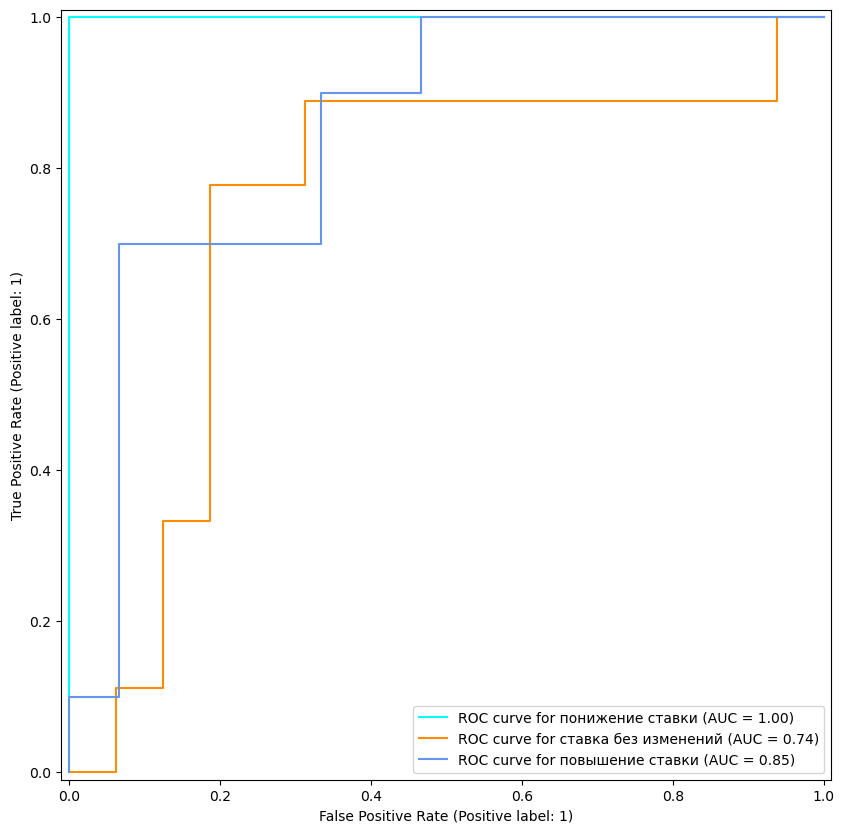

In [496]:
fig, ax = plt.subplots(figsize=(10, 10))
target_names = ['понижение ставки', 'ставка без изменений', 'повышение ставки']
colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for class_id, color in zip(range(n_classes), colors):
    RocCurveDisplay.from_predictions(
        y_test_new[:, class_id],
        prob_test_vec[:, class_id],
        name=f"ROC curve for {target_names[class_id]}",
        color=color,
        ax=ax,
    )

## Сравнение нелинейных моделей с лучшей линейной

In [507]:
index = ['DecicionTreeClassifier N-GRAM (1, 3) TF-IDF', 'RandomForestClassifier N-GRAM (1, 3) TF-IDF', 'CatBoostClassifier N-GRAM (1, 3) TF-IDF', 'LogReg на TF-IDF N-GRAM (1, 2, 3)']
columns = ['f1-score «-1»', 'f1-score «0»', 'f1-score «1»', 'accuracy', 'auc-score']

answer = pd.DataFrame(index=index, columns=columns)

In [509]:
answer.iloc[0] = [0.80, 0.35, 0.00,  0.40, '-']
answer.iloc[1] = [0.71, 0.48, 0.53,  0.56, '-']
answer.iloc[2] = [0.67, 0.62, 0.5,  0.6, 0.86]
answer.iloc[3] = [0.36, 0.67, 0.67,  0.6, 0.86]

In [511]:
answer

,f1-score «-1»,f1-score «0»,f1-score «1»,accuracy,auc-score
"DecicionTreeClassifier N-GRAM (1, 3) TF-IDF",0.8,0.35,0.0,0.4,-
"RandomForestClassifier N-GRAM (1, 3) TF-IDF",0.71,0.48,0.53,0.56,-
"CatBoostClassifier N-GRAM (1, 3) TF-IDF",0.67,0.62,0.5,0.6,0.86
"LogReg на TF-IDF N-GRAM (1, 2, 3)",0.36,0.67,0.67,0.6,0.86


## Pipeline лучшей нелинейной модели для check-point-5

In [517]:
X = df['text']
y = df['target']

In [519]:
from sklearn.base import BaseEstimator
import nltk
from nltk.tokenize import word_tokenize
from sklearn.linear_model import LogisticRegression
from pymystem3 import Mystem
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
from sklearn.preprocessing import MaxAbsScaler


class PrepareData(BaseEstimator):
    def __init__(self):
        pass

    def fit(self, x, y):
        # токенизируем тексты (оставим только слова без пунктуации) и склеим списки обратно для лемматизации
        #import nltk
        #from nltk.tokenize import word_tokenize
        #from sklearn.linear_model import LogisticRegression
        texts = x
        texts_tokenized = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in texts]
        
        # лемматизируем тексты
        #from pymystem3 import Mystem
        
        mystem_analyzer = Mystem()
        texts_lemmatized = [mystem_analyzer.lemmatize(text) for text in texts_tokenized]
        texts_lemmatized = [[j for j in i if j != ' ' and j != '\n'] for i in texts_lemmatized]
        
        
        texts_lemmatized = [" ".join([w for w in t]) for t in texts_lemmatized]
        x_train =  texts_lemmatized

        #обучаем трансформер N-GRAM (1-3) TF-IDF
        #from sklearn.feature_extraction.text import TfidfVectorizer
        #from nltk.corpus import stopwords
        russian_stopwords = stopwords.words("russian")
        russian_stopwords.extend(['это', 'совет', 'директор', 'банк', 'россия', 'годовой', 'год'])
        vec = TfidfVectorizer(stop_words=russian_stopwords, min_df=5, max_df=1.0, ngram_range=(1, 3))
        vec_train = vec.fit_transform(x_train)
        self.vec = vec
        
        #масштабируем векторы
        #from sklearn.preprocessing import MaxAbsScaler
        self.scaler = MaxAbsScaler()
        vec_train = self.scaler.fit_transform(vec_train)
        
        return self
         

    def transform(self, x):

        # токенизируем тексты (оставим только слова без пунктуации) и склеим списки обратно для лемматизации
        #import nltk
        #from nltk.tokenize import word_tokenize
        texts = x
        texts_tokenized = [" ".join([w for w in word_tokenize(t) if w.isalpha()]) for t in texts]
        
        # лемматизируем тексты
        #from pymystem3 import Mystem
        
        mystem_analyzer = Mystem()
        texts_lemmatized = [mystem_analyzer.lemmatize(text) for text in texts_tokenized]
        texts_lemmatized = [[j for j in i if j != ' ' and j != '\n'] for i in texts_lemmatized]
        
        
        texts_lemmatized = [" ".join([w for w in t]) for t in texts_lemmatized]
        x_train =  texts_lemmatized

        #трансформируем тексты в векторы N-GRAM (1-3) TF-IDF
        vec_train = self.vec.transform(x_train)
        vec_train = self.scaler.transform(vec_train)
 
        return vec_train

In [529]:
import pandas as pd
from sklearn.base import BaseEstimator
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, root_mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import TargetEncoder
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import TfidfVectorizer
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report


pipeline_final = Pipeline(steps=[
    ('PrepareData',  PrepareData()),
    ('CatBoost',CatBoostClassifier(border_count=20, depth=4, iterations=50, l2_leaf_reg=1, learning_rate=0.01))
])

In [531]:
pipeline_final

Pipeline(steps=[('PrepareData', PrepareData()),
                ('CatBoost',
                 <catboost.core.CatBoostClassifier object at 0x7f0d3db191c0>)])

In [533]:
pipeline_final.fit(X, y.astype(int))
pipeline_final

0:	learn: 1.0947556	total: 36.5ms	remaining: 1.79s
1:	learn: 1.0927015	total: 58.7ms	remaining: 1.41s
2:	learn: 1.0909302	total: 81.1ms	remaining: 1.27s
3:	learn: 1.0855746	total: 103ms	remaining: 1.18s
4:	learn: 1.0819160	total: 125ms	remaining: 1.13s
5:	learn: 1.0764144	total: 147ms	remaining: 1.07s
6:	learn: 1.0733048	total: 168ms	remaining: 1.03s
7:	learn: 1.0698810	total: 190ms	remaining: 997ms
8:	learn: 1.0650939	total: 212ms	remaining: 965ms
9:	learn: 1.0627495	total: 234ms	remaining: 935ms
10:	learn: 1.0598964	total: 271ms	remaining: 962ms
11:	learn: 1.0558940	total: 303ms	remaining: 961ms
12:	learn: 1.0533753	total: 343ms	remaining: 975ms
13:	learn: 1.0503519	total: 375ms	remaining: 963ms
14:	learn: 1.0476808	total: 408ms	remaining: 952ms
15:	learn: 1.0418654	total: 438ms	remaining: 930ms
16:	learn: 1.0378944	total: 466ms	remaining: 905ms
17:	learn: 1.0332403	total: 495ms	remaining: 880ms
18:	learn: 1.0300622	total: 527ms	remaining: 860ms
19:	learn: 1.0272120	total: 555ms	rema

Pipeline(steps=[('PrepareData', PrepareData()),
                ('CatBoost',
                 <catboost.core.CatBoostClassifier object at 0x7f0d3db191c0>)])

In [535]:
from sklearn.metrics import classification_report, roc_auc_score
pred = pipeline_final.predict(X)


print("LogisticRegression() на N-GRAM BAG OF WORDS")
print(classification_report(y.astype(int), pred))

LogisticRegression() на N-GRAM BAG OF WORDS
              precision    recall  f1-score   support

          -1       0.96      0.83      0.89        30
           0       0.69      0.98      0.81        43
           1       1.00      0.44      0.61        25

    accuracy                           0.80        98
   macro avg       0.88      0.75      0.77        98
weighted avg       0.85      0.80      0.78        98



In [543]:
pipeline_final.predict([wonder['text']])[0][0]

0

In [545]:
pipeline_final.predict_proba([wonder['text']])

array([[0.29226008, 0.39266765, 0.31507227]])

In [547]:
# сохраним лучшую модель
from joblib import dump


dump(pipeline_final, 'non_linear_best_model_17_03_2025.pkl')

['non_linear_best_model_17_03_2025.pkl']

In [549]:
from joblib import load

best_model = load('non_linear_best_model_17_03_2025.pkl')


In [551]:
best_model.predict([wonder['text']])[0][0]

0

In [553]:
wonder

text      Совет директоров Банка России 14 февраля 2025 ...
year                                                   2025
month                                                     2
day                                                      14
target                                                  NaN
Name: 0, dtype: object